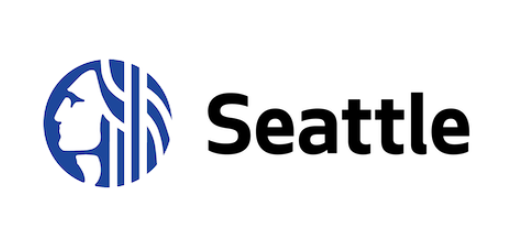

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
from shapely.geometry import Point
from datetime import datetime, date
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_column', 46)

# Contexte
Vous travaillez pour la ville de Seattle. Pour atteindre son objectif de ville neutre en émissions de carbone en 2050, votre équipe s’intéresse de près à la consommation et aux émissions des bâtiments non destinés à l’habitation.
Des relevés minutieux ont été effectués par les agents de la ville en 2016. Voici les données et leur source. Cependant, ces relevés sont coûteux à obtenir, et à partir de ceux déjà réalisés, vous voulez tenter de prédire les émissions de CO2 et la consommation totale d’énergie de bâtiments non destinés à l’habitation pour lesquels elles n’ont pas encore été mesurées.



# Objectifs
Vous cherchez également à évaluer l’intérêt de l’**ENERGY STAR Score** pour la prédiction d’émissions, qui est fastidieux à calculer avec l’approche utilisée actuellement par votre équipe. Vous l'intégrerez dans la modélisation et jugerez de son intérêt.

Chargez le fichier `2016_Building_Energy_Benchmarking.csv` à l'aide de Pandas. Stockez le résultat du chargement dans la variable `df`.

In [2]:
df_2016 = pd.read_csv('2016_Building_Energy_Benchmarking.csv') 
df_2015 = pd.read_csv('2015_Building_Energy_Benchmarking.csv') 

Head() pour afficher les 5 premières lignes du dataframe `df`.

In [3]:
df_2016.head()

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,7,DOWNTOWN,47.61220,-122.33799,1927,1.0,12,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,60.0,81.699997,84.300003,182.500000,189.000000,7226362.5,7456910.0,2003882.00,1.156514e+06,3946027.0,12764.52930,1276453.0,False,NaN,Compliant,NaN,249.98,2.83
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,7,DOWNTOWN,47.61317,-122.33393,1996,1.0,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,61.0,94.800003,97.900002,176.100006,179.399994,8387933.0,8664479.0,0.00,9.504252e+05,3242851.0,51450.81641,5145082.0,False,NaN,Compliant,NaN,295.86,2.86
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,7,DOWNTOWN,47.61393,-122.33810,1969,1.0,41,956110,196718,759392,Hotel,Hotel,756493.0,NaN,NaN,NaN,NaN,NaN,43.0,96.000000,97.699997,241.899994,244.100006,72587024.0,73937112.0,21566554.00,1.451544e+07,49526664.0,14938.00000,1493800.0,False,NaN,Compliant,NaN,2089.28,2.19
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,7,DOWNTOWN,47.61412,-122.33664,1926,1.0,10,61320,0,61320,Hotel,Hotel,61320.0,NaN,NaN,NaN,NaN,NaN,56.0,110.800003,113.300003,216.199997,224.000000,6794584.0,6946800.5,2214446.25,8.115253e+05,2768924.0,18112.13086,1811213.0,False,NaN,Compliant,NaN,286.43,4.67
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,7,DOWNTOWN,47.61375,-122.34047,1980,1.0,18,175580,62000,113580,"Hotel, Parking, Swimming Pool",Hotel,123445.0,Parking,68009.0,Swimming Pool,0.0,NaN,75.0,114.800003,118.699997,211.399994,215.600006,14172606.0,14656503.0,0.00,1.573449e+06,5368607.0,88039.98438,8803998.0,False,NaN,Compliant,NaN,505.01,2.88


In [4]:
df_2015.head()

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,TaxParcelIdentificationNumber,Location,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),OtherFuelUse(kBtu),GHGEmissions(MetricTonsCO2e),GHGEmissionsIntensity(kgCO2e/ft2),DefaultData,Comment,ComplianceStatus,Outlier
0,21548,2015,Multifamily LR (1-4),Low-Rise Multifamily,PUGET VISTA APTS,1992200030,"411 W REPUBLICAN ST\nSEATTLE, WA 98119\n(47.62...",7,MAGNOLIA / QUEEN ANNE,1967,1,4.0,40086,6133,33953,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,NaN,Not Compliant,NaN
1,26379,2015,NonResidential,Hotel,GEORGETOWN INN,6920700025,"6100 CORSON AVE S\nSEATTLE, WA 98108\n(47.5477...",2,GREATER DUWAMISH,1992,1,3.0,22452,0,22452,Hotel,Hotel,22452.0,NaN,NaN,NaN,NaN,NaN,78.0,60.3,61.5,118.2,122.0,1354219.0,1381137.0,0.0,172881.0,589893.0,7644.0,764350.0,0.0,44.71,1.88,No,NaN,Compliant,NaN
2,26713,2015,Multifamily HR (10+),High-Rise Multifamily,QUINTESSA APTS,5247800955,"201 YESLER WAY\nSEATTLE, WA 98104\n(47.6015502...",7,DOWNTOWN,2007,1,13.0,90959,0,90959,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,60.0,48.0,52.2,115.4,126.2,4361755.0,4748161.0,0.0,829363.0,2829904.0,15320.0,1531968.0,0.0,101.09,0.98,No,NaN,Compliant,NaN
3,102,2015,NonResidential,Hotel,MARRIOTT RESIDENCE INN,1984200065,"800 FAIRVIEW AVE N\nSEATTLE, WA 98109\n(47.626...",3,LAKE UNION,1990,1,7.0,282863,44766,238097,"Hotel, Parking",Hotel,235788.0,Parking,51537.0,NaN,NaN,NaN,40.0,79.9,85.3,178.1,186.6,18829136.0,20123722.0,0.0,3117920.0,10638785.0,81908.0,8190794.0,0.0,509.18,1.64,No,NaN,Compliant,NaN
4,503,2015,NonResidential,Supermarket/Grocery Store,RESTAURANT DEPOT,1824049003,"3670 E MARGINAL WAY S\nSEATTLE, WA 98134\n(47....",2,GREATER DUWAMISH,2008,1,1.0,63225,0,63225,Supermarket/Grocery Store,Supermarket/Grocery Store,63225.0,NaN,NaN,NaN,NaN,NaN,100.0,104.7,104.7,328.8,328.8,6619941.0,6619941.0,0.0,1940194.0,6620217.0,0.0,0.0,0.0,46.15,0.28,No,NaN,Compliant,NaN


la taille du dataframe avec shape

In [5]:
df_2016.shape

(3376, 46)

In [6]:
df_2015.shape

(3340, 42)

min, max, moyenne, écart type, etc) pour toutes les variables quantitatives avec describes

In [7]:
df_2016.describe()

,OSEBuildingID,DataYear,ZipCode,CouncilDistrictCode,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),Comments,TotalGHGEmissions,GHGEmissionsIntensity
count,3376.000000,3376.0,3360.000000,3376.000000,3376.000000,3376.000000,3376.000000,3368.000000,3376.000000,3.376000e+03,3376.000000,3.376000e+03,3.356000e+03,1679.000000,596.000000,2533.000000,3369.000000,3370.000000,3367.000000,3367.000000,3.371000e+03,3.370000e+03,3.367000e+03,3.367000e+03,3.367000e+03,3.367000e+03,3.367000e+03,0.0,3367.000000,3367.000000
mean,21208.991114,2016.0,98116.949107,4.439277,47.624033,-122.334795,1968.573164,1.106888,4.709123,9.483354e+04,8001.526066,8.683201e+04,7.917764e+04,28444.075817,11738.675166,67.918674,54.732116,57.033798,134.232848,137.783932,5.403667e+06,5.276726e+06,2.745959e+05,1.086639e+06,3.707612e+06,1.368505e+04,1.368505e+06,NaN,119.723971,1.175916
std,12223.757015,0.0,18.615205,2.120625,0.047758,0.027203,33.088156,2.108402,5.494465,2.188376e+05,32326.723928,2.079398e+05,2.017034e+05,54392.917928,29331.199286,26.873271,56.273124,57.163330,139.287554,139.109807,2.161063e+07,1.593879e+07,3.912173e+06,4.352478e+06,1.485066e+07,6.709781e+04,6.709781e+06,NaN,538.832227,1.821452
min,1.000000,2016.0,98006.000000,1.000000,47.499170,-122.414250,1900.000000,0.000000,0.000000,1.128500e+04,0.000000,3.636000e+03,5.656000e+03,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,-2.100000,0.000000e+00,0.000000e+00,0.000000e+00,-3.382680e+04,-1.154170e+05,0.000000e+00,0.000000e+00,NaN,-0.800000,-0.020000
25%,19990.750000,2016.0,98105.000000,3.000000,47.599860,-122.350662,1948.000000,1.000000,2.000000,2.848700e+04,0.000000,2.775600e+04,2.509475e+04,5000.000000,2239.000000,53.000000,27.900000,29.400000,74.699997,78.400002,9.251286e+05,9.701822e+05,0.000000e+00,1.874229e+05,6.394870e+05,0.000000e+00,0.000000e+00,NaN,9.495000,0.210000
50%,23112.000000,2016.0,98115.000000,4.000000,47.618675,-122.332495,1975.000000,1.000000,4.000000,4.417500e+04,0.000000,4.321600e+04,3.989400e+04,10664.000000,5043.000000,75.000000,38.599998,40.900002,96.199997,101.099998,1.803753e+06,1.904452e+06,0.000000e+00,3.451299e+05,1.177583e+06,3.237538e+03,3.237540e+05,NaN,33.920000,0.610000
75%,25994.250000,2016.0,98122.000000,7.000000,47.657115,-122.319407,1997.000000,1.000000,5.000000,9.099200e+04,0.000000,8.427625e+04,7.620025e+04,26640.000000,10138.750000,90.000000,60.400002,64.275002,143.899994,148.349998,4.222455e+06,4.381429e+06,0.000000e+00,8.293178e+05,2.829632e+06,1.189033e+04,1.189034e+06,NaN,93.940000,1.370000
max,50226.000000,2016.0,98272.000000,7.000000,47.733870,-122.220966,2015.000000,111.000000,99.000000,9.320156e+06,512608.000000,9.320156e+06,9.320156e+06,686750.000000,459748.000000,100.000000,834.400024,834.400024,2620.000000,2620.000000,8.739237e+08,4.716139e+08,1.349435e+08,1.925775e+08,6.570744e+08,2.979090e+06,2.979090e+08,NaN,16870.980000,34.090000


In [8]:
df_2015.describe()

,OSEBuildingID,DataYear,CouncilDistrictCode,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),OtherFuelUse(kBtu),GHGEmissions(MetricTonsCO2e),GHGEmissionsIntensity(kgCO2e/ft2)
count,3340.000000,3340.0,3340.000000,3340.000000,3340.000000,3332.000000,3.340000e+03,3340.000000,3.340000e+03,3.204000e+03,1559.000000,560.000000,2560.000000,3330.000000,3330.000000,3330.000000,3330.000000,3.330000e+03,3.330000e+03,3.330000e+03,3.330000e+03,3.330000e+03,3.330000e+03,3.330000e+03,3.330000e+03,3330.000000,3330.000000
mean,20522.168263,2015.0,4.450898,1967.624850,1.035629,4.682173,9.077289e+04,11054.032335,7.971886e+04,7.488154e+04,27675.646568,10755.708929,67.894141,53.626126,57.586547,132.779730,138.936036,4.983106e+06,5.203055e+06,2.502851e+05,1.017897e+06,3.473209e+06,1.253304e+04,1.253304e+06,7.142301e+03,110.094102,0.985339
std,11511.515874,0.0,2.127203,32.949847,0.784463,5.458460,1.493058e+05,35296.330507,1.292314e+05,1.236249e+05,52480.843425,22618.529737,27.154057,53.893311,55.604963,131.943223,131.359121,1.375330e+07,1.400757e+07,3.481900e+06,2.789931e+06,9.519639e+06,4.415142e+04,4.415142e+06,1.962790e+05,409.450179,1.637172
min,1.000000,2015.0,1.000000,1900.000000,1.000000,0.000000,2.000000e+04,-3.000000,-5.055000e+04,5.872000e+03,0.000000,0.000000,1.000000,0.000000,0.000000,-2.000000,-2.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,0.000000
25%,19921.750000,2015.0,3.000000,1947.000000,1.000000,2.000000,2.848700e+04,0.000000,2.668300e+04,2.500000e+04,4959.000000,2385.250000,51.750000,27.300000,29.700000,73.500000,80.300000,9.139300e+05,9.883248e+05,0.000000e+00,1.864908e+05,6.363322e+05,0.000000e+00,0.000000e+00,0.000000e+00,9.265000,0.080000
50%,22977.000000,2015.0,4.000000,1973.000000,1.000000,4.000000,4.385500e+04,0.000000,4.132600e+04,3.900000e+04,10600.000000,5019.500000,76.000000,37.400000,40.900000,95.000000,102.800000,1.776219e+06,1.953996e+06,0.000000e+00,3.400320e+05,1.160236e+06,2.945500e+03,2.945770e+05,0.000000e+00,32.740000,0.460000
75%,25748.000000,2015.0,7.000000,1996.000000,1.000000,5.000000,8.842800e+04,4304.250000,7.872600e+04,7.206750e+04,26224.500000,10275.000000,90.000000,59.875000,65.575000,143.900000,151.275000,4.044277e+06,4.368462e+06,0.000000e+00,8.061935e+05,2.750847e+06,1.115325e+04,1.115366e+06,0.000000e+00,88.642500,1.180000
max,50059.000000,2015.0,7.000000,2015.000000,39.000000,99.000000,2.200000e+06,512608.000000,2.200000e+06,1.719643e+06,686750.000000,303910.000000,100.000000,800.600000,800.600000,2511.100000,2511.000000,2.958126e+08,2.977410e+08,1.278697e+08,8.344505e+07,2.847263e+08,1.364484e+06,1.364484e+08,8.269669e+06,11824.890000,31.380000


# Preparation regroupement

In [9]:
cols_2015 = set(df_2015.columns)
cols_2016 = set(df_2016.columns)
cols_difs_2015 = cols_2015.difference(cols_2016)
cols_difs_2016 = cols_2016.difference(cols_2015)
cols_inter = cols_2015.intersection(cols_2016)
print(f"Différentiel du nombre d'obsrevation 2016 vs 2015: {df_2016.shape[0] - df_2015.shape[0]}\n")
print(f"Nombre de variables présentes dans les deux relevés de 2015 et 2016: {len(cols_inter)}\n")
print("Variables partagées par les deux relevés de 2015 et 2016:")
display(cols_inter)
print("\n")
print("-"*50)
print("\n")
print(f"Nombre de variables présentes en 2015 mais absentes en 2016: {len(cols_difs_2015)}\n")
print("Variables présentes en 2015 et absente en 2016")
display(cols_difs_2015)
print("\n")
print("-"*50)
print("\n")
print(f"Nombre de variables présentes en 2016 mais absentes en 2015: {len(cols_difs_2016)}\n")
print("Variables présentes en 2016 mais absentes en 2015:")
display(cols_difs_2016)

Différentiel du nombre d'obsrevation 2016 vs 2015: 36

Nombre de variables présentes dans les deux relevés de 2015 et 2016: 37

Variables partagées par les deux relevés de 2015 et 2016:


{'BuildingType',
 'ComplianceStatus',
 'CouncilDistrictCode',
 'DataYear',
 'DefaultData',
 'ENERGYSTARScore',
 'Electricity(kBtu)',
 'Electricity(kWh)',
 'LargestPropertyUseType',
 'LargestPropertyUseTypeGFA',
 'ListOfAllPropertyUseTypes',
 'NaturalGas(kBtu)',
 'NaturalGas(therms)',
 'Neighborhood',
 'NumberofBuildings',
 'NumberofFloors',
 'OSEBuildingID',
 'Outlier',
 'PrimaryPropertyType',
 'PropertyGFABuilding(s)',
 'PropertyGFAParking',
 'PropertyGFATotal',
 'PropertyName',
 'SecondLargestPropertyUseType',
 'SecondLargestPropertyUseTypeGFA',
 'SiteEUI(kBtu/sf)',
 'SiteEUIWN(kBtu/sf)',
 'SiteEnergyUse(kBtu)',
 'SiteEnergyUseWN(kBtu)',
 'SourceEUI(kBtu/sf)',
 'SourceEUIWN(kBtu/sf)',
 'SteamUse(kBtu)',
 'TaxParcelIdentificationNumber',
 'ThirdLargestPropertyUseType',
 'ThirdLargestPropertyUseTypeGFA',
 'YearBuilt',
 'YearsENERGYSTARCertified'}



--------------------------------------------------


Nombre de variables présentes en 2015 mais absentes en 2016: 5

Variables présentes en 2015 et absente en 2016


{'Comment',
 'GHGEmissions(MetricTonsCO2e)',
 'GHGEmissionsIntensity(kgCO2e/ft2)',
 'Location',
 'OtherFuelUse(kBtu)'}



--------------------------------------------------


Nombre de variables présentes en 2016 mais absentes en 2015: 9

Variables présentes en 2016 mais absentes en 2015:


{'Address',
 'City',
 'Comments',
 'GHGEmissionsIntensity',
 'Latitude',
 'Longitude',
 'State',
 'TotalGHGEmissions',
 'ZipCode'}

In [10]:
print(f"Description de la variable GHGEmissions(MetricTonsCO2e) 2015 : \n\n",
      df_2015['GHGEmissions(MetricTonsCO2e)'].describe(),'\n \n','--'*30,
      f"\n\nDescription de la variable TotalGHGEmissions 2016 : \n\n", 
      df_2016['TotalGHGEmissions'].describe(),'\n \n','--'*30,
      f"\n\nDescription de la variable GHGEmissionsIntensity(kgCO2e/ft2) 2015 : \n\n", 
      df_2015['GHGEmissionsIntensity(kgCO2e/ft2)'].describe(),'\n \n','--'*30,
      f"\n\nDescription de la variable GHGEmissionsIntensity 2016 : \n\n", 
      df_2016['GHGEmissionsIntensity'].describe(),'\n \n','--'*30,
      f"\n\nNombres des commentaires pour l'année 2015 : \n\n",
      df_2015['Comment'].notna().sum(),'\n \n','--'*30,
       f"\n\nNombres des commentaires pour l'année 2016 : \n\n",
      df_2016['Comments'].notna().sum())

Description de la variable GHGEmissions(MetricTonsCO2e) 2015 : 

 count     3330.000000
mean       110.094102
std        409.450179
min          0.000000
25%          9.265000
50%         32.740000
75%         88.642500
max      11824.890000
Name: GHGEmissions(MetricTonsCO2e), dtype: float64 
 
 ------------------------------------------------------------ 

Description de la variable TotalGHGEmissions 2016 : 

 count     3367.000000
mean       119.723971
std        538.832227
min         -0.800000
25%          9.495000
50%         33.920000
75%         93.940000
max      16870.980000
Name: TotalGHGEmissions, dtype: float64 
 
 ------------------------------------------------------------ 

Description de la variable GHGEmissionsIntensity(kgCO2e/ft2) 2015 : 

 count    3330.000000
mean        0.985339
std         1.637172
min         0.000000
25%         0.080000
50%         0.460000
75%         1.180000
max        31.380000
Name: GHGEmissionsIntensity(kgCO2e/ft2), dtype: float64 
 
 ---

## Rename

2015:

* GHGEmissions(MetricTonsCO2e): correspond à la colonne TotalGHGEmissions du fichier 2016 => on renomme 
* GHGEmissionsIntensity(kgCO2e/ft2): correspond à la colonne GHGEmissionsIntensity du fichier 2016 => on renomme 
* Comments: colonne vide, correspond à la colonne Comment du fichier 2015 inutile pour l'analyse => on renomme 

In [11]:
df_2015 = df_2015.rename(columns={'GHGEmissions(MetricTonsCO2e)':'TotalGHGEmissions',
                                  'GHGEmissionsIntensity(kgCO2e/ft2)':'GHGEmissionsIntensity',
                                  'Comment':'Comments'})

Les différentes d'observations peuvent potentiellement s'expliquer par la mise en service de nouveaux bâtiments ou leur démolition entre les deux relevés.

En ce qui concernerne les différence de varibale nous pouvons constater deux cas:

Deux variables au noms différents aux valeurs simmilaires:

"Comments" en 2015 et "Comment" en 2016
Deux différents encodages de la même information. Dans cette catégorie figurent:

la varibale "Location" en 2015 décomposée en "Latitude" et "Longitude" en 2016
Variales au noms proches mais avec des valeurs différentes sur les mêmes observations

la variable "Zip Codes" en 2015 et "ZipCode" en 2016
la variable "GHGEmissionsIntensity(kgCO2e/ft2)" en 2015 et "'GHGEmissionsIntensity" en 2016
Variables présentes que dans un des deux relevés:

"2010 Census Tracts" (2015)
"City Council DIstricts" (2015)
"GHGEmissions(MetricTonsCO2e)" (2015)
"SPD Beats"
"Seattle Police Department Micro Community Policing Plan Areas"
"Address" (2016)
"City" (2016)
"State" (2016)
"TotalGHEmissions" (2016)
Observons maintenant les différences d'indexes des observations de chaque anné

In [12]:
idx_2015 = set(df_2015.index)
idx_2016 = set(df_2016.index)
print(f"Nombre d'observations du relevé de 2015 {len(idx_2015)}")
print(f"Nombre d'observations du relevé de 2016 {len(idx_2016)}")
print(f"Nombre d'observartion total des deux relevés {len(idx_2015 | idx_2016)}")
print(f"Nombre d'observations présentes dans les deux relevés {len(idx_2015 & idx_2016)}")
print(f"Nombre d'observations présentes dans le relevé de 2015 mais pas dans le relevé de 2016 {len(idx_2015 - idx_2016)}")
print(f"Nombre d'observation présentes dans le relevé de 2016 mais pas dans le relevé de 2015 {len(idx_2016 - idx_2015)}")

Nombre d'observations du relevé de 2015 3340
Nombre d'observations du relevé de 2016 3376
Nombre d'observartion total des deux relevés 3376
Nombre d'observations présentes dans les deux relevés 3340
Nombre d'observations présentes dans le relevé de 2015 mais pas dans le relevé de 2016 0
Nombre d'observation présentes dans le relevé de 2016 mais pas dans le relevé de 2015 36


## Location
la variable "Location" en 2015 composée avec l'équivalence de Adresse, city, state, zipcode, Latitude et Longitude en 2016

In [13]:
df_2015['Location'][1]

'6100 CORSON AVE S\nSEATTLE, WA 98108\n(47.5477336, -122.3207866)'

Utilisation de la fonction Split

In [14]:
# Address
df_2015["Address"] = df_2015['Location'].apply(
    lambda x: x.split('\n')[0])

In [15]:
df_2015["City,State Zip"] = df_2015['Location'].apply(
    lambda x: x.split('\n')[1])

In [16]:
# City
df_2015["City"] = df_2015['City,State Zip'].apply(
    lambda x: x.split(',')[0])

In [17]:
df_2015["State Zip"] = df_2015['City,State Zip'].apply(
    lambda x: x.split(',')[1])

In [18]:
# State
df_2015["State"] = df_2015['State Zip'].apply(
    lambda x: x.split(' ')[1])

In [19]:
# ZipCode
df_2015["ZipCode"] = df_2015['State Zip'].apply(
    lambda x: x.split(' ')[2])

In [20]:

df_2015["Lat-Long"] = df_2015['Location'].apply(
    lambda x: x.split('\n')[2])

In [21]:

df_2015["Latitude"] = df_2015['Lat-Long'].apply(
    lambda x: x.split(',')[0])

In [22]:
# Latitude
df_2015["Latitude"] = df_2015['Latitude'].apply(
    lambda x: x.split('(')[1])

In [23]:

df_2015["Longitude"] = df_2015['Lat-Long'].apply(
    lambda x: x.split(',')[1])

In [24]:
# Longitude
df_2015["Longitude"] = df_2015['Longitude'].apply(
    lambda x: x.split(')')[0])

## OtherFuelUse(kBtu)
Beaucoup de valeurs manquantes pour cette feature du df2015, que nous ne retrouvons pas dans nos data de 2016

In [25]:
print('la colonne OtherFuelUse(kBtu) contient',df_2015[df_2015["OtherFuelUse(kBtu)"]>0].shape[0],'lignes au total')

la colonne OtherFuelUse(kBtu) contient 17 lignes au total


In [26]:
# Suppression variable 'location' et OtherFuelUse(kBtu)
df_2015.drop(['City,State Zip',
              'State Zip',
              'Lat-Long',
              'Location',
             'OtherFuelUse(kBtu)'], axis=1, inplace=True)
df_2015.shape

(3340, 46)

## Primary property type

In [27]:
df_2015['PrimaryPropertyType'].nunique()

27

In [28]:
df_2016['PrimaryPropertyType'].nunique()

24

In [29]:
df_2015['PrimaryPropertyType'].value_counts()

Low-Rise Multifamily           998
Mid-Rise Multifamily           539
Small- and Mid-Sized Office    297
Other                          258
Non-Refrigerated Warehouse     187
Large Office                   171
K-12 School                    136
Mixed Use Property             126
High-Rise Multifamily          103
Retail Store                   100
Hotel                           73
Worship Facility                72
Distribution Center\n           51
Medical Office                  43
Senior Care Community           43
Supermarket/Grocery Store       36
Self-Storage Facility\n         27
College/University              22
Residence Hall/Dormitory        15
Refrigerated Warehouse          13
Restaurant\n                    11
Hospital                        10
SPS-District K-12                4
Distribution Center              2
Restaurant                       1
Laboratory                       1
Self-Storage Facility            1
Name: PrimaryPropertyType, dtype: int64

In [30]:
pd.DataFrame([df_2015['PrimaryPropertyType'].value_counts(), df_2016['PrimaryPropertyType'].value_counts()])

,Low-Rise Multifamily,Mid-Rise Multifamily,Small- and Mid-Sized Office,Other,Non-Refrigerated Warehouse,Large Office,K-12 School,Mixed Use Property,High-Rise Multifamily,Retail Store,Hotel,Worship Facility,Distribution Center\n,Medical Office,Senior Care Community,Supermarket/Grocery Store,Self-Storage Facility\n,College/University,Residence Hall/Dormitory,Refrigerated Warehouse,Restaurant\n,Hospital,SPS-District K-12,Distribution Center,Restaurant,Laboratory,Self-Storage Facility,Warehouse,Supermarket / Grocery Store,University,Residence Hall,Office
PrimaryPropertyType,998.0,539.0,297.0,258.0,187.0,171.0,136.0,126.0,103.0,100.0,73.0,72.0,51.0,43.0,43.0,36.0,27.0,22.0,15.0,13.0,11.0,10.0,4.0,2.0,1.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN
PrimaryPropertyType,987.0,564.0,293.0,256.0,NaN,173.0,139.0,133.0,105.0,91.0,77.0,71.0,NaN,39.0,45.0,NaN,NaN,NaN,NaN,12.0,NaN,10.0,NaN,53.0,12.0,10.0,28.0,187.0,40.0,25.0,23.0,3.0


Modification sur df_2015
* Non-Refrigerated Warehouse == Warehouse
* Distribution Center\n ==  Distribution Center
* Supermarket/Grocery Store == Supermarket / Grocery Store
* Self-Storage Facility\n == Self-Storage Facility
* College/University == University
* Residence Hall/Dormitory == Residence Hall
* Restaurant\n == Restaurant
* SPS-District K-12 == K-12 School
* Office == Small- and Mid-Sized Office

In [31]:
unique_types_2015 = (((df_2015['PrimaryPropertyType'].append(df_2015['SecondLargestPropertyUseType'])).
               append(df_2015['ThirdLargestPropertyUseType'])).append(df_2015['LargestPropertyUseType'])).unique().tolist()

In [32]:
#dictionnaire 2015
dic_PrimaryPropertyType_2015 = {'Non-Refrigerated Warehouse': 'Warehouse',
                           'Distribution Center\n': 'Distribution Center',
                           'Supermarket/Grocery Store': 'Supermarket / Grocery Store',
                           'Self-Storage Facility\n': 'Self-Storage Facility',
                           'College/University': 'University',
                           'Residence Hall/Dormitory': 'Residence Hall',
                           'Restaurant\n': 'Restaurant',
                           'SPS-District K-12': 'K-12 School',
                           'Office': 'Small- and Mid-Sized Office'}

In [33]:
# Transformation des types de bâtiment
col_PrimaryPropertyType = ['PrimaryPropertyType', 'LargestPropertyUseType',
                       'SecondLargestPropertyUseType',
                       'ThirdLargestPropertyUseType']
for col in col_PrimaryPropertyType :
    df_2015[col] = df_2015[col].replace(dic_PrimaryPropertyType_2015)

Modification sur df_2016
* Office == Small- and Mid-Sized Office

In [34]:
#dictionnaire 2016
dic_PrimaryPropertyType_2016 = {'Office': 'Small- and Mid-Sized Office'}
dic_PrimaryPropertyType_2015 = {'Non-Refrigerated Warehouse': 'Warehouse',
                           'Distribution Center\n': 'Distribution Center',
                           'Supermarket/Grocery Store': 'Supermarket / Grocery Store',
                           'Self-Storage Facility\n': 'Self-Storage Facility',
                           'College/University': 'University',
                           'Residence Hall/Dormitory': 'Residence Hall',
                           'Restaurant\n': 'Restaurant',
                           'SPS-District K-12': 'K-12 School',
                           'Office': 'Small- and Mid-Sized Office'}

In [35]:
# Transformation des types de bâtiment
for col in col_PrimaryPropertyType :
    df_2016[col] = df_2016[col].replace(dic_PrimaryPropertyType_2016)

In [36]:
# Réutilisation du Dic 2015 pour modifier si besoin 2016
for col in col_PrimaryPropertyType :
    df_2016[col] = df_2016[col].replace(dic_PrimaryPropertyType_2015)

In [37]:
pd.DataFrame([df_2015['PrimaryPropertyType'].value_counts(), df_2016['PrimaryPropertyType'].value_counts()])

,Low-Rise Multifamily,Mid-Rise Multifamily,Small- and Mid-Sized Office,Other,Warehouse,Large Office,K-12 School,Mixed Use Property,High-Rise Multifamily,Retail Store,Hotel,Worship Facility,Distribution Center,Senior Care Community,Medical Office,Supermarket / Grocery Store,Self-Storage Facility,University,Residence Hall,Refrigerated Warehouse,Restaurant,Hospital,Laboratory
PrimaryPropertyType,998,539,297,258,187,171,140,126,103,100,73,72,53,43,43,36,28,22,15,13,12,10,1
PrimaryPropertyType,987,564,296,256,187,173,139,133,105,91,77,71,53,45,39,40,28,25,23,12,12,10,10


In [38]:
df_2015['PrimaryPropertyType'].nunique()

23

In [39]:
df_2016['PrimaryPropertyType'].nunique()

23

## Types

In [40]:
#info()
df_2015.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3340 entries, 0 to 3339
Data columns (total 46 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   OSEBuildingID                    3340 non-null   int64  
 1   DataYear                         3340 non-null   int64  
 2   BuildingType                     3340 non-null   object 
 3   PrimaryPropertyType              3340 non-null   object 
 4   PropertyName                     3340 non-null   object 
 5   TaxParcelIdentificationNumber    3338 non-null   object 
 6   CouncilDistrictCode              3340 non-null   int64  
 7   Neighborhood                     3340 non-null   object 
 8   YearBuilt                        3340 non-null   int64  
 9   NumberofBuildings                3340 non-null   int64  
 10  NumberofFloors                   3332 non-null   float64
 11  PropertyGFATotal                 3340 non-null   int64  
 12  PropertyGFAParking  

In [41]:
pd.DataFrame([df_2015.dtypes, df_2016.dtypes])

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity,DefaultData,Comments,ComplianceStatus,Outlier,Address,City,State,ZipCode,Latitude,Longitude
0,int64,int64,object,object,object,object,int64,object,int64,int64,float64,int64,int64,int64,object,object,float64,object,float64,object,float64,object,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,object,object,object,object,object,object,object,object,object,object
1,int64,int64,object,object,object,object,int64,object,int64,float64,int64,int64,int64,int64,object,object,float64,object,float64,object,float64,object,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,bool,float64,object,object,object,object,object,float64,float64,float64


Modification sur df_2015
* DefaultData == booléen.
* Comments ==  float64
* ZipCode == float64
* Latitude == float64.
* Longitude == float64.

In [42]:
# 'DefaultData'
df_2015['DefaultData'] = df_2015['DefaultData'].map(
    {'No': False, 'Yes': True}).astype('bool')
# 'Latitude'et'Longitude'et 'ZipCode' passer de object en float64
df_2015[['Latitude', 'Longitude', 'ZipCode']] = df_2015[['Latitude', 'Longitude', 'ZipCode']].astype('float64')

## Doublons

In [43]:
datas = { '2015': df_2015, '2016': df_2016 }
for year in datas.keys():
    data = datas[year]
    print(year, "- Nombre de doublons par OSEBuildingID :", len(data[data.duplicated(subset="OSEBuildingID")]))

2015 - Nombre de doublons par OSEBuildingID : 0
2016 - Nombre de doublons par OSEBuildingID : 0


In [44]:
df_2015.shape

(3340, 46)

In [45]:
df_2016.shape

(3376, 46)

# Fusion des fichiers

In [46]:
df = pd.concat([df_2015[df_2016.columns],df_2016], 
                 axis = 0, copy=False).sort_values(["DataYear", "OSEBuildingID"])
df.shape

(6716, 46)

In [47]:
for col in df.columns:
    print(f'{col :-<70} {df[col].nunique()}')

OSEBuildingID--------------------------------------------------------- 3432
DataYear-------------------------------------------------------------- 2
BuildingType---------------------------------------------------------- 8
PrimaryPropertyType--------------------------------------------------- 23
PropertyName---------------------------------------------------------- 6527
Address--------------------------------------------------------------- 6379
City------------------------------------------------------------------ 2
State----------------------------------------------------------------- 1
ZipCode--------------------------------------------------------------- 55
TaxParcelIdentificationNumber----------------------------------------- 3729
CouncilDistrictCode--------------------------------------------------- 7
Neighborhood---------------------------------------------------------- 19
Latitude-------------------------------------------------------------- 6111
Longitude------------------------

In [48]:
#info()
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6716 entries, 241 to 3375
Data columns (total 46 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   OSEBuildingID                    6716 non-null   int64  
 1   DataYear                         6716 non-null   int64  
 2   BuildingType                     6716 non-null   object 
 3   PrimaryPropertyType              6716 non-null   object 
 4   PropertyName                     6716 non-null   object 
 5   Address                          6716 non-null   object 
 6   City                             6716 non-null   object 
 7   State                            6716 non-null   object 
 8   ZipCode                          6700 non-null   float64
 9   TaxParcelIdentificationNumber    6714 non-null   object 
 10  CouncilDistrictCode              6716 non-null   int64  
 11  Neighborhood                     6716 non-null   object 
 12  Latitude          

# Data Cleaning

 ## Bâtiment résidentiel/ non résidentiel
 
 Un bâtiment doit être considéré comme un bâtiment résidentiel lorsque plus de la moitié de la surface de plancher est utilisée à des fins d'habitation. Les autres bâtiments doivent être considérés comme non résidentiels.

Deux types de bâtiments résidentiels peuvent être distingués :

- maisons (bâtiments d'habitation en plain-pied) : comprenant tous les types de maisons (maisons individuelles, mitoyennes, mitoyennes, maisons en enfilade, etc.) dont chaque logement a sa propre entrée directement depuis le sol ;

- autres immeubles d'habitation : comprenant tous les immeubles d'habitation autres que les immeubles d'habitation en plain-pied tels que définis ci-dessus.

Un bâtiment est considéré comme un bâtiment non résidentiel lorsque la partie mineure du bâtiment (c'est-à-dire moins de la moitié de sa surface de plancher brute) est utilisée à des fins d'habitation.

Les bâtiments non résidentiels comprennent :

- bâtiments industriels ;
- les bâtiments commerciaux ;
- les bâtiments scolaires ;
- les bâtiments de santé ;
- d'autres bâtiments.

### ListOfAllPropertyUseTypes

Nous allons faire un split sur ListOfAllPropertyUseTypes, avoir une démarche différente que simplement filtrer avec primary property

In [49]:
df['ListOfAllPropertyUseTypes'][:5]

241                            Hotel
361       Hotel, Parking, Restaurant
509    Hotel, Parking, Swimming Pool
26                             Hotel
138    Hotel, Parking, Swimming Pool
Name: ListOfAllPropertyUseTypes, dtype: object

In [50]:
df['ListOfAllPropertyUseTypes'] = df['ListOfAllPropertyUseTypes'].astype(str)

In [51]:
df["USE"] = df['ListOfAllPropertyUseTypes'].apply(
    lambda x: x.split(',')[0])

In [52]:
df["USE"].value_counts().index.tolist()

['Multifamily Housing',
 'Office',
 'Non-Refrigerated Warehouse',
 'K-12 School',
 'Other',
 'Hotel',
 'nan',
 'Medical Office',
 'Parking',
 'Distribution Center',
 'Retail Store',
 'Worship Facility',
 'Data Center',
 'College/University',
 'Fitness Center/Health Club/Gym',
 'Self-Storage Facility',
 'Supermarket/Grocery Store',
 'Bank Branch',
 'Senior Care Community',
 'Food Service',
 'Laboratory',
 'Financial Office',
 'Other - Entertainment/Public Assembly',
 'Residence Hall/Dormitory',
 'Other - Recreation',
 'Hospital (General Medical & Surgical)',
 'Food Sales',
 'Manufacturing/Industrial Plant',
 'Restaurant',
 'Automobile Dealership',
 'Fast Food Restaurant',
 'Refrigerated Warehouse',
 'Bar/Nightclub',
 'Lifestyle Center',
 'Social/Meeting Hall',
 'Other - Lodging/Residential',
 'Museum',
 'Other - Education',
 'Library',
 'Other/Specialty Hospital',
 'Urgent Care/Clinic/Other Outpatient',
 'Repair Services (Vehicle',
 'Adult Education',
 'Convenience Store without Gas Sta

On retire de la liste 
* Multifamily Housing
* Residence Hall/Dormitory
* Other - Lodging/Residential
* Residential Care Facility
* Senior Care Community
* Nan

In [53]:
non_residential_1 = [
 'Office',
 'Non-Refrigerated Warehouse',
 'K-12 School',
 'Other',
 'Hotel',
 'Medical Office',
 'Parking',
 'Distribution Center',
 'Retail Store',
 'Worship Facility',
 'Data Center',
 'College/University',
 'Fitness Center/Health Club/Gym',
 'Self-Storage Facility',
 'Supermarket/Grocery Store',
 'Bank Branch',
 'Senior Care Community',
 'Food Service',
 'Laboratory',
 'Financial Office',
 'Other - Entertainment/Public Assembly',
 'Other - Recreation',
 'Hospital (General Medical & Surgical)',
 'Food Sales',
 'Manufacturing/Industrial Plant',
 'Restaurant',
 'Automobile Dealership',
 'Refrigerated Warehouse',
 'Bar/Nightclub',
 'Fast Food Restaurant',
 'Lifestyle Center',
 'Social/Meeting Hall',
 'Other - Education',
 'Library',
 'Urgent Care/Clinic/Other Outpatient',
 'Other/Specialty Hospital',
 'Museum',
 'Adult Education',
 'Repair Services (Vehicle',
 'Convenience Store without Gas Station',
 'Movie Theater',
 'Other - Mall',
 'Performing Arts',
 'Other - Services',
 'Other - Public Services',
 'Strip Mall',
 'Courthouse',
 'Pre-school/Daycare',
 'Prison/Incarceration',
 'Personal Services (Health/Beauty',
 'Wholesale Club/Supercenter',
 'Fire Station',
 'Other - Utility',
 'Police Station',
 'Convention Center',
 'Enclosed Mall',
 'Energy/Power Station',
 'Outpatient Rehabilitation/Physical Therapy']

In [54]:
df = df[df["USE"].isin(non_residential_1)]

L'objectif ici est d'identifier les possibles erreurs d'étiquette pour le property type, nous croisons les données de building type et primary property type

In [55]:
df['BuildingType'].unique()

array(['NonResidential', 'Nonresidential COS', 'SPS-District K-12',
       'Campus', 'Multifamily LR (1-4)', 'Multifamily HR (10+)',
       'Multifamily MR (5-9)', 'Nonresidential WA'], dtype=object)

### LargestPropertyUseType
vérification que notre filtre sur listofallproperty correspond bien à l'utilisation principale du batiment

In [56]:
df['LargestPropertyUseType'] = df['LargestPropertyUseType'].astype(str)

In [57]:
df['LargestPropertyUseType'].value_counts().index.tolist()

['Small- and Mid-Sized Office',
 'Warehouse',
 'K-12 School',
 'Other',
 'Retail Store',
 'Hotel',
 'Worship Facility',
 'Distribution Center',
 'Multifamily Housing',
 'Senior Care Community',
 'Medical Office',
 'Supermarket / Grocery Store',
 'Parking',
 'Self-Storage Facility',
 'Other - Recreation',
 'University',
 'Other - Entertainment/Public Assembly',
 'Restaurant',
 'Refrigerated Warehouse',
 'Laboratory',
 'Social/Meeting Hall',
 'Hospital (General Medical & Surgical)',
 'Manufacturing/Industrial Plant',
 'Repair Services (Vehicle, Shoe, Locksmith, etc)',
 'Residence Hall',
 'Automobile Dealership',
 'Strip Mall',
 'Other - Services',
 'Museum',
 'Fitness Center/Health Club/Gym',
 'Other/Specialty Hospital',
 'Bank Branch',
 'nan',
 'Other - Education',
 'Urgent Care/Clinic/Other Outpatient',
 'Library',
 'Other - Mall',
 'Performing Arts',
 'Financial Office',
 'Data Center',
 'Adult Education',
 'Other - Restaurant/Bar',
 'Pre-school/Daycare',
 'Lifestyle Center',
 'Other 

On retrouve encore une utilisation principale pour de la résidence, nous élimons des champs
* Residence Hall/Dormitory
* Multifamily Housing
* Senior Care Community
* Residential Care Facility
* Other - Lodging/Residential

In [58]:
non_residential_2 = ['Small- and Mid-Sized Office',
 'Warehouse',
 'K-12 School',
 'Other',
 'Retail Store',
 'Hotel',
 'Worship Facility',
 'Distribution Center',
 'Medical Office',
 'Supermarket / Grocery Store',
 'Parking',
 'Self-Storage Facility',
 'Other - Recreation',
 'University',
 'Other - Entertainment/Public Assembly',
 'Restaurant',
 'Refrigerated Warehouse',
 'Laboratory',
 'Social/Meeting Hall',
 'Hospital (General Medical & Surgical)',
 'Manufacturing/Industrial Plant',
 'Repair Services (Vehicle, Shoe, Locksmith, etc)',
 'Automobile Dealership',
 'Museum',
 'Other - Services',
 'Strip Mall',
 'Fitness Center/Health Club/Gym',
 'Urgent Care/Clinic/Other Outpatient',
 'nan',
 'Library',
 'Other - Education',
 'Other/Specialty Hospital',
 'Bank Branch',
 'Other - Mall',
 'Performing Arts',
 'Financial Office',
 'Data Center',
 'Other - Public Services',
 'Other - Utility',
 'Pre-school/Daycare',
 'Lifestyle Center',
 'Adult Education',
 'Other - Restaurant/Bar',
 'Prison/Incarceration',
 'Food Service',
 'Fire Station',
 'Wholesale Club/Supercenter',
 'Movie Theater',
 'Convention Center',
 'Police Station',
 'Courthouse',
 'Personal Services (Health/Beauty, Dry Cleaning, etc)',
 'Outpatient Rehabilitation/Physical Therapy']

In [59]:
df = df[df['LargestPropertyUseType'].isin(non_residential_2)]

### SecondLargestPropertyUseType

Vérification que nos filtres éliminent bien toutes les résidences, il reste quelque usage résidentiel mais ici il s'agit d'un usage secondaire et non résidentiel, nous ne retirons donc pas ces batiments

In [60]:
df['SecondLargestPropertyUseType'] = df['SecondLargestPropertyUseType'].astype(str)

In [61]:
df['SecondLargestPropertyUseType'].value_counts().index.tolist()

['nan',
 'Parking',
 'Small- and Mid-Sized Office',
 'Retail Store',
 'Other',
 'Warehouse',
 'Restaurant',
 'Fitness Center/Health Club/Gym',
 'Data Center',
 'Other - Services',
 'Medical Office',
 'Distribution Center',
 'Laboratory',
 'Supermarket / Grocery Store',
 'Other - Entertainment/Public Assembly',
 'Bank Branch',
 'K-12 School',
 'Other - Recreation',
 'Repair Services (Vehicle, Shoe, Locksmith, etc)',
 'Multifamily Housing',
 'Swimming Pool',
 'Self-Storage Facility',
 'Worship Facility',
 'Movie Theater',
 'Food Sales',
 'Bar/Nightclub',
 'Performing Arts',
 'Other - Education',
 'Adult Education',
 'Other - Restaurant/Bar',
 'Manufacturing/Industrial Plant',
 'Hotel',
 'Refrigerated Warehouse',
 'Automobile Dealership',
 'Other - Public Services',
 'Hospital (General Medical & Surgical)',
 'Other - Lodging/Residential',
 'Residence Hall',
 'University',
 'Food Service',
 'Financial Office',
 'Courthouse',
 'Vocational School',
 'Social/Meeting Hall',
 'Convenience Store

In [62]:
df[df['SecondLargestPropertyUseType'] =='Multifamily Housing']

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,...,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity,USE
330,657,2015,NonResidential,Mixed Use Property,2200 WESTLAKE,2200 WESTLAKE AVE,SEATTLE,WA,98121.0,8729740000,7,DOWNTOWN,47.617939,-122.337387,2006,1.0,0.0,516407,0,516407,"Financial Office, Hotel, Multifamily Housing, ...",Parking,385196.0,...,340236.0,Hotel,67627.0,NaN,19.0,94.800000,99.400000,220.500000,225.300000,48981052.00,5.132484e+07,0.0,8757760.0,29882718.0,190996.000000,19099575.0,False,NaN,Compliant,NaN,1222.69,2.12,Financial Office
729,20212,2015,NonResidential,Mixed Use Property,MARKET STREET HOLDINGS,2401 NW MARKET ST,SEATTLE,WA,98107.0,1125039011,6,BALLARD,47.668404,-122.387998,1960,1.0,4.0,20539,0,20539,"Medical Office, Multifamily Housing, Office, R...",Retail Store,7387.0,...,5264.0,Restaurant,3700.0,NaN,NaN,78.300000,79.700000,189.400000,190.800000,1622008.00,1.651053e+06,0.0,311343.0,1062348.0,5597.000000,559704.0,False,NaN,Compliant,NaN,37.13,1.59,Medical Office
1807,23368,2015,NonResidential,Mixed Use Property,SEABOARD BUILDING CONDOMINIUM,1500 4TH AVE,SEATTLE,WA,98101.0,7628750000,7,DOWNTOWN,47.610681,-122.336573,1909,1.0,11.0,111137,0,111137,"Bank Branch, Multifamily Housing, Office, Othe...",Small- and Mid-Sized Office,42939.0,...,40878.0,Bank Branch,10887.0,NaN,NaN,92.800000,94.300000,203.300000,202.300000,9191826.00,9.337824e+06,0.0,1470280.0,5016804.0,41752.000000,4175230.0,False,NaN,Compliant,NaN,256.72,2.12,Bank Branch
488,657,2016,NonResidential,Mixed Use Property,2200 Westlake - SEDO,2200 Westlake Ave.,Seattle,WA,98121.0,8729740000,7,DOWNTOWN,47.617830,-122.337290,2006,0.0,0.0,516407,0,516407,"Financial Office, Hotel, Multifamily Housing, ...",Parking,385196.0,...,340236.0,Hotel,67627.0,NaN,31.0,76.300003,78.900002,199.199997,202.000000,39403320.00,4.075436e+07,0.0,8626261.0,29432803.0,99705.117190,9970512.0,False,NaN,Compliant,NaN,734.72,1.42,Financial Office
912,20212,2016,NonResidential,Mixed Use Property,Market Street Holdings,2401 NW Market St,Seattle,WA,98107.0,1125039011,6,BALLARD,47.668400,-122.387880,1960,1.0,4.0,20539,0,20539,"Medical Office, Multifamily Housing, Office, R...",Retail Store,7387.0,...,5264.0,Restaurant,3700.0,NaN,NaN,81.000000,81.800003,198.399994,199.300003,1678458.75,1.695248e+06,0.0,329257.5,1123427.0,5550.319824,555032.0,False,NaN,Compliant,NaN,37.31,1.82,Medical Office
1773,23368,2016,NonResidential,Mixed Use Property,Seaboard Building,1500-1506 4th Ave.,Seattle,WA,98011.0,7628750000,7,DOWNTOWN,47.610560,-122.336610,1909,1.0,11.0,111137,0,111137,"Bank Branch, Multifamily Housing, Office, Othe...",Small- and Mid-Sized Office,42939.0,...,40878.0,Bank Branch,10887.0,NaN,NaN,96.400002,100.400002,198.300003,201.199997,9546165.00,9.946297e+06,0.0,1348902.5,4602455.0,49437.093750,4943709.0,False,NaN,Compliant,NaN,294.65,2.65,Bank Branch
2823,27100,2016,Multifamily HR (10+),Hotel,Four Seasons Hotel,99 Union Street,Seattle,WA,98101.0,6094680000,7,DOWNTOWN,47.607420,-122.339190,2008,1.0,20.0,326516,0,326516,"Hotel, Multifamily Housing, Parking, Retail Store",Hotel,252462.0,...,145594.0,Parking,22801.0,NaN,3.0,142.600006,145.199997,279.600006,280.799988,59107620.00,6.020290e+07,19654762.0,7131492.5,24332652.0,151202.046900,15120205.0,False,NaN,Compliant,NaN,2489.78,7.63,Hotel


### ThirdLargestPropertyUseType
Comme précédemment, il reste quelque usage résidentiel mais ici il s'agit d'un usage 3eme activité et non résidentiel, nous ne retirons donc pas ces batiments

In [63]:
df['ThirdLargestPropertyUseType'] = df['ThirdLargestPropertyUseType'].astype(str)

In [64]:
df['ThirdLargestPropertyUseType'].value_counts().index.tolist()

['nan',
 'Small- and Mid-Sized Office',
 'Retail Store',
 'Other',
 'Parking',
 'Restaurant',
 'Warehouse',
 'Data Center',
 'Swimming Pool',
 'Medical Office',
 'Food Service',
 'Social/Meeting Hall',
 'Pre-school/Daycare',
 'Bank Branch',
 'Other - Restaurant/Bar',
 'Other - Entertainment/Public Assembly',
 'Fitness Center/Health Club/Gym',
 'Distribution Center',
 'Multifamily Housing',
 'Financial Office',
 'Other - Recreation',
 'Laboratory',
 'Refrigerated Warehouse',
 'Self-Storage Facility',
 'Other - Services',
 'Convenience Store without Gas Station',
 'Personal Services (Health/Beauty, Dry Cleaning, etc)',
 'Other - Education',
 'Other - Technology/Science',
 'Manufacturing/Industrial Plant',
 'Hotel',
 'K-12 School',
 'Supermarket / Grocery Store',
 'Other/Specialty Hospital',
 'Bar/Nightclub',
 'Fast Food Restaurant',
 'Vocational School',
 'Other - Utility',
 'Strip Mall',
 'Enclosed Mall']

In [65]:
df[df['ThirdLargestPropertyUseType'] =='Multifamily Housing']

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,...,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity,USE
510,419,2015,Campus,Mixed Use Property,MAIN MARKET,1501 PIKE PL,SEATTLE,WA,98101.0,1976200205,7,DOWNTOWN,47.608769,-122.341154,1908,1.0,4.0,137400,0,137400,"Food Sales, Multifamily Housing, Office, Other...",Retail Store,44078.0,...,19182.0,Multifamily Housing,14380.0,NaN,NaN,114.100000,114.100000,358.300000,358.300000,13883385.0,13883385.0,0.0,4068987.00,13883960.0,0.00000,0.0,False,NaN,Compliant,NaN,96.79,0.27,Food Sales
1648,21533,2015,NonResidential,Mixed Use Property,HYATT PLACE,110 6TH AVE N,SEATTLE,WA,98109.0,1991200695,7,LAKE UNION,47.618968,-122.344608,2008,1.0,4.0,274442,105499,168943,"Hotel, Multifamily Housing, Parking, Retail Store",Hotel,108763.0,...,105499.0,Multifamily Housing,58152.0,NaN,NaN,53.600000,56.500000,125.800000,131.800000,9049598.0,9544963.0,0.0,1648636.00,5625380.0,34245.00000,3424452.0,False,NaN,Compliant,NaN,221.09,0.72,Hotel
3205,49776,2015,NonResidential,Large Office,MARKET PLACE TOWER,2025 1ST AVE,SEATTLE,WA,98121.0,1977200471,7,DOWNTOWN,47.611311,-122.343977,1988,1.0,13.0,358259,149326,208933,"Data Center, Multifamily Housing, Office, Othe...",Small- and Mid-Sized Office,194687.0,...,149326.0,Multifamily Housing,38225.0,"2016, 2009, 2008",81.0,62.500000,66.700000,188.800000,199.600000,14935251.0,15934393.0,0.0,4129655.00,14090968.0,8449.00000,844867.0,False,NaN,Compliant,Low Outlier,143.10,0.23,Data Center
289,419,2016,Campus,Mixed Use Property,Main Market,1501 Pike Place,Seattle,WA,98101.0,1976200205,7,DOWNTOWN,47.608810,-122.341190,1908,1.0,4.0,137400,0,137400,"Food Sales, Multifamily Housing, Office, Other...",Retail Store,44078.0,...,19182.0,Multifamily Housing,14380.0,NaN,NaN,122.800003,122.300003,306.600006,305.000000,14940504.0,14879755.0,0.0,3031866.75,10344729.0,45957.73828,4595774.0,False,NaN,Compliant,NaN,316.20,2.30,Food Sales
1328,21533,2016,NonResidential,Mixed Use Property,Hyatt Place,110 6th Ave N,Seattle,WA,98109.0,1991200695,7,LAKE UNION,47.618930,-122.344730,2008,1.0,4.0,274442,0,274442,"Hotel, Multifamily Housing, Parking, Retail Store",Hotel,108763.0,...,105499.0,Multifamily Housing,58152.0,NaN,NaN,54.200001,56.299999,128.199997,132.600006,9155568.0,9512996.0,0.0,1689621.25,5764988.0,33905.78906,3390579.0,False,NaN,Compliant,NaN,220.26,0.80,Hotel
3199,49776,2016,NonResidential,Large Office,Market Place Tower,2025 1st Avenue,Seattle,WA,98121.0,1977200471,7,DOWNTOWN,47.611560,-122.344010,1988,1.0,13.0,354086,149326,204760,"Data Center, Multifamily Housing, Office, Othe...",Small- and Mid-Sized Office,193393.0,...,149326.0,Multifamily Housing,38225.0,201620092008,88.0,56.700001,59.299999,167.699997,174.399994,13458948.0,14070366.0,0.0,3601493.50,12288296.0,11706.50879,1170651.0,False,NaN,Compliant,NaN,147.84,0.42,Data Center


In [66]:
# pd.cross tab
pd.crosstab(df['PrimaryPropertyType'],
            df['BuildingType'])

BuildingType,Campus,Multifamily HR (10+),Multifamily LR (1-4),NonResidential,Nonresidential COS,Nonresidential WA,SPS-District K-12
PrimaryPropertyType,,,,,,,
Distribution Center,0,0,0,100,4,0,0
Hospital,0,0,0,19,0,0,0
Hotel,0,1,0,143,0,0,0
K-12 School,8,0,0,78,0,0,189
Laboratory,0,0,0,10,0,0,0
Large Office,2,0,0,325,7,0,0
Medical Office,0,0,0,79,2,0,0
Mixed Use Property,7,0,0,158,12,0,0
Other,14,2,4,365,102,0,4


### Multifamily HR (10+)

In [67]:
df.loc[(df['BuildingType'] == 'Multifamily HR (10+)') & (
            df['PrimaryPropertyType'] != 'High-Rise Multifamily'), ['PrimaryPropertyType','PropertyName','Address','USE']]

,PrimaryPropertyType,PropertyName,Address,USE
1014,Other,THE OLIVIAN,809 OLIVE WAY,Other
876,Other,The Olivian,809 Olive Way,Other
2823,Hotel,Four Seasons Hotel,99 Union Street,Hotel


Nous considérons que Other et Hotel comme étant non résidentiel

In [68]:
df.loc[1014,'BuildingType'] = 'NonResidential'
df.loc[876,'BuildingType'] = 'NonResidential'
df.loc[2823,'BuildingType'] = 'NonResidential'

Nous savons que l'hotel Four Season n'est un pas considéré comme un bâtiment résidentiel. Les hôtels sont des établissements commerciaux

In [69]:
#supression  
df.drop(df[df['BuildingType'] == 'Multifamily HR (10+)'].index, inplace = True)

In [70]:
df.loc[(df['BuildingType'] != 'Multifamily HR (10+)') & (
            df['PrimaryPropertyType'] == 'High-Rise Multifamily'), ['BuildingType','PropertyName','Address']]

,BuildingType,PropertyName,Address


In [71]:
#supression  
df.drop(df[df['PrimaryPropertyType'] == 'High-Rise Multifamily'].index, inplace = True)

### Multifamily LR (1-4)
* Si nous retrouvons des Senior care service, ils sont considérées comme des bâtiments résidentiels. Elles sont conçues pour offrir un logement et des soins de qualité aux personnes âgées. Nous n'apporterons pas de modification
* Other peut également décrire des bâtiments résidentiels, type des batiments de communauté

In [72]:
df.loc[(df['BuildingType'] == 'Multifamily LR (1-4)') & (
    df['PrimaryPropertyType'] != 'Low-Rise Multifamily'), ['PrimaryPropertyType', 'PropertyName', 'Address', 'USE', 'LargestPropertyUseType']]

,PrimaryPropertyType,PropertyName,Address,USE,LargestPropertyUseType
724,Small- and Mid-Sized Office,QUEENVIEW APTS,621 W GALER ST,Office,Small- and Mid-Sized Office
1765,Other,ELDORADO II CONDO,3601 24TH AVE W,Other,Other
2087,Other,RETAIL/ARTIST'S LOFT,111 S LANDER ST,Other,Other
3073,University,ALPHA CHI OMEGA SORORITY,4545 17TH AVE NE,College/University,University
1076,Small- and Mid-Sized Office,Queenview Apartments,621 W Galer St,Office,Small- and Mid-Sized Office
1444,Other,ELDORADO II,3601 24th Ave West,Other,Other
2142,Other,ID 3551996 - Lander Artist Studios,111 S LANDER ST,Other,Other
2773,University,NW Alpha Chi Omega,4545 17th Ave,College/University,University


Comme précédemment, on considère notre filtrage de ListOfAllPropertyUseTypes sur USE Other, small mid office et university comme étant non résidentiel

In [73]:
df.loc[724,'BuildingType'] = 'NonResidential'
df.loc[1765,'BuildingType'] = 'NonResidential'
df.loc[2087,'BuildingType'] = 'NonResidential'
df.loc[3073,'BuildingType'] = 'NonResidential'
df.loc[1076,'BuildingType'] = 'NonResidential'
df.loc[1444,'BuildingType'] = 'NonResidential'
df.loc[2142,'BuildingType'] = 'NonResidential'
df.loc[2773,'BuildingType'] = 'NonResidential'

In [74]:
#supression  
df.drop(df[df['BuildingType'] == 'Multifamily LR (1-4)'].index, inplace = True)

In [75]:
df.loc[(df['BuildingType'] != 'Multifamily LR (1-4)') & (
    df['PrimaryPropertyType'] == 'Low-Rise Multifamily'), ['BuildingType', 'PropertyName', 'Address','USE','LargestPropertyUseType']]

,BuildingType,PropertyName,Address,USE,LargestPropertyUseType


In [76]:
#supression  
df.drop(df[df['PrimaryPropertyType'] == 'Low-Rise Multifamily'].index, inplace = True)

### Multifamily MR (5-9)

In [77]:
df.loc[(df['BuildingType'] == 'Multifamily MR (5-9)') & (
            df['PrimaryPropertyType'] != 'Mid-Rise Multifamily'), ['PrimaryPropertyType', 'PropertyName', 'Address','USE']]

,PrimaryPropertyType,PropertyName,Address,USE


In [78]:
#supression  
df.drop(df[df['BuildingType'] == 'Multifamily MR (5-9)'].index, inplace = True)

In [79]:
df.loc[(df['BuildingType'] != 'Multifamily MR (5-9)') & (
            df['PrimaryPropertyType'] == 'Mid-Rise Multifamily'), ['PrimaryPropertyType', 'PropertyName', 'Address','USE']]

,PrimaryPropertyType,PropertyName,Address,USE


In [80]:
#supression  
df.drop(df[df['PrimaryPropertyType'] == 'Mid-Rise Multifamily'].index, inplace = True)

### NonResidential
Nous allons devoir éliminer les étiquettes suivantes catégorisé actuellement comme non résidentiel 
* Residence Hall : Les résidences étudiantes sont considérées comme des bâtiments résidentiels.
* Senior Care Community

In [81]:
df.loc[(df['BuildingType'] == 'NonResidential') & (
            df['PrimaryPropertyType'] == 'Residence Hall'), ['PrimaryPropertyType', 'PropertyName', 'Address','USE']]

,PrimaryPropertyType,PropertyName,Address,USE


In [82]:
df.loc[(df['BuildingType'] == 'NonResidential') & (
            df['PrimaryPropertyType'] == 'Senior Care Community'), ['PrimaryPropertyType', 'PropertyName', 'Address','USE']]

,PrimaryPropertyType,PropertyName,Address,USE


Nous n'obserons pas de champs abérants, l'ensemble de row donne une indication sur des batiments résidentiels

In [83]:
df.drop(df[df['PrimaryPropertyType'] == 'Senior Care Community'].index, inplace = True)

Nous terminons ici le filtrage des éléments résidentiels/non résidentiels, notre jeu de donnée semble concerné maintenant uniquement les éléments non résidentiels comme nous le souhaitions

### Campus
Les campus universitaires ne sont généralement pas considérés comme des bâtiments résidentiels, mais plutôt comme des complexes universitaires. Un campus universitaire est un ensemble de bâtiments et de terrains qui appartiennent à une université ou à une école et qui sont utilisés pour l'enseignement, la recherche et d'autres activités universitaires. Les campus universitaires comprennent souvent des salles de classe, des laboratoires, des bibliothèques, des restaurants, des centres sportifs et d'autres installations

In [84]:
df.loc[(df['BuildingType'] == 'Campus'), ['PrimaryPropertyType', 'PropertyName', 'Address','USE']]

,PrimaryPropertyType,PropertyName,Address,USE
506,University,SOUTH SEATTLE COMMUNITY COLLEGE - CAMPUS MASTE...,6000 16TH AVE SW,College/University
230,University,NORTH SEATTLE COMMUNITY COLLEGE CAMPUS MASTER ID,9600 COLLEGE WAY N,College/University
95,Large Office,BOEING SOUTH PARK CAMPUS REPORT,1420 S TRENTON ST,Laboratory
346,Other,PORT OF SEATTLE BELL HARBOR COMPLEX & CONFER...,2201 ALASKAN WAY,Other
510,Mixed Use Property,MAIN MARKET,1501 PIKE PL,Food Sales
357,Mixed Use Property,SECURITIES & MARKET BUILDING CAMPUS,1904 3RD AVE,Data Center
331,Other,FHCRC - Weintraub/Hutchinson/Thomas Bldgs Campus,1100 FAIRVIEW AVE N,Other
1069,Other,PACIFIC MULTIFORMS INC - CAMPUS,6606 URSULA PL S,Manufacturing/Industrial Plant
746,K-12 School,UNIVERSITY PREPARATORY ACADEMY - CAMPUS,8000 25TH AVE NE,K-12 School
1729,Mixed Use Property,PIKE PLACE - ECONOMY MARKET,1401 1ST AVE,Food Sales


On effectue des modifications sur les 4 elements **Mixed Use Property**

In [85]:
# pd.cross tab
pd.crosstab(df['PrimaryPropertyType'],
            df['BuildingType'])

BuildingType,Campus,NonResidential,Nonresidential COS,Nonresidential WA,SPS-District K-12
PrimaryPropertyType,,,,,
Distribution Center,0,100,4,0,0
Hospital,0,19,0,0,0
Hotel,0,144,0,0,0
K-12 School,8,78,0,0,189
Laboratory,0,10,0,0,0
Large Office,2,325,7,0,0
Medical Office,0,79,2,0,0
Mixed Use Property,7,158,12,0,0
Other,14,371,102,0,4


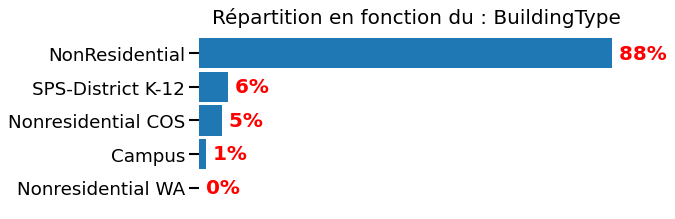

In [86]:
sns.set_context("talk") # scaling automatique selon type de présentation ('notebook', 'paper', 'talk', 'poster')

for column in ['BuildingType']:
    chaine = 'Répartition en fonction du : ' + column
    plt.figure(figsize=(7,3), dpi=80)
    df[column].value_counts(normalize=True, ascending = True).plot(kind='barh', width=0.9)
    axes = plt.gca()
    axes.set_frame_on(False) 
    axes.yaxis.grid(False) 
    plt.xticks([], [])
    plt.title(chaine)

    for i, v in enumerate(df[column].value_counts(normalize=True, ascending = True)):
        plt.text(v, i, " "+str(int(round(v*100,0)))+"%", color='r', va='center', fontweight='bold')
        
    plt.show()

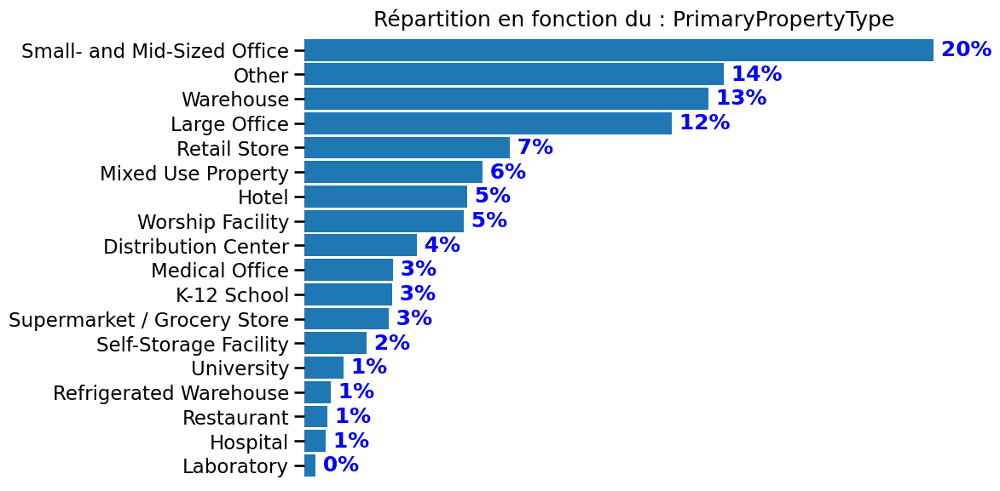

In [87]:
sns.set_context("talk")

for column in ['PrimaryPropertyType']:
    chaine = 'Répartition en fonction du : ' + column
    plt.figure(figsize=(10,7), dpi=100)
    df.loc[(df['BuildingType']=="NonResidential"),column].\
    value_counts(normalize=True, ascending = True).plot(kind='barh', width=0.9) 
    axes = plt.gca()
    axes.set_frame_on(False)
    axes.yaxis.grid(False) 
    plt.xticks([], []) 
    plt.title(chaine)

    for i, v in enumerate(df.loc[(df['BuildingType']=="NonResidential"),column].\
    value_counts(normalize=True, ascending = True)):
        plt.text(v, i, " "+str(int(round(v*100,0)))+"%", color='b', va='center', fontweight='bold')
        
    plt.show()

## NumberofBuildings
On observe les valeurs min et max
* 50 adresses avec 0 batiment
* 1 adresse avec 111 Batiments


In [88]:
df['NumberofBuildings'].value_counts(ascending=False)

1.0      3005
0.0        50
2.0        15
3.0        13
5.0         7
6.0         6
4.0         5
7.0         3
10.0        2
8.0         2
14.0        2
11.0        2
27.0        1
111.0       1
9.0         1
16.0        1
39.0        1
23.0        1
Name: NumberofBuildings, dtype: int64

### Min()

In [89]:
df['NumberofBuildings'].min()

0.0

In [90]:
df.loc[(df['NumberofBuildings'] == 0) , ['PrimaryPropertyType', 'PropertyName', 'Address','USE']]

,PrimaryPropertyType,PropertyName,Address,USE
63,Medical Office,Polyclinic North && South,1200 Harvard Ave,Medical Office
76,Small- and Mid-Sized Office,KCTS9,401 Mercer St,Data Center
160,Warehouse,Harbor Island: Warehouse E - DNRP-SWD,3235 16TH AVE SW,Non-Refrigerated Warehouse
201,Large Office,Cox Media Group Seattle KIRO TV (322),2801 3rd Ave,Office
241,Small- and Mid-Sized Office,University District Office Buiding,1107 NE 45th St,Office
264,Mixed Use Property,Thaw Building,8300 Military Rd South,Distribution Center
278,Large Office,Fourth and Pike Building,1424 4th Ave,Office
280,Hotel,Motif Seattle,1414 4th Ave,Hotel
291,Other,Meridian (East),1501 7th Ave,Movie Theater
358,Other,Westbridge,4209 W Marginal Way SW,Office


In [91]:
# On remplace 0 par 1
df['NumberofBuildings'] = np.where((df.NumberofBuildings == 0), 1,df.NumberofBuildings)

### Max()

In [92]:
df['NumberofBuildings'].max()

111.0

In [93]:
df[df['NumberofBuildings']==111]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,...,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity,USE
3274,49967,2016,Campus,University,University of Washington - Seattle Campus,NE 45th St & Brooklyn Ave,Seattle,WA,98105.0,1625049001,4,NORTHEAST,47.65644,-122.31041,1900,111.0,0.0,9320156,0,9320156,College/University,University,9320156.0,...,NaN,nan,NaN,NaN,NaN,93.800003,0.0,246.600006,0.0,873923712.0,0.0,84985240.0,192577488.0,657074389.0,0.0,0.0,False,NaN,Compliant,NaN,11140.56,1.2,College/University


## NumberofFloors

In [94]:
df['NumberofFloors'].value_counts(ascending=False)

1.0     894
2.0     751
3.0     490
4.0     270
5.0     184
6.0     146
7.0      64
8.0      41
11.0     34
10.0     33
0.0      16
12.0     16
14.0     15
9.0      14
13.0     11
15.0     10
42.0      9
19.0      8
17.0      8
20.0      7
22.0      6
18.0      6
29.0      6
24.0      6
25.0      6
21.0      6
33.0      6
23.0      5
34.0      4
27.0      4
36.0      4
41.0      4
16.0      4
76.0      2
30.0      2
49.0      2
47.0      2
55.0      2
99.0      2
46.0      2
28.0      2
63.0      2
37.0      2
56.0      2
Name: NumberofFloors, dtype: int64

In [95]:
df[df['NumberofFloors'].isna()]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,...,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity,USE
2153,24086,2015,Campus,Other,KING COUNTY METRO TRANSIT ATLANTIC-CENTRAL BAS...,1333 AIRPORT WAY S,SEATTLE,WA,98134.0,7666203387,2,GREATER DUWAMISH,47.591130,-122.323398,1991,10.0,NaN,180796,0,180796,"Other, Parking",Other,230970.0,...,0.0,nan,NaN,NaN,NaN,129.6,146.7,287.4,305.3,29939196.0,33884892.0,0.0,4900163.0,16720050.0,132198.0,13219839.0,False,NaN,Compliant,NaN,818.66,4.13,Other
3156,40028,2015,NonResidential,Warehouse,"SAND POINT BUILDING 5A,5B,5C,5D",7561 63RD AVE NE,SEATTLE,WA,98115.0,225049077,4,NORTHEAST,47.683844,-122.261760,1940,1.0,NaN,384772,0,384772,"Non-Refrigerated Warehouse, Office",Warehouse,349953.0,...,63872.0,nan,NaN,NaN,65.0,37.2,40.4,84.2,87.5,15411831.0,16729664.0,0.0,2615758.0,8925337.0,64869.0,6486866.0,True,NaN,Compliant,NaN,406.74,0.96,Non-Refrigerated Warehouse
3330,40031,2015,NonResidential,Medical Office,SAND POINT BUILDING 25,6222 NE 74TH ST,SEATTLE,WA,98115.0,225049077,4,NORTHEAST,47.682195,-122.262390,1960,1.0,NaN,30287,0,30287,Medical Office,Medical Office,31843.0,...,NaN,nan,NaN,NaN,56.0,62.1,65.5,174.9,178.5,1976647.0,2085495.0,0.0,489786.0,1671219.0,3055.0,305497.0,True,NaN,Compliant,NaN,27.88,0.68,Medical Office
3268,40034,2015,NonResidential,Medical Office,SAND POINT BUILDING 29,6200 NE 74TH ST,SEATTLE,WA,98115.0,225049077,4,NORTHEAST,47.682195,-122.262946,1960,1.0,NaN,21931,0,21931,Medical Office,Medical Office,28000.0,...,NaN,nan,NaN,NaN,21.0,133.3,157.9,238.0,263.8,3732139.0,4422217.0,0.0,384833.0,1313104.0,24191.0,2419089.0,True,NaN,Compliant,NaN,137.63,6.02,Medical Office
3305,43948,2015,Nonresidential COS,Other,GEORGETOWN STEAM PLANT,6605 13TH AVE S,SEATTLE,WA,98108.0,NaN,2,GREATER DUWAMISH,47.561588,-122.316071,1906,1.0,NaN,39212,0,39212,Other,Other,39212.0,...,NaN,nan,NaN,NaN,NaN,19.7,19.7,61.9,61.9,773013.0,773013.0,0.0,226557.0,773045.0,0.0,0.0,False,NaN,Compliant,NaN,5.39,0.05,Other
3243,49705,2015,Nonresidential COS,Other,MAGNUSON PARK CAMPUS,7400 SAND POINT WAY NE,SEATTLE,WA,98115.0,225049062,4,NORTHEAST,47.683179,-122.258795,1929,7.0,NaN,502030,0,502030,Other - Recreation,Other - Recreation,564258.0,...,NaN,nan,NaN,NaN,NaN,30.6,36.6,68.0,76.3,17290816.0,20657716.0,0.0,2831519.0,9661544.0,76297.0,7629673.0,False,NaN,Compliant,NaN,472.56,0.86,Other - Recreation
3328,49958,2015,Nonresidential COS,Other,FIRST HILL STREET CAR MAINTENANCE,848 7TH AVE S,SEATTLE,WA,98134.0,8592900285,2,GREATER DUWAMISH,47.595246,-122.322947,2014,1.0,NaN,20993,0,20993,"Repair Services (Vehicle, Shoe, Locksmith, etc)","Repair Services (Vehicle, Shoe, Locksmith, etc)",20983.0,...,NaN,nan,NaN,NaN,NaN,43.5,47.6,123.8,131.1,912558.0,998308.0,0.0,229871.0,784351.0,1282.0,128239.0,False,NaN,Compliant,NaN,12.28,0.42,Repair Services (Vehicle
3121,49966,2015,NonResidential,Other,SMILOW RAINIER VISTA BOYS & GIRLS CLUB,4520 M L KING JR WAY S,SEATTLE,WA,98108.0,6056110050,2,SOUTHEAST,47.541027,-122.312492,2009,1.0,NaN,40265,0,40265,Pre-school/Daycare,Pre-school/Daycare,40265.0,...,NaN,nan,NaN,NaN,NaN,48.6,54.1,120.3,127.2,1957356.0,2176523.0,0.0,391024.0,1334228.0,6232.0,623184.0,False,NaN,Compliant,NaN,42.40,0.91,Pre-school/Daycare


In [96]:
# On remplace Nan par 0
df['NumberofFloors'] = np.where((df.NumberofFloors.isna()),0,df.NumberofFloors)

### NumberofFloors ==0

In [97]:
# 0
df[df['NumberofFloors'] == 0][['PropertyName','Address']]

,PropertyName,Address
203,PINE ST. CONDO-ELLIOTT GRAND HYATT SEATTLE,721 PINE ST
188,1221 MADISON STREET (FORMER ARNOLD MED. PAVILLON),1221 MADISON ST
330,2200 WESTLAKE,2200 WESTLAKE AVE
1139,PACIFIC PLACE,600 PINE ST
2153,KING COUNTY METRO TRANSIT ATLANTIC-CENTRAL BAS...,1333 AIRPORT WAY S
3156,"SAND POINT BUILDING 5A,5B,5C,5D",7561 63RD AVE NE
3330,SAND POINT BUILDING 25,6222 NE 74TH ST
3268,SAND POINT BUILDING 29,6200 NE 74TH ST
3305,GEORGETOWN STEAM PLANT,6605 13TH AVE S
3243,MAGNUSON PARK CAMPUS,7400 SAND POINT WAY NE


* Grand Hyatt Seattle >> 30 étages
* Arnold Pavilion > 10 étages
* Pacific Place >> 5 étages
* HART First Hill LLC >> 5 étages
* Sandpoint #25	 > 2 étages
* Sandpoint #29	 > 2 étages
* Magnuson>> 1 étage
* University of Washington - Seattle Campus>> 2 étages

In [98]:
df.loc[166,'NumberofFloors'] = 30
df.loc[487,'NumberofFloors'] = 10
df.loc[488,'NumberofFloors'] = 2
df.loc[564, 'NumberofFloors'] = 5
df.loc[1754, 'NumberofFloors'] = 5
df.loc[3131, 'NumberofFloors'] = 2
df.loc[3132, 'NumberofFloors'] = 2
df.loc[3168, 'NumberofFloors'] = 1
df.loc[3274, 'NumberofFloors'] = 2
df.loc[203,'NumberofFloors'] = 30
df.loc[188,'NumberofFloors'] = 10
df.loc[330,'NumberofFloors'] = 2
df.loc[1139, 'NumberofFloors'] = 5
df.loc[3330, 'NumberofFloors'] = 2
df.loc[3268, 'NumberofFloors'] = 2
df.loc[3243, 'NumberofFloors'] = 1

In [99]:
df[df['NumberofFloors'] == 0][['PropertyName','Address']]

,PropertyName,Address
2153,KING COUNTY METRO TRANSIT ATLANTIC-CENTRAL BAS...,1333 AIRPORT WAY S
3156,"SAND POINT BUILDING 5A,5B,5C,5D",7561 63RD AVE NE
3305,GEORGETOWN STEAM PLANT,6605 13TH AVE S
3328,FIRST HILL STREET CAR MAINTENANCE,848 7TH AVE S
3121,SMILOW RAINIER VISTA BOYS & GIRLS CLUB,4520 M L KING JR WAY S
1993,(ID#24086)Campus1:KC Metro Transit Atlantic Ce...,1333 AIRPORT WAY S
3130,Sandpoint #5,7561 63rd Ave NE
3273,Smilow Rainier Vista Boys & Girls Club,4520 Martin Luther King Jr. Way S


### NumberofFloors == 99

In [100]:
# 99 : erreur?
df[df['NumberofFloors'] == 99]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,...,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity,USE
1257,21611,2015,NonResidential,Worship Facility,CHINESE BAPTIST CHURCH,5801 BEACON AVE S,SEATTLE,WA,98108.0,2124049098,2,GREATER DUWAMISH,47.550571,-122.302943,1977,1.0,99.0,21948,0,21948,Worship Facility,Worship Facility,21948.0,...,NaN,nan,NaN,NaN,54.0,14.5,14.5,45.500000,45.500000,318205.0000,318205.0000,0.0,93261.0,318218.0,0.0,0.0,True,NaN,Compliant,NaN,2.22,0.04,Worship Facility
1359,21611,2016,NonResidential,Worship Facility,Seattle Chinese Baptist Church,5801 Beacon Avenue South,Seattle,WA,98108.0,2124049098,2,GREATER DUWAMISH,47.550720,-122.302650,1977,1.0,99.0,21948,0,21948,Worship Facility,Worship Facility,21948.0,...,NaN,nan,NaN,NaN,80.0,14.9,14.9,46.599998,46.599998,326001.1875,326001.1875,0.0,95545.5,326001.0,0.0,0.0,False,NaN,Compliant,NaN,2.27,0.10,Worship Facility


Ce bâtiment correspond à la Chinese Baptist Church de Seattle. C'est une erreur de saisie, on transformera 99 en 0.

In [101]:
df['NumberofFloors'] = np.where((df.NumberofFloors == 99), 0,df.NumberofFloors)

In [102]:
df.shape

(3118, 47)

## Property UseType GFA

**Le GFA**, ou "surface de plancher autorisée", est une mesure de la surface de plancher d'un bâtiment. Cela peut inclure la surface de tous les étages du bâtiment, y compris les sous-sols et les étages supérieurs, mais exclut les garages, les terrasses et les balcons. 

In [103]:
# définition des variables GFA
GFA_values = ['LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseTypeGFA',
                          'ThirdLargestPropertyUseTypeGFA', 'PropertyGFATotal', 
                          'PropertyGFABuilding(s)', 'PropertyGFAParking']

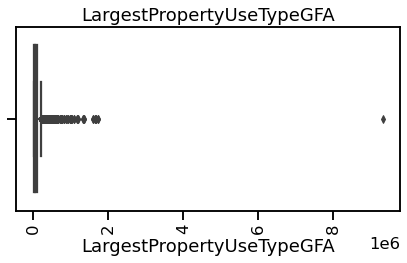

count    3.110000e+03
mean     9.652052e+04
std      2.313281e+05
min      5.656000e+03
25%      2.565950e+04
50%      4.348400e+04
75%      9.161675e+04
max      9.320156e+06
Name: LargestPropertyUseTypeGFA, dtype: float64


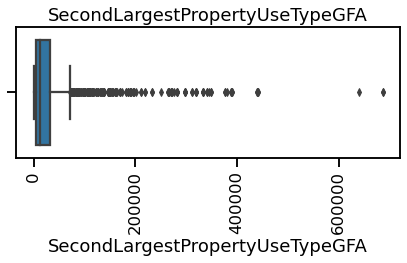

count      1577.000000
mean      36610.035699
std       69135.272410
min           0.000000
25%        5120.000000
50%       12023.000000
75%       31746.000000
max      686750.000000
Name: SecondLargestPropertyUseTypeGFA, dtype: float64


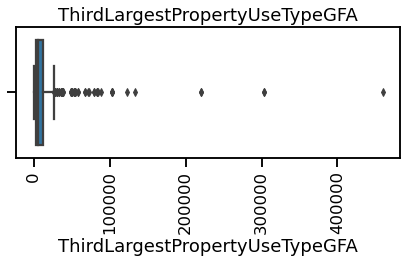

count       620.000000
mean      13433.563546
std       32107.408579
min           0.000000
25%        2500.000000
50%        5806.000000
75%       12349.000000
max      459748.000000
Name: ThirdLargestPropertyUseTypeGFA, dtype: float64


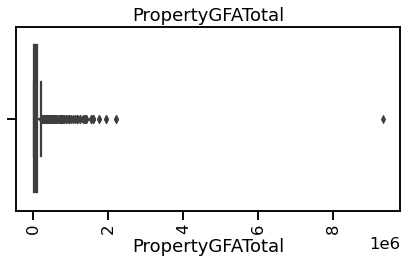

count    3.118000e+03
mean     1.158987e+05
std      2.548652e+05
min      1.128500e+04
25%      2.950800e+04
50%      4.892400e+04
75%      1.041725e+05
max      9.320156e+06
Name: PropertyGFATotal, dtype: float64


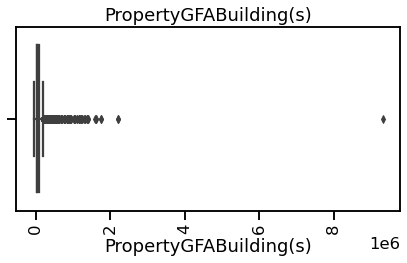

count    3.118000e+03
mean     1.025974e+05
std      2.380188e+05
min     -5.055000e+04
25%      2.853100e+04
50%      4.695800e+04
75%      9.450000e+04
max      9.320156e+06
Name: PropertyGFABuilding(s), dtype: float64


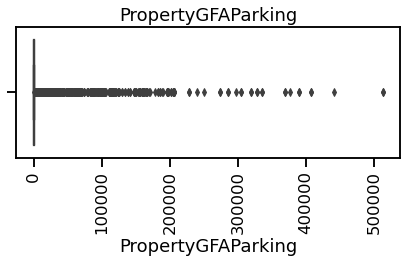

count      3118.000000
mean      13301.286722
std       44170.463800
min          -2.000000
25%           0.000000
50%           0.000000
75%           0.000000
max      512608.000000
Name: PropertyGFAParking, dtype: float64


In [104]:
#Create a boxplot
for col in GFA_values:
    sns.boxplot(df[col])
    plt.title(col)
    plt.xticks(rotation='90')
    plt.tight_layout()
    plt.show()
    print(df[col].describe())

In [105]:
# min value
for col in GFA_values:
    print(f'{col :-<70} {df[col].min()}')

LargestPropertyUseTypeGFA--------------------------------------------- 5656.0
SecondLargestPropertyUseTypeGFA--------------------------------------- 0.0
ThirdLargestPropertyUseTypeGFA---------------------------------------- 0.0
PropertyGFATotal------------------------------------------------------ 11285
PropertyGFABuilding(s)------------------------------------------------ -50550
PropertyGFAParking---------------------------------------------------- -2


In [106]:
#nan
for col in GFA_values:
    print(f'{col :-<70} {df[col].isna().sum()}')

LargestPropertyUseTypeGFA--------------------------------------------- 8
SecondLargestPropertyUseTypeGFA--------------------------------------- 1541
ThirdLargestPropertyUseTypeGFA---------------------------------------- 2498
PropertyGFATotal------------------------------------------------------ 0
PropertyGFABuilding(s)------------------------------------------------ 0
PropertyGFAParking---------------------------------------------------- 0


**SecondLargestPropertyUseType(GFA)** et **ThirdLargestPropertyUseType(GFA)** désignent les surfaces des 2e et 3e utilisation du bâtiment, Ici nous faisons le choix de remplacer les nan par 0

### Drop valeurs abérrantes de GFA

#### Données inférieures 

In [107]:
#données inférieures à 0 PropertyGFABuilding(s)
df[df['PropertyGFABuilding(s)']<0]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,...,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity,USE
3172,29788,2015,NonResidential,Small- and Mid-Sized Office,QUEEN ANNE SQUARE WEST (2013),220 W MERCER ST,SEATTLE,WA,98119.0,7015350000,7,MAGNOLIA / QUEEN ANNE,47.624968,-122.359705,1982,1.0,5.0,54015,97325,-43310,Office,Small- and Mid-Sized Office,54015.0,...,NaN,nan,NaN,NaN,65.0,64.0,64.0,200.9,200.9,3455247.0,3455247.0,0.0,1012675.0,3455391.0,0.0,0.0,False,NaN,Compliant,NaN,24.09,0.17,Office
3151,50002,2015,NonResidential,Other,FREEWAY MOTORS UNIVERSITY AUDI,4741 11TH AVE NE,SEATTLE,WA,98105.0,6746701515,4,NORTHEAST,47.664111,-122.316639,2014,1.0,3.0,33648,84198,-50550,"Automobile Dealership, Parking",Parking,83600.0,...,39000.0,nan,NaN,NaN,NaN,35.6,35.6,111.9,111.9,1389553.0,1389553.0,0.0,407255.0,1389610.0,0.0,0.0,False,NaN,Compliant,NaN,9.69,0.11,Automobile Dealership


In [108]:
df.loc[3172,'PropertyGFABuilding(s)'] = np.nan
df.loc[3151,'PropertyGFABuilding(s)'] = np.nan

In [109]:
df.dropna(subset=['PropertyGFABuilding(s)'], axis=0,inplace=True)

In [110]:
#données inférieures à 0 PropertyGFAParking
df[df['PropertyGFAParking']<0]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,...,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity,USE
3131,29551,2015,NonResidential,Small- and Mid-Sized Office,625 5TH AVE S,625 5TH AVE S,SEATTLE,WA,98104.0,8809700040,2,DOWNTOWN,47.597252,-122.327747,2000,1.0,2.0,68452,-2,68454.0,"Bank Branch, Office",Small- and Mid-Sized Office,61665.0,...,6787.0,nan,NaN,"2016, 2015",81.0,53.6,58.3,168.4,182.9,3670298.0,3988260.0,0.0,1075703.0,3670451.0,0.0,0.0,False,NaN,Compliant,NaN,25.59,0.14,Bank Branch


In [111]:
df.loc[3131,'PropertyGFAParking'] = np.nan

In [112]:
df.dropna(subset=['PropertyGFAParking'], axis=0,inplace=True)

#### Données incohérentes

In [113]:
df.loc[(df['LargestPropertyUseTypeGFA'] > df['PropertyGFATotal']), ['PropertyName', 'LargestPropertyUseTypeGFA','PropertyGFATotal']]

,PropertyName,LargestPropertyUseTypeGFA,PropertyGFATotal
138,WARWICK SEATTLE HOTEL,123445.0,119890
229,W SEATTLE HOTEL,336640.0,333176
52,GRAHAM HILL ELEMENTARY SCHOOL (SPS-DISTRICT),58320.0,56228
421,JANE ADAMS JUNIOR HIGH (SPS-DISTRICT),164229.0,160645
257,JOHN HAY ELEMENTARY SCHOOL (SPS-DISTRICT),55166.0,51582
...,...,...,...
3294,Audi Seattle UVA Bldg,83600.0,33648
3319,Hilton Garden Inn Seattle,159500.0,144614
3322,Honda of Seattle/Toyota of Seattle,202171.0,108036
3347,Hamlin Robinson School,45728.0,45000


In [114]:
df.loc[(df['PropertyGFABuilding(s)'] > df['PropertyGFATotal']), ['PropertyName', 'PropertyGFABuilding(s)','PropertyGFATotal']]

,PropertyName,PropertyGFABuilding(s),PropertyGFATotal


In [115]:
df.loc[(df['PropertyGFAParking'] > df['PropertyGFATotal']), ['PropertyName', 'PropertyGFAParking','PropertyGFATotal']]

,PropertyName,PropertyGFAParking,PropertyGFATotal


In [116]:
df.loc[(df['SecondLargestPropertyUseTypeGFA'] > df['LargestPropertyUseTypeGFA']), ['PropertyName', 'SecondLargestPropertyUseTypeGFA','LargestPropertyUseTypeGFA']]

,PropertyName,SecondLargestPropertyUseTypeGFA,LargestPropertyUseTypeGFA


In [117]:
df.loc[(df['ThirdLargestPropertyUseTypeGFA'] > df['LargestPropertyUseTypeGFA']), ['PropertyName', 'ThirdLargestPropertyUseTypeGFA','LargestPropertyUseTypeGFA']]

,PropertyName,ThirdLargestPropertyUseTypeGFA,LargestPropertyUseTypeGFA


In [118]:
df.loc[(df['ThirdLargestPropertyUseTypeGFA'] > df['SecondLargestPropertyUseTypeGFA']), ['PropertyName', 'ThirdLargestPropertyUseTypeGFA','SecondLargestPropertyUseTypeGFA']]

,PropertyName,ThirdLargestPropertyUseTypeGFA,SecondLargestPropertyUseTypeGFA


In [119]:
# élimination des builting ou la surface totale est stictement inférieure à la surface de la plus grande  utilisation
df = df.loc[(df['LargestPropertyUseTypeGFA'] <= df['PropertyGFATotal'])]

### PropertyUseType == Parking

In [120]:
df.loc[(df['LargestPropertyUseType'] == 'Parking') & (df['PropertyGFAParking'] == 0), 
    ['PrimaryPropertyType', 'PropertyName', 'LargestPropertyUseType','LargestPropertyUseTypeGFA','PropertyGFAParking', 'USE']]

,PrimaryPropertyType,PropertyName,LargestPropertyUseType,LargestPropertyUseTypeGFA,PropertyGFAParking,USE
357,Mixed Use Property,SECURITIES & MARKET BUILDING CAMPUS,Parking,155000.0,0.0,Data Center
330,Mixed Use Property,2200 WESTLAKE,Parking,385196.0,0.0,Financial Office
1319,Other,SEATTLE PREP - ST. IGNATIUS,Parking,65000.0,0.0,K-12 School
2175,Mixed Use Property,ALFA ROMEO AUTO SHOWROOM,Parking,18000.0,0.0,Parking
3061,Mixed Use Property,ARBORETUM COURT II,Parking,11021.0,0.0,Fitness Center/Health Club/Gym
2750,Mixed Use Property,TRADER JOE'S - AAA,Parking,24288.0,0.0,Office
301,Mixed Use Property,Securities Building Campus,Parking,155000.0,0.0,Data Center
488,Mixed Use Property,2200 Westlake - SEDO,Parking,385196.0,0.0,Financial Office
2095,Mixed Use Property,"Automobili Italiane, Inc.",Parking,18000.0,0.0,Parking
2798,Mixed Use Property,Arboretum Court 2,Parking,11021.0,0.0,Fitness Center/Health Club/Gym


Nous retrouvons des données GFA parking incohérentes, nous supprimons ces batiments

In [121]:
df.loc[357, 'PropertyGFAParking'] = np.nan
df.loc[330, 'PropertyGFAParking'] = np.nan
df.loc[1319, 'PropertyGFAParking'] = np.nan
df.loc[2175, 'PropertyGFAParking'] = np.nan
df.loc[3061, 'PropertyGFAParking'] = np.nan
df.loc[3061, 'PropertyGFAParking'] = np.nan
df.loc[301, 'PropertyGFAParking'] = np.nan
df.loc[488, 'PropertyGFAParking'] = np.nan
df.loc[2095, 'PropertyGFAParking'] = np.nan
df.loc[2798, 'PropertyGFAParking'] = np.nan
df.loc[2800, 'PropertyGFAParking'] = np.nan

In [122]:
df.dropna(subset=['PropertyGFAParking'], axis=0,inplace=True)

In [123]:
df.loc[(df['SecondLargestPropertyUseType'] == 'Parking') & (
    df['SecondLargestPropertyUseTypeGFA'] == 0) & (df['PropertyGFAParking'] != 0),
    ['PropertyName', 'Address', 'USE', 'SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeGFA', 'PropertyGFAParking']]

,PropertyName,Address,USE,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,PropertyGFAParking
73,CENTURYLINK FIELD-Stadium,800 OCCIDENTAL AVE S,Other - Entertainment/Public Assembly,Parking,0.0,327680.0
82,1100 DEXTER,1100 DEXTER AVE N,Office,Parking,0.0,115228.0
1135,800 Stewart,800 STEWART ST,Office,Parking,0.0,11250.0
1254,SAFEWAY STORE # 1477,1423 NW MARKET ST,Parking,Parking,0.0,43035.0
2880,SAFEWAY STORE # 1550,7300 ROOSEVELT WAY NE,Parking,Parking,0.0,38585.0
2640,GREENWOOD LIBRARY,8016 GREENWOOD AVE N,Library,Parking,0.0,14570.0
155,CenturyLink,800 Occidental Ave. South,Other - Entertainment/Public Assembly,Parking,0.0,327680.0
319,1100 Dexter-RREEF SeaDPD ID 456,1100 Dexter Avenue North,Office,Parking,0.0,115228.0
356,70100179-Lake City,13000 Lake City Way NE,Parking,Parking,0.0,187878.0
401,Safeway 1845 - Greenwood Ave,8704 Greenwood Ave N,Parking,Parking,0.0,7450.0


In [124]:
df.loc[73,'SecondLargestPropertyUseTypeGFA'] = 327680.0
df.loc[82,'SecondLargestPropertyUseTypeGFA'] = 115228.0
df.loc[1135,'SecondLargestPropertyUseTypeGFA'] = 11250.0
df.loc[1254,'SecondLargestPropertyUseTypeGFA'] = 43035.0
df.loc[2880,'SecondLargestPropertyUseTypeGFA'] = 38585.0
df.loc[2640,'SecondLargestPropertyUseTypeGFA'] = 14570.0
df.loc[155,'SecondLargestPropertyUseTypeGFA'] = 327680
df.loc[319,'SecondLargestPropertyUseTypeGFA'] = 115228
df.loc[356,'SecondLargestPropertyUseTypeGFA'] = 187878
df.loc[401,'SecondLargestPropertyUseTypeGFA'] = 7450
df.loc[875,'SecondLargestPropertyUseTypeGFA'] = 11250
df.loc[1522,'SecondLargestPropertyUseTypeGFA'] = 43035
df.loc[2896,'SecondLargestPropertyUseTypeGFA'] = 38585
df.loc[2985,'SecondLargestPropertyUseTypeGFA'] = 14570

In [125]:
df.loc[(df['ThirdLargestPropertyUseType'] == 'Parking') &
       (df['ThirdLargestPropertyUseTypeGFA'] == 0) & (df['PropertyGFAParking'] != 0),
       ['PropertyName', 'Address', 'USE', 'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA','PropertyGFAParking']]

,PropertyName,Address,USE,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,PropertyGFAParking
95,BOEING SOUTH PARK CAMPUS REPORT,1420 S TRENTON ST,Laboratory,Parking,0.0,31874.0
356,70100179-Lake City,13000 Lake City Way NE,Parking,Parking,0.0,187878.0


In [126]:
df.loc[95,'ThirdLargestPropertyUseTypeGFA'] = 31874.0
df.loc[356,'ThirdLargestPropertyUseTypeGFA'] = 187878

### Surface = 0 remplace par np.nan

In [127]:
df[df['SecondLargestPropertyUseTypeGFA']==0]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,...,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity,USE
312,117,2015,NonResidential,Hotel,UNIVERSITY INN,4140 ROOSEVELT WAY NE,SEATTLE,WA,98105.0,1142001871,4,NORTHEAST,47.657746,-122.317534,1962,1.0,4.0,50017,0.0,50017.0,"Hotel, Swimming Pool",Hotel,50017.0,...,0.0,nan,NaN,NaN,51.0,111.400000,114.300000,207.100000,210.000000,5.570472e+06,5717357.000,0.0,6.320810e+05,2156751.0,34138.000000,3413811.0,False,NaN,Compliant,NaN,196.34,3.74,Hotel
339,132,2015,NonResidential,Other,ROOSEVELT SQUARE,6417 ROOSEVELT WAY NE,SEATTLE,WA,98115.0,1797500715,4,NORTHEAST,47.675669,-122.316191,1929,1.0,2.0,206934,0.0,206934.0,"Other, Parking",Other,119146.0,...,0.0,nan,NaN,NaN,NaN,37.400000,38.800000,76.500000,76.700000,4.461969e+06,4625346.000,0.0,6.208280e+05,2118354.0,23437.000000,2343703.0,False,NaN,Compliant,NaN,139.24,0.63,Other
175,136,2015,NonResidential,Hotel,HOLIDAY INN EXPRESS - SEATTLE NORTH,14115 AURORA AVE N,SEATTLE,WA,98133.0,1926049012,5,NORTHWEST,47.731272,-122.346238,2001,1.0,4.0,51390,0.0,51390.0,"Hotel, Parking",Hotel,51390.0,...,0.0,nan,NaN,NaN,86.0,75.200000,75.200000,137.500000,137.500000,3.864699e+06,3864699.000,0.0,4.216870e+05,1438855.0,24259.000000,2425903.0,False,NaN,Compliant,NaN,138.87,2.58,Hotel
400,458,2015,NonResidential,Small- and Mid-Sized Office,NORTHGATE EXECUTIVE CENTER B,155 NE 100TH ST,SEATTLE,WA,98125.0,2434900010,5,NORTH,47.700790,-122.327223,1974,1.0,5.0,74880,0.0,74880.0,"Office, Parking",Small- and Mid-Sized Office,71751.0,...,0.0,nan,NaN,NaN,68.0,61.700000,69.500000,193.800000,218.300000,4.428557e+06,4987947.000,0.0,1.297936e+06,4428741.0,0.000000,0.0,False,NaN,Compliant,NaN,30.87,0.16,Office
208,459,2015,NonResidential,Small- and Mid-Sized Office,NORTHGATE EXECUTIVE CENTER C,9725 3RD AVE NE,SEATTLE,WA,98115.0,2434900020,5,NORTH,47.700063,-122.326753,1979,1.0,6.0,88774,0.0,88774.0,"Office, Parking",Small- and Mid-Sized Office,85339.0,...,0.0,nan,NaN,NaN,52.0,71.000000,75.900000,222.900000,238.400000,6.057734e+06,6480521.000,0.0,1.775420e+06,6057984.0,0.000000,0.0,False,NaN,Compliant,NaN,42.23,0.18,Office
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2535,26002,2016,NonResidential,Worship Facility,IGLESIA NI CRISTO,7100 42ND AVENUE SOUTH,Seattle,WA,98118.0,8800000005,2,SOUTHEAST,47.538570,-122.280260,1968,1.0,1.0,24200,0.0,24200.0,"Parking, Worship Facility",Worship Facility,24200.0,...,0.0,nan,NaN,NaN,73.0,34.200001,37.200001,76.099998,79.400002,8.264887e+05,900697.125,0.0,1.366749e+05,466335.0,3601.539795,360154.0,False,NaN,Compliant,NaN,22.38,0.92,Parking
2668,26529,2016,NonResidential,Supermarket / Grocery Store,Safeway 3091 - Brooklyn Ave,4732 Brooklyn Ave NE,Seattle,WA,98105.0,8816401015,4,NORTHEAST,47.664290,-122.313890,1950,1.0,1.0,26226,0.0,26226.0,"Parking, Supermarket/Grocery Store",Supermarket / Grocery Store,25828.0,...,0.0,nan,NaN,NaN,37.0,293.799988,301.899994,741.400024,745.400024,7.588060e+06,7798479.500,0.0,1.567840e+06,5349470.0,22385.900390,2238590.0,False,NaN,Compliant,NaN,156.18,5.96,Parking
3065,28033,2016,NonResidential,Distribution Center,"Park Manor, LLC",601-619 S. Snoqualmie Street,Seattle,WA,98108.0,7376600765,2,G

In [128]:
df['SecondLargestPropertyUseTypeGFA'] = np.where((df.SecondLargestPropertyUseTypeGFA == 0), np.nan ,df.SecondLargestPropertyUseTypeGFA)

In [129]:
df[df['ThirdLargestPropertyUseTypeGFA']==0]

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,...,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity,USE
509,3,2015,NonResidential,Hotel,WESTIN HOTEL,1900 5TH AVE,SEATTLE,WA,98101.0,659000475,7,DOWNTOWN,47.613349,-122.337699,1969,1.0,41.0,961990,0.0,961990.0,"Hotel, Parking, Swimming Pool",Hotel,757243.0,...,100000.0,Swimming Pool,0.0,NaN,18.0,96.600000,99.700000,242.700000,246.500000,7.313066e+07,7.550627e+07,19660404.0,1.458393e+07,4.976244e+07,37099.000000,3.709900e+06,True,NaN,Compliant,NaN,2061.48,1.92,Hotel
395,22,2015,NonResidential,Other,DOWNTOWN SEATTLE YMCA,909 4TH AVE,SEATTLE,WA,98104.0,942000350,7,DOWNTOWN,47.605446,-122.332802,1930,1.0,6.0,103911,0.0,103911.0,"Fitness Center/Health Club/Gym, Office, Swimmi...",Fitness Center/Health Club/Gym,90000.0,...,40000.0,Swimming Pool,0.0,NaN,NaN,79.500000,83.400000,173.700000,178.400000,1.034028e+07,1.084394e+07,4398022.0,1.549824e+06,5.288219e+06,6543.000000,6.542600e+05,False,NaN,Compliant,NaN,411.09,3.74,Fitness Center/Health Club/Gym
404,63,2015,NonResidential,Hotel,SHERATON HOTEL,1400 6TH AVE,SEATTLE,WA,98101.0,1976700095,7,DOWNTOWN,47.611020,-122.333534,1982,1.0,34.0,994212,146694.0,847518.0,"Hotel, Parking, Swimming Pool",Hotel,994212.0,...,117668.0,Swimming Pool,0.0,NaN,60.0,85.900000,89.300000,187.300000,191.600000,8.535795e+07,8.877149e+07,16229832.0,1.320040e+07,4.504163e+07,240884.000000,2.408835e+07,False,NaN,Compliant,NaN,2846.07,2.67,Hotel
389,232,2015,NonResidential,Hotel,SILVER CLOUD INN LAKE UNION,1150 FAIRVIEW AVE N,SEATTLE,WA,98109.0,4088802955,3,LAKE UNION,47.629704,-122.329060,1998,1.0,5.0,123920,30000.0,93920.0,"Hotel, Parking, Swimming Pool",Hotel,123920.0,...,30000.0,Swimming Pool,0.0,NaN,82.0,72.300000,75.600000,144.200000,148.100000,8.964061e+06,9.362176e+06,0.0,1.185675e+06,4.045691e+06,49185.000000,4.918538e+06,False,NaN,Compliant,NaN,289.43,2.20,Hotel
298,467,2015,NonResidential,Retail Store,FRED MEYER BALLARD,915 NW 45TH ST,SEATTLE,WA,98107.0,1982202070,6,BALLARD,47.660478,-122.367633,1999,1.0,1.0,164437,0.0,164437.0,"Parking, Retail Store, Supermarket/Grocery Store",Retail Store,102653.0,...,74102.0,Parking,0.0,NaN,61.0,105.400000,110.400000,280.900000,281.100000,1.862229e+07,1.951110e+07,0.0,4.220430e+06,1.440070e+07,42222.000000,4.222185e+06,True,NaN,Compliant,NaN,324.63,1.60,Parking
438,500,2015,NonResidential,Retail Store,FRED MEYER,13000 LAKE CITY WAY NE,SEATTLE,WA,98125.0,1453601660,5,NORTH,47.724054,-122.292053,1995,1.0,2.0,244529,0.0,244529.0,"Parking, Retail Store, Supermarket/Grocery Store",Retail Store,70800.0,...,56651.0,Parking,0.0,NaN,57.0,114.400000,120.100000,291.900000,293.500000,1.458316e+07,1.530282e+07,0.0,3.069623e+06,1.047399e+07,41096.000000,4.109607e+06,True,NaN,Compliant,NaN,291.28,1.01,Parking
168,556,2015,NonResidential,Refrigerated Warehouse,SEATTLE PRODUCE TERMINAL (CHARLIE'S),4103 2ND AVE S,SEATTLE,WA,98134.0,6172900230,2,GREATER DUWAMISH,47.566525,-122.332713,1953,1.0,1.0,104099,0.0,104099.0,"Office, Parking, Refrigerated Warehouse",Refrigerated Warehouse,100000.0,...,4099.0,Parking,0.0,NaN,NaN,170.200000,165.400000,524.700000,504.800000,1.771433e+07,1.721358e+07,0.0,5.051736e+06,1.723724e+07,4778.000000,4.778080e+05,False,NaN,Compliant,NaN,145.54,0.69,Office
245,682,2015,NonResidential,Other,ALLSTAR FITNESS,2629 SW ANDOVER ST,SEATTLE,WA,98126.

In [130]:
df['ThirdLargestPropertyUseTypeGFA'] = np.where((df.SecondLargestPropertyUseTypeGFA == 0), np.nan ,df.ThirdLargestPropertyUseTypeGFA)

### Différence property, building

In [131]:
df = df.assign(Diff_surface=lambda x: (x['PropertyGFATotal'] -
               x['PropertyGFAParking'] - x['PropertyGFABuilding(s)']))

In [132]:
df['Diff_surface'].value_counts()

0.0    2689
Name: Diff_surface, dtype: int64

Nous trouvons bien que tous nos batiments ou la surface totale est égale à la surface des batiments + surface du parking

In [133]:
df.drop(['Diff_surface'], axis=1, inplace=True)

## Energy Feature
* SiteEUI (kBtu/sf): EUI signifie "Indice d'Utilisation de l'Energie". Cette unité mesure l'utilisation totale d'énergie d'un site par unité de surface. Elle est souvent utilisée pour comparer l'efficacité énergétique de différents bâtiments.
<br>
<br>
* SiteEUIWN (kBtu/sf): Cette unité est similaire à SiteEUI, mais elle prend en compte les variations climatiques en utilisant un facteur de correction appelé "facteur de normalisation".
<br>
<br>
* SourceEUI (kBtu/sf): Cette unité mesure l'utilisation d'énergie d'une source spécifique (par exemple, l'électricité ou le gaz naturel) par unité de surface.
<br>
<br>
* SourceEUIWN (kBtu/sf): Cette unité est similaire à SourceEUI, mais elle utilise le facteur de normalisation pour tenir compte des variations climatiques.
<br>
<br>
* SiteEnergyUse (kBtu): Cette unité mesure l'utilisation totale d'énergie d'un site.
<br>
<br>
* SiteEnergyUseWN (kBtu): Cette unité est similaire à SiteEnergyUse, mais elle utilise le facteur de normalisation pour tenir compte des variations climatiques.
<br>
<br>
* SteamUse (kBtu): Cette unité mesure l'utilisation de vapeur d'eau pour fournir de l'énergie à un site.
<br>
<br>
* Electricity (kWh): Cette unité mesure l'utilisation d'électricité en kilowatts-heure.
<br>
<br>
* Electricity (kBtu): Cette unité mesure l'utilisation d'électricité en unités de chaleur.
<br>
<br>
* NaturalGas (therms): Cette unité mesure l'utilisation de gaz naturel en therms. Un therm est une unité de mesure de l'énergie qui correspond à la quantité de chaleur nécessaire pour chauffer un pied cube d'eau de 100 degrés Fahrenheit à l'aide de gaz naturel.
<br>
<br>
* NaturalGas (kBtu): Cette unité mesure l'utilisation de gaz naturel en unités de chaleur.

Un kBtu est égal à 1 000 Btu, qui est une unité d'énergie souvent utilisée aux États-Unis pour mesurer la production de chaleur des appareils et la capacité de chauffage et de refroidissement des systèmes 

On ne conservce que les mesures interessantes pour la suite de notre étude à savoir :  SiteEUI (kBtu/sf), SourceEUI (kBtu/sf), SourceEUI (kBtu/sf),SteamUse(kBtu), Electricity (kBtu) et NaturalGas (kBtu)

In [134]:
Energy = ['SiteEUI(kBtu/sf)','SourceEUI(kBtu/sf)',
          'SiteEnergyUse(kBtu)','SteamUse(kBtu)',
          'Electricity(kBtu)','NaturalGas(kBtu)']

In [135]:
df[Energy].isna().sum()

SiteEUI(kBtu/sf)       6
SourceEUI(kBtu/sf)     5
SiteEnergyUse(kBtu)    5
SteamUse(kBtu)         5
Electricity(kBtu)      5
NaturalGas(kBtu)       5
dtype: int64

### Missing value

In [136]:
df.loc[(df['SiteEUI(kBtu/sf)'].isna() == True), 
['PrimaryPropertyType', 'PropertyName', 'Address', 'SiteEUI(kBtu/sf)','SiteEnergyUse(kBtu)','PropertyGFATotal']]

,PrimaryPropertyType,PropertyName,Address,SiteEUI(kBtu/sf),SiteEnergyUse(kBtu),PropertyGFATotal
393,K-12 School,ARBOR HEIGHTS ELEMENTARY SCHOOL (SPS-DISTRICT),3701 SW 104TH ST,NaN,NaN,53352
1500,K-12 School,PINEHURST ELEMENTARY (SPS-DISTRICT),11530 12TH AVE NE,NaN,NaN,34005
1813,K-12 School,GENESEE SCHOOL (SPS-DISTRICT),5012 SW GENESEE ST,NaN,NaN,41221
2224,K-12 School,WILSON-PACIFIC (SPS-DISTRICT),1330 N 90TH ST,NaN,NaN,110830
2387,Restaurant,YALE STREET LANDING,1001 FAIRVIEW AVE N,NaN,NaN,26519
304,Other,Washington State Convention Center,705 Pike St,NaN,0.0,1400000


On remarque que SiteEnergyUse(kBtu) est à 0, nous allons donc chercher à connaitre cette a valeur avant de calculer SiteEUI(kBtu/sf)

In [137]:
df.loc[(df['SiteEUI(kBtu/sf)'] == 0), 
['PrimaryPropertyType', 'PropertyName', 'Address', 'SiteEUI(kBtu/sf)','SiteEnergyUse(kBtu)','PropertyGFATotal']]

,PrimaryPropertyType,PropertyName,Address,SiteEUI(kBtu/sf),SiteEnergyUse(kBtu),PropertyGFATotal
261,Retail Store,CENTURY SQUARE RETAIL,1525 4TH AVE,0.0,0.0,57428
1041,Large Office,SEATTLE TOWER,1218 3RD AVE,0.0,0.0,216571
28,K-12 School,Meany Building,301/300 21st Ave. E.,0.0,0.0,126351
95,K-12 School,B.F. Day Elementary,3921 Linden Ave. N.,0.0,0.0,66588
133,K-12 School,Whitman Middle,9201 15th Ave. NW.,0.0,0.0,160270
139,K-12 School,Washington Middle,2101 S. Jackson,0.0,0.0,136188
614,K-12 School,Bailey Gatzert Elementary,1301 E. Yesler Way,0.0,0.0,52924
630,K-12 School,Leschi Elementary,135 32nd Ave.,0.0,0.0,55353
746,Other,Welcome Home Society - PriceCo,13537 Aurora Ave N,0.0,0.0,29924


### SiteEnergyUse(kBtu)

Il suffit d'addictionner l'électricité, le gaz et d'autres sources d'énergie utilisées sur le site pour obtenir l'utilisation totale de l'énergie du site.

In [138]:
df.loc[(df['SiteEnergyUse(kBtu)'] == 0),
       ['PrimaryPropertyType', 'PropertyName', 'Address', 'SiteEnergyUse(kBtu)', 'Electricity(kBtu)', 'NaturalGas(kBtu)', 'SteamUse(kBtu)']]

,PrimaryPropertyType,PropertyName,Address,SiteEnergyUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),SteamUse(kBtu)
261,Retail Store,CENTURY SQUARE RETAIL,1525 4TH AVE,0.0,0.0,0.0,0.0
1041,Large Office,SEATTLE TOWER,1218 3RD AVE,0.0,0.0,0.0,0.0
28,K-12 School,Meany Building,301/300 21st Ave. E.,0.0,0.0,0.0,0.0
95,K-12 School,B.F. Day Elementary,3921 Linden Ave. N.,0.0,2104286.0,0.0,0.0
133,K-12 School,Whitman Middle,9201 15th Ave. NW.,0.0,0.0,4318917.0,0.0
139,K-12 School,Washington Middle,2101 S. Jackson,0.0,0.0,3217877.0,0.0
304,Other,Washington State Convention Center,705 Pike St,0.0,0.0,0.0,0.0
614,K-12 School,Bailey Gatzert Elementary,1301 E. Yesler Way,0.0,1957268.0,0.0,0.0
630,K-12 School,Leschi Elementary,135 32nd Ave.,0.0,1433596.0,0.0,0.0
746,Other,Welcome Home Society - PriceCo,13537 Aurora Ave N,0.0,0.0,0.0,0.0


**Washington State Convention Center** était notre batiment en Nan, on remarque aucune donnée en Electricity(kBtu) ou NaturalGas(kBtu) ou stream, nous suprimons donc ce batiment

 Nous allons éliminer les 5 batiments ou la consommation d'énergie est à 0 dans les 3 domaines , electricité, gaz, vapeur 

In [139]:
df.loc[261,'SiteEnergyUse(kBtu)'] = np.nan
df.loc[1041,'SiteEnergyUse(kBtu)'] = np.nan
df.loc[28,'SiteEnergyUse(kBtu)'] = np.nan
df.loc[304,'SiteEnergyUse(kBtu)'] = np.nan
df.loc[746,'SiteEnergyUse(kBtu)'] = np.nan

In [140]:
df.dropna(subset=['SiteEnergyUse(kBtu)'], axis=0,inplace=True)

Nous allons pouvoir renseigner la feature SiteEnergyUse(kBtu) en fonction des données dont nous disposons en Electricity(kBtu) ou NaturalGas(kBtu)
* pour rappel : SiteEnergyUse(kBtu =  Electricity(kBtu) + NaturalGas(kBtu) + SteamUse(kBtu)

In [141]:
df.loc[95,'SiteEnergyUse(kBtu)'] = 2104286.0
df.loc[133,'SiteEnergyUse(kBtu)'] = 4318917.0
df.loc[139,'SiteEnergyUse(kBtu)'] = 3217877.0
df.loc[614,'SiteEnergyUse(kBtu)'] = 1957268.0
df.loc[630,'SiteEnergyUse(kBtu)'] = 1433596.0

In [142]:
df[Energy].isna().sum()

SiteEUI(kBtu/sf)       0
SourceEUI(kBtu/sf)     0
SiteEnergyUse(kBtu)    0
SteamUse(kBtu)         0
Electricity(kBtu)      0
NaturalGas(kBtu)       0
dtype: int64

### Vérification SiteEnergyUse(kBtu) est différent de 0 alors que les sources d'énergie ont 0

In [143]:
df.loc[(df['SiteEnergyUse(kBtu)'] != 0) & (df['Electricity(kBtu)'] == 0) & (df['NaturalGas(kBtu)'] == 0) & (df['SteamUse(kBtu)'] == 0),
       ['PrimaryPropertyType', 'PropertyName', 'Address', 'SiteEnergyUse(kBtu)', 'Electricity(kBtu)', 'NaturalGas(kBtu)', 'SteamUse(kBtu)']]

,PrimaryPropertyType,PropertyName,Address,SiteEnergyUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),SteamUse(kBtu)
513,Supermarket / Grocery Store,IUC- Whole Foods Interbay,2001 15th Avenue West,12525174.0,0.0,0.0,0.0


In [144]:
df.loc[513,'SiteEnergyUse(kBtu)'] = np.nan

In [145]:
df.dropna(subset=['SiteEnergyUse(kBtu)'], axis=0,inplace=True)

### SiteEUI(kBtu/sf)
Site EUI (kBtu/sf) = SiteEnergyUse (kBtu) / Building Area (sf)

In [146]:
df.loc[(df['SiteEUI(kBtu/sf)'] == 0),
       ['PrimaryPropertyType', 'PropertyName', 'Address', 'SiteEUI(kBtu/sf)', 'SiteEnergyUse(kBtu)', 'PropertyGFATotal', 'Electricity(kBtu)', 'NaturalGas(kBtu)', 'SteamUse(kBtu)']]

,PrimaryPropertyType,PropertyName,Address,SiteEUI(kBtu/sf),SiteEnergyUse(kBtu),PropertyGFATotal,Electricity(kBtu),NaturalGas(kBtu),SteamUse(kBtu)
95,K-12 School,B.F. Day Elementary,3921 Linden Ave. N.,0.0,2104286.0,66588,2104286.0,0.0,0.0
133,K-12 School,Whitman Middle,9201 15th Ave. NW.,0.0,4318917.0,160270,0.0,4318917.0,0.0
139,K-12 School,Washington Middle,2101 S. Jackson,0.0,3217877.0,136188,0.0,3217877.0,0.0
614,K-12 School,Bailey Gatzert Elementary,1301 E. Yesler Way,0.0,1957268.0,52924,1957268.0,0.0,0.0
630,K-12 School,Leschi Elementary,135 32nd Ave.,0.0,1433596.0,55353,1433596.0,0.0,0.0


In [147]:
df.loc[95, 'SiteEUI(kBtu/sf)'] = 2104286.0/66588.0
df.loc[133, 'SiteEUI(kBtu/sf)'] = 4318917.0/160270.0
df.loc[139, 'SiteEUI(kBtu/sf)'] = 3217877.0/136188.0
df.loc[614, 'SiteEUI(kBtu/sf)'] = 1957268.0/52924.0
df.loc[630, 'SiteEUI(kBtu/sf)'] = 1433596.0/55353.0

## Emissions Feature
'TotalGHGEmissions' et 'GHGEmissionsIntensity' sont des mesures liées aux émissions de gaz à effet de serre.

* TotalGHGEmissions' fait référence à la quantité totale de gaz à effet de serre émis . Cette valeur est généralement mesurée en unités d'équivalent dioxyde de carbone (CO2e)
<br>
<br>
* GHGEmissionsIntensity est probablement une mesure des émissions de gaz à effet de serre par unité d'un autre paramètre, tel que le PIB ou la population. Cette mesure est souvent utilisée pour montrer les progrès réalisés par un pays ou une entreprise dans la réduction de ses émissions de gaz à effet de serre par rapport à sa croissance économique ou démographique.

In [148]:
Emissions=['TotalGHGEmissions','GHGEmissionsIntensity']

In [149]:
df[Emissions].isna().sum()

TotalGHGEmissions        0
GHGEmissionsIntensity    0
dtype: int64

In [150]:
df[Emissions].describe()

,TotalGHGEmissions,GHGEmissionsIntensity
count,2675.000000,2675.000000
mean,158.764897,1.378505
std,549.763675,2.059180
min,-0.800000,-0.020000
25%,19.165000,0.260000
50%,47.120000,0.720000
75%,133.640000,1.640000
max,12307.160000,31.380000


### TotalGHGEmissions
Elimination de la donnée avec une émission CO2 négative

In [151]:
df.loc[(df['TotalGHGEmissions'] <= 0), 
['PrimaryPropertyType', 'PropertyName', 'Address', 'GHGEmissionsIntensity']]

,PrimaryPropertyType,PropertyName,Address,GHGEmissionsIntensity
3206,Small- and Mid-Sized Office,Bullitt Center,1501 E. Madison St.,-0.02


In [152]:
df.loc[3206,'TotalGHGEmissions'] = np.nan

In [153]:
df.dropna(subset=['TotalGHGEmissions'], axis=0,inplace=True)

### HGEmissionsIntensity
Supression de cette feature pour la suite de notre étude

In [154]:
df.drop(['GHGEmissionsIntensity'], axis=1,inplace=True)

## Drop Feature

In [155]:
df.columns

Index(['OSEBuildingID', 'DataYear', 'BuildingType', 'PrimaryPropertyType',
       'PropertyName', 'Address', 'City', 'State', 'ZipCode',
       'TaxParcelIdentificationNumber', 'CouncilDistrictCode', 'Neighborhood',
       'Latitude', 'Longitude', 'YearBuilt', 'NumberofBuildings',
       'NumberofFloors', 'PropertyGFATotal', 'PropertyGFAParking',
       'PropertyGFABuilding(s)', 'ListOfAllPropertyUseTypes',
       'LargestPropertyUseType', 'LargestPropertyUseTypeGFA',
       'SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeGFA',
       'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA',
       'YearsENERGYSTARCertified', 'ENERGYSTARScore', 'SiteEUI(kBtu/sf)',
       'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)',
       'SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)',
       'Electricity(kWh)', 'Electricity(kBtu)', 'NaturalGas(therms)',
       'NaturalGas(kBtu)', 'DefaultData', 'Comments', 'ComplianceStatus',
       'Outlier

In [156]:
pd.crosstab(df['ComplianceStatus'],
            df['DefaultData'])

DefaultData,False,True
ComplianceStatus,,
Compliant,2452,141
Error - Correct Default Data,0,64
Missing Data,5,0
Non-Compliant,12,0


In [157]:
df.drop(['Address', 'City', 'State', 'ZipCode',
         'TaxParcelIdentificationNumber', 'CouncilDistrictCode',
         'YearsENERGYSTARCertified', 'USE', 'Comments', 'SiteEUIWN(kBtu/sf)', 
         'SourceEUIWN(kBtu/sf)','SiteEnergyUseWN(kBtu)', 'Electricity(kWh)', 
         'NaturalGas(therms)', 'Outlier', 'ComplianceStatus', 'Neighborhood', 'DefaultData'], axis=1, inplace=True)

Colonnes n'apportant pas d'information pour la suite de notre étude, elles peuvent etre interessantes pour une analyse plus descriptives car elles se focalisent sur l'emplacement :
* la feature 'OSEBuildingID' nous donne un ID, nous utiliserons l'index du Dataframe
* Les features "City" et "State" comportent toujours les mêmes valeurs (Seattle, WA).
* Les features "Adress", "ZipCode" , 'TaxParcelIdentificationNumber'et 'CouncilDistrictCode'donnent des informations sur la localisation. Nous gardons uniquement Neighborhood, Latitude/Longitude ainsi pouvoir réaliser des visualisations avec geopanda
* Les feature "DefaultData" et 'ComplianceStatus' donnent des informations sur l'ajout de valeurs par défaut, mais sans préciser laquelle.
* La feature 'Outlier' doit aider à trouver les outliers, nous ferons notre propre étude
* La feature 'ListOfAllPropertyUseTypes'


In [158]:
#les total de data pour chaque feature et le pourcentage de missing value
total = df.isnull().sum().sort_values(ascending=False)
percent = (df.isnull().sum()/df.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data

,Total,Percent
ThirdLargestPropertyUseTypeGFA,2092,0.782349
SecondLargestPropertyUseTypeGFA,1320,0.493642
ENERGYSTARScore,888,0.332087
OSEBuildingID,0,0.000000
DataYear,0,0.000000
NaturalGas(kBtu),0,0.000000
Electricity(kBtu),0,0.000000
SteamUse(kBtu),0,0.000000
SiteEnergyUse(kBtu),0,0.000000
SourceEUI(kBtu/sf),0,0.000000


In [159]:
df.columns

Index(['OSEBuildingID', 'DataYear', 'BuildingType', 'PrimaryPropertyType',
       'PropertyName', 'Latitude', 'Longitude', 'YearBuilt',
       'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal',
       'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'ListOfAllPropertyUseTypes', 'LargestPropertyUseType',
       'LargestPropertyUseTypeGFA', 'SecondLargestPropertyUseType',
       'SecondLargestPropertyUseTypeGFA', 'ThirdLargestPropertyUseType',
       'ThirdLargestPropertyUseTypeGFA', 'ENERGYSTARScore', 'SiteEUI(kBtu/sf)',
       'SourceEUI(kBtu/sf)', 'SiteEnergyUse(kBtu)', 'SteamUse(kBtu)',
       'Electricity(kBtu)', 'NaturalGas(kBtu)', 'TotalGHGEmissions'],
      dtype='object')

# Distribution

In [160]:
from scipy import stats
from scipy.stats import norm
import statsmodels.api as sm
import scipy.stats as st

In [161]:
for col in df.select_dtypes(include=np.number):
        w, pvalue = st.shapiro(df[col])
        seuil = 0.05
        print(f'{col :-<50} {w} {pvalue}')
        if pvalue > seuil:
            print(
                "On ne peux pas rejetter H0: la distribution suit une loi normale")
        else:
            print(
                "On rejette H0 : la distribution ne suit pas une loi normale")

OSEBuildingID------------------------------------- 0.811668336391449 0.0
On rejette H0 : la distribution ne suit pas une loi normale
DataYear------------------------------------------ 0.636417031288147 0.0
On rejette H0 : la distribution ne suit pas une loi normale
Latitude------------------------------------------ 0.9812883138656616 2.6937391005827706e-18
On rejette H0 : la distribution ne suit pas une loi normale
Longitude----------------------------------------- 0.9664812684059143 1.7758694703372478e-24
On rejette H0 : la distribution ne suit pas une loi normale
YearBuilt----------------------------------------- 0.9464019536972046 3.718851856622997e-30
On rejette H0 : la distribution ne suit pas une loi normale
NumberofBuildings--------------------------------- 0.023218870162963867 0.0
On rejette H0 : la distribution ne suit pas une loi normale
NumberofFloors------------------------------------ 0.47186416387557983 0.0
On rejette H0 : la distribution ne suit pas une loi normale
Prope

# La transformation Logarithmique
La transformation logarithmique consiste tout simplement à appliquer la fonction log à chacune des valeurs de la variable à transformer. Vous utilisez ensuite dans votre analyse la nouvelle variable constituée des résultats de la fonction log au lieu des données originales. Cette transformation a un impact marqué sur la distribution d'une variable. Elle permet en général de rapprocher des valeurs extrêmes pour obtenir des graphes de distribution moins étendus.

In [162]:
df = df.reset_index(drop=True)

In [163]:
to_log = ['YearBuilt','NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal',
          'PropertyGFAParking', 'PropertyGFABuilding(s)','LargestPropertyUseTypeGFA', 
          'SiteEUI(kBtu/sf)','SourceEUI(kBtu/sf)', 'SiteEnergyUse(kBtu)', 
          'SteamUse(kBtu)','Electricity(kBtu)', 'NaturalGas(kBtu)', 'TotalGHGEmissions']

In [164]:
# apply log(x+1) element-wise to a subset of columns
df_log = df[to_log].applymap(lambda x: np.log(x+1))

# rename columns
df_log.columns = 'log_' + df_log.columns

In [165]:
df_log.columns

Index(['log_YearBuilt', 'log_NumberofBuildings', 'log_NumberofFloors',
       'log_PropertyGFATotal', 'log_PropertyGFAParking',
       'log_PropertyGFABuilding(s)', 'log_LargestPropertyUseTypeGFA',
       'log_SiteEUI(kBtu/sf)', 'log_SourceEUI(kBtu/sf)',
       'log_SiteEnergyUse(kBtu)', 'log_SteamUse(kBtu)',
       'log_Electricity(kBtu)', 'log_NaturalGas(kBtu)',
       'log_TotalGHGEmissions'],
      dtype='object')

In [166]:
log = ['log_YearBuilt', 'log_NumberofBuildings', 'log_NumberofFloors',
       'log_PropertyGFATotal', 'log_PropertyGFAParking',
       'log_PropertyGFABuilding(s)', 'log_LargestPropertyUseTypeGFA',
       'log_SiteEUI(kBtu/sf)', 'log_SourceEUI(kBtu/sf)',
       'log_SiteEnergyUse(kBtu)', 'log_SteamUse(kBtu)',
       'log_Electricity(kBtu)', 'log_NaturalGas(kBtu)',
       'log_TotalGHGEmissions']

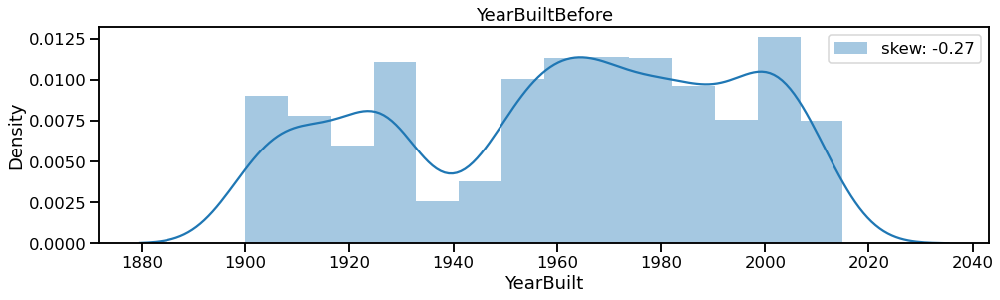

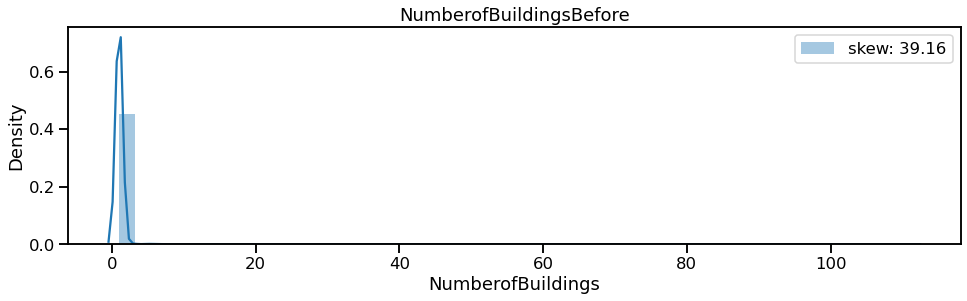

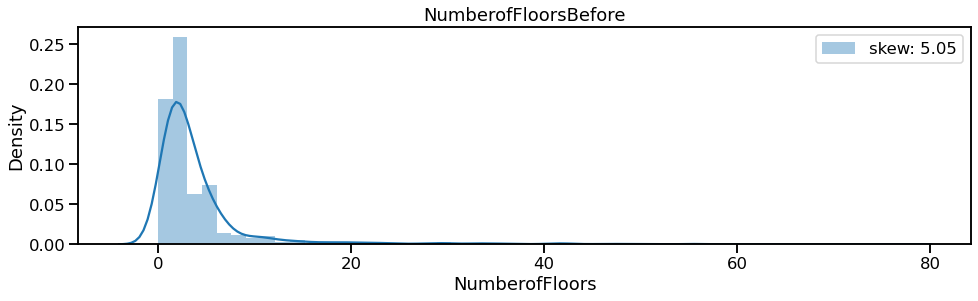

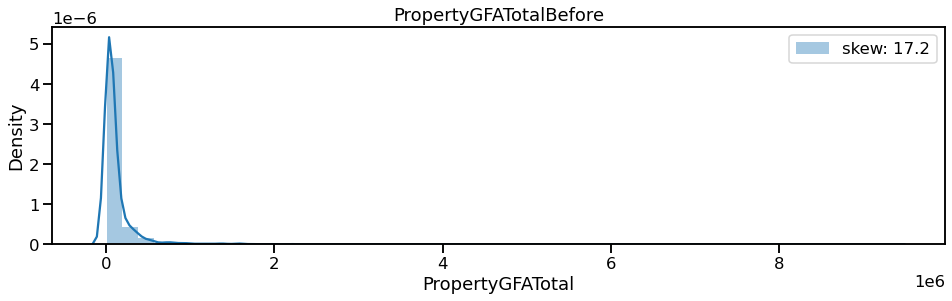

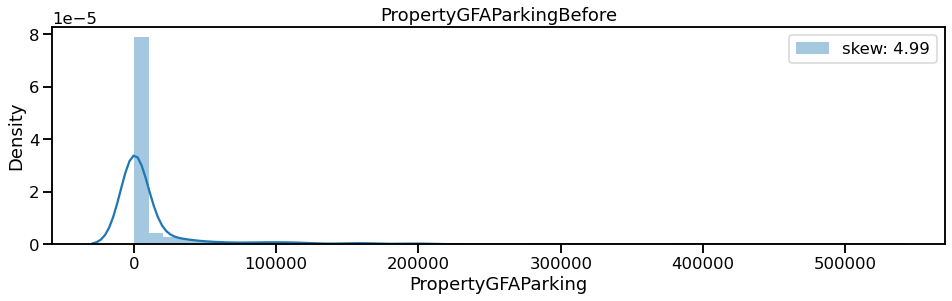

...

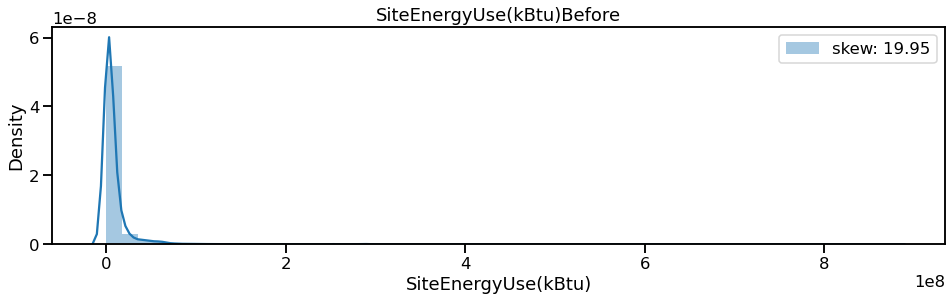

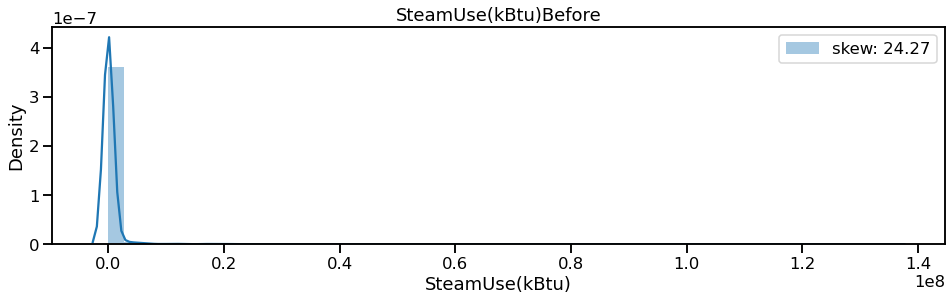

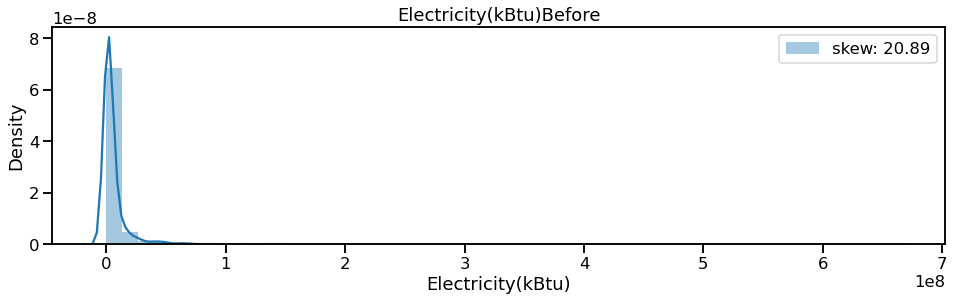

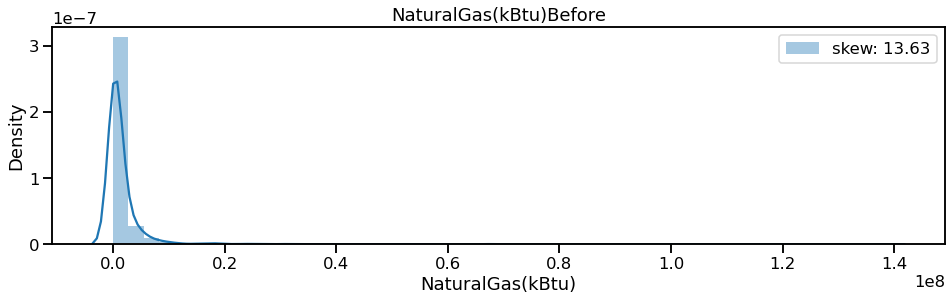

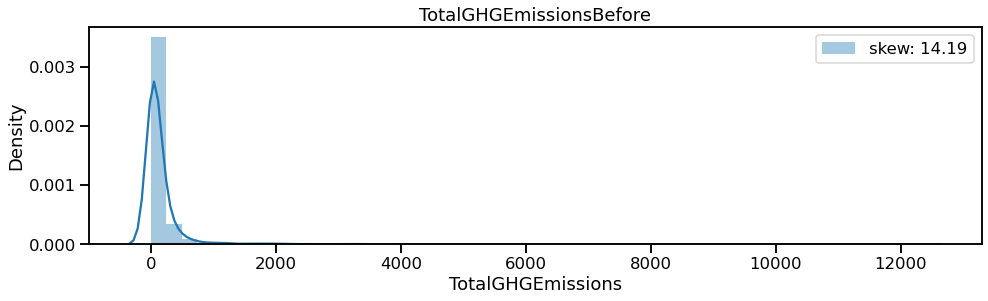

In [167]:
# réprésentation avec un displot avant transformation logarithmique
for col in to_log :
    plt.figure(figsize=(16, 4))
    sns.distplot(df[col], label="skew: "+str(np.round(df[col].skew(),2)))
    plt.title(col + "Before")
    plt.legend()

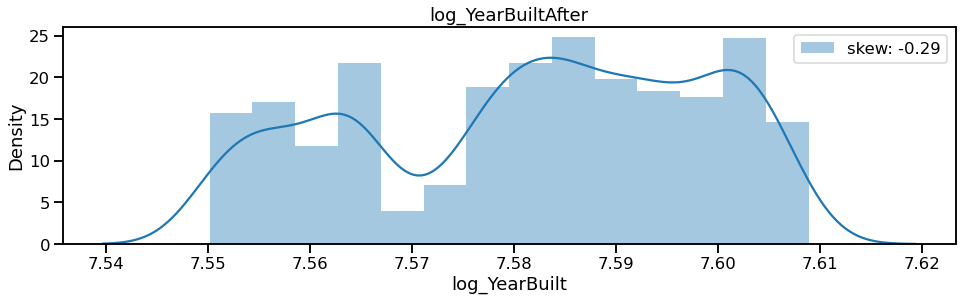

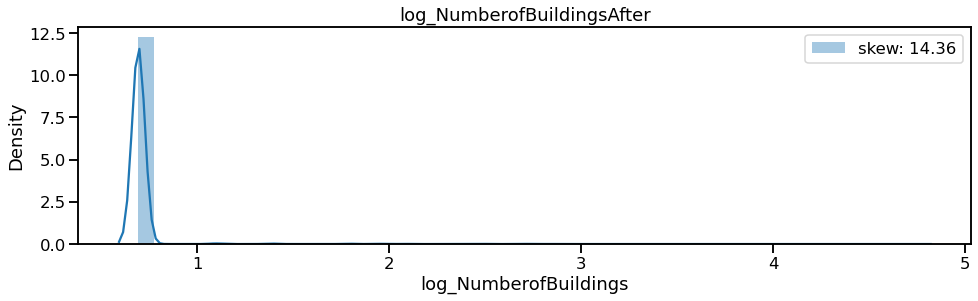

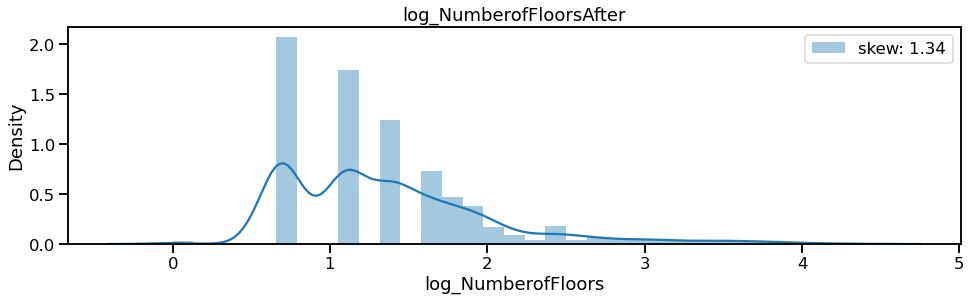

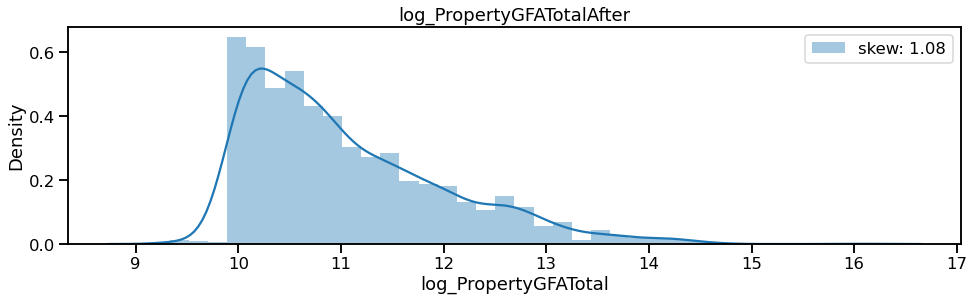

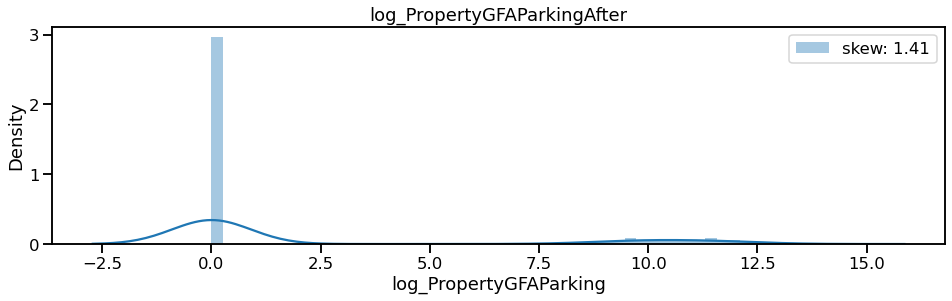

...

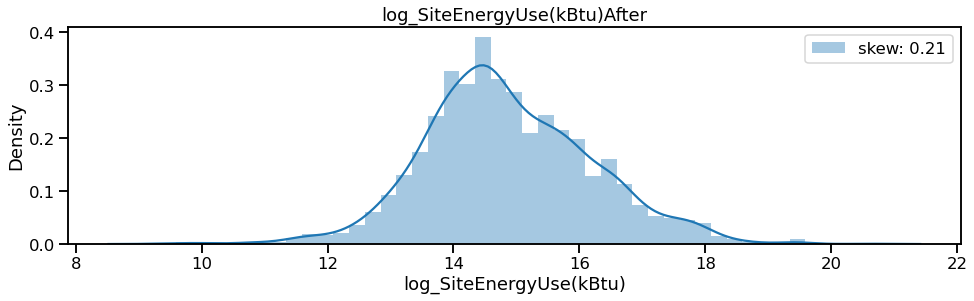

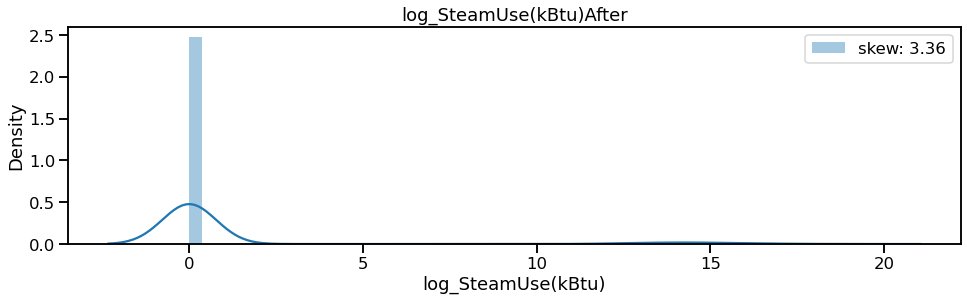

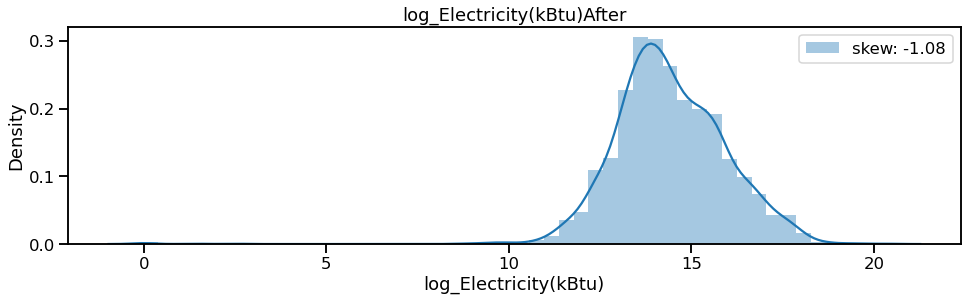

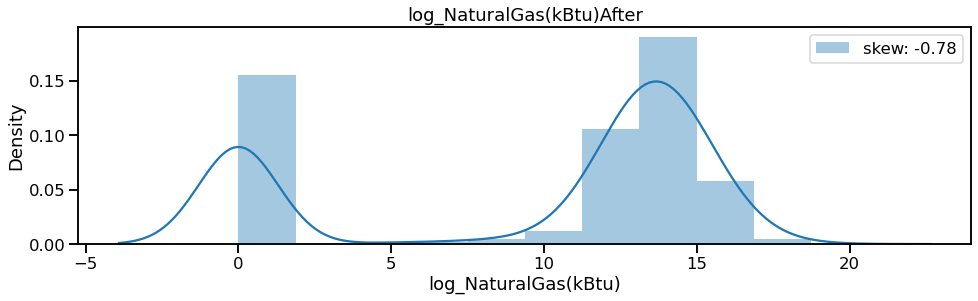

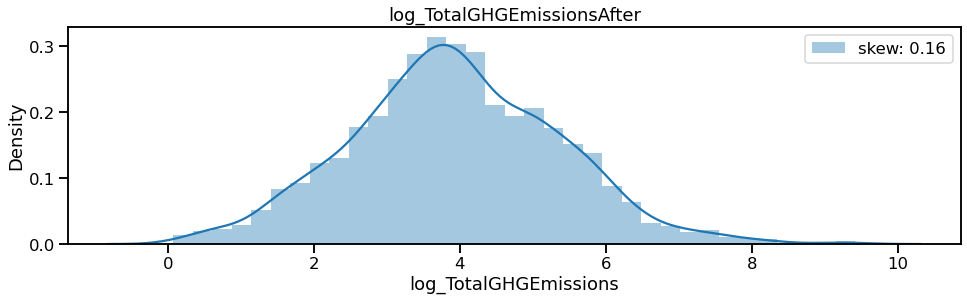

In [168]:
# réprésentation avec un displot après transformation logarithmique
for col in log : 
    plt.figure(figsize=(16, 4))
    sns.distplot(df_log[col], label="skew: "+str(np.round(df_log [col].skew(),2)))
    plt.title(col + "After")
    plt.legend()
    plt.show()

In [169]:
df_primary_type = df[[ 'PrimaryPropertyType','SecondLargestPropertyUseType', 'ThirdLargestPropertyUseType']]

In [170]:
# concat les deux variables à prédire et PrimaryPropertyType
df_log = pd.concat([df_log, df_primary_type],  axis=1)

# Analyse Outliers


In [171]:
PrimaryPropertyType = pd.concat(
    [df['PrimaryPropertyType'], df['SecondLargestPropertyUseType'], df['ThirdLargestPropertyUseType']]).unique()

In [172]:
PrimaryPropertyType

array(['Hotel', 'Other', 'Mixed Use Property', 'University',
       'K-12 School', 'Small- and Mid-Sized Office',
       'Self-Storage Facility', 'Large Office', 'Medical Office',
       'Retail Store', 'Hospital', 'Warehouse', 'Distribution Center',
       'Worship Facility', 'Supermarket / Grocery Store',
       'Refrigerated Warehouse', 'Restaurant', 'Laboratory', 'nan',
       'Parking', 'Other - Education', 'Vocational School',
       'Other - Entertainment/Public Assembly', 'Data Center',
       'Swimming Pool', 'Courthouse', 'Residence Hall', 'Movie Theater',
       'Other - Services', 'Other - Recreation',
       'Convenience Store without Gas Station',
       'Fitness Center/Health Club/Gym', 'Performing Arts',
       'Other - Restaurant/Bar', 'Adult Education', 'Bar/Nightclub',
       'Financial Office',
       'Repair Services (Vehicle, Shoe, Locksmith, etc)',
       'Other - Lodging/Residential', 'Bank Branch',
       'Multifamily Housing', 'Food Sales', 'Other - Public Ser

pour le groupe Hotel et la feature log_YearBuilt
il y a 0 outliers


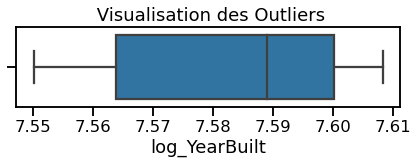

pour le groupe Hotel et la feature log_NumberofBuildings
il y a 1 outliers


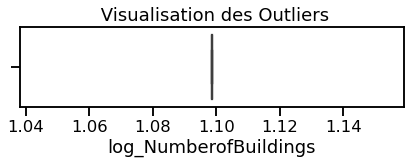

pour le groupe Hotel et la feature log_NumberofFloors
il y a 0 outliers


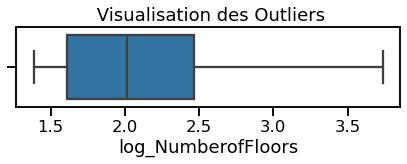

pour le groupe Hotel et la feature log_PropertyGFATotal
il y a 6 outliers


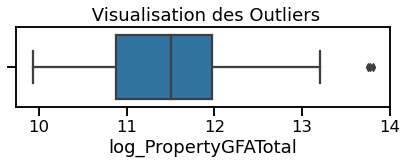

pour le groupe Hotel et la feature log_PropertyGFAParking
il y a 0 outliers


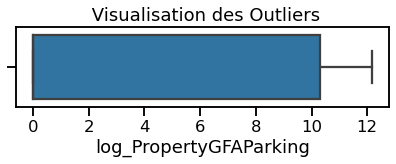

pour le groupe Hotel et la feature log_PropertyGFABuilding(s)
il y a 8 outliers


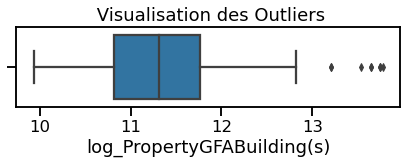

pour le groupe Hotel et la feature log_LargestPropertyUseTypeGFA
il y a 5 outliers


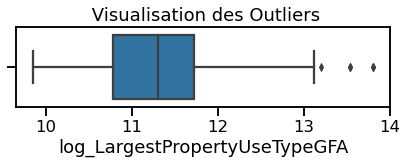

pour le groupe Hotel et la feature log_SiteEUI(kBtu/sf)
il y a 6 outliers


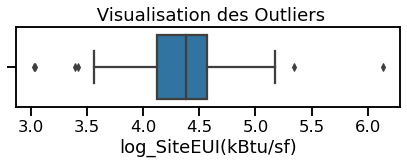

pour le groupe Hotel et la feature log_SourceEUI(kBtu/sf)
il y a 9 outliers


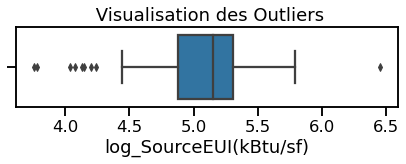

pour le groupe Hotel et la feature log_SiteEnergyUse(kBtu)
il y a 13 outliers


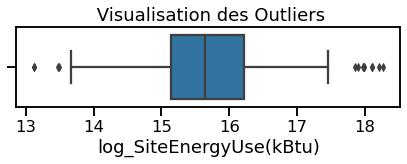

pour le groupe Hotel et la feature log_SteamUse(kBtu)
il y a 26 outliers


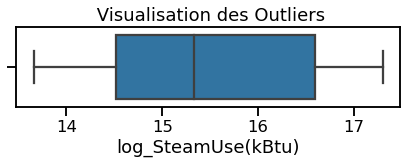

pour le groupe Hotel et la feature log_Electricity(kBtu)
il y a 8 outliers


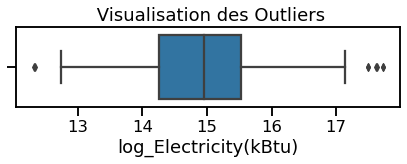

pour le groupe Hotel et la feature log_NaturalGas(kBtu)
il y a 6 outliers


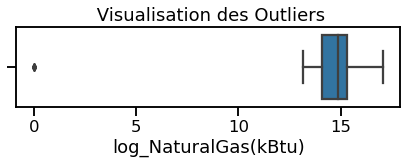

pour le groupe Hotel et la feature log_TotalGHGEmissions
il y a 13 outliers


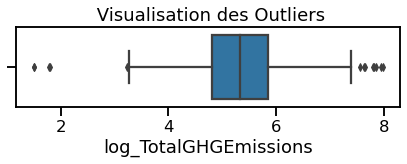

pour le groupe Other et la feature log_YearBuilt
il y a 0 outliers


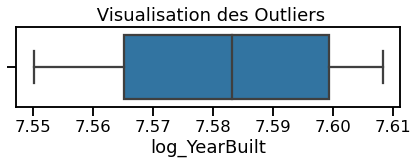

pour le groupe Other et la feature log_NumberofBuildings
il y a 11 outliers


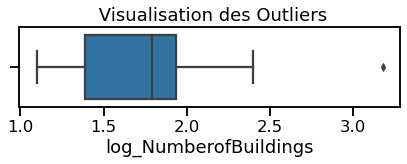

pour le groupe Other et la feature log_NumberofFloors
il y a 14 outliers


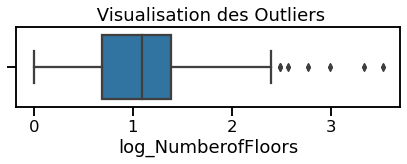

pour le groupe Other et la feature log_PropertyGFATotal
il y a 14 outliers


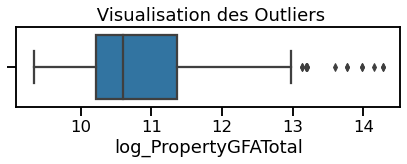

pour le groupe Other et la feature log_PropertyGFAParking
il y a 67 outliers


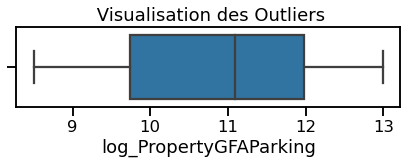

pour le groupe Other et la feature log_PropertyGFABuilding(s)
il y a 25 outliers


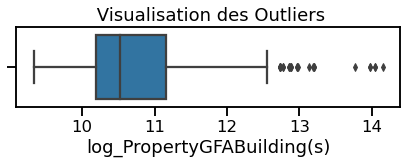

pour le groupe Other et la feature log_LargestPropertyUseTypeGFA
il y a 19 outliers


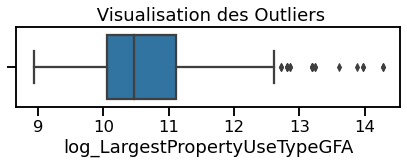

pour le groupe Other et la feature log_SiteEUI(kBtu/sf)
il y a 18 outliers


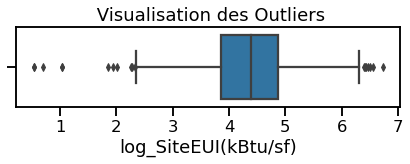

pour le groupe Other et la feature log_SourceEUI(kBtu/sf)
il y a 14 outliers


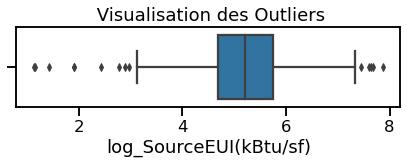

pour le groupe Other et la feature log_SiteEnergyUse(kBtu)
il y a 10 outliers


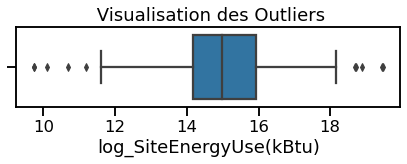

pour le groupe Other et la feature log_SteamUse(kBtu)
il y a 47 outliers


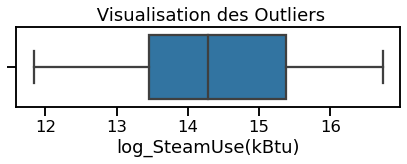

pour le groupe Other et la feature log_Electricity(kBtu)
il y a 8 outliers


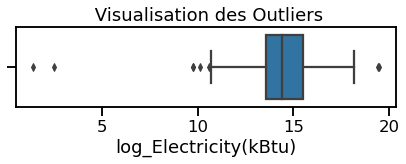

pour le groupe Other et la feature log_NaturalGas(kBtu)
il y a 97 outliers


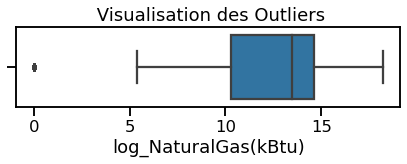

pour le groupe Other et la feature log_TotalGHGEmissions
il y a 8 outliers


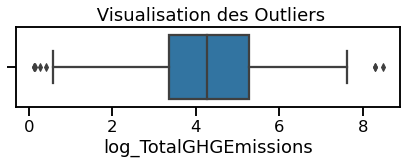

pour le groupe Mixed Use Property et la feature log_YearBuilt
il y a 0 outliers


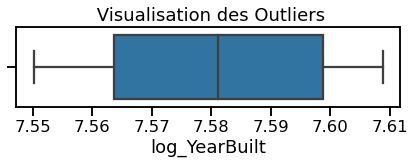

pour le groupe Mixed Use Property et la feature log_NumberofBuildings
il y a 1 outliers


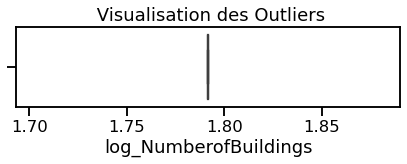

pour le groupe Mixed Use Property et la feature log_NumberofFloors
il y a 0 outliers


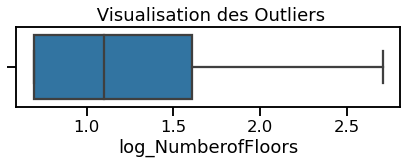

pour le groupe Mixed Use Property et la feature log_PropertyGFATotal
il y a 4 outliers


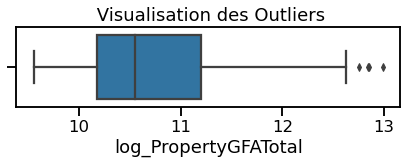

pour le groupe Mixed Use Property et la feature log_PropertyGFAParking
il y a 0 outliers


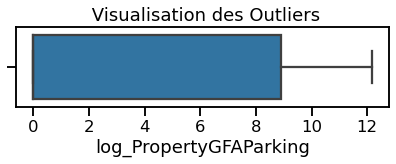

pour le groupe Mixed Use Property et la feature log_PropertyGFABuilding(s)
il y a 4 outliers


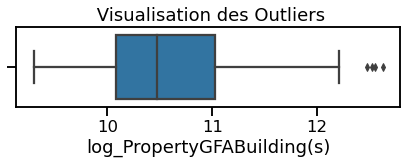

pour le groupe Mixed Use Property et la feature log_LargestPropertyUseTypeGFA
il y a 5 outliers


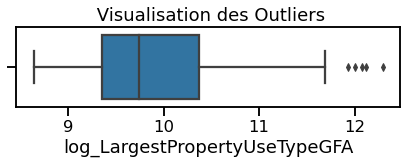

pour le groupe Mixed Use Property et la feature log_SiteEUI(kBtu/sf)
il y a 4 outliers


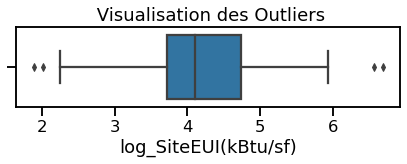

pour le groupe Mixed Use Property et la feature log_SourceEUI(kBtu/sf)
il y a 6 outliers


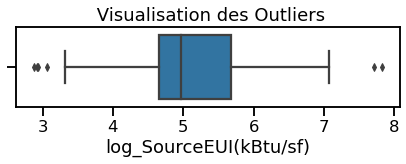

pour le groupe Mixed Use Property et la feature log_SiteEnergyUse(kBtu)
il y a 4 outliers


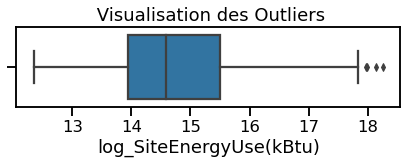

pour le groupe Mixed Use Property et la feature log_SteamUse(kBtu)
il y a 7 outliers


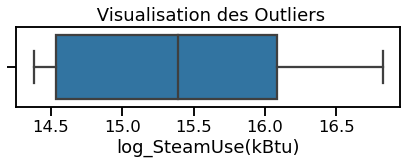

pour le groupe Mixed Use Property et la feature log_Electricity(kBtu)
il y a 5 outliers


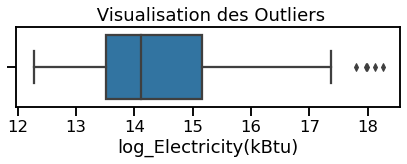

pour le groupe Mixed Use Property et la feature log_NaturalGas(kBtu)
il y a 37 outliers


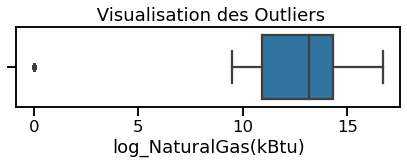

pour le groupe Mixed Use Property et la feature log_TotalGHGEmissions
il y a 0 outliers


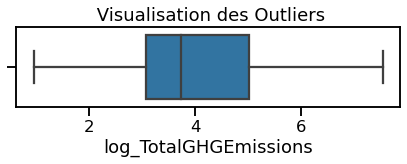

pour le groupe University et la feature log_YearBuilt
il y a 0 outliers


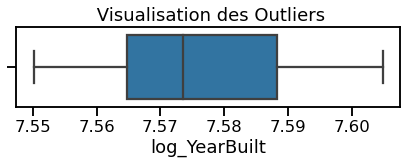

pour le groupe University et la feature log_NumberofBuildings
il y a 7 outliers


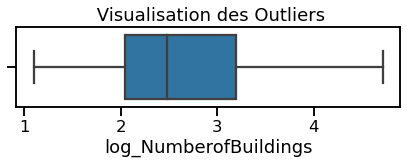

pour le groupe University et la feature log_NumberofFloors
il y a 3 outliers


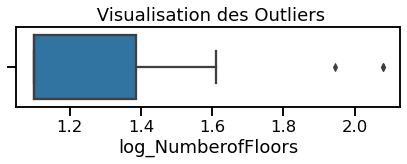

pour le groupe University et la feature log_PropertyGFATotal
il y a 3 outliers


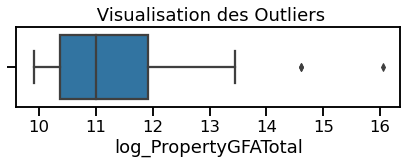

pour le groupe University et la feature log_PropertyGFAParking
il y a 4 outliers


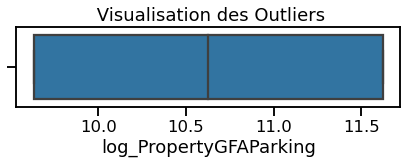

pour le groupe University et la feature log_PropertyGFABuilding(s)
il y a 3 outliers


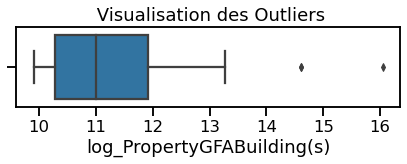

pour le groupe University et la feature log_LargestPropertyUseTypeGFA
il y a 1 outliers


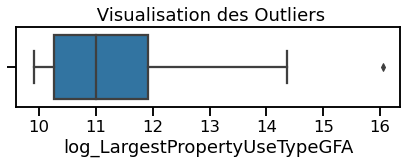

pour le groupe University et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


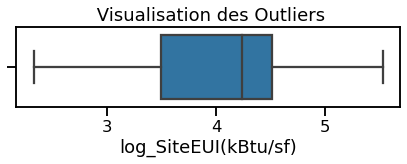

pour le groupe University et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


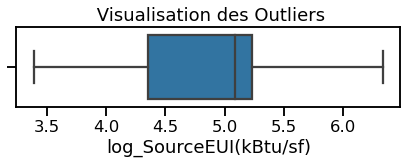

pour le groupe University et la feature log_SiteEnergyUse(kBtu)
il y a 1 outliers


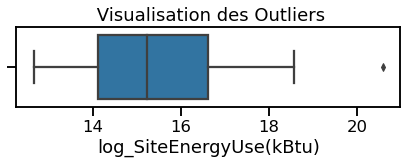

pour le groupe University et la feature log_SteamUse(kBtu)
il y a 1 outliers


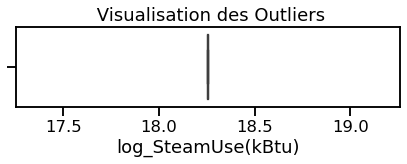

pour le groupe University et la feature log_Electricity(kBtu)
il y a 1 outliers


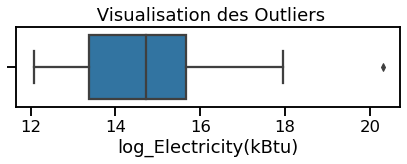

pour le groupe University et la feature log_NaturalGas(kBtu)
il y a 4 outliers


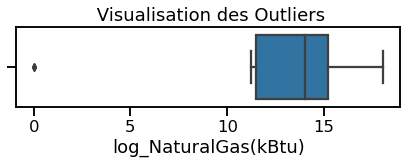

pour le groupe University et la feature log_TotalGHGEmissions
il y a 0 outliers


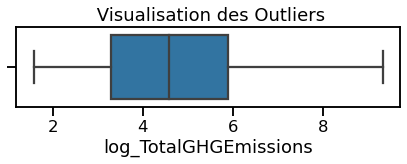

pour le groupe K-12 School et la feature log_YearBuilt
il y a 0 outliers


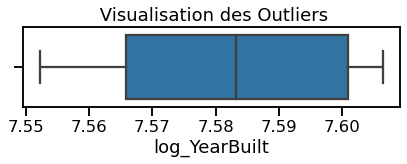

pour le groupe K-12 School et la feature log_NumberofBuildings
il y a 0 outliers


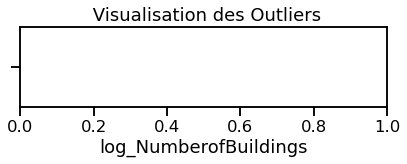

pour le groupe K-12 School et la feature log_NumberofFloors
il y a 2 outliers


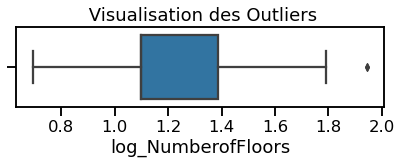

pour le groupe K-12 School et la feature log_PropertyGFATotal
il y a 2 outliers


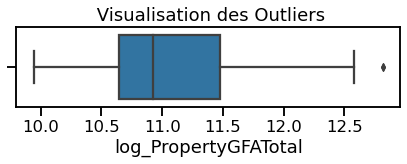

pour le groupe K-12 School et la feature log_PropertyGFAParking
il y a 0 outliers


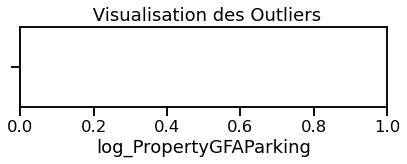

pour le groupe K-12 School et la feature log_PropertyGFABuilding(s)
il y a 2 outliers


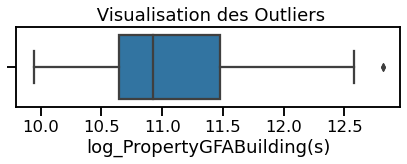

pour le groupe K-12 School et la feature log_LargestPropertyUseTypeGFA
il y a 2 outliers


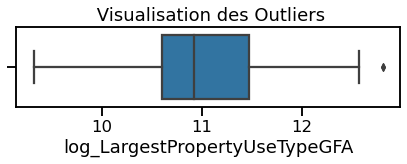

pour le groupe K-12 School et la feature log_SiteEUI(kBtu/sf)
il y a 7 outliers


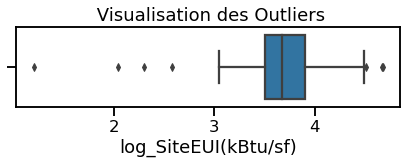

pour le groupe K-12 School et la feature log_SourceEUI(kBtu/sf)
il y a 16 outliers


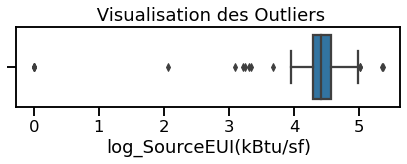

pour le groupe K-12 School et la feature log_SiteEnergyUse(kBtu)
il y a 8 outliers


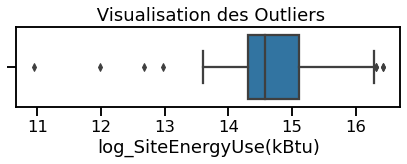

pour le groupe K-12 School et la feature log_SteamUse(kBtu)
il y a 2 outliers


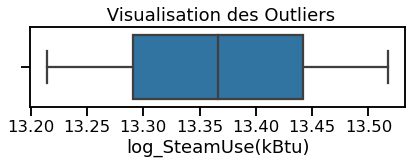

pour le groupe K-12 School et la feature log_Electricity(kBtu)
il y a 5 outliers


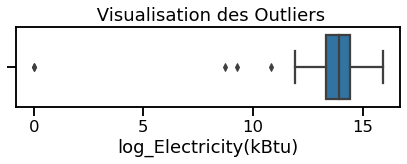

pour le groupe K-12 School et la feature log_NaturalGas(kBtu)
il y a 13 outliers


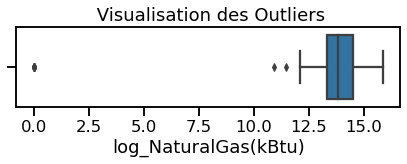

pour le groupe K-12 School et la feature log_TotalGHGEmissions
il y a 5 outliers


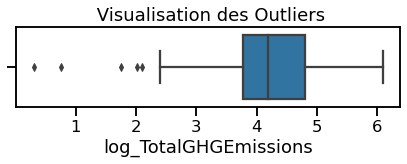

pour le groupe Small- and Mid-Sized Office et la feature log_YearBuilt
il y a 0 outliers


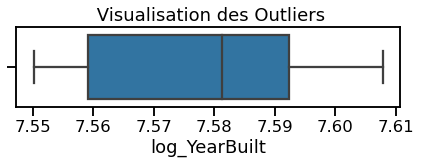

pour le groupe Small- and Mid-Sized Office et la feature log_NumberofBuildings
il y a 3 outliers


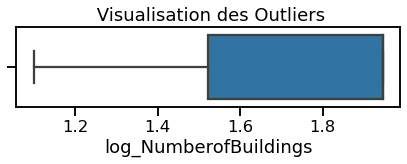

pour le groupe Small- and Mid-Sized Office et la feature log_NumberofFloors
il y a 3 outliers


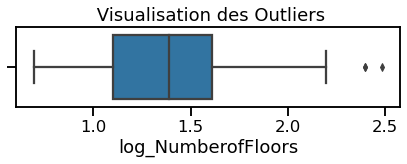

pour le groupe Small- and Mid-Sized Office et la feature log_PropertyGFATotal
il y a 0 outliers


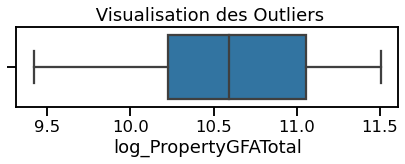

pour le groupe Small- and Mid-Sized Office et la feature log_PropertyGFAParking
il y a 129 outliers


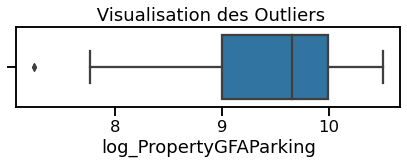

pour le groupe Small- and Mid-Sized Office et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


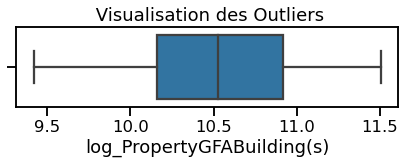

pour le groupe Small- and Mid-Sized Office et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


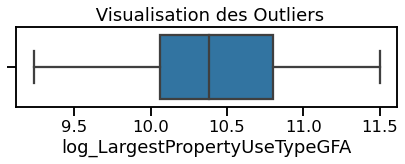

pour le groupe Small- and Mid-Sized Office et la feature log_SiteEUI(kBtu/sf)
il y a 19 outliers


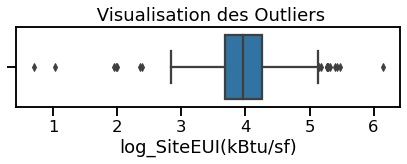

pour le groupe Small- and Mid-Sized Office et la feature log_SourceEUI(kBtu/sf)
il y a 27 outliers


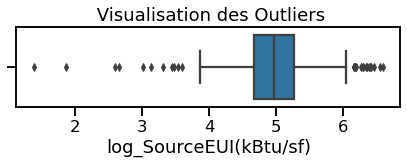

pour le groupe Small- and Mid-Sized Office et la feature log_SiteEnergyUse(kBtu)
il y a 8 outliers


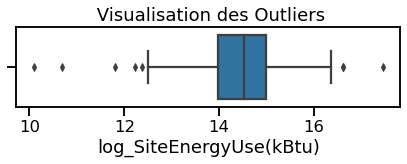

pour le groupe Small- and Mid-Sized Office et la feature log_SteamUse(kBtu)
il y a 32 outliers


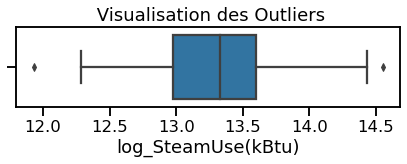

pour le groupe Small- and Mid-Sized Office et la feature log_Electricity(kBtu)
il y a 11 outliers


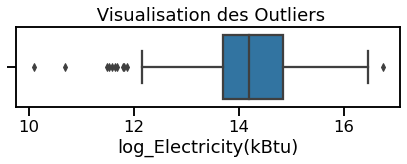

pour le groupe Small- and Mid-Sized Office et la feature log_NaturalGas(kBtu)
il y a 0 outliers


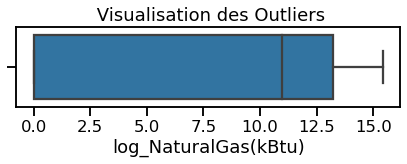

pour le groupe Small- and Mid-Sized Office et la feature log_TotalGHGEmissions
il y a 4 outliers


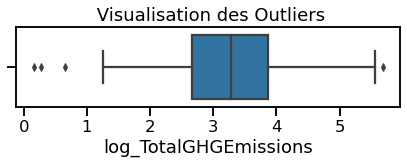

pour le groupe Self-Storage Facility et la feature log_YearBuilt
il y a 0 outliers


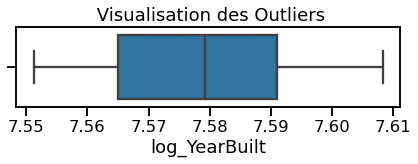

pour le groupe Self-Storage Facility et la feature log_NumberofBuildings
il y a 1 outliers


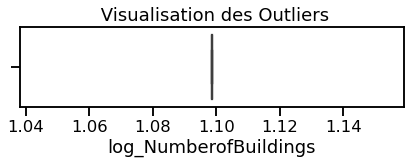

pour le groupe Self-Storage Facility et la feature log_NumberofFloors
il y a 0 outliers


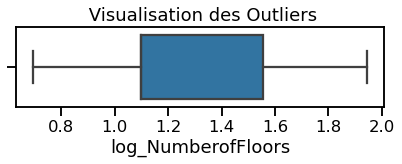

pour le groupe Self-Storage Facility et la feature log_PropertyGFATotal
il y a 0 outliers


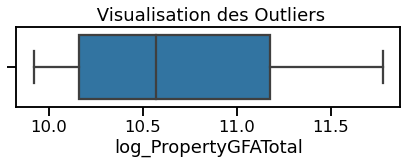

pour le groupe Self-Storage Facility et la feature log_PropertyGFAParking
il y a 8 outliers


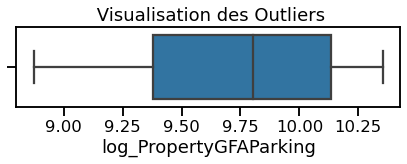

pour le groupe Self-Storage Facility et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


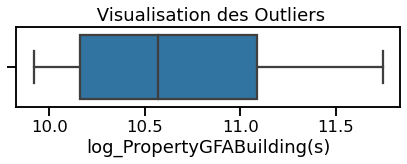

pour le groupe Self-Storage Facility et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


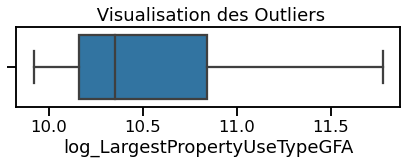

pour le groupe Self-Storage Facility et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


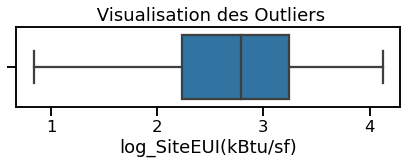

pour le groupe Self-Storage Facility et la feature log_SourceEUI(kBtu/sf)
il y a 2 outliers


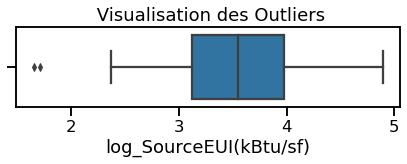

pour le groupe Self-Storage Facility et la feature log_SiteEnergyUse(kBtu)
il y a 2 outliers


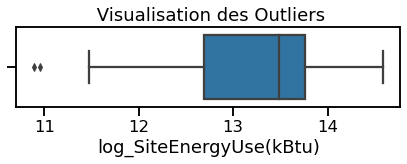

pour le groupe Self-Storage Facility et la feature log_SteamUse(kBtu)
il y a 0 outliers


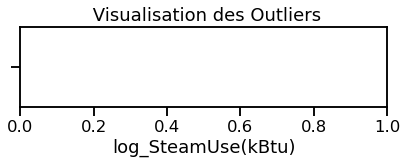

pour le groupe Self-Storage Facility et la feature log_Electricity(kBtu)
il y a 0 outliers


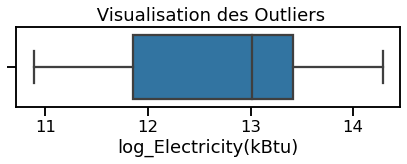

pour le groupe Self-Storage Facility et la feature log_NaturalGas(kBtu)
il y a 0 outliers


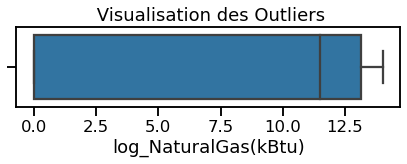

pour le groupe Self-Storage Facility et la feature log_TotalGHGEmissions
il y a 0 outliers


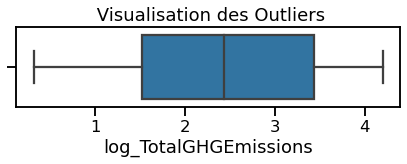

pour le groupe Large Office et la feature log_YearBuilt
il y a 17 outliers


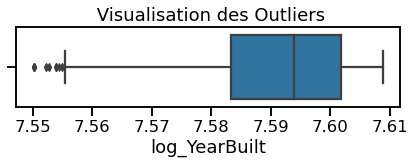

pour le groupe Large Office et la feature log_NumberofBuildings
il y a 3 outliers


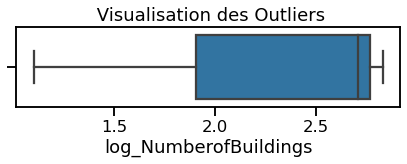

pour le groupe Large Office et la feature log_NumberofFloors
il y a 0 outliers


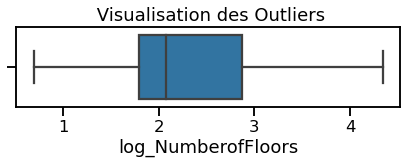

pour le groupe Large Office et la feature log_PropertyGFATotal
il y a 6 outliers


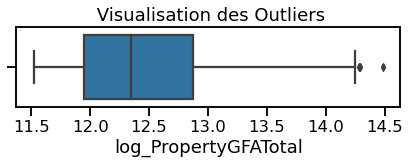

pour le groupe Large Office et la feature log_PropertyGFAParking
il y a 0 outliers


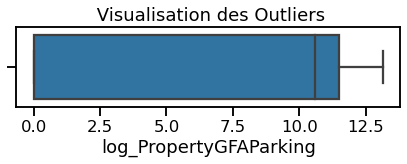

pour le groupe Large Office et la feature log_PropertyGFABuilding(s)
il y a 3 outliers


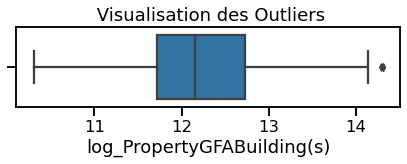

pour le groupe Large Office et la feature log_LargestPropertyUseTypeGFA
il y a 2 outliers


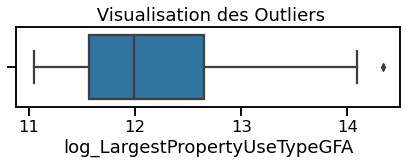

pour le groupe Large Office et la feature log_SiteEUI(kBtu/sf)
il y a 21 outliers


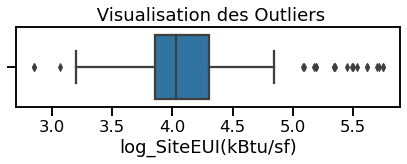

pour le groupe Large Office et la feature log_SourceEUI(kBtu/sf)
il y a 23 outliers


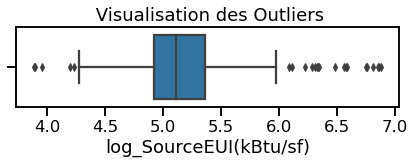

pour le groupe Large Office et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


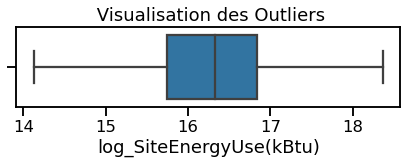

pour le groupe Large Office et la feature log_SteamUse(kBtu)
il y a 60 outliers


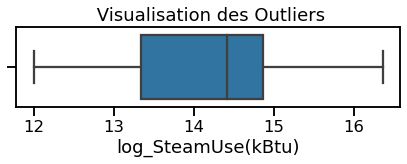

pour le groupe Large Office et la feature log_Electricity(kBtu)
il y a 1 outliers


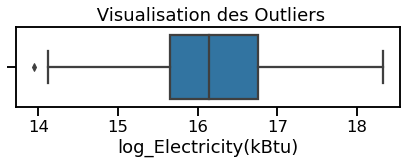

pour le groupe Large Office et la feature log_NaturalGas(kBtu)
il y a 0 outliers


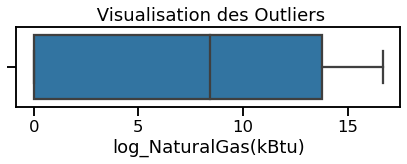

pour le groupe Large Office et la feature log_TotalGHGEmissions
il y a 0 outliers


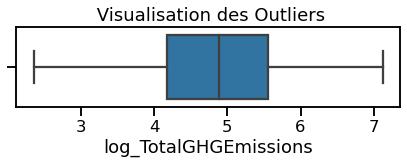

pour le groupe Medical Office et la feature log_YearBuilt
il y a 4 outliers


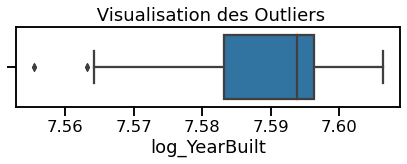

pour le groupe Medical Office et la feature log_NumberofBuildings
il y a 1 outliers


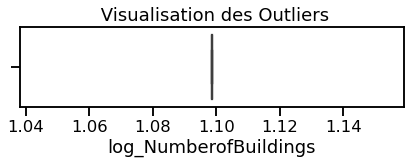

pour le groupe Medical Office et la feature log_NumberofFloors
il y a 9 outliers


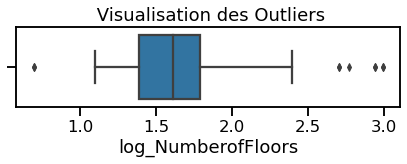

pour le groupe Medical Office et la feature log_PropertyGFATotal
il y a 0 outliers


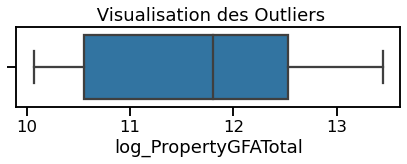

pour le groupe Medical Office et la feature log_PropertyGFAParking
il y a 0 outliers


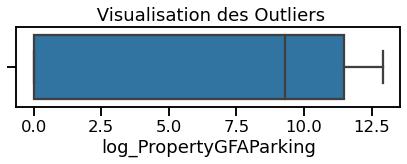

pour le groupe Medical Office et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


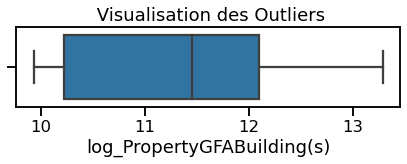

pour le groupe Medical Office et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


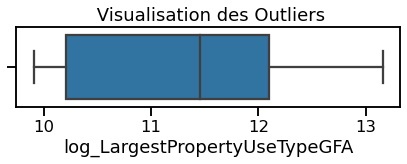

pour le groupe Medical Office et la feature log_SiteEUI(kBtu/sf)
il y a 4 outliers


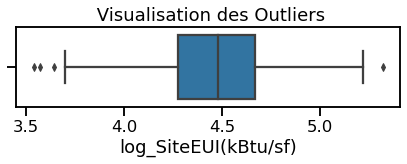

pour le groupe Medical Office et la feature log_SourceEUI(kBtu/sf)
il y a 3 outliers


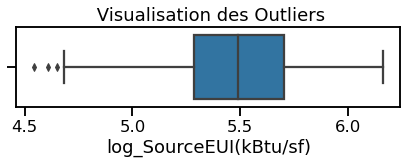

pour le groupe Medical Office et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


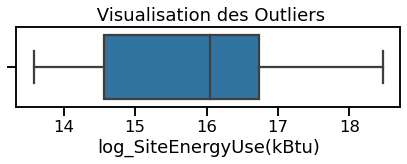

pour le groupe Medical Office et la feature log_SteamUse(kBtu)
il y a 12 outliers


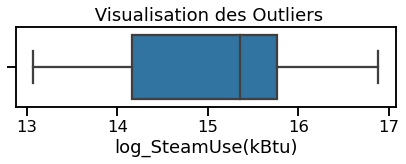

pour le groupe Medical Office et la feature log_Electricity(kBtu)
il y a 0 outliers


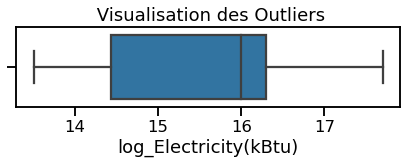

pour le groupe Medical Office et la feature log_NaturalGas(kBtu)
il y a 0 outliers


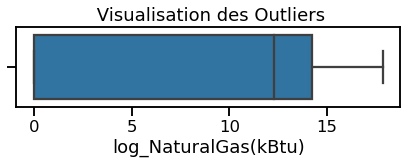

pour le groupe Medical Office et la feature log_TotalGHGEmissions
il y a 0 outliers


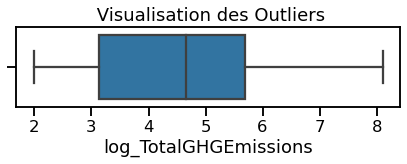

pour le groupe Retail Store et la feature log_YearBuilt
il y a 0 outliers


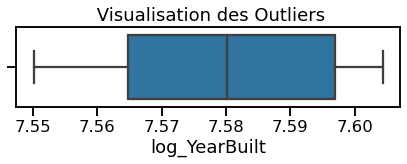

pour le groupe Retail Store et la feature log_NumberofBuildings
il y a 0 outliers


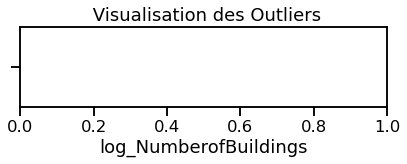

pour le groupe Retail Store et la feature log_NumberofFloors
il y a 5 outliers


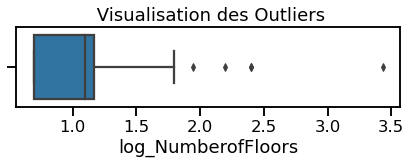

pour le groupe Retail Store et la feature log_PropertyGFATotal
il y a 5 outliers


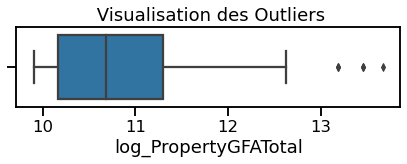

pour le groupe Retail Store et la feature log_PropertyGFAParking
il y a 9 outliers


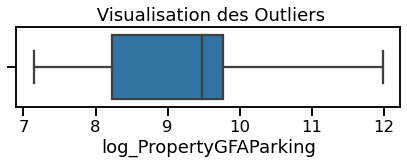

pour le groupe Retail Store et la feature log_PropertyGFABuilding(s)
il y a 5 outliers


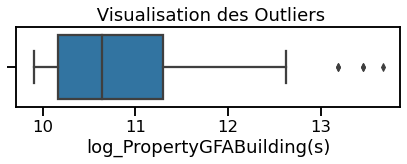

pour le groupe Retail Store et la feature log_LargestPropertyUseTypeGFA
il y a 5 outliers


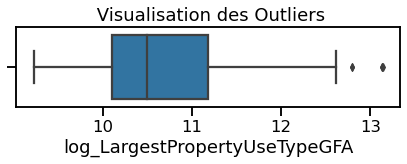

pour le groupe Retail Store et la feature log_SiteEUI(kBtu/sf)
il y a 3 outliers


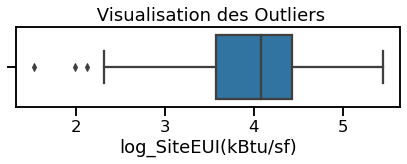

pour le groupe Retail Store et la feature log_SourceEUI(kBtu/sf)
il y a 3 outliers


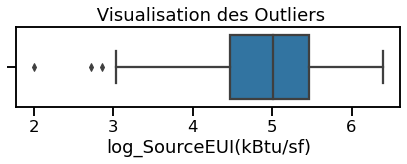

pour le groupe Retail Store et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


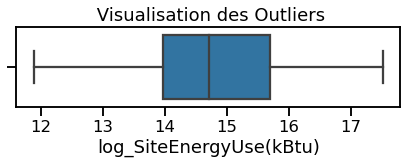

pour le groupe Retail Store et la feature log_SteamUse(kBtu)
il y a 3 outliers


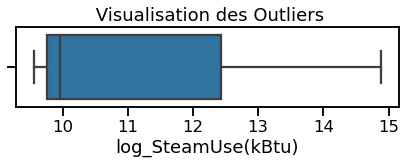

pour le groupe Retail Store et la feature log_Electricity(kBtu)
il y a 1 outliers


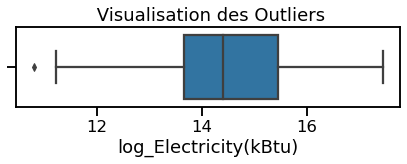

pour le groupe Retail Store et la feature log_NaturalGas(kBtu)
il y a 32 outliers


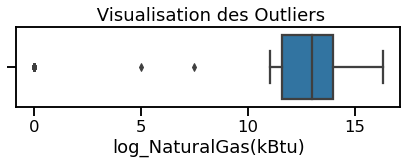

pour le groupe Retail Store et la feature log_TotalGHGEmissions
il y a 0 outliers


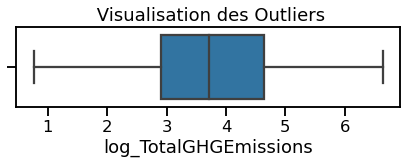

pour le groupe Hospital et la feature log_YearBuilt
il y a 2 outliers


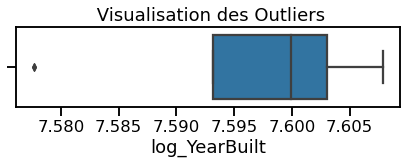

pour le groupe Hospital et la feature log_NumberofBuildings
il y a 2 outliers


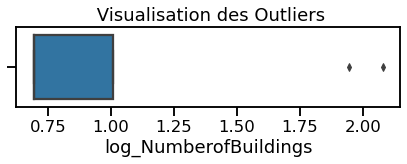

pour le groupe Hospital et la feature log_NumberofFloors
il y a 0 outliers


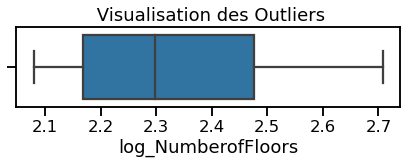

pour le groupe Hospital et la feature log_PropertyGFATotal
il y a 0 outliers


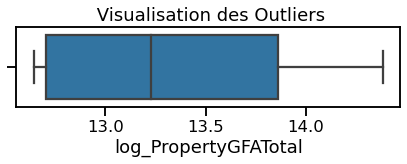

pour le groupe Hospital et la feature log_PropertyGFAParking
il y a 2 outliers


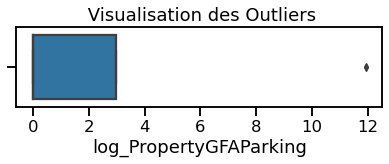

pour le groupe Hospital et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


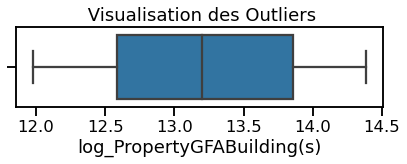

pour le groupe Hospital et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


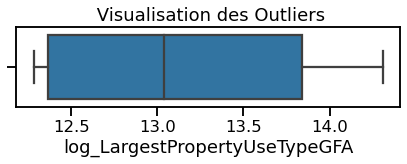

pour le groupe Hospital et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


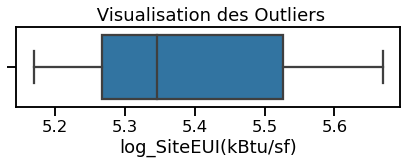

pour le groupe Hospital et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


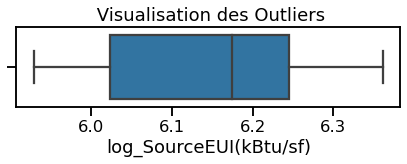

pour le groupe Hospital et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


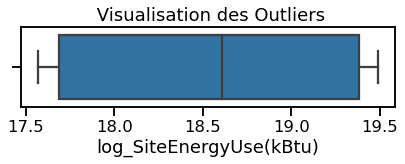

pour le groupe Hospital et la feature log_SteamUse(kBtu)
il y a 2 outliers


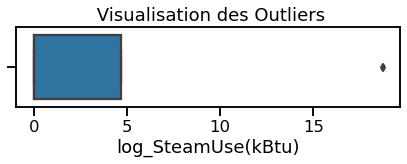

pour le groupe Hospital et la feature log_Electricity(kBtu)
il y a 0 outliers


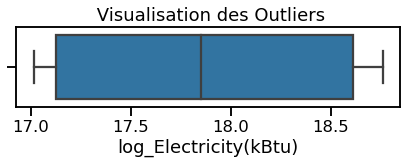

pour le groupe Hospital et la feature log_NaturalGas(kBtu)
il y a 0 outliers


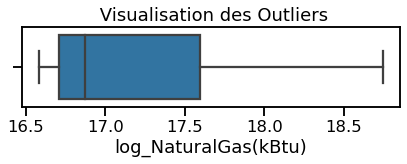

pour le groupe Hospital et la feature log_TotalGHGEmissions
il y a 0 outliers


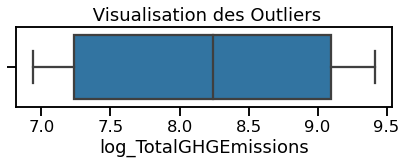

pour le groupe Warehouse et la feature log_YearBuilt
il y a 0 outliers


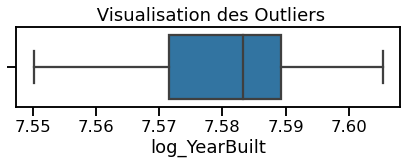

pour le groupe Warehouse et la feature log_NumberofBuildings
il y a 2 outliers


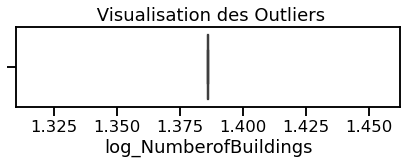

pour le groupe Warehouse et la feature log_NumberofFloors
il y a 10 outliers


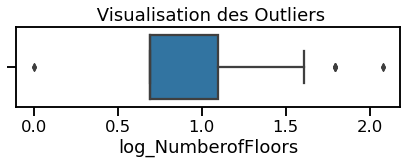

pour le groupe Warehouse et la feature log_PropertyGFATotal
il y a 7 outliers


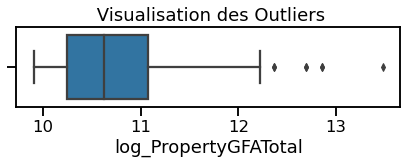

pour le groupe Warehouse et la feature log_PropertyGFAParking
il y a 5 outliers


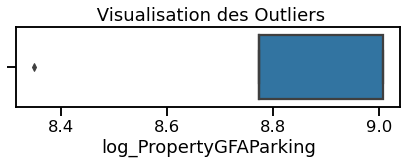

pour le groupe Warehouse et la feature log_PropertyGFABuilding(s)
il y a 7 outliers


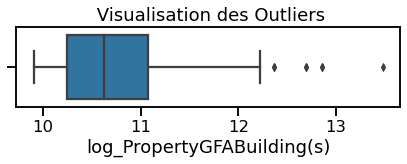

pour le groupe Warehouse et la feature log_LargestPropertyUseTypeGFA
il y a 7 outliers


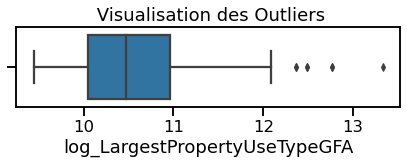

pour le groupe Warehouse et la feature log_SiteEUI(kBtu/sf)
il y a 1 outliers


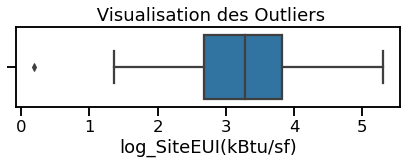

pour le groupe Warehouse et la feature log_SourceEUI(kBtu/sf)
il y a 4 outliers


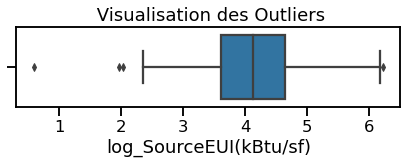

pour le groupe Warehouse et la feature log_SiteEnergyUse(kBtu)
il y a 6 outliers


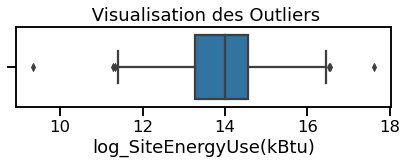

pour le groupe Warehouse et la feature log_SteamUse(kBtu)
il y a 0 outliers


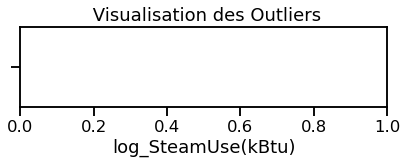

pour le groupe Warehouse et la feature log_Electricity(kBtu)
il y a 8 outliers


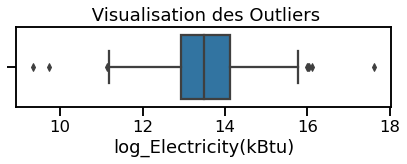

pour le groupe Warehouse et la feature log_NaturalGas(kBtu)
il y a 0 outliers


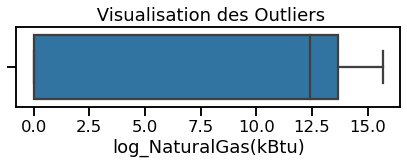

pour le groupe Warehouse et la feature log_TotalGHGEmissions
il y a 0 outliers


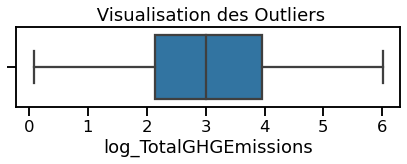

pour le groupe Distribution Center et la feature log_YearBuilt
il y a 8 outliers


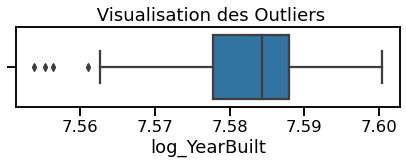

pour le groupe Distribution Center et la feature log_NumberofBuildings
il y a 1 outliers


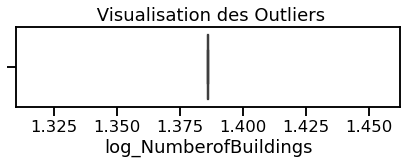

pour le groupe Distribution Center et la feature log_NumberofFloors
il y a 17 outliers


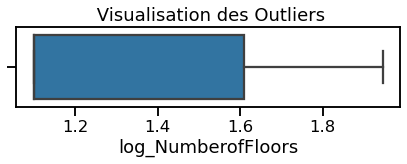

pour le groupe Distribution Center et la feature log_PropertyGFATotal
il y a 2 outliers


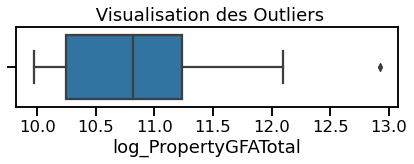

pour le groupe Distribution Center et la feature log_PropertyGFAParking
il y a 2 outliers


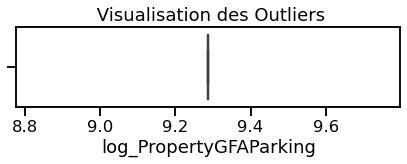

pour le groupe Distribution Center et la feature log_PropertyGFABuilding(s)
il y a 2 outliers


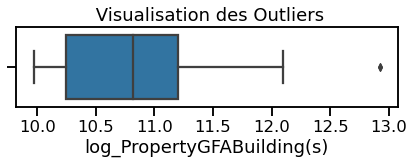

pour le groupe Distribution Center et la feature log_LargestPropertyUseTypeGFA
il y a 2 outliers


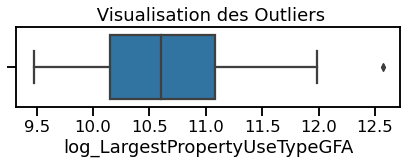

pour le groupe Distribution Center et la feature log_SiteEUI(kBtu/sf)
il y a 8 outliers


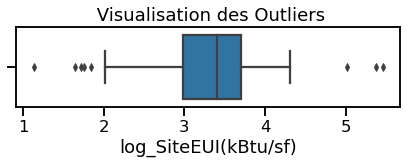

pour le groupe Distribution Center et la feature log_SourceEUI(kBtu/sf)
il y a 5 outliers


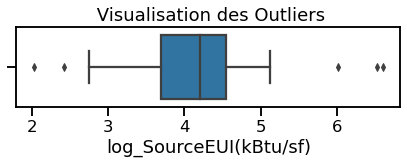

pour le groupe Distribution Center et la feature log_SiteEnergyUse(kBtu)
il y a 3 outliers


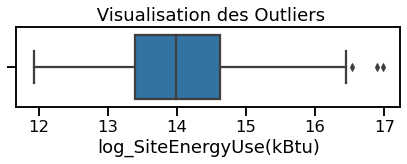

pour le groupe Distribution Center et la feature log_SteamUse(kBtu)
il y a 0 outliers


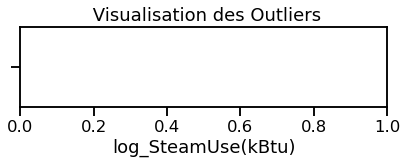

pour le groupe Distribution Center et la feature log_Electricity(kBtu)
il y a 6 outliers


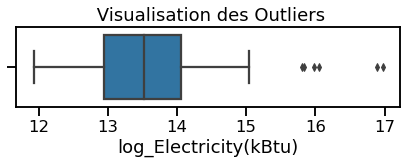

pour le groupe Distribution Center et la feature log_NaturalGas(kBtu)
il y a 17 outliers


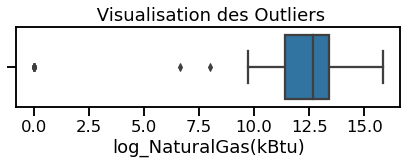

pour le groupe Distribution Center et la feature log_TotalGHGEmissions
il y a 2 outliers


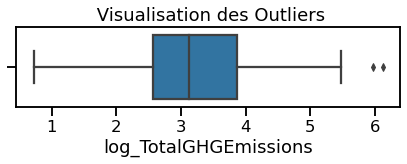

pour le groupe Worship Facility et la feature log_YearBuilt
il y a 0 outliers


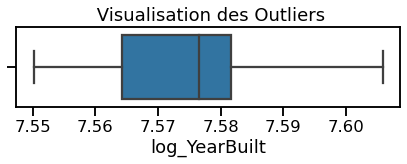

pour le groupe Worship Facility et la feature log_NumberofBuildings
il y a 0 outliers


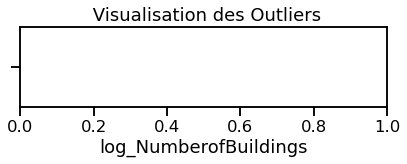

pour le groupe Worship Facility et la feature log_NumberofFloors
il y a 4 outliers


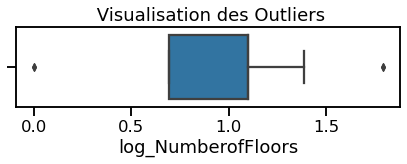

pour le groupe Worship Facility et la feature log_PropertyGFATotal
il y a 9 outliers


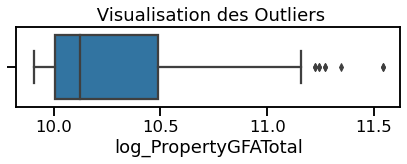

pour le groupe Worship Facility et la feature log_PropertyGFAParking
il y a 2 outliers


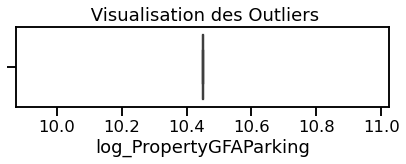

pour le groupe Worship Facility et la feature log_PropertyGFABuilding(s)
il y a 7 outliers


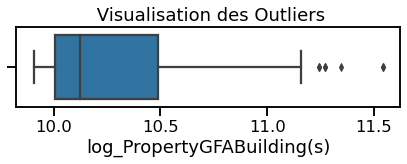

pour le groupe Worship Facility et la feature log_LargestPropertyUseTypeGFA
il y a 8 outliers


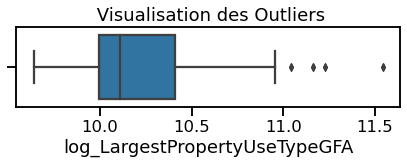

pour le groupe Worship Facility et la feature log_SiteEUI(kBtu/sf)
il y a 4 outliers


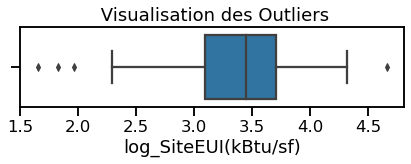

pour le groupe Worship Facility et la feature log_SourceEUI(kBtu/sf)
il y a 1 outliers


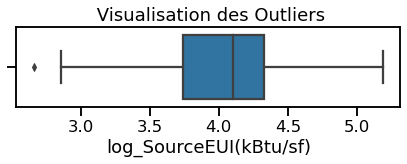

pour le groupe Worship Facility et la feature log_SiteEnergyUse(kBtu)
il y a 7 outliers


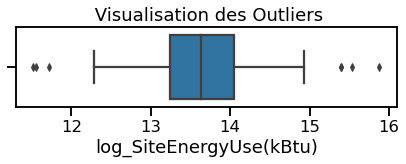

pour le groupe Worship Facility et la feature log_SteamUse(kBtu)
il y a 1 outliers


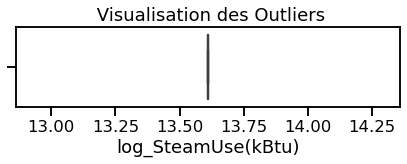

pour le groupe Worship Facility et la feature log_Electricity(kBtu)
il y a 0 outliers


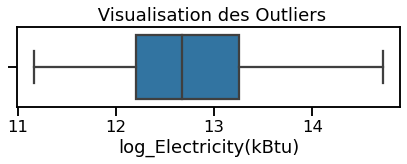

pour le groupe Worship Facility et la feature log_NaturalGas(kBtu)
il y a 19 outliers


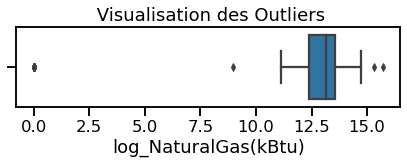

pour le groupe Worship Facility et la feature log_TotalGHGEmissions
il y a 10 outliers


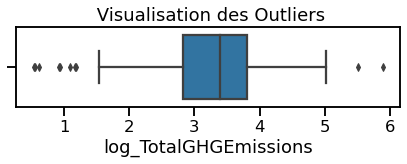

pour le groupe Supermarket / Grocery Store et la feature log_YearBuilt
il y a 0 outliers


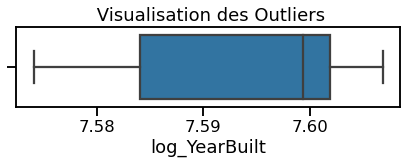

pour le groupe Supermarket / Grocery Store et la feature log_NumberofBuildings
il y a 0 outliers


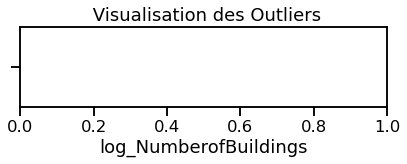

pour le groupe Supermarket / Grocery Store et la feature log_NumberofFloors
il y a 13 outliers


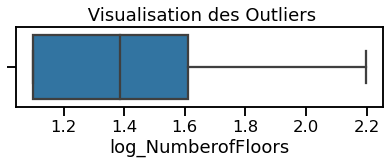

pour le groupe Supermarket / Grocery Store et la feature log_PropertyGFATotal
il y a 1 outliers


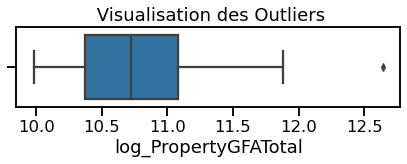

pour le groupe Supermarket / Grocery Store et la feature log_PropertyGFAParking
il y a 6 outliers


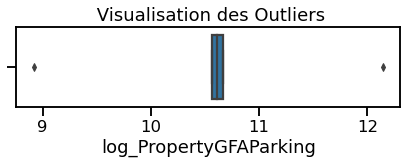

pour le groupe Supermarket / Grocery Store et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


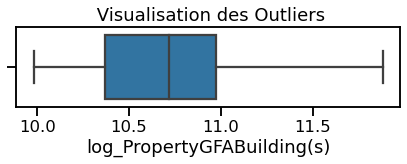

pour le groupe Supermarket / Grocery Store et la feature log_LargestPropertyUseTypeGFA
il y a 2 outliers


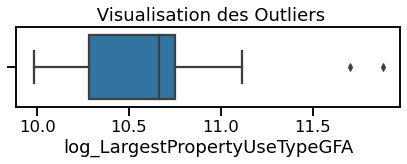

pour le groupe Supermarket / Grocery Store et la feature log_SiteEUI(kBtu/sf)
il y a 2 outliers


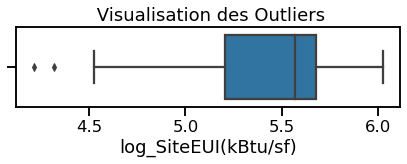

pour le groupe Supermarket / Grocery Store et la feature log_SourceEUI(kBtu/sf)
il y a 2 outliers


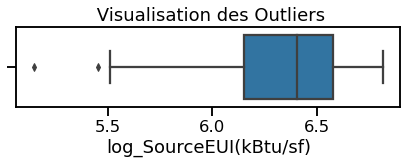

pour le groupe Supermarket / Grocery Store et la feature log_SiteEnergyUse(kBtu)
il y a 3 outliers


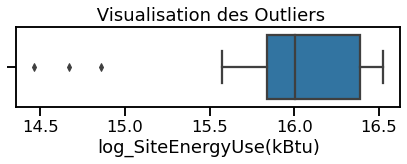

pour le groupe Supermarket / Grocery Store et la feature log_SteamUse(kBtu)
il y a 0 outliers


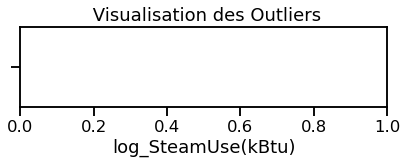

pour le groupe Supermarket / Grocery Store et la feature log_Electricity(kBtu)
il y a 3 outliers


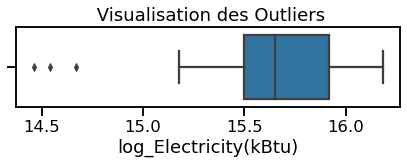

pour le groupe Supermarket / Grocery Store et la feature log_NaturalGas(kBtu)
il y a 6 outliers


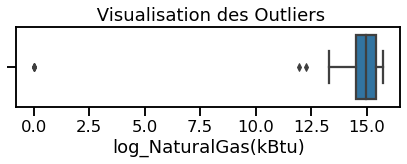

pour le groupe Supermarket / Grocery Store et la feature log_TotalGHGEmissions
il y a 3 outliers


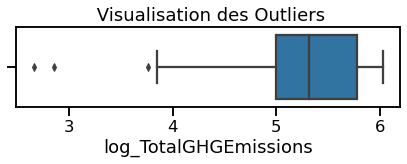

pour le groupe Refrigerated Warehouse et la feature log_YearBuilt
il y a 7 outliers


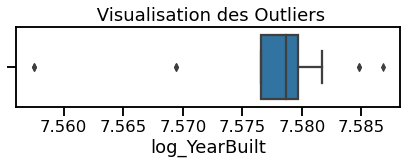

pour le groupe Refrigerated Warehouse et la feature log_NumberofBuildings
il y a 0 outliers


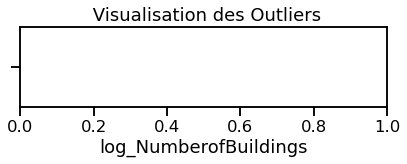

pour le groupe Refrigerated Warehouse et la feature log_NumberofFloors
il y a 0 outliers


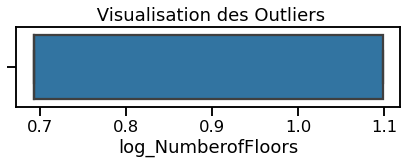

pour le groupe Refrigerated Warehouse et la feature log_PropertyGFATotal
il y a 2 outliers


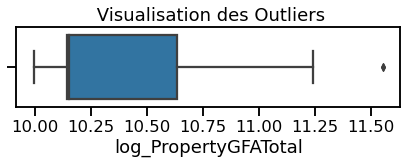

pour le groupe Refrigerated Warehouse et la feature log_PropertyGFAParking
il y a 0 outliers


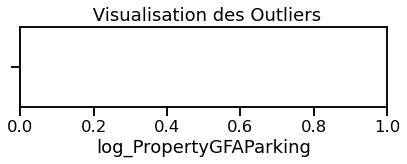

pour le groupe Refrigerated Warehouse et la feature log_PropertyGFABuilding(s)
il y a 2 outliers


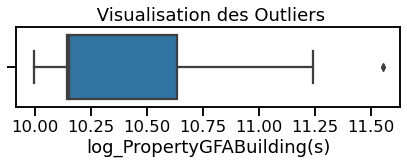

pour le groupe Refrigerated Warehouse et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


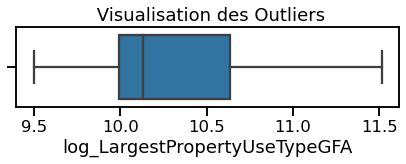

pour le groupe Refrigerated Warehouse et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


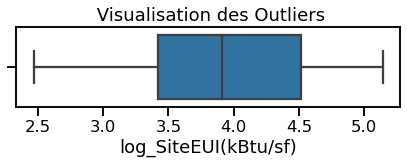

pour le groupe Refrigerated Warehouse et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


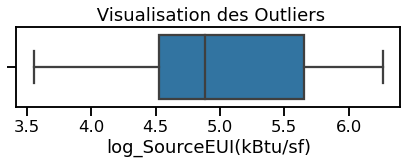

pour le groupe Refrigerated Warehouse et la feature log_SiteEnergyUse(kBtu)
il y a 2 outliers


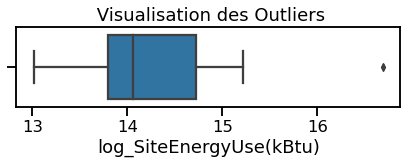

pour le groupe Refrigerated Warehouse et la feature log_SteamUse(kBtu)
il y a 0 outliers


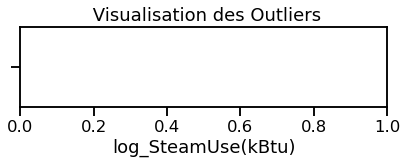

pour le groupe Refrigerated Warehouse et la feature log_Electricity(kBtu)
il y a 2 outliers


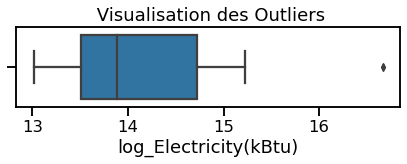

pour le groupe Refrigerated Warehouse et la feature log_NaturalGas(kBtu)
il y a 0 outliers


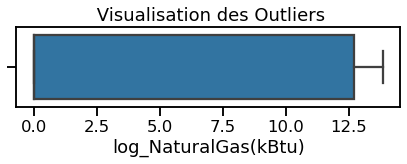

pour le groupe Refrigerated Warehouse et la feature log_TotalGHGEmissions
il y a 0 outliers


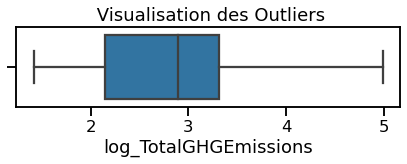

pour le groupe Restaurant et la feature log_YearBuilt
il y a 0 outliers


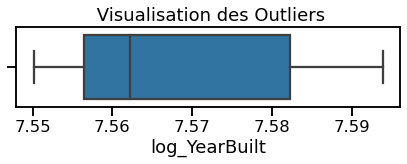

pour le groupe Restaurant et la feature log_NumberofBuildings
il y a 0 outliers


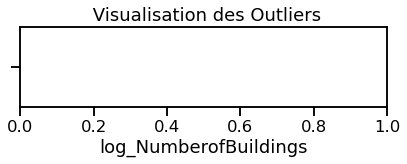

pour le groupe Restaurant et la feature log_NumberofFloors
il y a 1 outliers


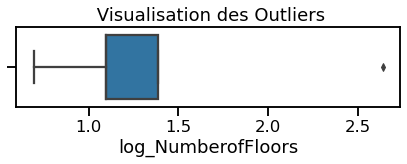

pour le groupe Restaurant et la feature log_PropertyGFATotal
il y a 0 outliers


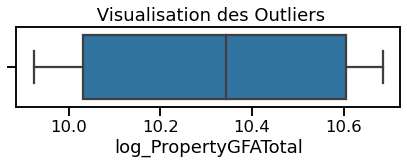

pour le groupe Restaurant et la feature log_PropertyGFAParking
il y a 0 outliers


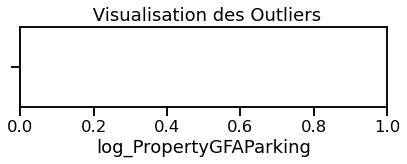

pour le groupe Restaurant et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


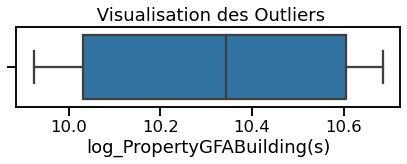

pour le groupe Restaurant et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


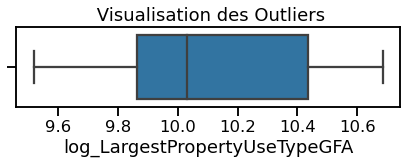

pour le groupe Restaurant et la feature log_SiteEUI(kBtu/sf)
il y a 2 outliers


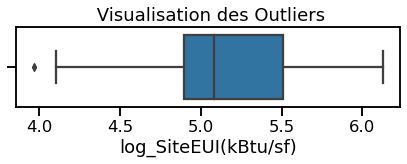

pour le groupe Restaurant et la feature log_SourceEUI(kBtu/sf)
il y a 4 outliers


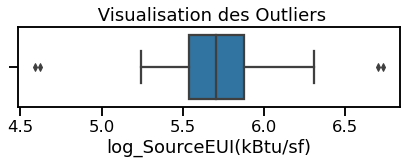

pour le groupe Restaurant et la feature log_SiteEnergyUse(kBtu)
il y a 1 outliers


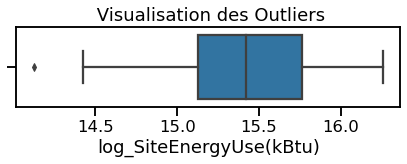

pour le groupe Restaurant et la feature log_SteamUse(kBtu)
il y a 1 outliers


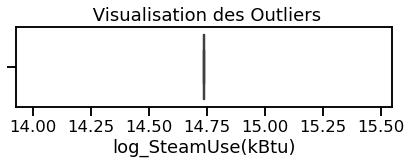

pour le groupe Restaurant et la feature log_Electricity(kBtu)
il y a 1 outliers


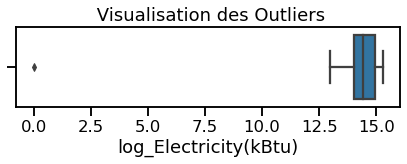

pour le groupe Restaurant et la feature log_NaturalGas(kBtu)
il y a 2 outliers


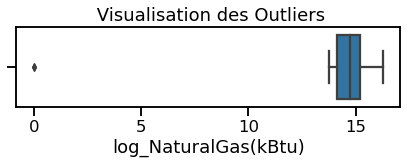

pour le groupe Restaurant et la feature log_TotalGHGEmissions
il y a 2 outliers


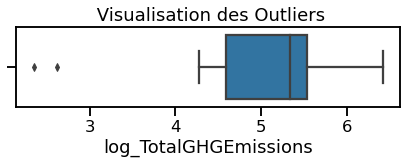

pour le groupe Laboratory et la feature log_YearBuilt
il y a 0 outliers


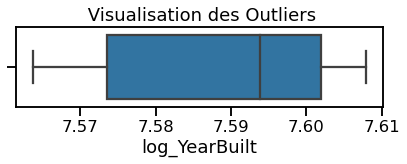

pour le groupe Laboratory et la feature log_NumberofBuildings
il y a 0 outliers


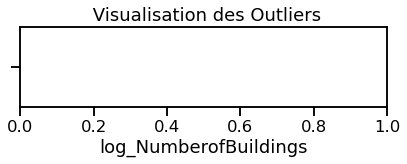

pour le groupe Laboratory et la feature log_NumberofFloors
il y a 1 outliers


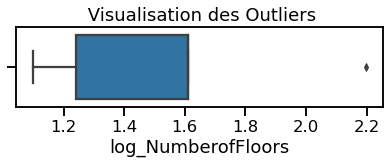

pour le groupe Laboratory et la feature log_PropertyGFATotal
il y a 0 outliers


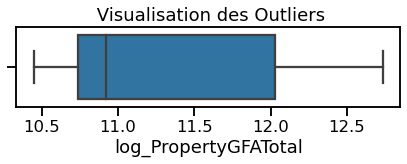

pour le groupe Laboratory et la feature log_PropertyGFAParking
il y a 0 outliers


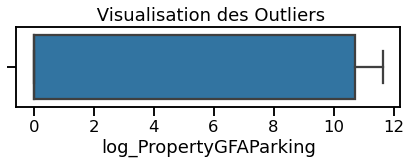

pour le groupe Laboratory et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


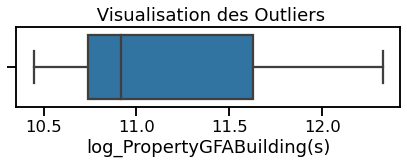

pour le groupe Laboratory et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


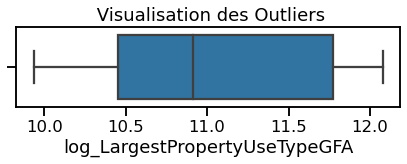

pour le groupe Laboratory et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


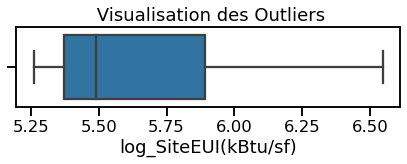

pour le groupe Laboratory et la feature log_SourceEUI(kBtu/sf)
il y a 1 outliers


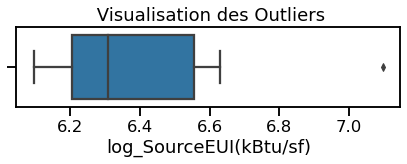

pour le groupe Laboratory et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


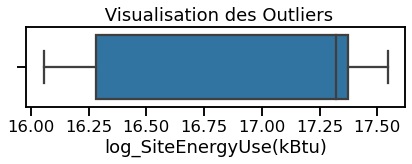

pour le groupe Laboratory et la feature log_SteamUse(kBtu)
il y a 0 outliers


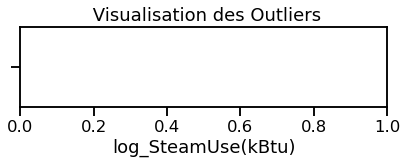

pour le groupe Laboratory et la feature log_Electricity(kBtu)
il y a 0 outliers


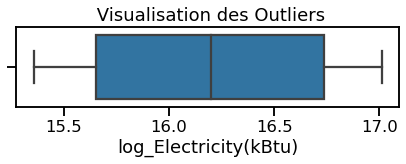

pour le groupe Laboratory et la feature log_NaturalGas(kBtu)
il y a 0 outliers


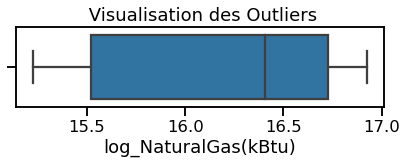

pour le groupe Laboratory et la feature log_TotalGHGEmissions
il y a 0 outliers


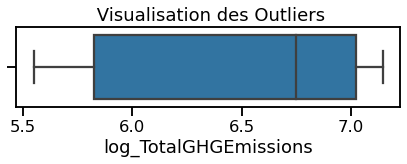

pour le groupe nan et la feature log_YearBuilt
il y a 0 outliers


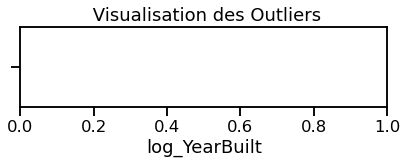

pour le groupe nan et la feature log_NumberofBuildings
il y a 0 outliers


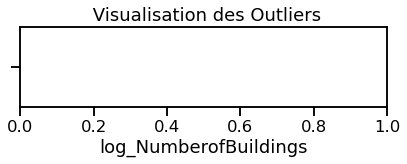

pour le groupe nan et la feature log_NumberofFloors
il y a 0 outliers


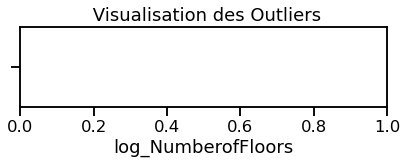

pour le groupe nan et la feature log_PropertyGFATotal
il y a 0 outliers


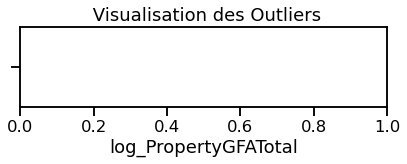

pour le groupe nan et la feature log_PropertyGFAParking
il y a 0 outliers


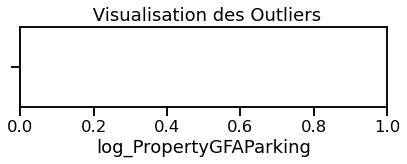

pour le groupe nan et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


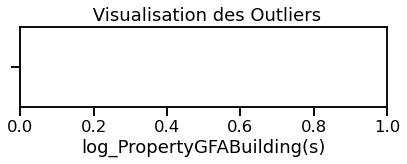

pour le groupe nan et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


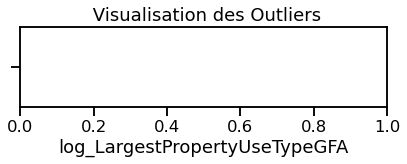

pour le groupe nan et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


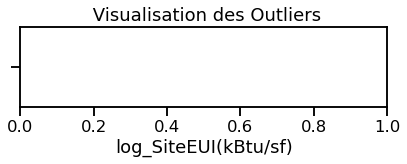

pour le groupe nan et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


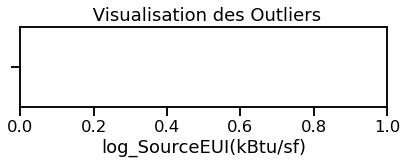

pour le groupe nan et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


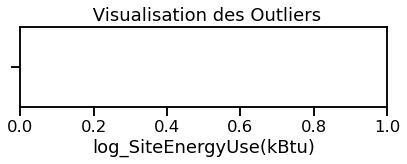

pour le groupe nan et la feature log_SteamUse(kBtu)
il y a 0 outliers


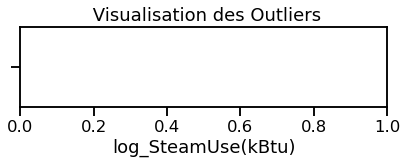

pour le groupe nan et la feature log_Electricity(kBtu)
il y a 0 outliers


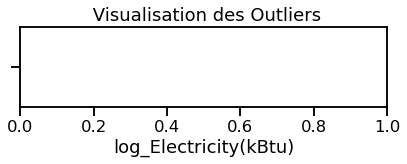

pour le groupe nan et la feature log_NaturalGas(kBtu)
il y a 0 outliers


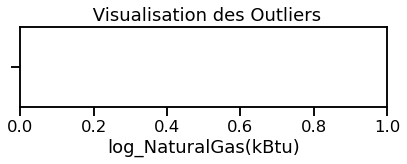

pour le groupe nan et la feature log_TotalGHGEmissions
il y a 0 outliers


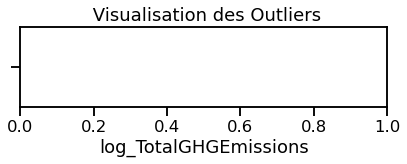

pour le groupe Parking et la feature log_YearBuilt
il y a 0 outliers


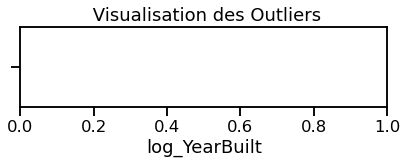

pour le groupe Parking et la feature log_NumberofBuildings
il y a 0 outliers


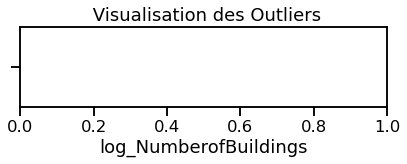

pour le groupe Parking et la feature log_NumberofFloors
il y a 0 outliers


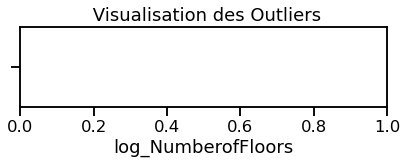

pour le groupe Parking et la feature log_PropertyGFATotal
il y a 0 outliers


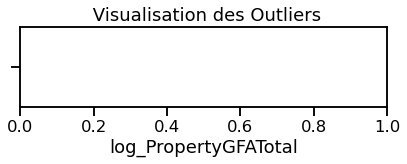

pour le groupe Parking et la feature log_PropertyGFAParking
il y a 0 outliers


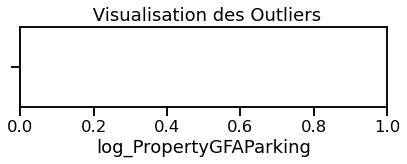

pour le groupe Parking et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


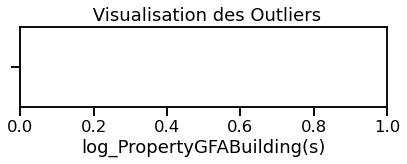

pour le groupe Parking et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


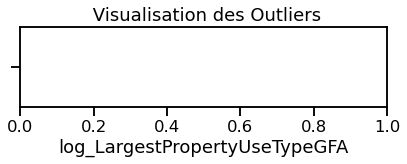

pour le groupe Parking et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


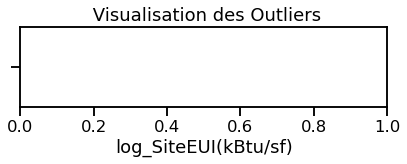

pour le groupe Parking et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


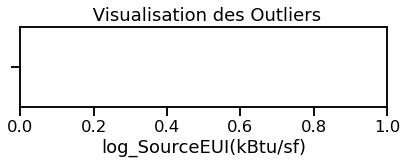

pour le groupe Parking et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


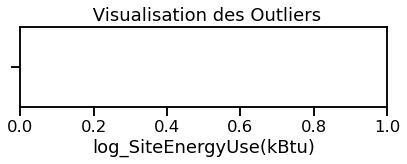

pour le groupe Parking et la feature log_SteamUse(kBtu)
il y a 0 outliers


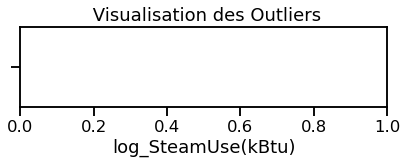

pour le groupe Parking et la feature log_Electricity(kBtu)
il y a 0 outliers


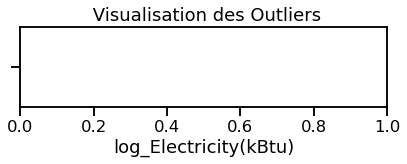

pour le groupe Parking et la feature log_NaturalGas(kBtu)
il y a 0 outliers


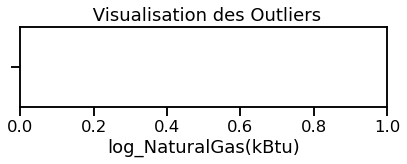

pour le groupe Parking et la feature log_TotalGHGEmissions
il y a 0 outliers


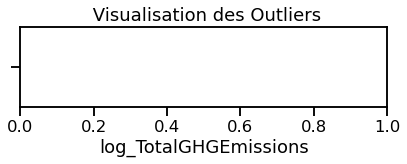

pour le groupe Other - Education et la feature log_YearBuilt
il y a 0 outliers


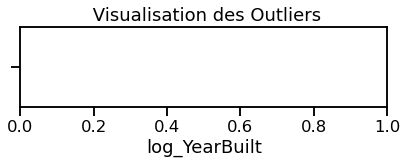

pour le groupe Other - Education et la feature log_NumberofBuildings
il y a 0 outliers


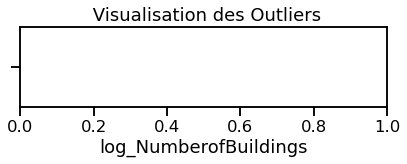

pour le groupe Other - Education et la feature log_NumberofFloors
il y a 0 outliers


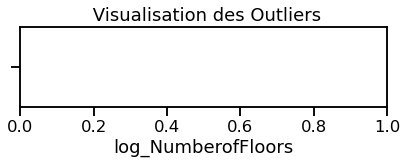

pour le groupe Other - Education et la feature log_PropertyGFATotal
il y a 0 outliers


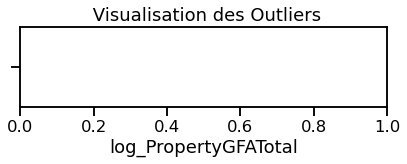

pour le groupe Other - Education et la feature log_PropertyGFAParking
il y a 0 outliers


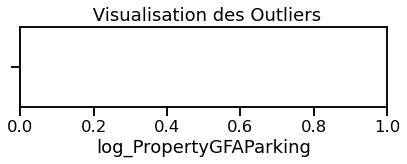

pour le groupe Other - Education et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


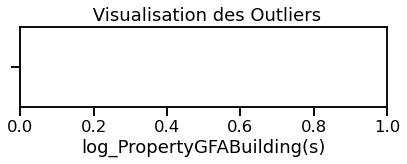

pour le groupe Other - Education et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


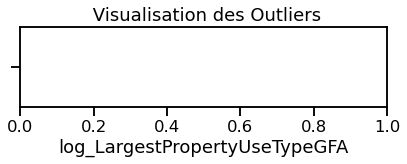

pour le groupe Other - Education et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


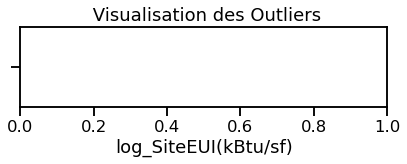

pour le groupe Other - Education et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


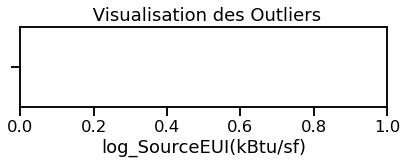

pour le groupe Other - Education et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


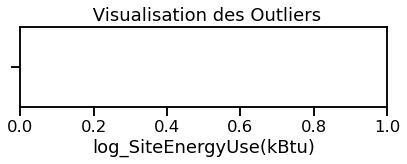

pour le groupe Other - Education et la feature log_SteamUse(kBtu)
il y a 0 outliers


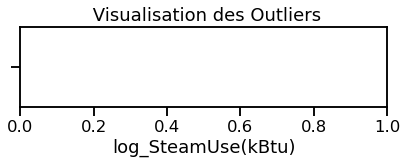

pour le groupe Other - Education et la feature log_Electricity(kBtu)
il y a 0 outliers


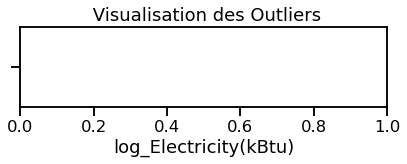

pour le groupe Other - Education et la feature log_NaturalGas(kBtu)
il y a 0 outliers


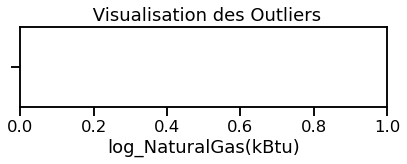

pour le groupe Other - Education et la feature log_TotalGHGEmissions
il y a 0 outliers


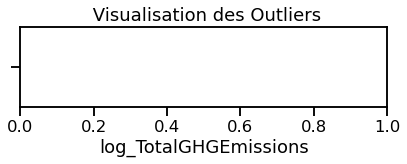

pour le groupe Vocational School et la feature log_YearBuilt
il y a 0 outliers


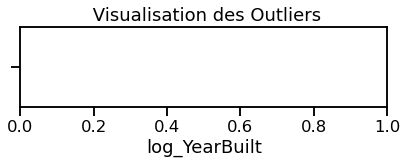

pour le groupe Vocational School et la feature log_NumberofBuildings
il y a 0 outliers


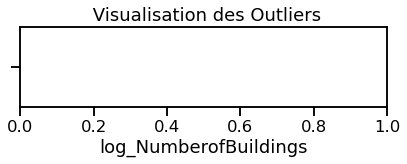

pour le groupe Vocational School et la feature log_NumberofFloors
il y a 0 outliers


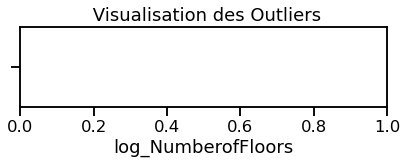

pour le groupe Vocational School et la feature log_PropertyGFATotal
il y a 0 outliers


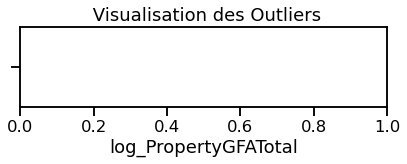

pour le groupe Vocational School et la feature log_PropertyGFAParking
il y a 0 outliers


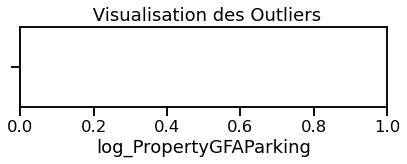

pour le groupe Vocational School et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


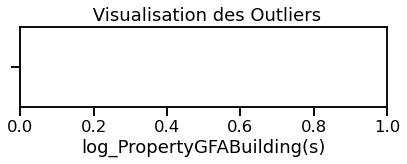

pour le groupe Vocational School et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


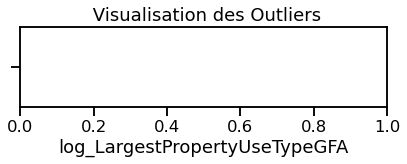

pour le groupe Vocational School et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


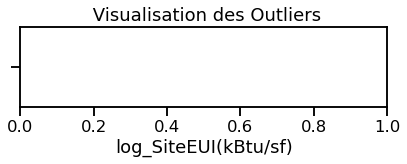

pour le groupe Vocational School et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


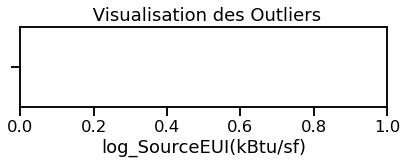

pour le groupe Vocational School et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


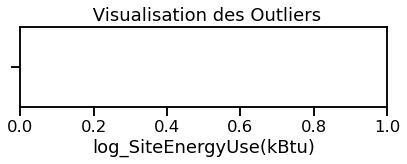

pour le groupe Vocational School et la feature log_SteamUse(kBtu)
il y a 0 outliers


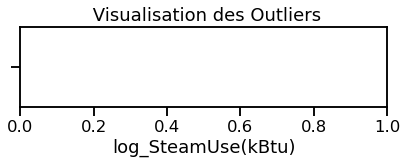

pour le groupe Vocational School et la feature log_Electricity(kBtu)
il y a 0 outliers


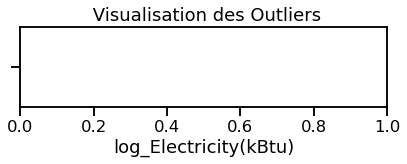

pour le groupe Vocational School et la feature log_NaturalGas(kBtu)
il y a 0 outliers


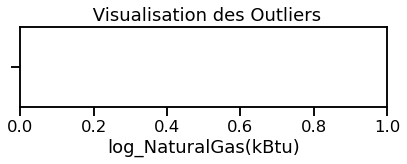

pour le groupe Vocational School et la feature log_TotalGHGEmissions
il y a 0 outliers


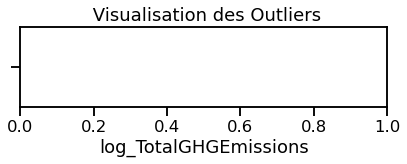

pour le groupe Other - Entertainment/Public Assembly et la feature log_YearBuilt
il y a 0 outliers


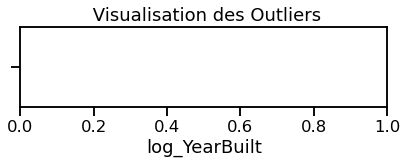

pour le groupe Other - Entertainment/Public Assembly et la feature log_NumberofBuildings
il y a 0 outliers


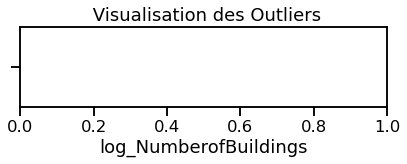

pour le groupe Other - Entertainment/Public Assembly et la feature log_NumberofFloors
il y a 0 outliers


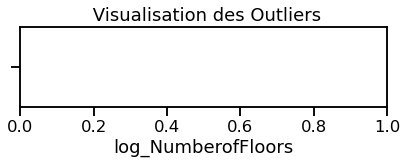

pour le groupe Other - Entertainment/Public Assembly et la feature log_PropertyGFATotal
il y a 0 outliers


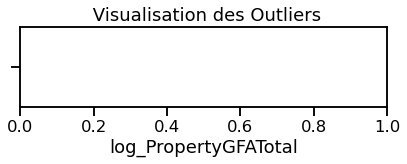

pour le groupe Other - Entertainment/Public Assembly et la feature log_PropertyGFAParking
il y a 0 outliers


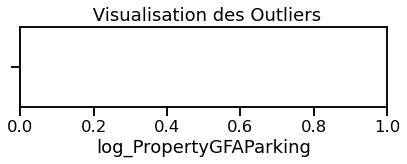

pour le groupe Other - Entertainment/Public Assembly et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


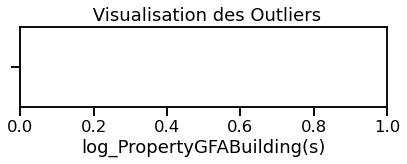

pour le groupe Other - Entertainment/Public Assembly et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


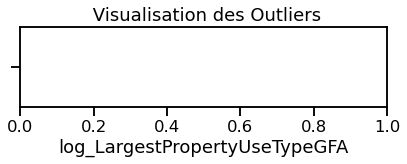

pour le groupe Other - Entertainment/Public Assembly et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


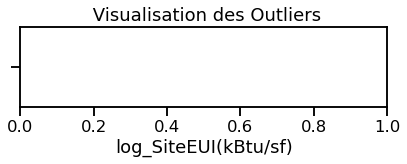

pour le groupe Other - Entertainment/Public Assembly et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


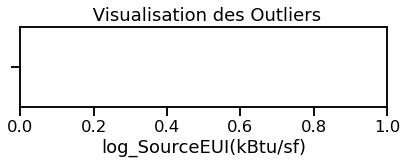

pour le groupe Other - Entertainment/Public Assembly et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


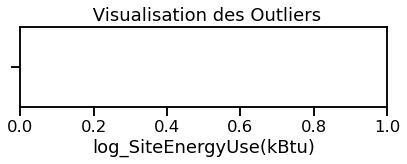

pour le groupe Other - Entertainment/Public Assembly et la feature log_SteamUse(kBtu)
il y a 0 outliers


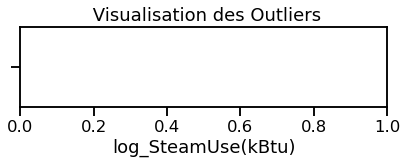

pour le groupe Other - Entertainment/Public Assembly et la feature log_Electricity(kBtu)
il y a 0 outliers


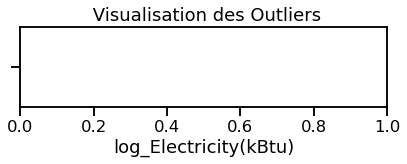

pour le groupe Other - Entertainment/Public Assembly et la feature log_NaturalGas(kBtu)
il y a 0 outliers


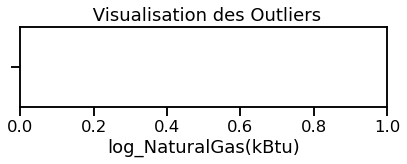

pour le groupe Other - Entertainment/Public Assembly et la feature log_TotalGHGEmissions
il y a 0 outliers


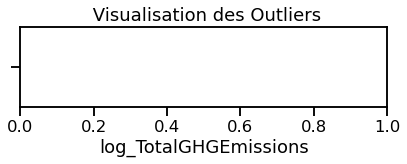

pour le groupe Data Center et la feature log_YearBuilt
il y a 0 outliers


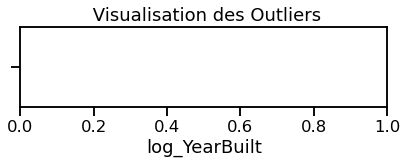

pour le groupe Data Center et la feature log_NumberofBuildings
il y a 0 outliers


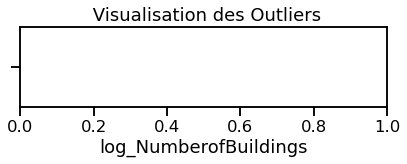

pour le groupe Data Center et la feature log_NumberofFloors
il y a 0 outliers


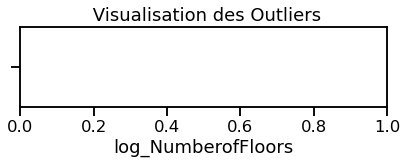

pour le groupe Data Center et la feature log_PropertyGFATotal
il y a 0 outliers


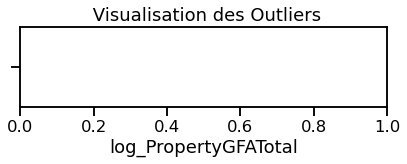

pour le groupe Data Center et la feature log_PropertyGFAParking
il y a 0 outliers


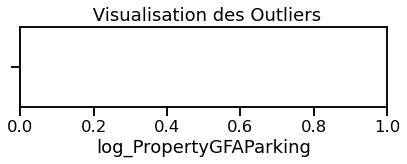

pour le groupe Data Center et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


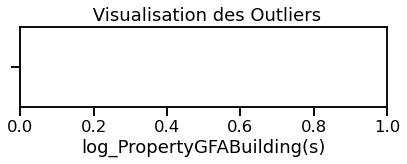

pour le groupe Data Center et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


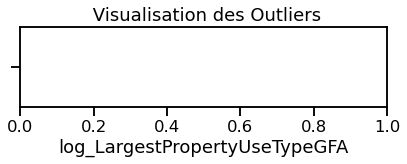

pour le groupe Data Center et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


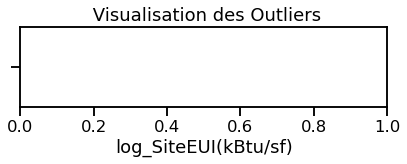

pour le groupe Data Center et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


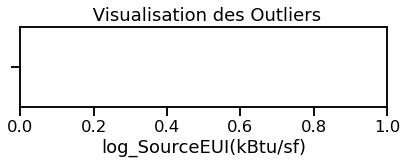

pour le groupe Data Center et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


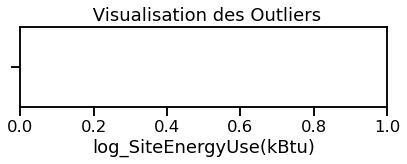

pour le groupe Data Center et la feature log_SteamUse(kBtu)
il y a 0 outliers


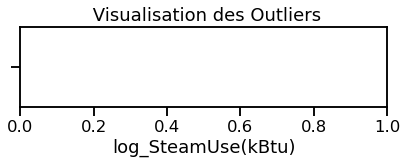

pour le groupe Data Center et la feature log_Electricity(kBtu)
il y a 0 outliers


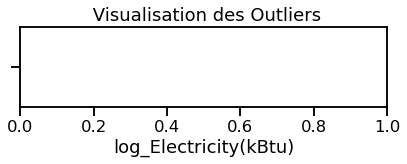

pour le groupe Data Center et la feature log_NaturalGas(kBtu)
il y a 0 outliers


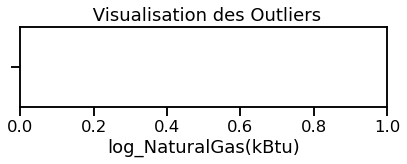

pour le groupe Data Center et la feature log_TotalGHGEmissions
il y a 0 outliers


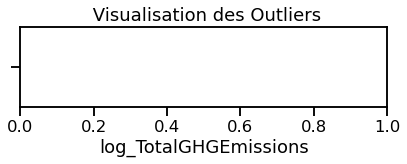

pour le groupe Swimming Pool et la feature log_YearBuilt
il y a 0 outliers


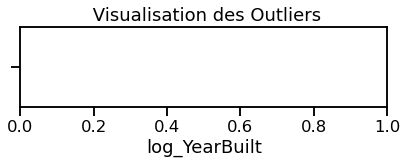

pour le groupe Swimming Pool et la feature log_NumberofBuildings
il y a 0 outliers


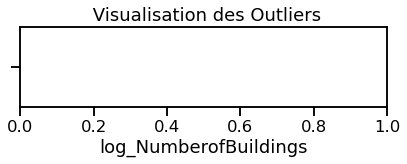

pour le groupe Swimming Pool et la feature log_NumberofFloors
il y a 0 outliers


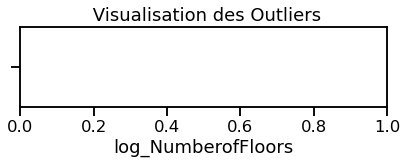

pour le groupe Swimming Pool et la feature log_PropertyGFATotal
il y a 0 outliers


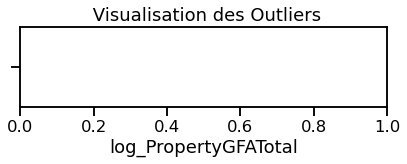

pour le groupe Swimming Pool et la feature log_PropertyGFAParking
il y a 0 outliers


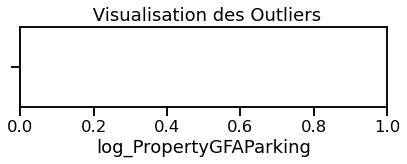

pour le groupe Swimming Pool et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


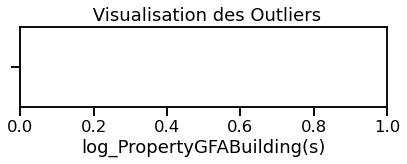

pour le groupe Swimming Pool et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


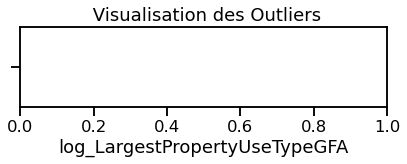

pour le groupe Swimming Pool et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


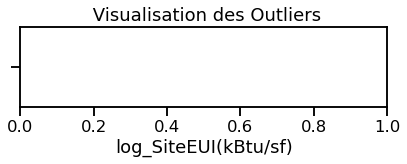

pour le groupe Swimming Pool et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


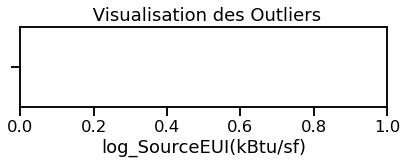

pour le groupe Swimming Pool et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


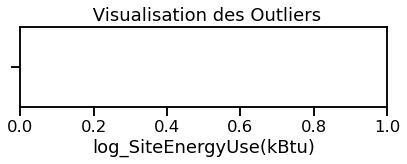

pour le groupe Swimming Pool et la feature log_SteamUse(kBtu)
il y a 0 outliers


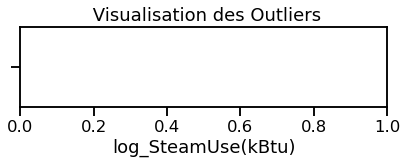

pour le groupe Swimming Pool et la feature log_Electricity(kBtu)
il y a 0 outliers


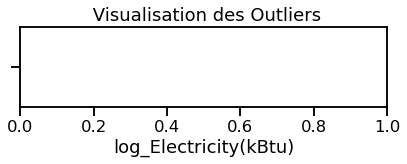

pour le groupe Swimming Pool et la feature log_NaturalGas(kBtu)
il y a 0 outliers


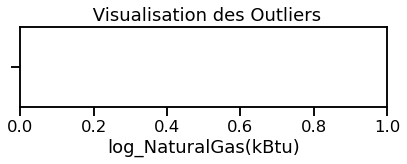

pour le groupe Swimming Pool et la feature log_TotalGHGEmissions
il y a 0 outliers


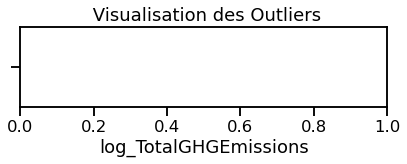

pour le groupe Courthouse et la feature log_YearBuilt
il y a 0 outliers


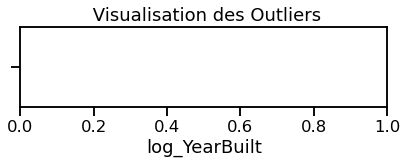

pour le groupe Courthouse et la feature log_NumberofBuildings
il y a 0 outliers


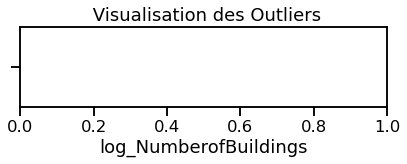

pour le groupe Courthouse et la feature log_NumberofFloors
il y a 0 outliers


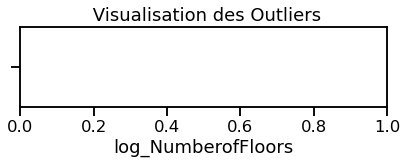

pour le groupe Courthouse et la feature log_PropertyGFATotal
il y a 0 outliers


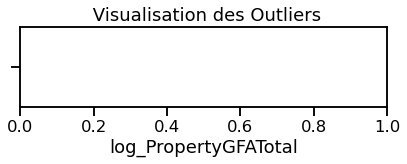

pour le groupe Courthouse et la feature log_PropertyGFAParking
il y a 0 outliers


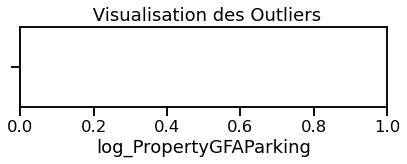

pour le groupe Courthouse et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


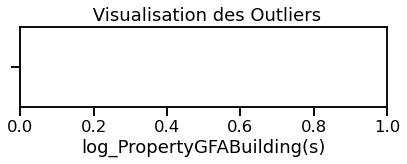

pour le groupe Courthouse et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


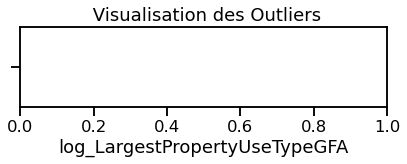

pour le groupe Courthouse et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


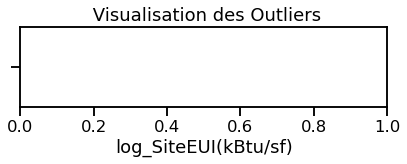

pour le groupe Courthouse et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


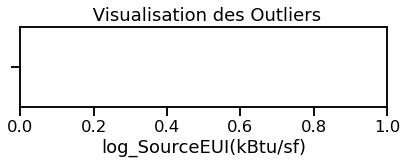

pour le groupe Courthouse et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


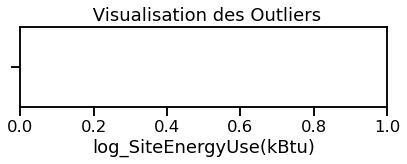

pour le groupe Courthouse et la feature log_SteamUse(kBtu)
il y a 0 outliers


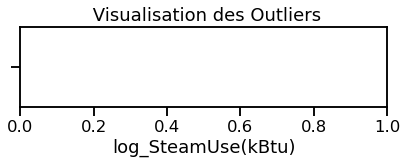

pour le groupe Courthouse et la feature log_Electricity(kBtu)
il y a 0 outliers


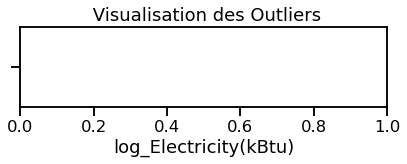

pour le groupe Courthouse et la feature log_NaturalGas(kBtu)
il y a 0 outliers


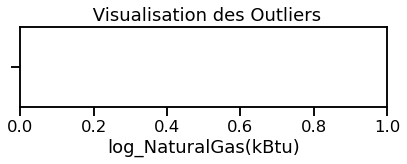

pour le groupe Courthouse et la feature log_TotalGHGEmissions
il y a 0 outliers


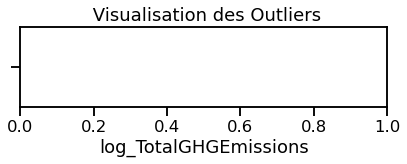

pour le groupe Residence Hall et la feature log_YearBuilt
il y a 0 outliers


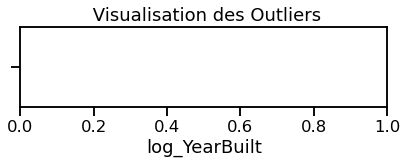

pour le groupe Residence Hall et la feature log_NumberofBuildings
il y a 0 outliers


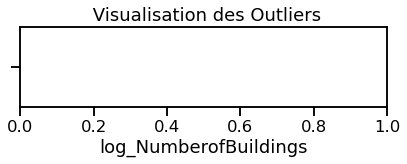

pour le groupe Residence Hall et la feature log_NumberofFloors
il y a 0 outliers


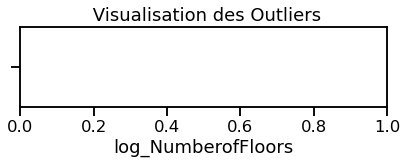

pour le groupe Residence Hall et la feature log_PropertyGFATotal
il y a 0 outliers


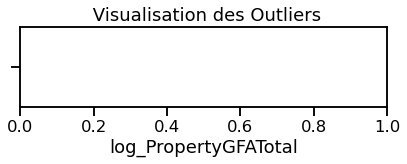

pour le groupe Residence Hall et la feature log_PropertyGFAParking
il y a 0 outliers


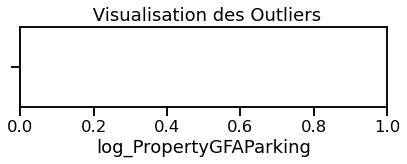

pour le groupe Residence Hall et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


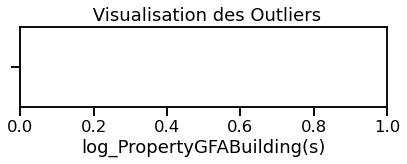

pour le groupe Residence Hall et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


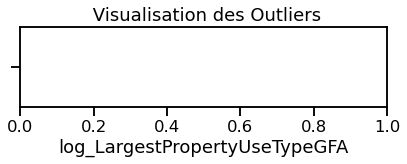

pour le groupe Residence Hall et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


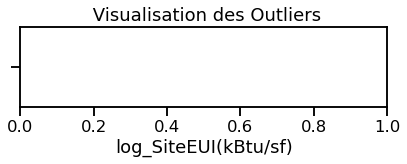

pour le groupe Residence Hall et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


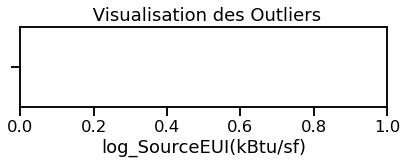

pour le groupe Residence Hall et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


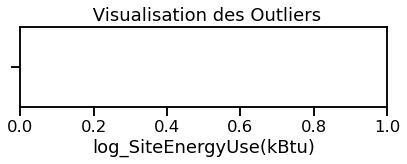

pour le groupe Residence Hall et la feature log_SteamUse(kBtu)
il y a 0 outliers


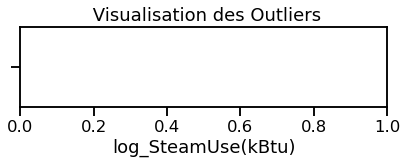

pour le groupe Residence Hall et la feature log_Electricity(kBtu)
il y a 0 outliers


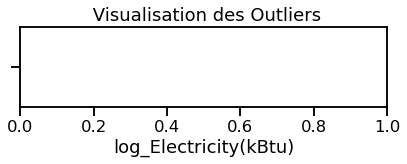

pour le groupe Residence Hall et la feature log_NaturalGas(kBtu)
il y a 0 outliers


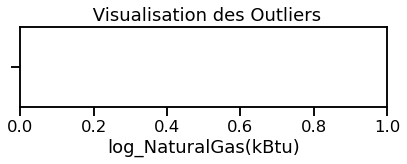

pour le groupe Residence Hall et la feature log_TotalGHGEmissions
il y a 0 outliers


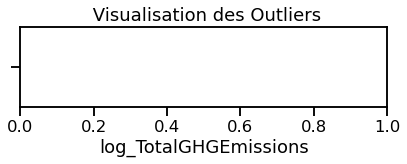

pour le groupe Movie Theater et la feature log_YearBuilt
il y a 0 outliers


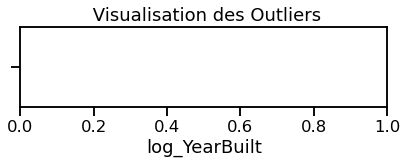

pour le groupe Movie Theater et la feature log_NumberofBuildings
il y a 0 outliers


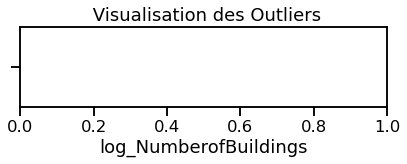

pour le groupe Movie Theater et la feature log_NumberofFloors
il y a 0 outliers


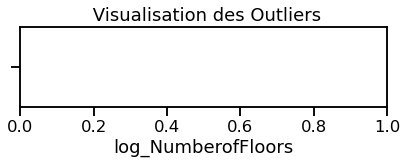

pour le groupe Movie Theater et la feature log_PropertyGFATotal
il y a 0 outliers


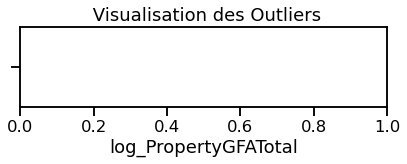

pour le groupe Movie Theater et la feature log_PropertyGFAParking
il y a 0 outliers


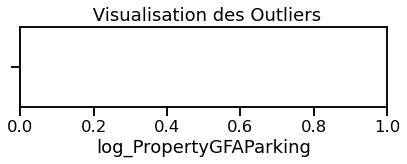

pour le groupe Movie Theater et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


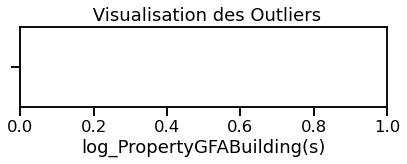

pour le groupe Movie Theater et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


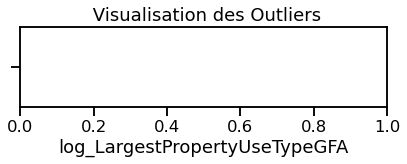

pour le groupe Movie Theater et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


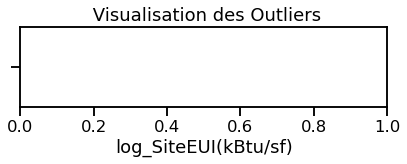

pour le groupe Movie Theater et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


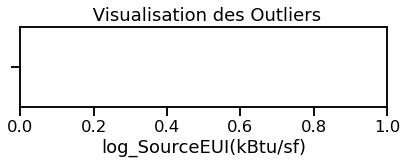

pour le groupe Movie Theater et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


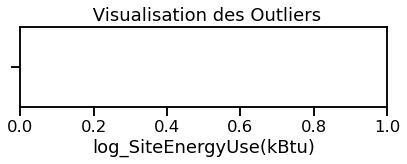

pour le groupe Movie Theater et la feature log_SteamUse(kBtu)
il y a 0 outliers


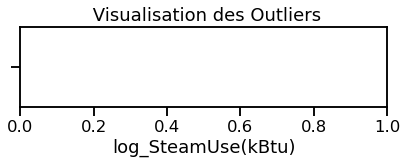

pour le groupe Movie Theater et la feature log_Electricity(kBtu)
il y a 0 outliers


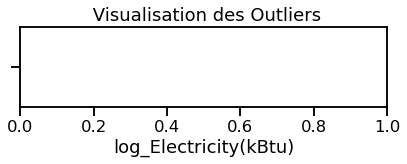

pour le groupe Movie Theater et la feature log_NaturalGas(kBtu)
il y a 0 outliers


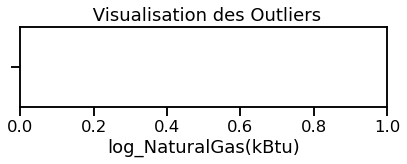

pour le groupe Movie Theater et la feature log_TotalGHGEmissions
il y a 0 outliers


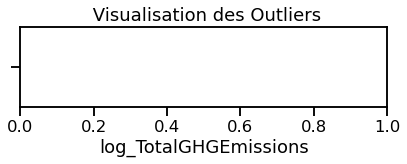

pour le groupe Other - Services et la feature log_YearBuilt
il y a 0 outliers


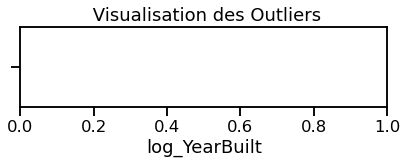

pour le groupe Other - Services et la feature log_NumberofBuildings
il y a 0 outliers


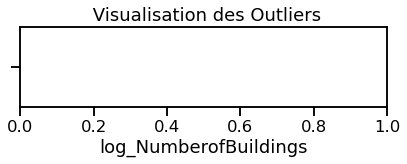

pour le groupe Other - Services et la feature log_NumberofFloors
il y a 0 outliers


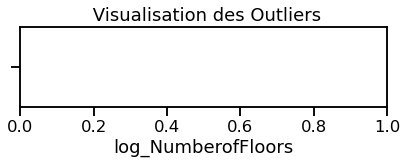

pour le groupe Other - Services et la feature log_PropertyGFATotal
il y a 0 outliers


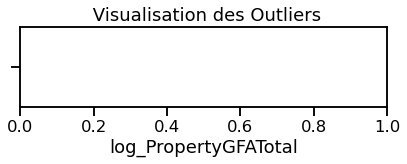

pour le groupe Other - Services et la feature log_PropertyGFAParking
il y a 0 outliers


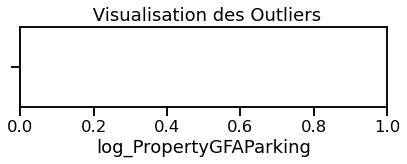

pour le groupe Other - Services et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


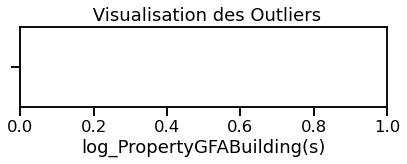

pour le groupe Other - Services et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


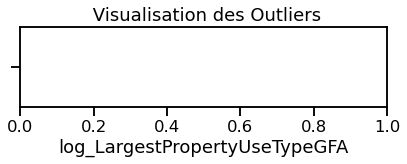

pour le groupe Other - Services et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


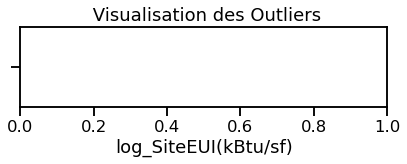

pour le groupe Other - Services et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


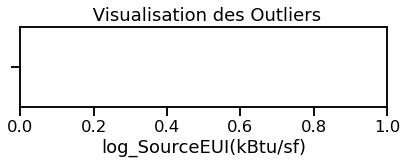

pour le groupe Other - Services et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


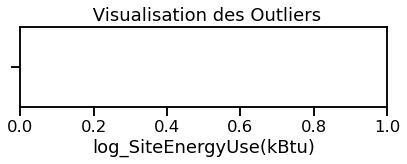

pour le groupe Other - Services et la feature log_SteamUse(kBtu)
il y a 0 outliers


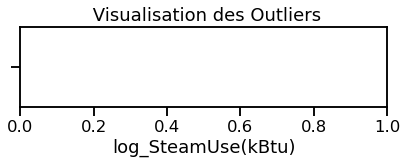

pour le groupe Other - Services et la feature log_Electricity(kBtu)
il y a 0 outliers


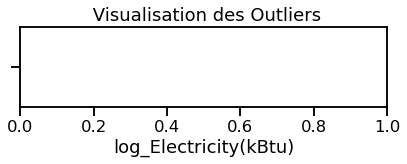

pour le groupe Other - Services et la feature log_NaturalGas(kBtu)
il y a 0 outliers


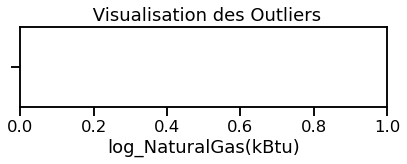

pour le groupe Other - Services et la feature log_TotalGHGEmissions
il y a 0 outliers


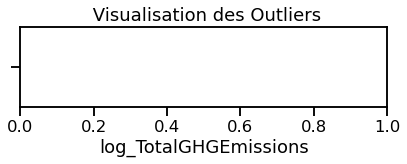

pour le groupe Other - Recreation et la feature log_YearBuilt
il y a 0 outliers


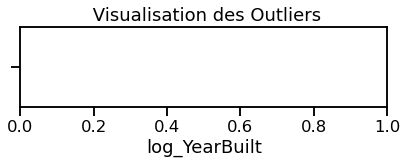

pour le groupe Other - Recreation et la feature log_NumberofBuildings
il y a 0 outliers


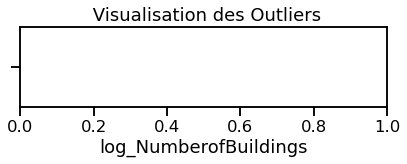

pour le groupe Other - Recreation et la feature log_NumberofFloors
il y a 0 outliers


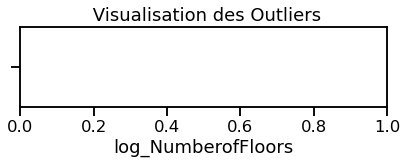

pour le groupe Other - Recreation et la feature log_PropertyGFATotal
il y a 0 outliers


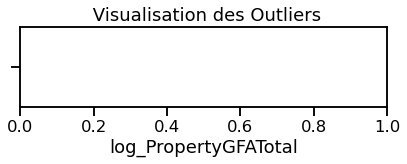

pour le groupe Other - Recreation et la feature log_PropertyGFAParking
il y a 0 outliers


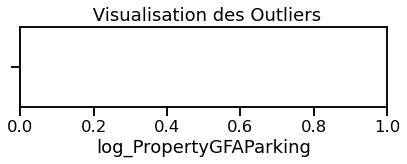

pour le groupe Other - Recreation et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


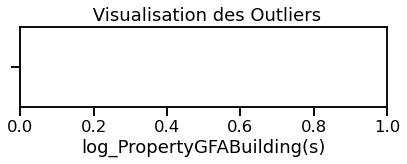

pour le groupe Other - Recreation et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


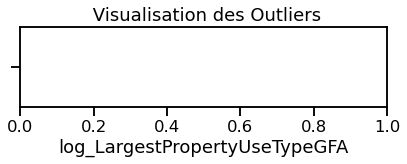

pour le groupe Other - Recreation et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


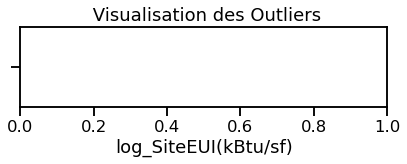

pour le groupe Other - Recreation et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


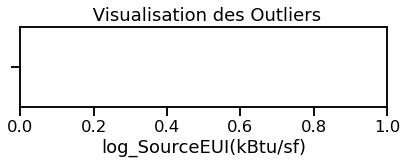

pour le groupe Other - Recreation et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


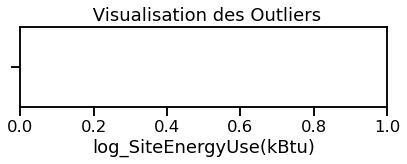

pour le groupe Other - Recreation et la feature log_SteamUse(kBtu)
il y a 0 outliers


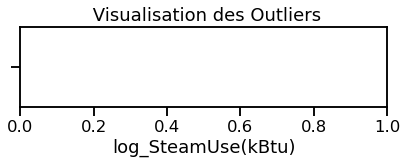

pour le groupe Other - Recreation et la feature log_Electricity(kBtu)
il y a 0 outliers


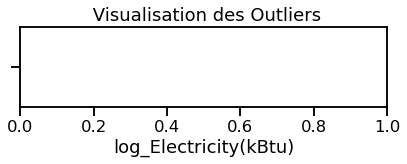

pour le groupe Other - Recreation et la feature log_NaturalGas(kBtu)
il y a 0 outliers


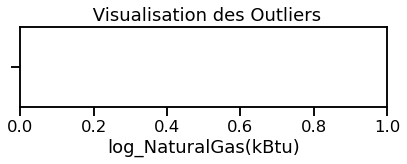

pour le groupe Other - Recreation et la feature log_TotalGHGEmissions
il y a 0 outliers


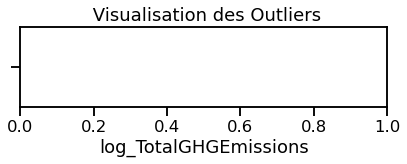

pour le groupe Convenience Store without Gas Station et la feature log_YearBuilt
il y a 0 outliers


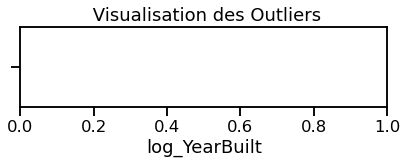

pour le groupe Convenience Store without Gas Station et la feature log_NumberofBuildings
il y a 0 outliers


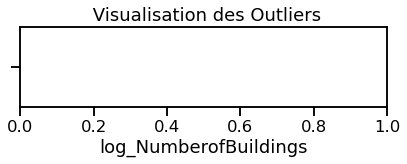

pour le groupe Convenience Store without Gas Station et la feature log_NumberofFloors
il y a 0 outliers


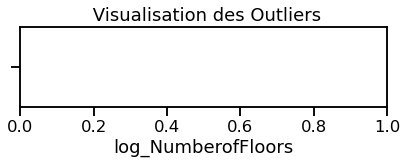

pour le groupe Convenience Store without Gas Station et la feature log_PropertyGFATotal
il y a 0 outliers


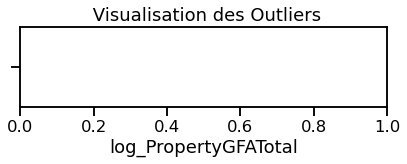

pour le groupe Convenience Store without Gas Station et la feature log_PropertyGFAParking
il y a 0 outliers


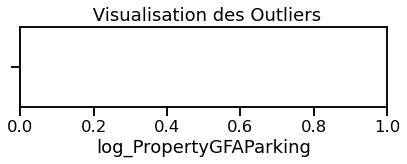

pour le groupe Convenience Store without Gas Station et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


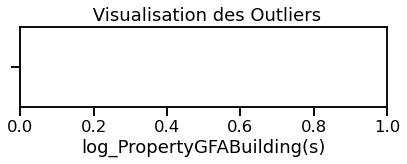

pour le groupe Convenience Store without Gas Station et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


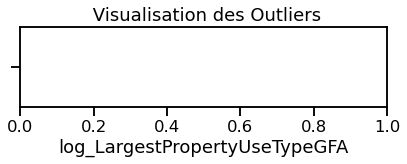

pour le groupe Convenience Store without Gas Station et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


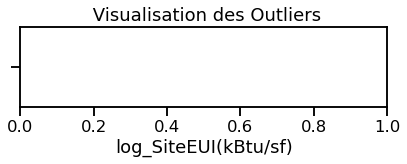

pour le groupe Convenience Store without Gas Station et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


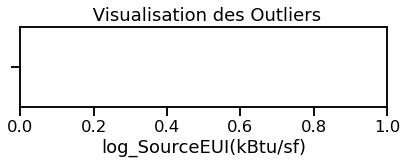

pour le groupe Convenience Store without Gas Station et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


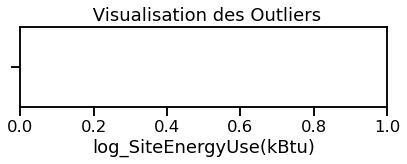

pour le groupe Convenience Store without Gas Station et la feature log_SteamUse(kBtu)
il y a 0 outliers


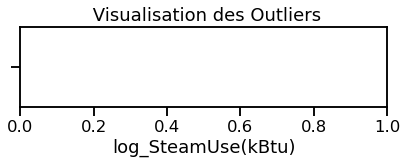

pour le groupe Convenience Store without Gas Station et la feature log_Electricity(kBtu)
il y a 0 outliers


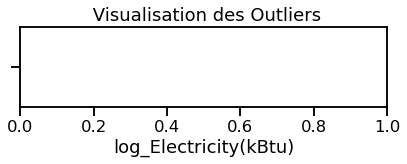

pour le groupe Convenience Store without Gas Station et la feature log_NaturalGas(kBtu)
il y a 0 outliers


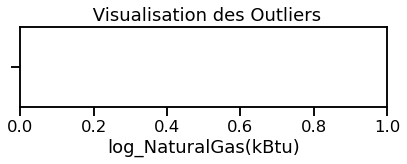

pour le groupe Convenience Store without Gas Station et la feature log_TotalGHGEmissions
il y a 0 outliers


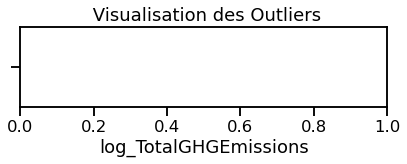

pour le groupe Fitness Center/Health Club/Gym et la feature log_YearBuilt
il y a 0 outliers


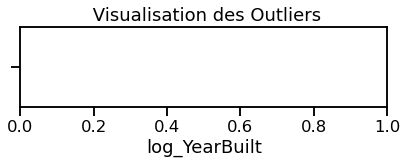

pour le groupe Fitness Center/Health Club/Gym et la feature log_NumberofBuildings
il y a 0 outliers


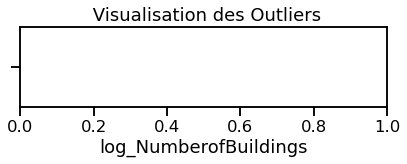

pour le groupe Fitness Center/Health Club/Gym et la feature log_NumberofFloors
il y a 0 outliers


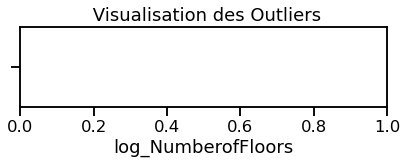

pour le groupe Fitness Center/Health Club/Gym et la feature log_PropertyGFATotal
il y a 0 outliers


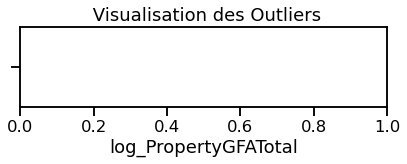

pour le groupe Fitness Center/Health Club/Gym et la feature log_PropertyGFAParking
il y a 0 outliers


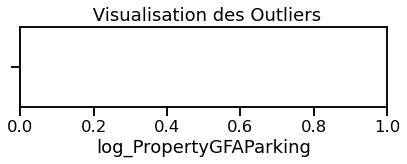

pour le groupe Fitness Center/Health Club/Gym et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


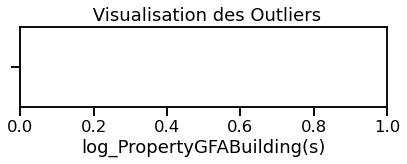

pour le groupe Fitness Center/Health Club/Gym et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


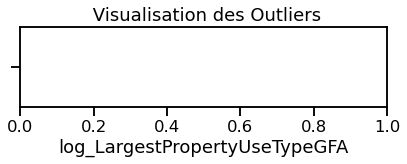

pour le groupe Fitness Center/Health Club/Gym et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


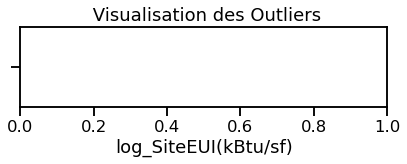

pour le groupe Fitness Center/Health Club/Gym et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


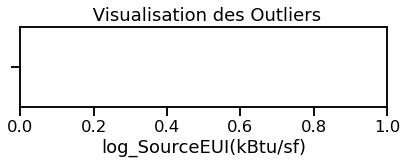

pour le groupe Fitness Center/Health Club/Gym et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


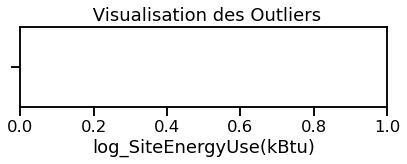

pour le groupe Fitness Center/Health Club/Gym et la feature log_SteamUse(kBtu)
il y a 0 outliers


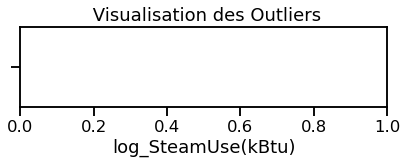

pour le groupe Fitness Center/Health Club/Gym et la feature log_Electricity(kBtu)
il y a 0 outliers


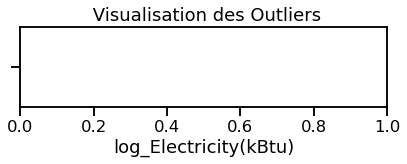

pour le groupe Fitness Center/Health Club/Gym et la feature log_NaturalGas(kBtu)
il y a 0 outliers


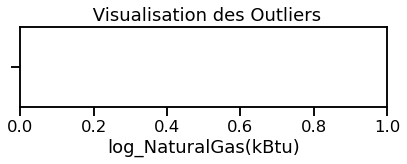

pour le groupe Fitness Center/Health Club/Gym et la feature log_TotalGHGEmissions
il y a 0 outliers


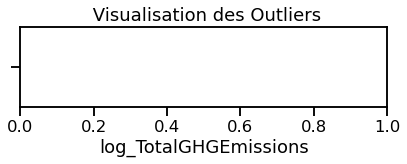

pour le groupe Performing Arts et la feature log_YearBuilt
il y a 0 outliers


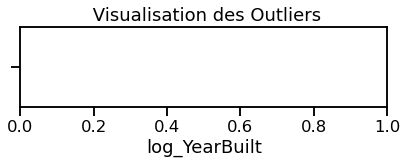

pour le groupe Performing Arts et la feature log_NumberofBuildings
il y a 0 outliers


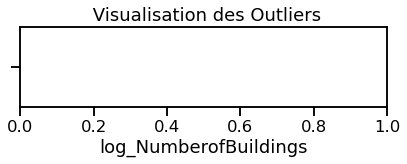

pour le groupe Performing Arts et la feature log_NumberofFloors
il y a 0 outliers


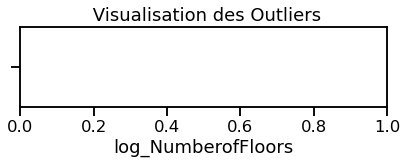

pour le groupe Performing Arts et la feature log_PropertyGFATotal
il y a 0 outliers


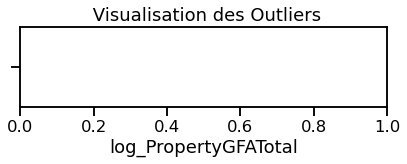

pour le groupe Performing Arts et la feature log_PropertyGFAParking
il y a 0 outliers


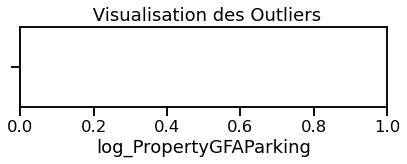

pour le groupe Performing Arts et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


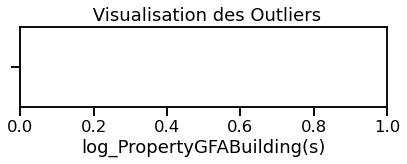

pour le groupe Performing Arts et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


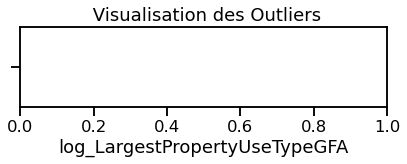

pour le groupe Performing Arts et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


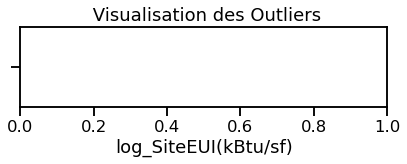

pour le groupe Performing Arts et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


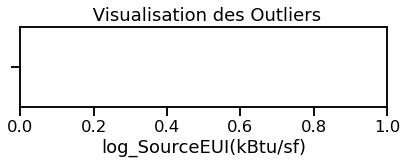

pour le groupe Performing Arts et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


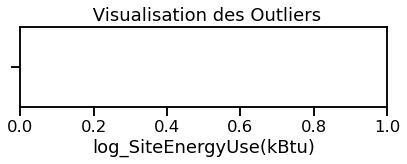

pour le groupe Performing Arts et la feature log_SteamUse(kBtu)
il y a 0 outliers


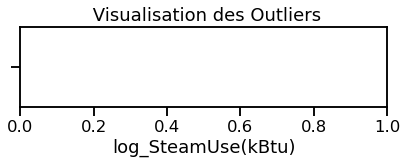

pour le groupe Performing Arts et la feature log_Electricity(kBtu)
il y a 0 outliers


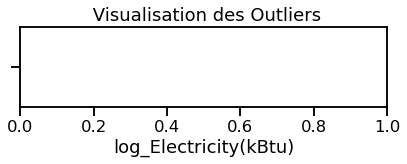

pour le groupe Performing Arts et la feature log_NaturalGas(kBtu)
il y a 0 outliers


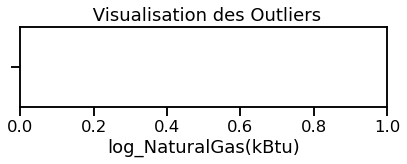

pour le groupe Performing Arts et la feature log_TotalGHGEmissions
il y a 0 outliers


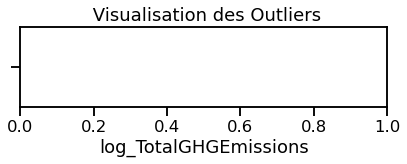

pour le groupe Other - Restaurant/Bar et la feature log_YearBuilt
il y a 0 outliers


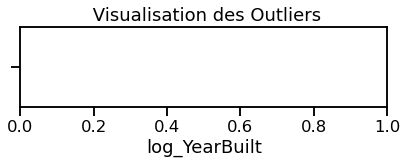

pour le groupe Other - Restaurant/Bar et la feature log_NumberofBuildings
il y a 0 outliers


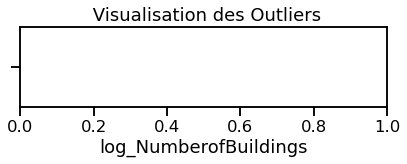

pour le groupe Other - Restaurant/Bar et la feature log_NumberofFloors
il y a 0 outliers


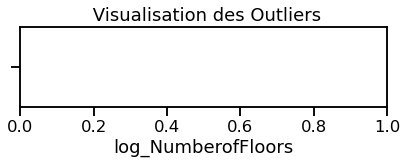

pour le groupe Other - Restaurant/Bar et la feature log_PropertyGFATotal
il y a 0 outliers


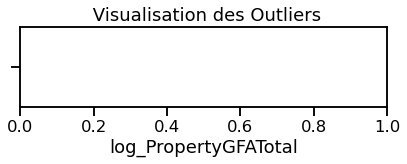

pour le groupe Other - Restaurant/Bar et la feature log_PropertyGFAParking
il y a 0 outliers


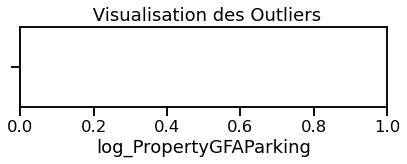

pour le groupe Other - Restaurant/Bar et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


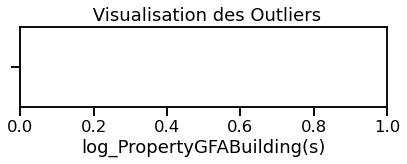

pour le groupe Other - Restaurant/Bar et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


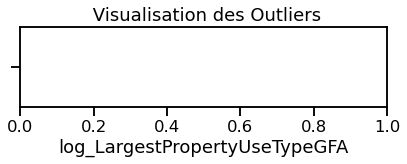

pour le groupe Other - Restaurant/Bar et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


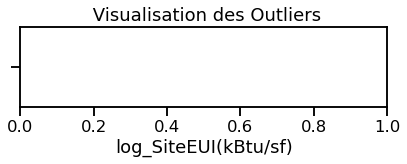

pour le groupe Other - Restaurant/Bar et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


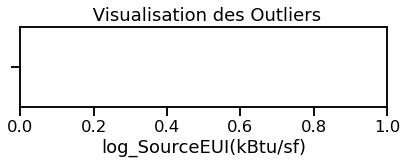

pour le groupe Other - Restaurant/Bar et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


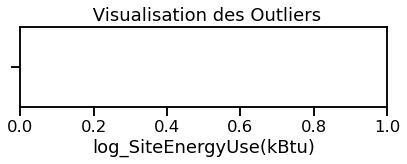

pour le groupe Other - Restaurant/Bar et la feature log_SteamUse(kBtu)
il y a 0 outliers


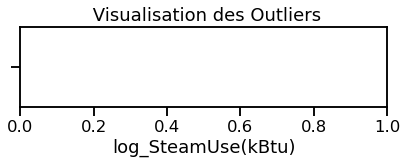

pour le groupe Other - Restaurant/Bar et la feature log_Electricity(kBtu)
il y a 0 outliers


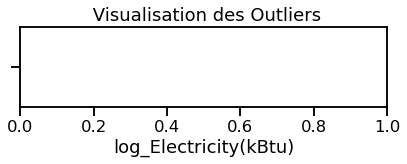

pour le groupe Other - Restaurant/Bar et la feature log_NaturalGas(kBtu)
il y a 0 outliers


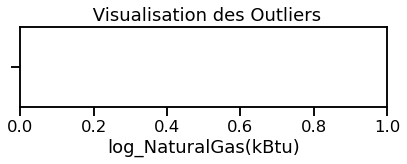

pour le groupe Other - Restaurant/Bar et la feature log_TotalGHGEmissions
il y a 0 outliers


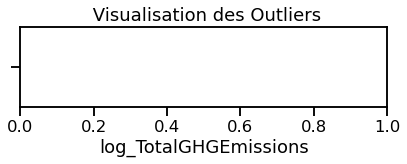

pour le groupe Adult Education et la feature log_YearBuilt
il y a 0 outliers


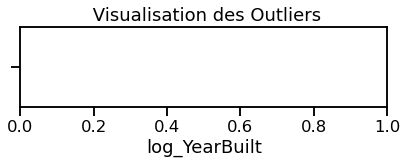

pour le groupe Adult Education et la feature log_NumberofBuildings
il y a 0 outliers


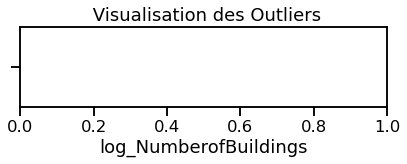

pour le groupe Adult Education et la feature log_NumberofFloors
il y a 0 outliers


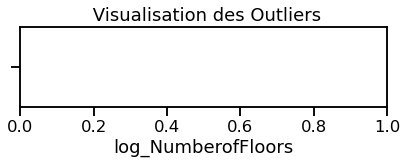

pour le groupe Adult Education et la feature log_PropertyGFATotal
il y a 0 outliers


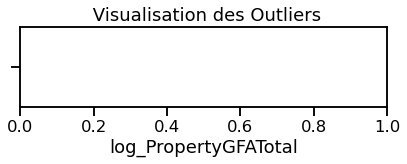

pour le groupe Adult Education et la feature log_PropertyGFAParking
il y a 0 outliers


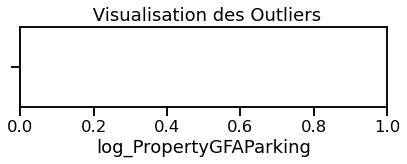

pour le groupe Adult Education et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


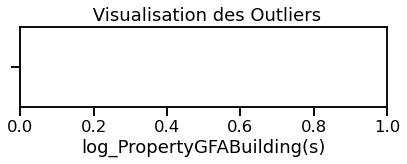

pour le groupe Adult Education et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


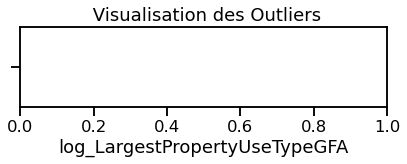

pour le groupe Adult Education et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


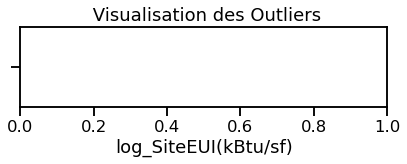

pour le groupe Adult Education et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


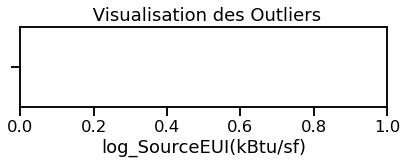

pour le groupe Adult Education et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


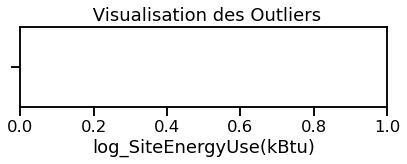

pour le groupe Adult Education et la feature log_SteamUse(kBtu)
il y a 0 outliers


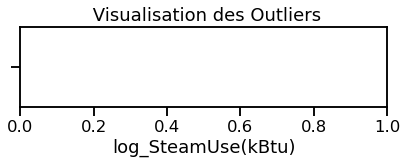

pour le groupe Adult Education et la feature log_Electricity(kBtu)
il y a 0 outliers


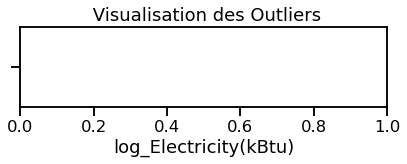

pour le groupe Adult Education et la feature log_NaturalGas(kBtu)
il y a 0 outliers


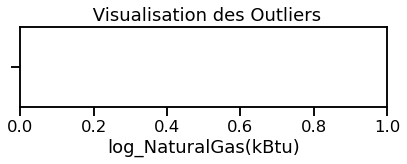

pour le groupe Adult Education et la feature log_TotalGHGEmissions
il y a 0 outliers


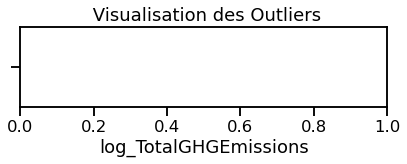

pour le groupe Bar/Nightclub et la feature log_YearBuilt
il y a 0 outliers


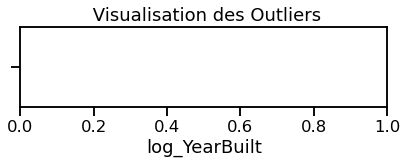

pour le groupe Bar/Nightclub et la feature log_NumberofBuildings
il y a 0 outliers


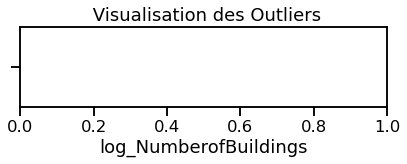

pour le groupe Bar/Nightclub et la feature log_NumberofFloors
il y a 0 outliers


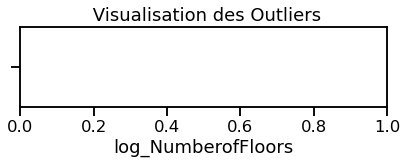

pour le groupe Bar/Nightclub et la feature log_PropertyGFATotal
il y a 0 outliers


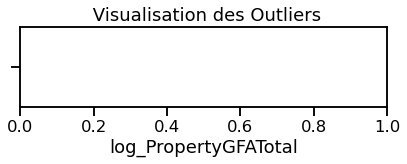

pour le groupe Bar/Nightclub et la feature log_PropertyGFAParking
il y a 0 outliers


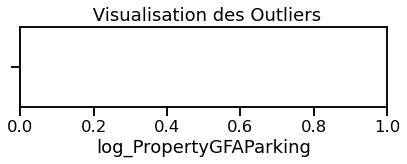

pour le groupe Bar/Nightclub et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


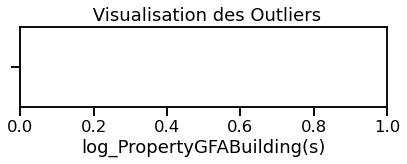

pour le groupe Bar/Nightclub et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


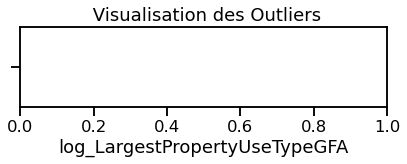

pour le groupe Bar/Nightclub et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


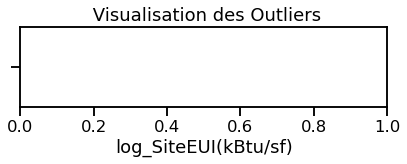

pour le groupe Bar/Nightclub et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


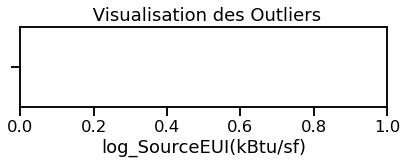

pour le groupe Bar/Nightclub et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


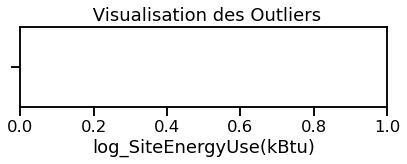

pour le groupe Bar/Nightclub et la feature log_SteamUse(kBtu)
il y a 0 outliers


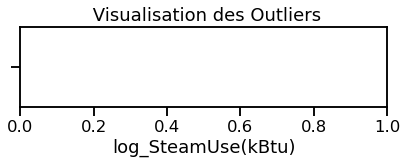

pour le groupe Bar/Nightclub et la feature log_Electricity(kBtu)
il y a 0 outliers


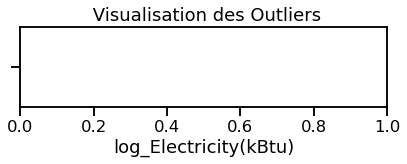

pour le groupe Bar/Nightclub et la feature log_NaturalGas(kBtu)
il y a 0 outliers


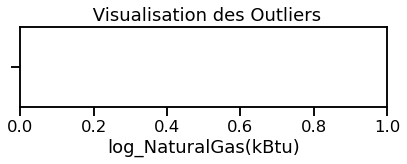

pour le groupe Bar/Nightclub et la feature log_TotalGHGEmissions
il y a 0 outliers


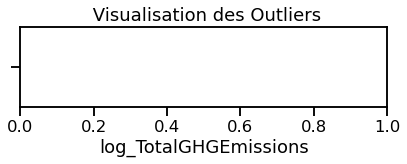

pour le groupe Financial Office et la feature log_YearBuilt
il y a 0 outliers


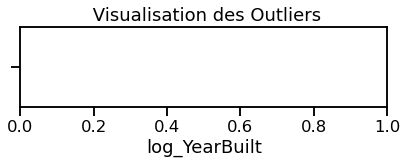

pour le groupe Financial Office et la feature log_NumberofBuildings
il y a 0 outliers


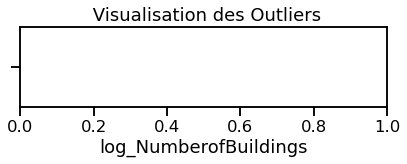

pour le groupe Financial Office et la feature log_NumberofFloors
il y a 0 outliers


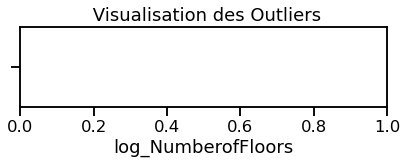

pour le groupe Financial Office et la feature log_PropertyGFATotal
il y a 0 outliers


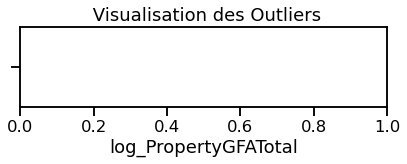

pour le groupe Financial Office et la feature log_PropertyGFAParking
il y a 0 outliers


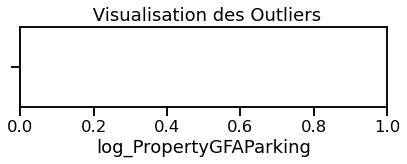

pour le groupe Financial Office et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


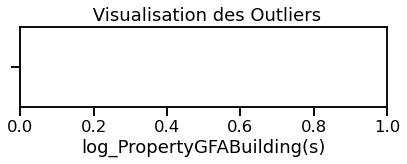

pour le groupe Financial Office et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


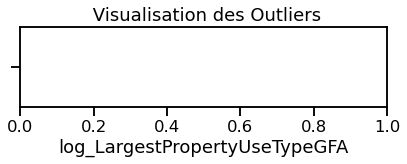

pour le groupe Financial Office et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


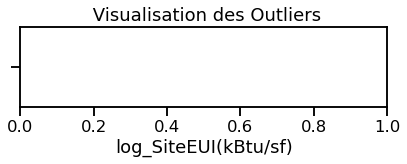

pour le groupe Financial Office et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


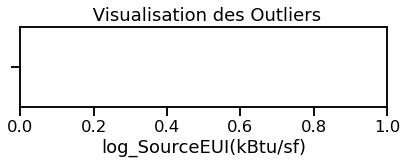

pour le groupe Financial Office et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


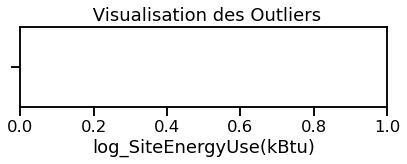

pour le groupe Financial Office et la feature log_SteamUse(kBtu)
il y a 0 outliers


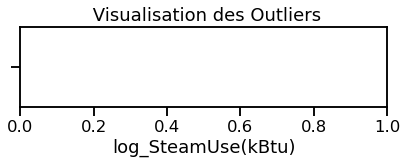

pour le groupe Financial Office et la feature log_Electricity(kBtu)
il y a 0 outliers


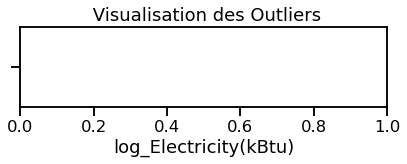

pour le groupe Financial Office et la feature log_NaturalGas(kBtu)
il y a 0 outliers


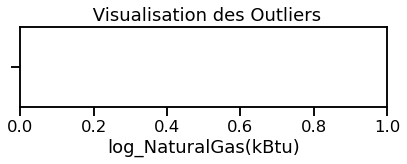

pour le groupe Financial Office et la feature log_TotalGHGEmissions
il y a 0 outliers


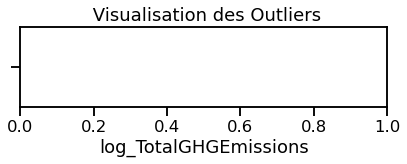

pour le groupe Repair Services (Vehicle, Shoe, Locksmith, etc) et la feature log_YearBuilt
il y a 0 outliers


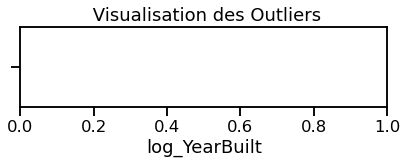

pour le groupe Repair Services (Vehicle, Shoe, Locksmith, etc) et la feature log_NumberofBuildings
il y a 0 outliers


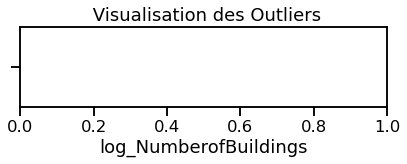

pour le groupe Repair Services (Vehicle, Shoe, Locksmith, etc) et la feature log_NumberofFloors
il y a 0 outliers


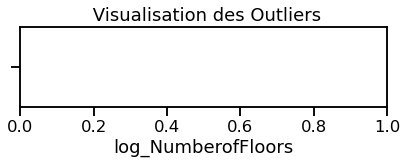

pour le groupe Repair Services (Vehicle, Shoe, Locksmith, etc) et la feature log_PropertyGFATotal
il y a 0 outliers


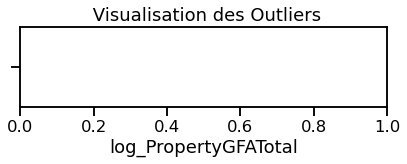

pour le groupe Repair Services (Vehicle, Shoe, Locksmith, etc) et la feature log_PropertyGFAParking
il y a 0 outliers


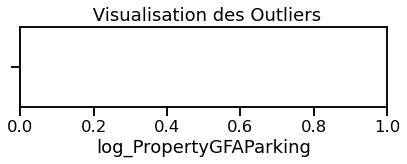

pour le groupe Repair Services (Vehicle, Shoe, Locksmith, etc) et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


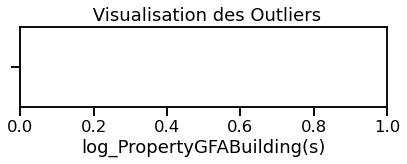

pour le groupe Repair Services (Vehicle, Shoe, Locksmith, etc) et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


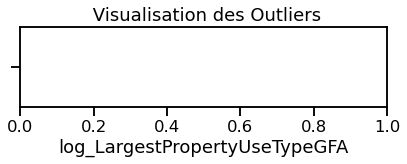

pour le groupe Repair Services (Vehicle, Shoe, Locksmith, etc) et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


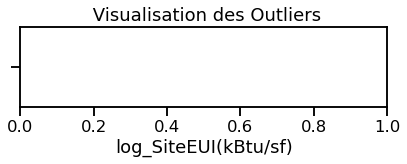

pour le groupe Repair Services (Vehicle, Shoe, Locksmith, etc) et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


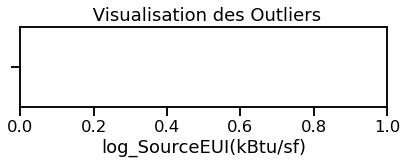

pour le groupe Repair Services (Vehicle, Shoe, Locksmith, etc) et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


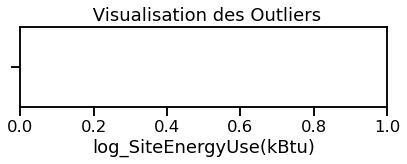

pour le groupe Repair Services (Vehicle, Shoe, Locksmith, etc) et la feature log_SteamUse(kBtu)
il y a 0 outliers


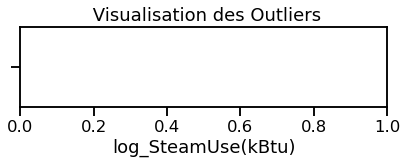

pour le groupe Repair Services (Vehicle, Shoe, Locksmith, etc) et la feature log_Electricity(kBtu)
il y a 0 outliers


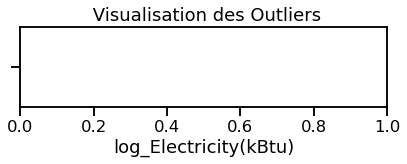

pour le groupe Repair Services (Vehicle, Shoe, Locksmith, etc) et la feature log_NaturalGas(kBtu)
il y a 0 outliers


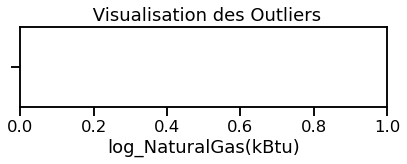

pour le groupe Repair Services (Vehicle, Shoe, Locksmith, etc) et la feature log_TotalGHGEmissions
il y a 0 outliers


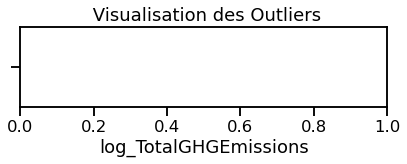

pour le groupe Other - Lodging/Residential et la feature log_YearBuilt
il y a 0 outliers


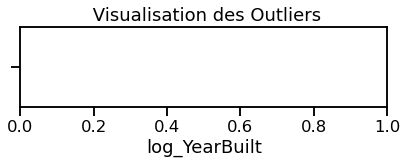

pour le groupe Other - Lodging/Residential et la feature log_NumberofBuildings
il y a 0 outliers


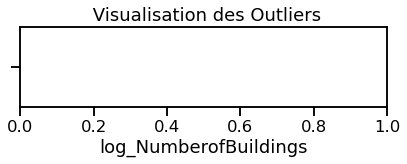

pour le groupe Other - Lodging/Residential et la feature log_NumberofFloors
il y a 0 outliers


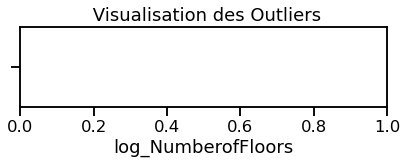

pour le groupe Other - Lodging/Residential et la feature log_PropertyGFATotal
il y a 0 outliers


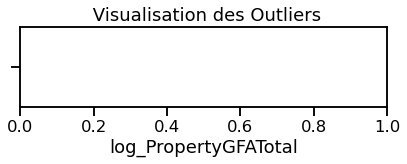

pour le groupe Other - Lodging/Residential et la feature log_PropertyGFAParking
il y a 0 outliers


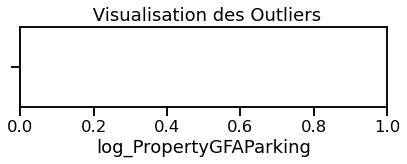

pour le groupe Other - Lodging/Residential et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


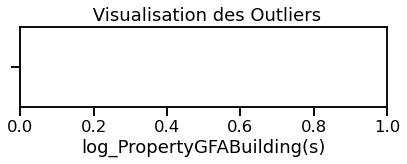

pour le groupe Other - Lodging/Residential et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


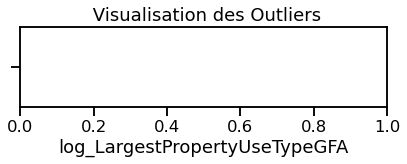

pour le groupe Other - Lodging/Residential et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


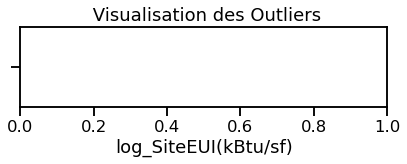

pour le groupe Other - Lodging/Residential et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


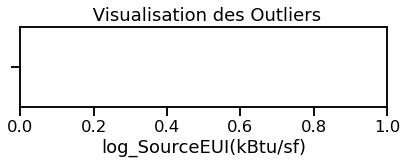

pour le groupe Other - Lodging/Residential et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


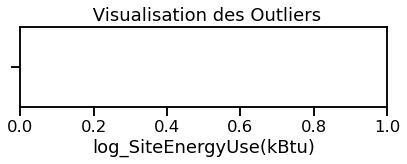

pour le groupe Other - Lodging/Residential et la feature log_SteamUse(kBtu)
il y a 0 outliers


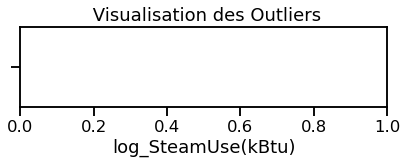

pour le groupe Other - Lodging/Residential et la feature log_Electricity(kBtu)
il y a 0 outliers


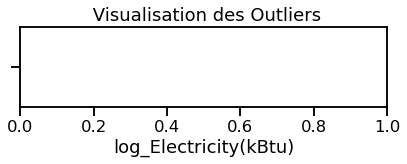

pour le groupe Other - Lodging/Residential et la feature log_NaturalGas(kBtu)
il y a 0 outliers


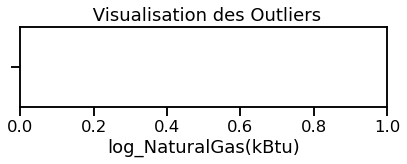

pour le groupe Other - Lodging/Residential et la feature log_TotalGHGEmissions
il y a 0 outliers


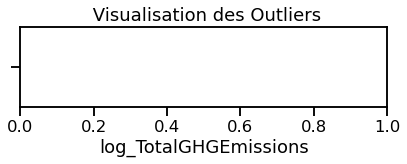

pour le groupe Bank Branch et la feature log_YearBuilt
il y a 0 outliers


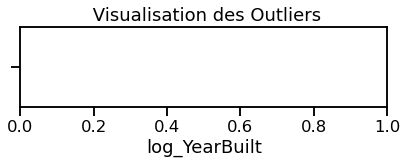

pour le groupe Bank Branch et la feature log_NumberofBuildings
il y a 0 outliers


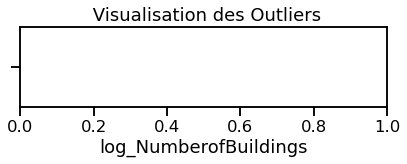

pour le groupe Bank Branch et la feature log_NumberofFloors
il y a 0 outliers


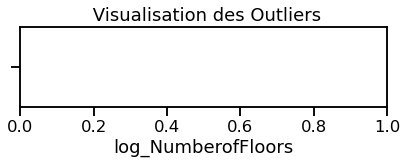

pour le groupe Bank Branch et la feature log_PropertyGFATotal
il y a 0 outliers


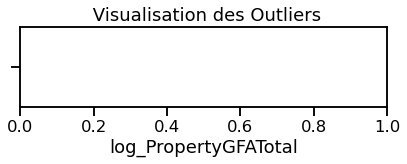

pour le groupe Bank Branch et la feature log_PropertyGFAParking
il y a 0 outliers


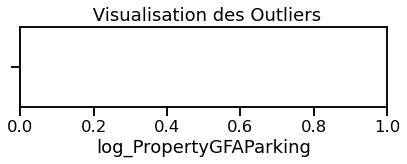

pour le groupe Bank Branch et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


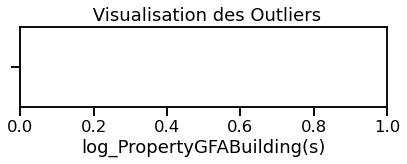

pour le groupe Bank Branch et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


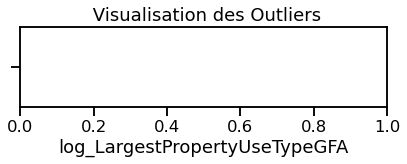

pour le groupe Bank Branch et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


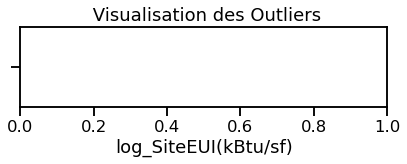

pour le groupe Bank Branch et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


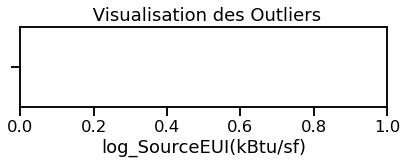

pour le groupe Bank Branch et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


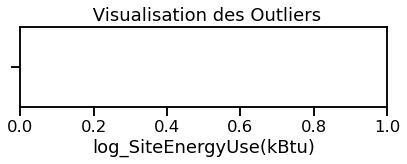

pour le groupe Bank Branch et la feature log_SteamUse(kBtu)
il y a 0 outliers


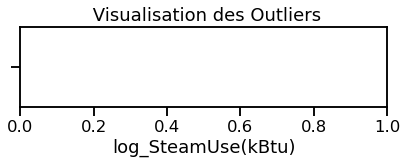

pour le groupe Bank Branch et la feature log_Electricity(kBtu)
il y a 0 outliers


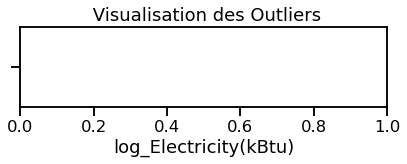

pour le groupe Bank Branch et la feature log_NaturalGas(kBtu)
il y a 0 outliers


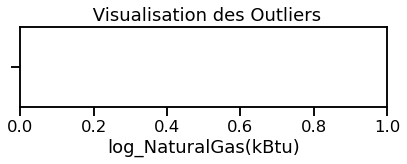

pour le groupe Bank Branch et la feature log_TotalGHGEmissions
il y a 0 outliers


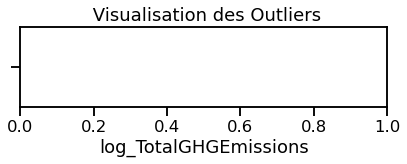

pour le groupe Multifamily Housing et la feature log_YearBuilt
il y a 0 outliers


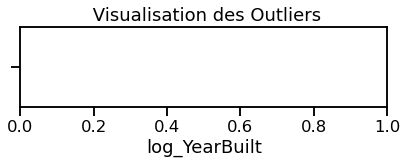

pour le groupe Multifamily Housing et la feature log_NumberofBuildings
il y a 0 outliers


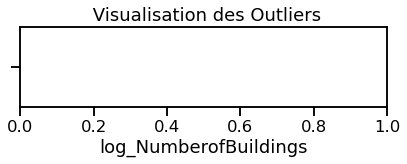

pour le groupe Multifamily Housing et la feature log_NumberofFloors
il y a 0 outliers


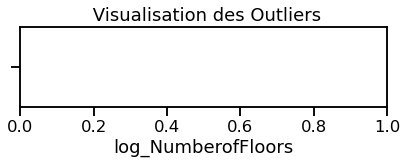

pour le groupe Multifamily Housing et la feature log_PropertyGFATotal
il y a 0 outliers


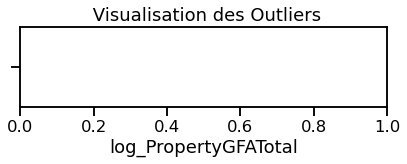

pour le groupe Multifamily Housing et la feature log_PropertyGFAParking
il y a 0 outliers


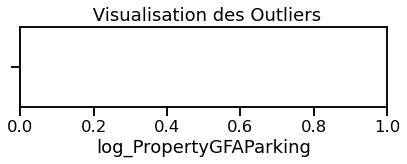

pour le groupe Multifamily Housing et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


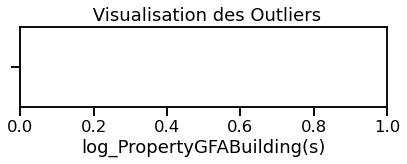

pour le groupe Multifamily Housing et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


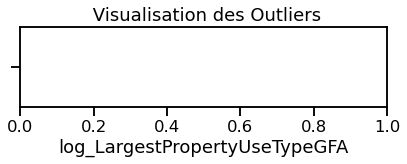

pour le groupe Multifamily Housing et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


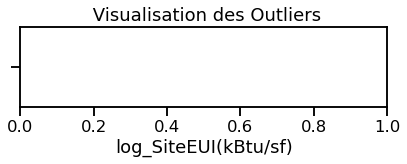

pour le groupe Multifamily Housing et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


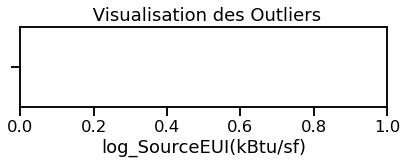

pour le groupe Multifamily Housing et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


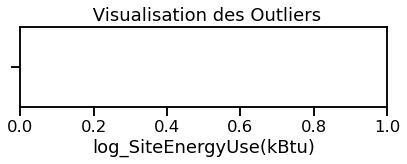

pour le groupe Multifamily Housing et la feature log_SteamUse(kBtu)
il y a 0 outliers


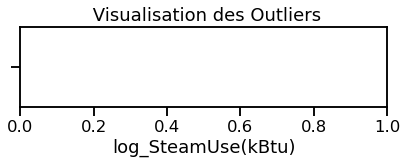

pour le groupe Multifamily Housing et la feature log_Electricity(kBtu)
il y a 0 outliers


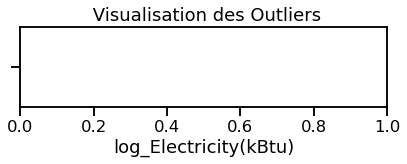

pour le groupe Multifamily Housing et la feature log_NaturalGas(kBtu)
il y a 0 outliers


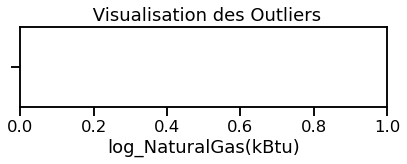

pour le groupe Multifamily Housing et la feature log_TotalGHGEmissions
il y a 0 outliers


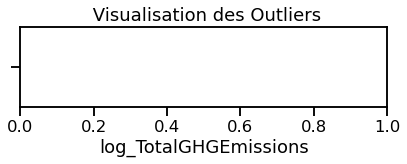

pour le groupe Food Sales et la feature log_YearBuilt
il y a 0 outliers


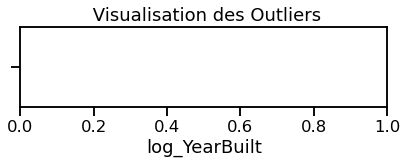

pour le groupe Food Sales et la feature log_NumberofBuildings
il y a 0 outliers


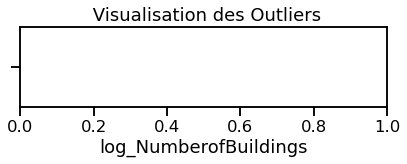

pour le groupe Food Sales et la feature log_NumberofFloors
il y a 0 outliers


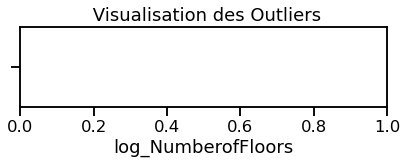

pour le groupe Food Sales et la feature log_PropertyGFATotal
il y a 0 outliers


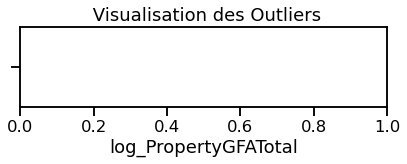

pour le groupe Food Sales et la feature log_PropertyGFAParking
il y a 0 outliers


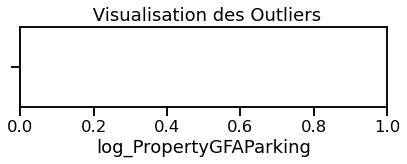

pour le groupe Food Sales et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


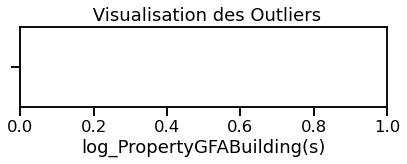

pour le groupe Food Sales et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


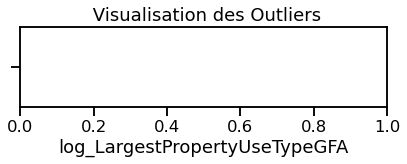

pour le groupe Food Sales et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


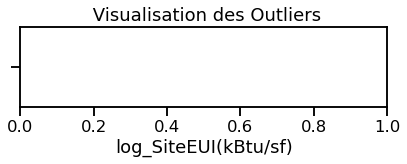

pour le groupe Food Sales et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


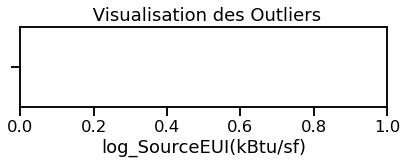

pour le groupe Food Sales et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


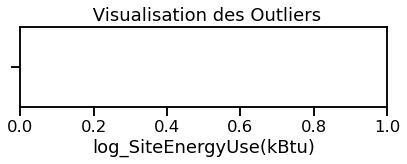

pour le groupe Food Sales et la feature log_SteamUse(kBtu)
il y a 0 outliers


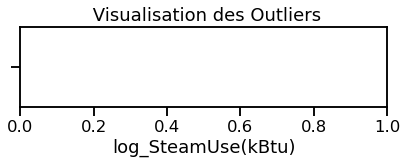

pour le groupe Food Sales et la feature log_Electricity(kBtu)
il y a 0 outliers


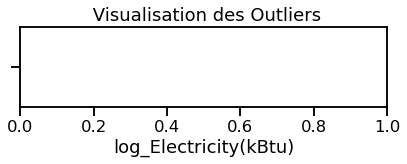

pour le groupe Food Sales et la feature log_NaturalGas(kBtu)
il y a 0 outliers


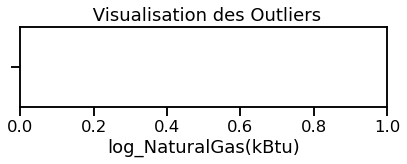

pour le groupe Food Sales et la feature log_TotalGHGEmissions
il y a 0 outliers


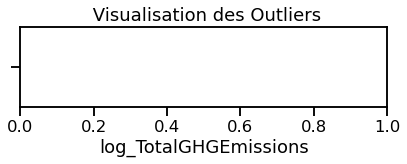

pour le groupe Other - Public Services et la feature log_YearBuilt
il y a 0 outliers


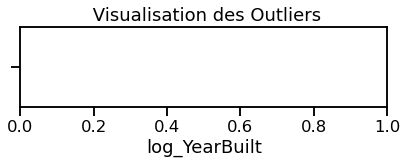

pour le groupe Other - Public Services et la feature log_NumberofBuildings
il y a 0 outliers


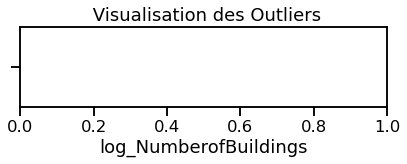

pour le groupe Other - Public Services et la feature log_NumberofFloors
il y a 0 outliers


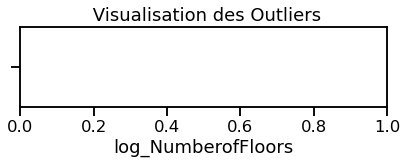

pour le groupe Other - Public Services et la feature log_PropertyGFATotal
il y a 0 outliers


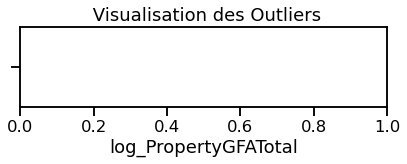

pour le groupe Other - Public Services et la feature log_PropertyGFAParking
il y a 0 outliers


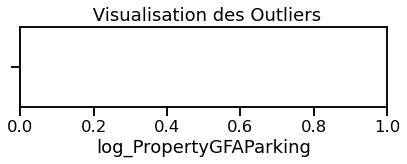

pour le groupe Other - Public Services et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


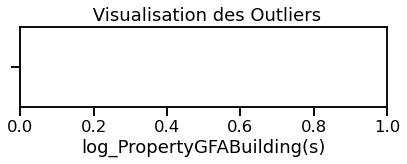

pour le groupe Other - Public Services et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


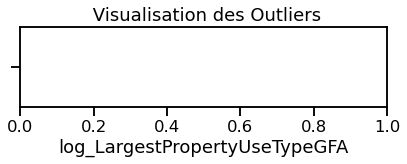

pour le groupe Other - Public Services et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


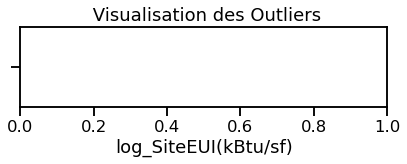

pour le groupe Other - Public Services et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


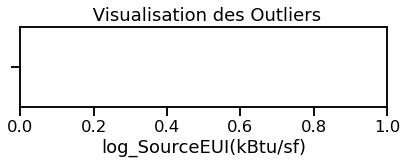

pour le groupe Other - Public Services et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


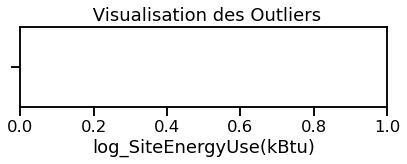

pour le groupe Other - Public Services et la feature log_SteamUse(kBtu)
il y a 0 outliers


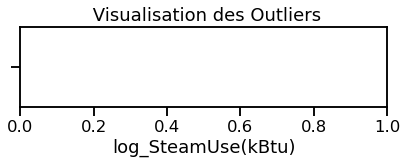

pour le groupe Other - Public Services et la feature log_Electricity(kBtu)
il y a 0 outliers


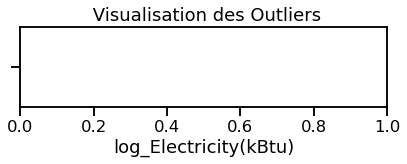

pour le groupe Other - Public Services et la feature log_NaturalGas(kBtu)
il y a 0 outliers


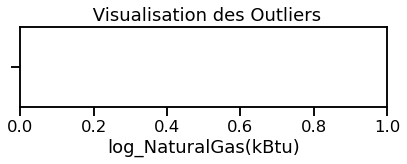

pour le groupe Other - Public Services et la feature log_TotalGHGEmissions
il y a 0 outliers


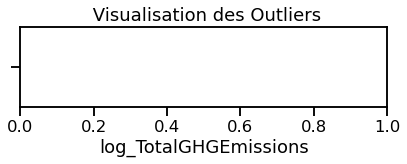

pour le groupe Food Service et la feature log_YearBuilt
il y a 0 outliers


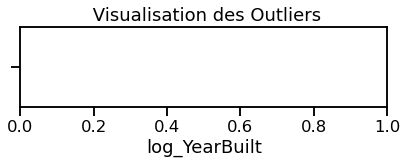

pour le groupe Food Service et la feature log_NumberofBuildings
il y a 0 outliers


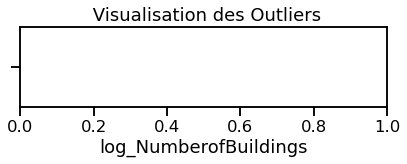

pour le groupe Food Service et la feature log_NumberofFloors
il y a 0 outliers


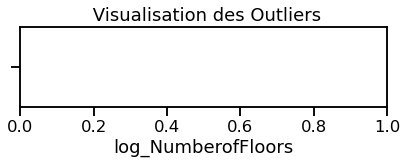

pour le groupe Food Service et la feature log_PropertyGFATotal
il y a 0 outliers


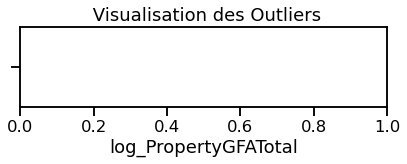

pour le groupe Food Service et la feature log_PropertyGFAParking
il y a 0 outliers


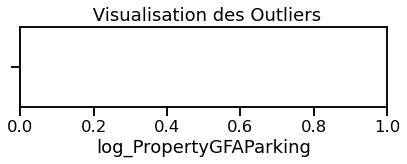

pour le groupe Food Service et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


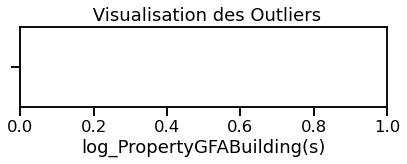

pour le groupe Food Service et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


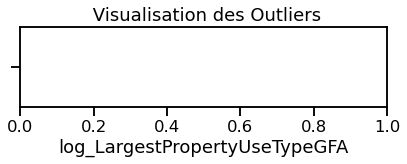

pour le groupe Food Service et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


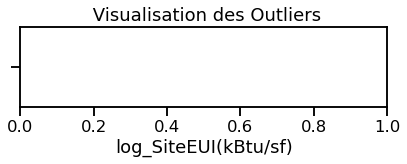

pour le groupe Food Service et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


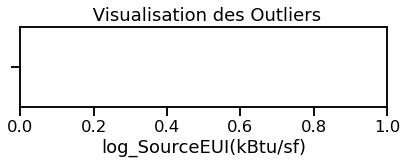

pour le groupe Food Service et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


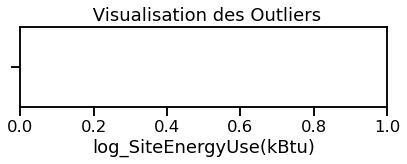

pour le groupe Food Service et la feature log_SteamUse(kBtu)
il y a 0 outliers


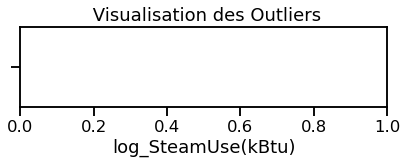

pour le groupe Food Service et la feature log_Electricity(kBtu)
il y a 0 outliers


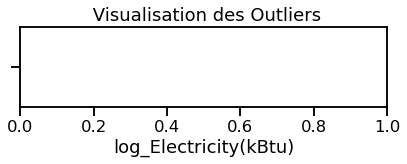

pour le groupe Food Service et la feature log_NaturalGas(kBtu)
il y a 0 outliers


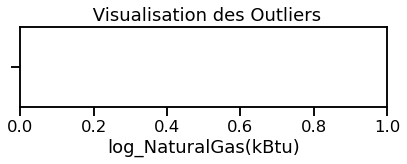

pour le groupe Food Service et la feature log_TotalGHGEmissions
il y a 0 outliers


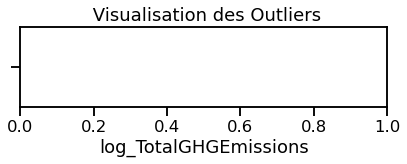

pour le groupe Manufacturing/Industrial Plant et la feature log_YearBuilt
il y a 0 outliers


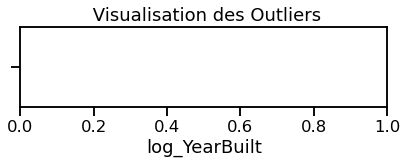

pour le groupe Manufacturing/Industrial Plant et la feature log_NumberofBuildings
il y a 0 outliers


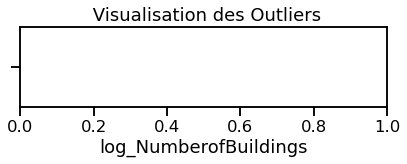

pour le groupe Manufacturing/Industrial Plant et la feature log_NumberofFloors
il y a 0 outliers


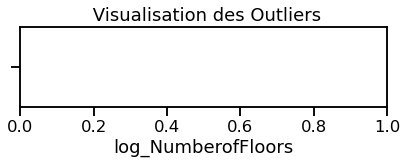

pour le groupe Manufacturing/Industrial Plant et la feature log_PropertyGFATotal
il y a 0 outliers


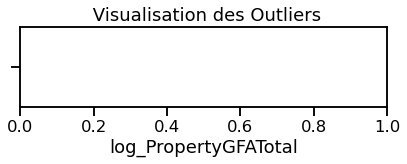

pour le groupe Manufacturing/Industrial Plant et la feature log_PropertyGFAParking
il y a 0 outliers


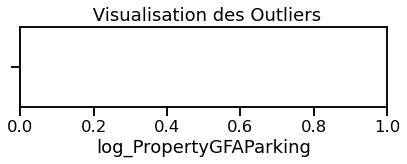

pour le groupe Manufacturing/Industrial Plant et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


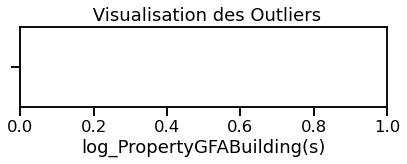

pour le groupe Manufacturing/Industrial Plant et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


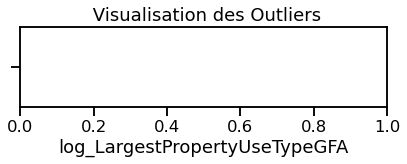

pour le groupe Manufacturing/Industrial Plant et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


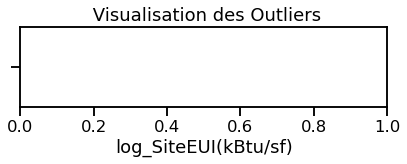

pour le groupe Manufacturing/Industrial Plant et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


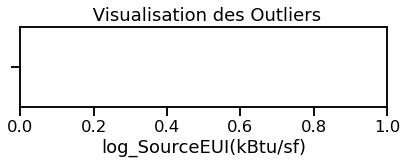

pour le groupe Manufacturing/Industrial Plant et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


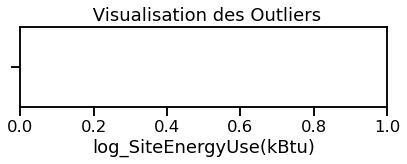

pour le groupe Manufacturing/Industrial Plant et la feature log_SteamUse(kBtu)
il y a 0 outliers


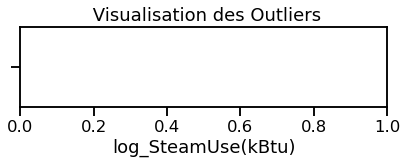

pour le groupe Manufacturing/Industrial Plant et la feature log_Electricity(kBtu)
il y a 0 outliers


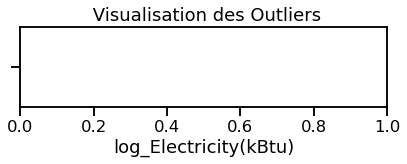

pour le groupe Manufacturing/Industrial Plant et la feature log_NaturalGas(kBtu)
il y a 0 outliers


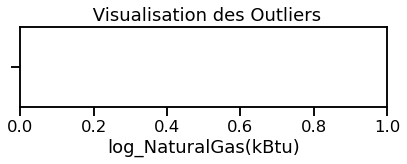

pour le groupe Manufacturing/Industrial Plant et la feature log_TotalGHGEmissions
il y a 0 outliers


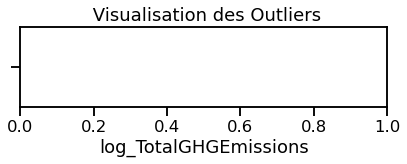

pour le groupe Hospital (General Medical & Surgical) et la feature log_YearBuilt
il y a 0 outliers


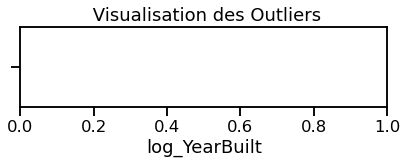

pour le groupe Hospital (General Medical & Surgical) et la feature log_NumberofBuildings
il y a 0 outliers


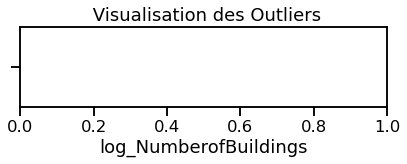

pour le groupe Hospital (General Medical & Surgical) et la feature log_NumberofFloors
il y a 0 outliers


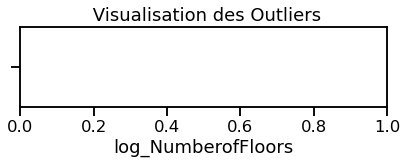

pour le groupe Hospital (General Medical & Surgical) et la feature log_PropertyGFATotal
il y a 0 outliers


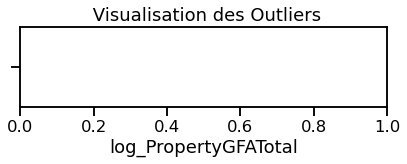

pour le groupe Hospital (General Medical & Surgical) et la feature log_PropertyGFAParking
il y a 0 outliers


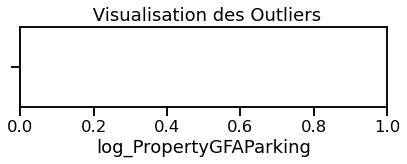

pour le groupe Hospital (General Medical & Surgical) et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


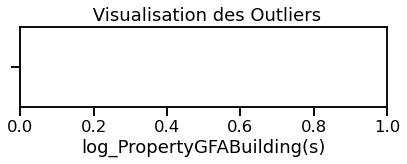

pour le groupe Hospital (General Medical & Surgical) et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


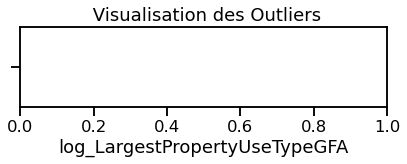

pour le groupe Hospital (General Medical & Surgical) et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


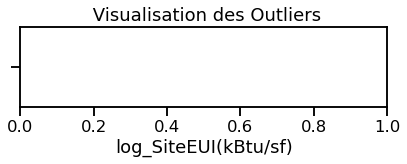

pour le groupe Hospital (General Medical & Surgical) et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


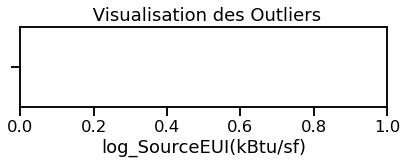

pour le groupe Hospital (General Medical & Surgical) et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


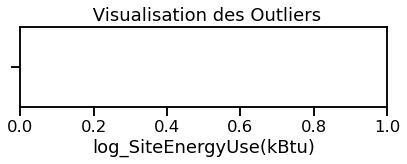

pour le groupe Hospital (General Medical & Surgical) et la feature log_SteamUse(kBtu)
il y a 0 outliers


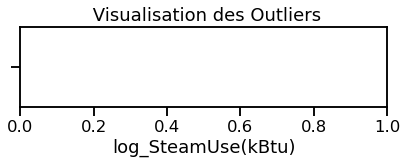

pour le groupe Hospital (General Medical & Surgical) et la feature log_Electricity(kBtu)
il y a 0 outliers


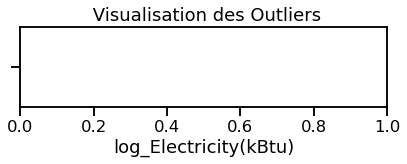

pour le groupe Hospital (General Medical & Surgical) et la feature log_NaturalGas(kBtu)
il y a 0 outliers


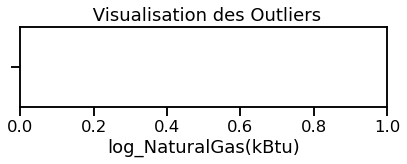

pour le groupe Hospital (General Medical & Surgical) et la feature log_TotalGHGEmissions
il y a 0 outliers


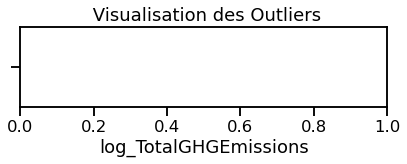

pour le groupe Personal Services (Health/Beauty, Dry Cleaning, etc) et la feature log_YearBuilt
il y a 0 outliers


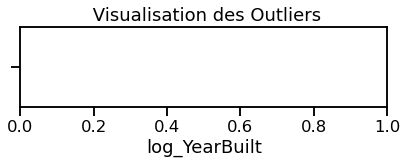

pour le groupe Personal Services (Health/Beauty, Dry Cleaning, etc) et la feature log_NumberofBuildings
il y a 0 outliers


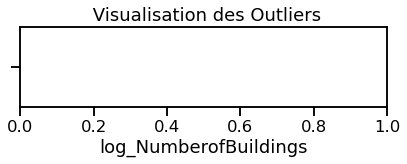

pour le groupe Personal Services (Health/Beauty, Dry Cleaning, etc) et la feature log_NumberofFloors
il y a 0 outliers


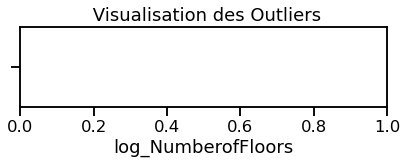

pour le groupe Personal Services (Health/Beauty, Dry Cleaning, etc) et la feature log_PropertyGFATotal
il y a 0 outliers


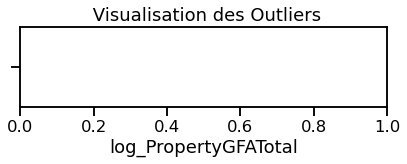

pour le groupe Personal Services (Health/Beauty, Dry Cleaning, etc) et la feature log_PropertyGFAParking
il y a 0 outliers


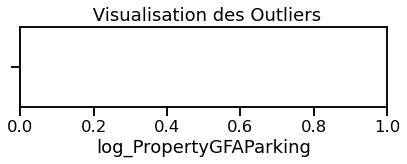

pour le groupe Personal Services (Health/Beauty, Dry Cleaning, etc) et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


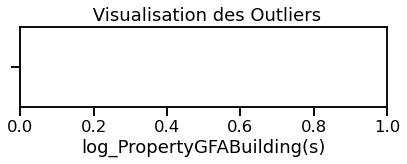

pour le groupe Personal Services (Health/Beauty, Dry Cleaning, etc) et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


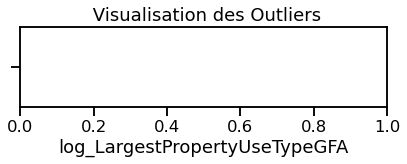

pour le groupe Personal Services (Health/Beauty, Dry Cleaning, etc) et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


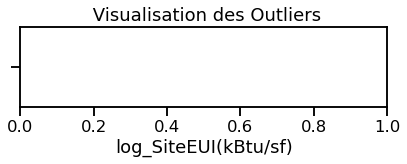

pour le groupe Personal Services (Health/Beauty, Dry Cleaning, etc) et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


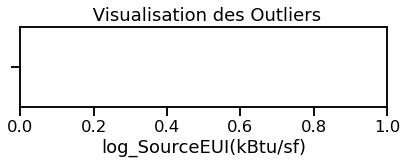

pour le groupe Personal Services (Health/Beauty, Dry Cleaning, etc) et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


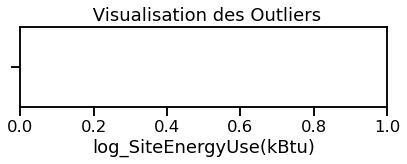

pour le groupe Personal Services (Health/Beauty, Dry Cleaning, etc) et la feature log_SteamUse(kBtu)
il y a 0 outliers


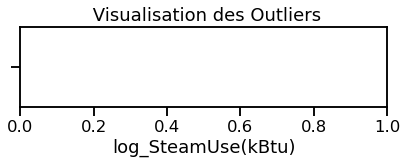

pour le groupe Personal Services (Health/Beauty, Dry Cleaning, etc) et la feature log_Electricity(kBtu)
il y a 0 outliers


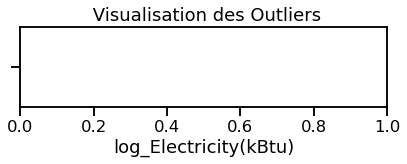

pour le groupe Personal Services (Health/Beauty, Dry Cleaning, etc) et la feature log_NaturalGas(kBtu)
il y a 0 outliers


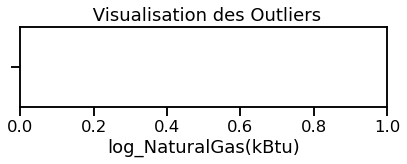

pour le groupe Personal Services (Health/Beauty, Dry Cleaning, etc) et la feature log_TotalGHGEmissions
il y a 0 outliers


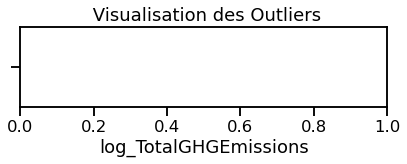

pour le groupe Enclosed Mall et la feature log_YearBuilt
il y a 0 outliers


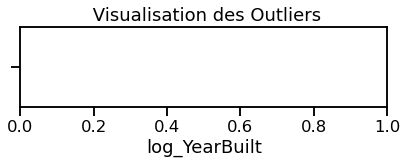

pour le groupe Enclosed Mall et la feature log_NumberofBuildings
il y a 0 outliers


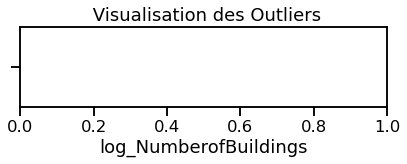

pour le groupe Enclosed Mall et la feature log_NumberofFloors
il y a 0 outliers


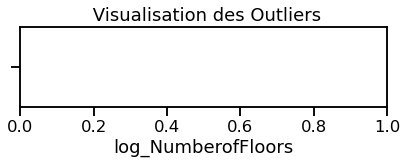

pour le groupe Enclosed Mall et la feature log_PropertyGFATotal
il y a 0 outliers


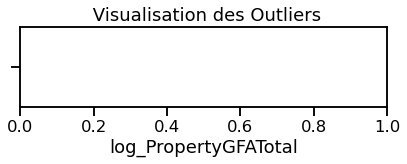

pour le groupe Enclosed Mall et la feature log_PropertyGFAParking
il y a 0 outliers


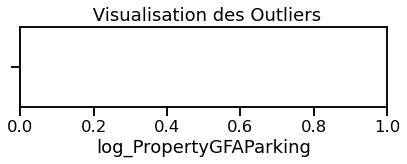

pour le groupe Enclosed Mall et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


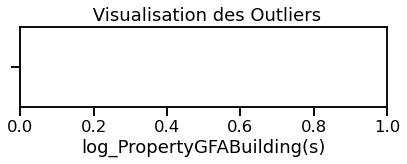

pour le groupe Enclosed Mall et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


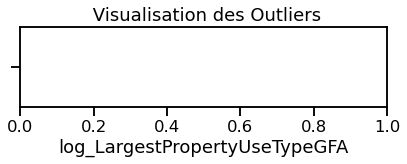

pour le groupe Enclosed Mall et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


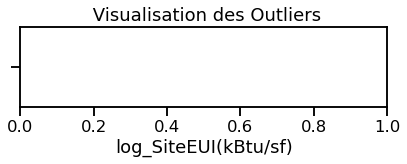

pour le groupe Enclosed Mall et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


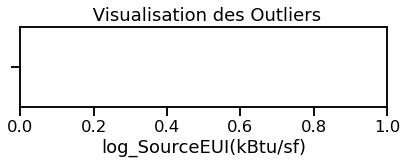

pour le groupe Enclosed Mall et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


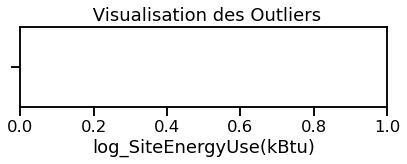

pour le groupe Enclosed Mall et la feature log_SteamUse(kBtu)
il y a 0 outliers


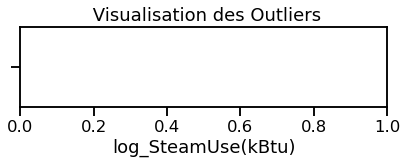

pour le groupe Enclosed Mall et la feature log_Electricity(kBtu)
il y a 0 outliers


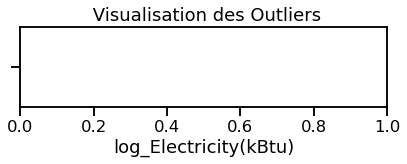

pour le groupe Enclosed Mall et la feature log_NaturalGas(kBtu)
il y a 0 outliers


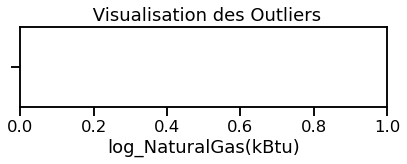

pour le groupe Enclosed Mall et la feature log_TotalGHGEmissions
il y a 0 outliers


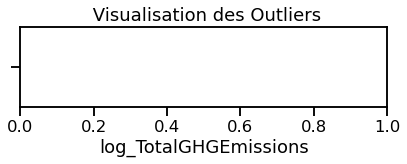

pour le groupe Pre-school/Daycare et la feature log_YearBuilt
il y a 0 outliers


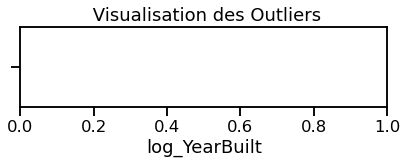

pour le groupe Pre-school/Daycare et la feature log_NumberofBuildings
il y a 0 outliers


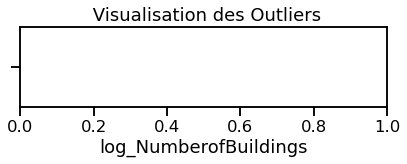

pour le groupe Pre-school/Daycare et la feature log_NumberofFloors
il y a 0 outliers


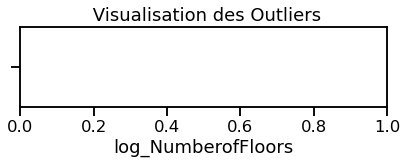

pour le groupe Pre-school/Daycare et la feature log_PropertyGFATotal
il y a 0 outliers


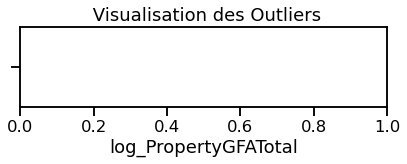

pour le groupe Pre-school/Daycare et la feature log_PropertyGFAParking
il y a 0 outliers


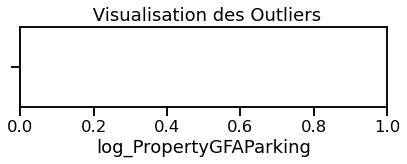

pour le groupe Pre-school/Daycare et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


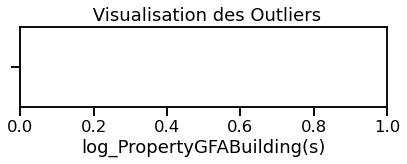

pour le groupe Pre-school/Daycare et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


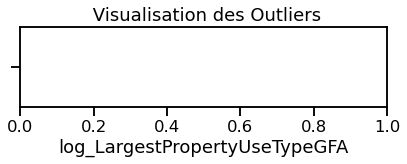

pour le groupe Pre-school/Daycare et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


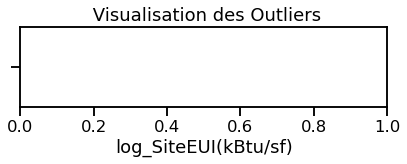

pour le groupe Pre-school/Daycare et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


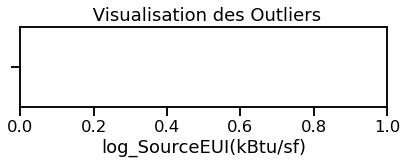

pour le groupe Pre-school/Daycare et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


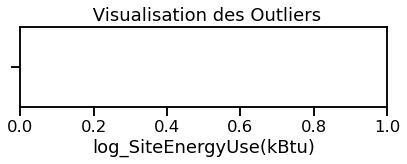

pour le groupe Pre-school/Daycare et la feature log_SteamUse(kBtu)
il y a 0 outliers


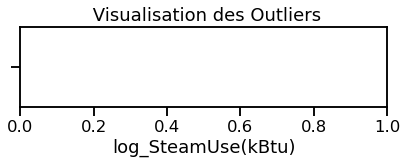

pour le groupe Pre-school/Daycare et la feature log_Electricity(kBtu)
il y a 0 outliers


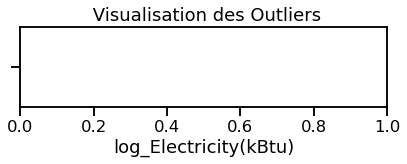

pour le groupe Pre-school/Daycare et la feature log_NaturalGas(kBtu)
il y a 0 outliers


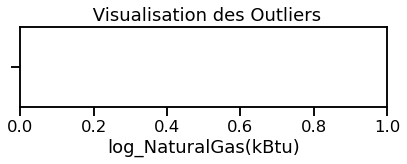

pour le groupe Pre-school/Daycare et la feature log_TotalGHGEmissions
il y a 0 outliers


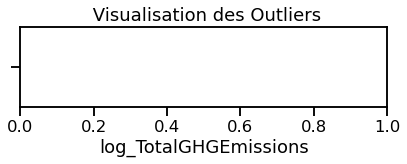

pour le groupe Social/Meeting Hall et la feature log_YearBuilt
il y a 0 outliers


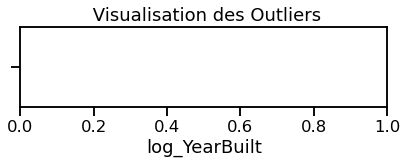

pour le groupe Social/Meeting Hall et la feature log_NumberofBuildings
il y a 0 outliers


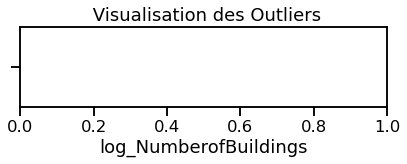

pour le groupe Social/Meeting Hall et la feature log_NumberofFloors
il y a 0 outliers


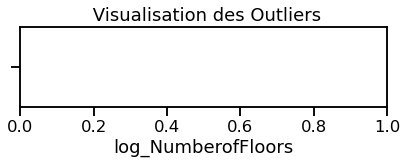

pour le groupe Social/Meeting Hall et la feature log_PropertyGFATotal
il y a 0 outliers


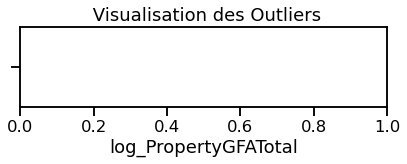

pour le groupe Social/Meeting Hall et la feature log_PropertyGFAParking
il y a 0 outliers


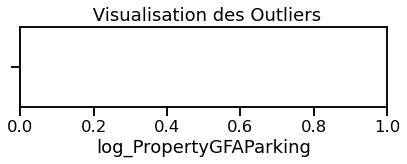

pour le groupe Social/Meeting Hall et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


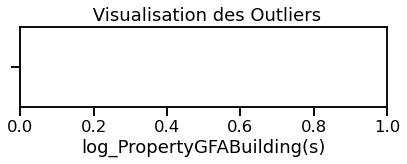

pour le groupe Social/Meeting Hall et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


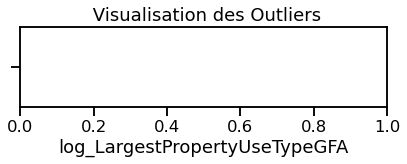

pour le groupe Social/Meeting Hall et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


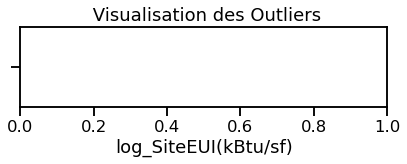

pour le groupe Social/Meeting Hall et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


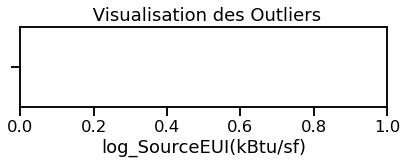

pour le groupe Social/Meeting Hall et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


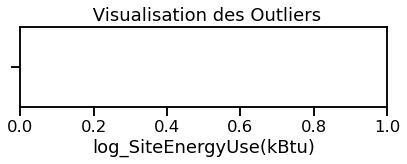

pour le groupe Social/Meeting Hall et la feature log_SteamUse(kBtu)
il y a 0 outliers


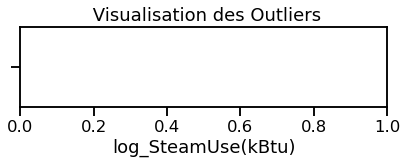

pour le groupe Social/Meeting Hall et la feature log_Electricity(kBtu)
il y a 0 outliers


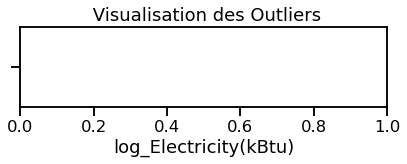

pour le groupe Social/Meeting Hall et la feature log_NaturalGas(kBtu)
il y a 0 outliers


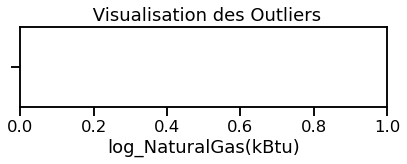

pour le groupe Social/Meeting Hall et la feature log_TotalGHGEmissions
il y a 0 outliers


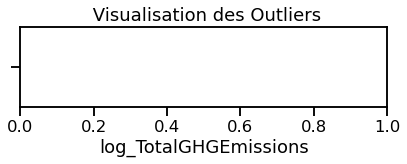

pour le groupe Other/Specialty Hospital et la feature log_YearBuilt
il y a 0 outliers


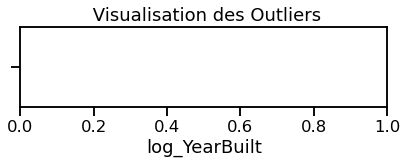

pour le groupe Other/Specialty Hospital et la feature log_NumberofBuildings
il y a 0 outliers


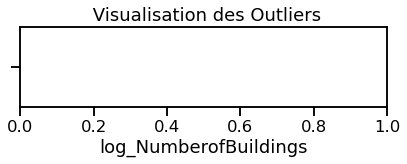

pour le groupe Other/Specialty Hospital et la feature log_NumberofFloors
il y a 0 outliers


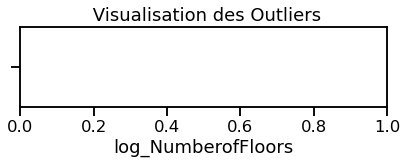

pour le groupe Other/Specialty Hospital et la feature log_PropertyGFATotal
il y a 0 outliers


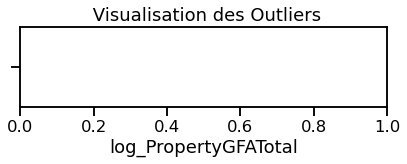

pour le groupe Other/Specialty Hospital et la feature log_PropertyGFAParking
il y a 0 outliers


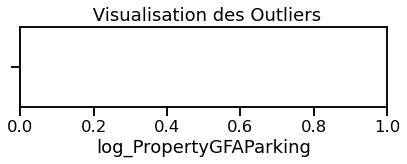

pour le groupe Other/Specialty Hospital et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


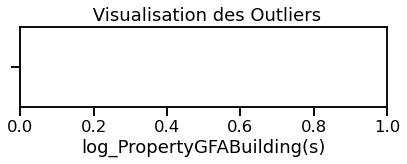

pour le groupe Other/Specialty Hospital et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


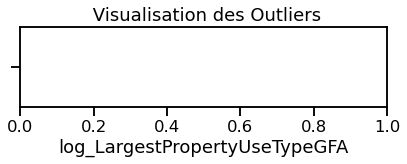

pour le groupe Other/Specialty Hospital et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


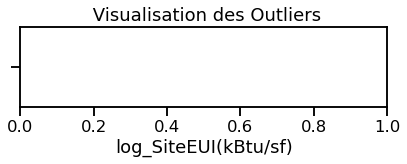

pour le groupe Other/Specialty Hospital et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


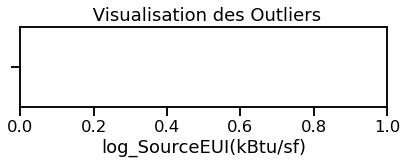

pour le groupe Other/Specialty Hospital et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


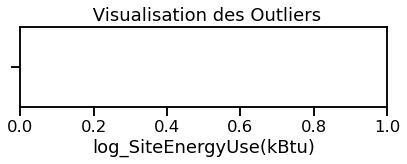

pour le groupe Other/Specialty Hospital et la feature log_SteamUse(kBtu)
il y a 0 outliers


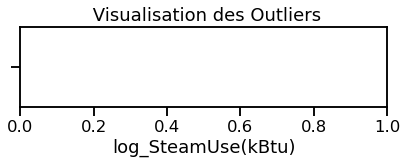

pour le groupe Other/Specialty Hospital et la feature log_Electricity(kBtu)
il y a 0 outliers


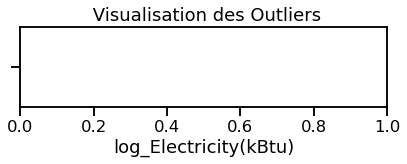

pour le groupe Other/Specialty Hospital et la feature log_NaturalGas(kBtu)
il y a 0 outliers


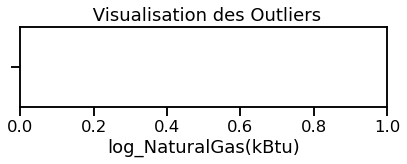

pour le groupe Other/Specialty Hospital et la feature log_TotalGHGEmissions
il y a 0 outliers


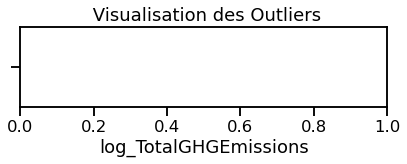

pour le groupe Fast Food Restaurant et la feature log_YearBuilt
il y a 0 outliers


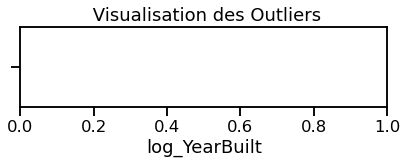

pour le groupe Fast Food Restaurant et la feature log_NumberofBuildings
il y a 0 outliers


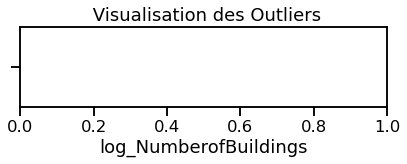

pour le groupe Fast Food Restaurant et la feature log_NumberofFloors
il y a 0 outliers


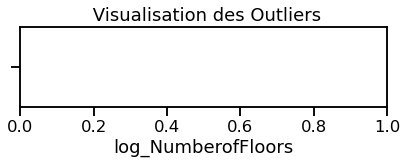

pour le groupe Fast Food Restaurant et la feature log_PropertyGFATotal
il y a 0 outliers


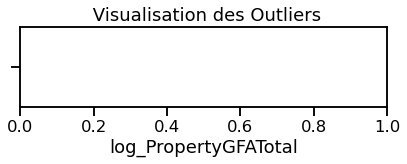

pour le groupe Fast Food Restaurant et la feature log_PropertyGFAParking
il y a 0 outliers


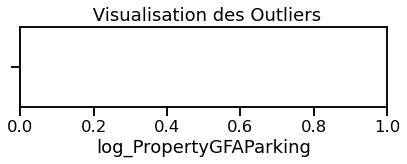

pour le groupe Fast Food Restaurant et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


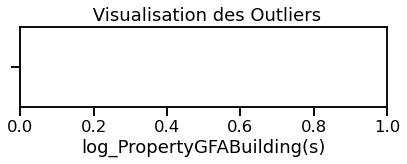

pour le groupe Fast Food Restaurant et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


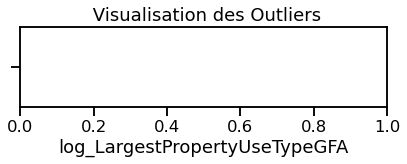

pour le groupe Fast Food Restaurant et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


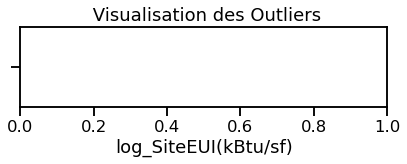

pour le groupe Fast Food Restaurant et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


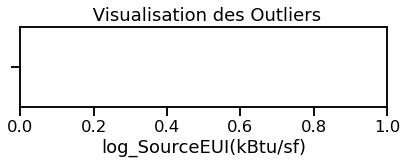

pour le groupe Fast Food Restaurant et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


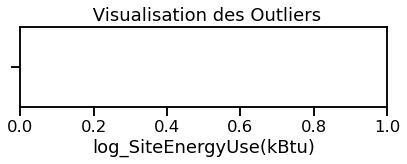

pour le groupe Fast Food Restaurant et la feature log_SteamUse(kBtu)
il y a 0 outliers


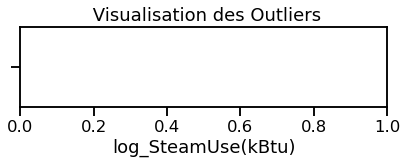

pour le groupe Fast Food Restaurant et la feature log_Electricity(kBtu)
il y a 0 outliers


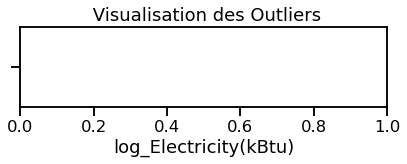

pour le groupe Fast Food Restaurant et la feature log_NaturalGas(kBtu)
il y a 0 outliers


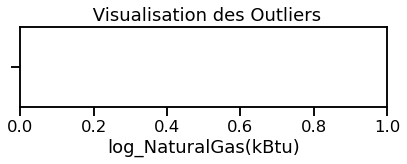

pour le groupe Fast Food Restaurant et la feature log_TotalGHGEmissions
il y a 0 outliers


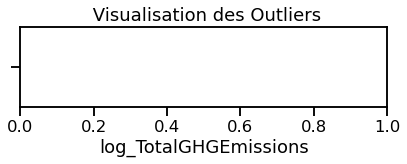

pour le groupe Other - Utility et la feature log_YearBuilt
il y a 0 outliers


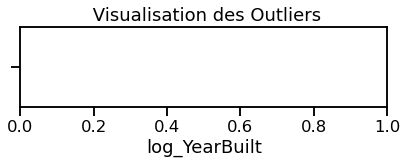

pour le groupe Other - Utility et la feature log_NumberofBuildings
il y a 0 outliers


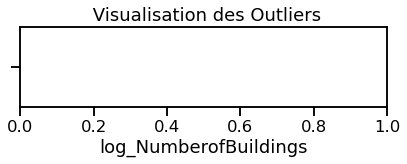

pour le groupe Other - Utility et la feature log_NumberofFloors
il y a 0 outliers


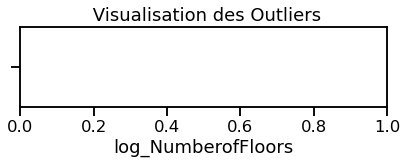

pour le groupe Other - Utility et la feature log_PropertyGFATotal
il y a 0 outliers


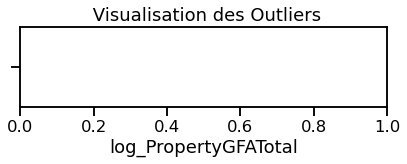

pour le groupe Other - Utility et la feature log_PropertyGFAParking
il y a 0 outliers


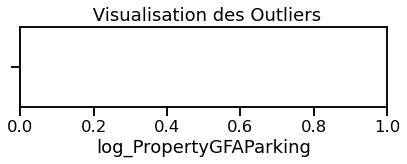

pour le groupe Other - Utility et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


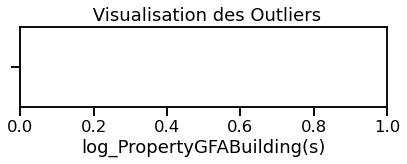

pour le groupe Other - Utility et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


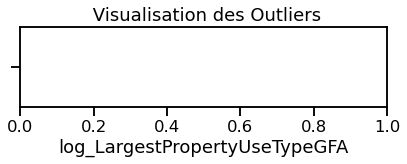

pour le groupe Other - Utility et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


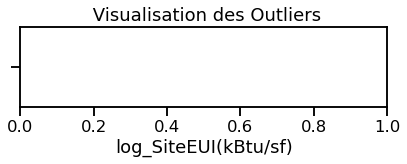

pour le groupe Other - Utility et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


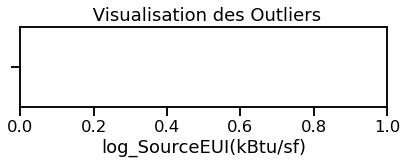

pour le groupe Other - Utility et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


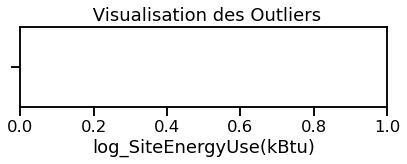

pour le groupe Other - Utility et la feature log_SteamUse(kBtu)
il y a 0 outliers


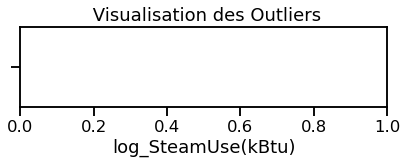

pour le groupe Other - Utility et la feature log_Electricity(kBtu)
il y a 0 outliers


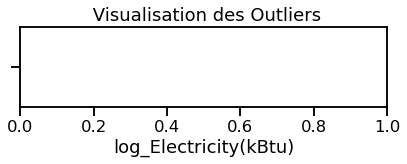

pour le groupe Other - Utility et la feature log_NaturalGas(kBtu)
il y a 0 outliers


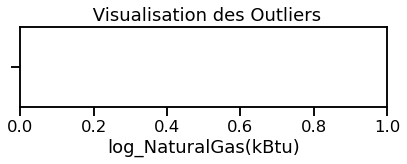

pour le groupe Other - Utility et la feature log_TotalGHGEmissions
il y a 0 outliers


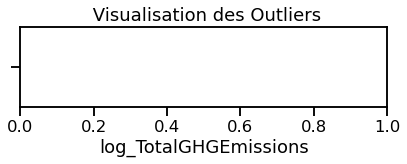

pour le groupe Other - Technology/Science et la feature log_YearBuilt
il y a 0 outliers


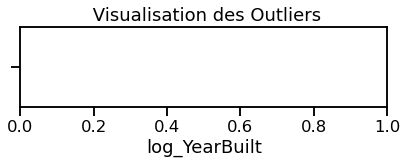

pour le groupe Other - Technology/Science et la feature log_NumberofBuildings
il y a 0 outliers


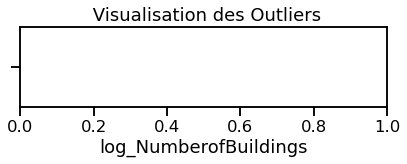

pour le groupe Other - Technology/Science et la feature log_NumberofFloors
il y a 0 outliers


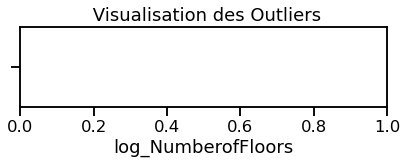

pour le groupe Other - Technology/Science et la feature log_PropertyGFATotal
il y a 0 outliers


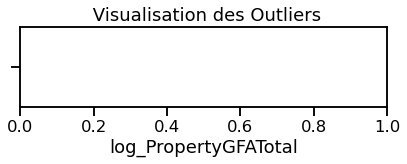

pour le groupe Other - Technology/Science et la feature log_PropertyGFAParking
il y a 0 outliers


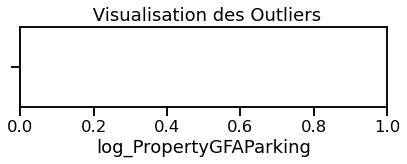

pour le groupe Other - Technology/Science et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


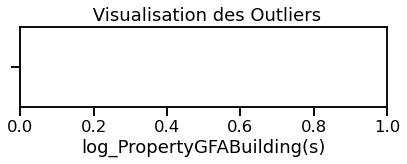

pour le groupe Other - Technology/Science et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


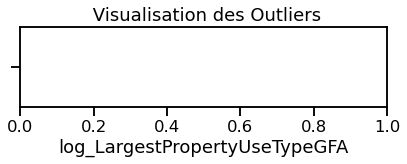

pour le groupe Other - Technology/Science et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


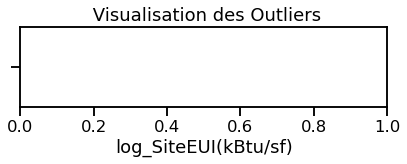

pour le groupe Other - Technology/Science et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


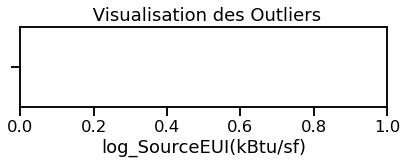

pour le groupe Other - Technology/Science et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


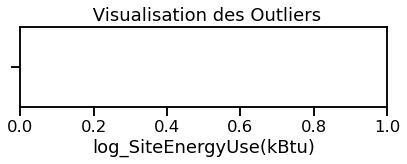

pour le groupe Other - Technology/Science et la feature log_SteamUse(kBtu)
il y a 0 outliers


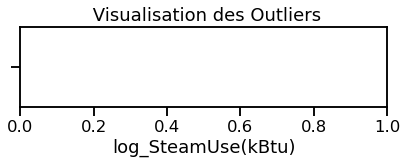

pour le groupe Other - Technology/Science et la feature log_Electricity(kBtu)
il y a 0 outliers


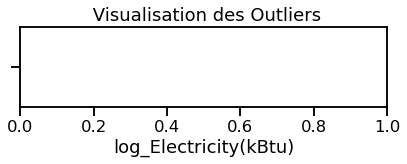

pour le groupe Other - Technology/Science et la feature log_NaturalGas(kBtu)
il y a 0 outliers


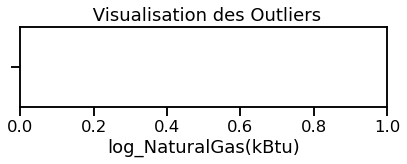

pour le groupe Other - Technology/Science et la feature log_TotalGHGEmissions
il y a 0 outliers


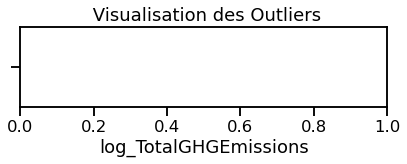

pour le groupe Strip Mall et la feature log_YearBuilt
il y a 0 outliers


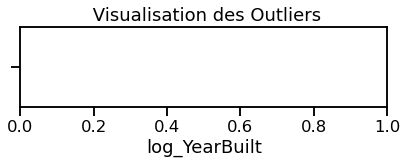

pour le groupe Strip Mall et la feature log_NumberofBuildings
il y a 0 outliers


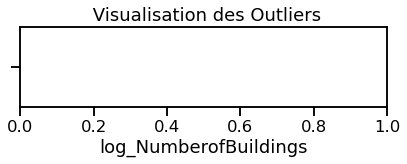

pour le groupe Strip Mall et la feature log_NumberofFloors
il y a 0 outliers


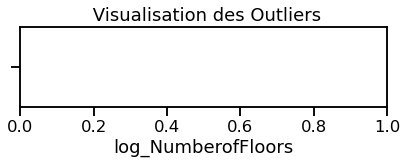

pour le groupe Strip Mall et la feature log_PropertyGFATotal
il y a 0 outliers


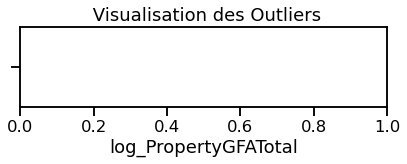

pour le groupe Strip Mall et la feature log_PropertyGFAParking
il y a 0 outliers


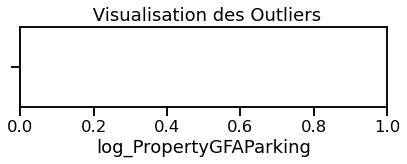

pour le groupe Strip Mall et la feature log_PropertyGFABuilding(s)
il y a 0 outliers


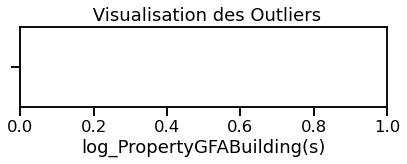

pour le groupe Strip Mall et la feature log_LargestPropertyUseTypeGFA
il y a 0 outliers


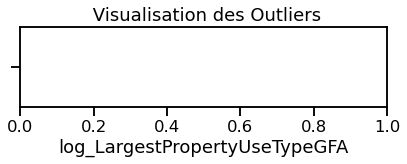

pour le groupe Strip Mall et la feature log_SiteEUI(kBtu/sf)
il y a 0 outliers


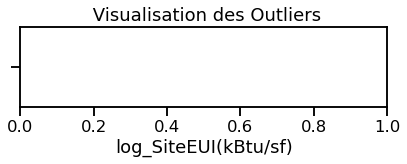

pour le groupe Strip Mall et la feature log_SourceEUI(kBtu/sf)
il y a 0 outliers


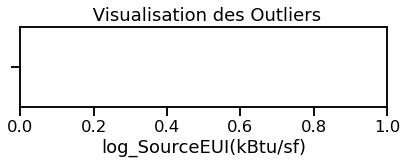

pour le groupe Strip Mall et la feature log_SiteEnergyUse(kBtu)
il y a 0 outliers


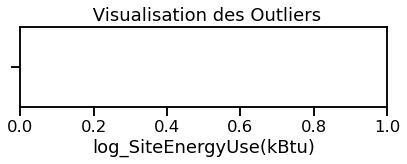

pour le groupe Strip Mall et la feature log_SteamUse(kBtu)
il y a 0 outliers


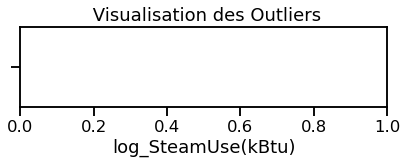

pour le groupe Strip Mall et la feature log_Electricity(kBtu)
il y a 0 outliers


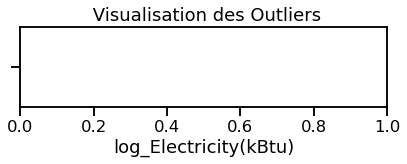

pour le groupe Strip Mall et la feature log_NaturalGas(kBtu)
il y a 0 outliers


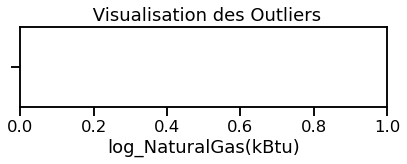

pour le groupe Strip Mall et la feature log_TotalGHGEmissions
il y a 0 outliers


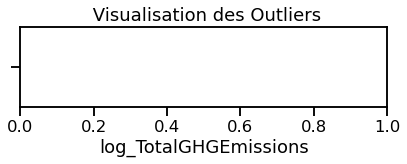

In [173]:
df_detect_outliers=[]
for PropertyType in PrimaryPropertyType:
    for col in log:
        q1 = df_log[df_log['PrimaryPropertyType'] == PropertyType][col].quantile(.25)
        q3 = df_log[df_log['PrimaryPropertyType'] == PropertyType][col].quantile(.75)
        IQR = q3 - q1
        upper_boundary = q3 + (1.5 * IQR)
        lower_boundary = q1 - (1.5 * IQR)
        select = df_log[df_log['PrimaryPropertyType'] == PropertyType]
        outliers = select.loc[(select[col] > upper_boundary) | (
            select[col] < lower_boundary), [col]]
        print(
            f"pour le groupe {PropertyType} et la feature {col}")
        print(
            f"il y a {len(outliers)} outliers")
        df_detect_outliers.append({'PropertyType': PropertyType, 'Feature': col,'outliers': len(outliers)})
        
        without_outliers = select.loc[(select[col] < upper_boundary) | (
            select[col] > lower_boundary), [col]]
        df_outlier = pd.DataFrame(without_outliers, columns=df_log.columns)
        plt.subplot(212)
        sns.boxplot(df_outlier[col])
        plt.title(" Visualisation des Outliers")
        plt.tight_layout()
        plt.show()

In [174]:
df_detect_outliers = pd.DataFrame(df_detect_outliers).reset_index(drop=True)
df_detect_outliers.sort_values(by='outliers', ascending=False)

,PropertyType,Feature,outliers
74,Small- and Mid-Sized Office,log_PropertyGFAParking,129
26,Other,log_NaturalGas(kBtu),97
18,Other,log_PropertyGFAParking,67
108,Large Office,log_SteamUse(kBtu),60
24,Other,log_SteamUse(kBtu),47
...,...,...,...
360,Courthouse,log_SteamUse(kBtu),0
361,Courthouse,log_Electricity(kBtu),0
362,Courthouse,log_NaturalGas(kBtu),0
363,Courthouse,log_TotalGHGEmissions,0


# Analyse univariée

In [175]:
import scipy.stats as stats

In [176]:
# les données au format numérique sont listées dans data_num 
data_num = df_log.select_dtypes('number').columns

In [177]:
data_cat = ['PrimaryPropertyType','SecondLargestPropertyUseType', 'ThirdLargestPropertyUseType']

# Analyse Bivariée

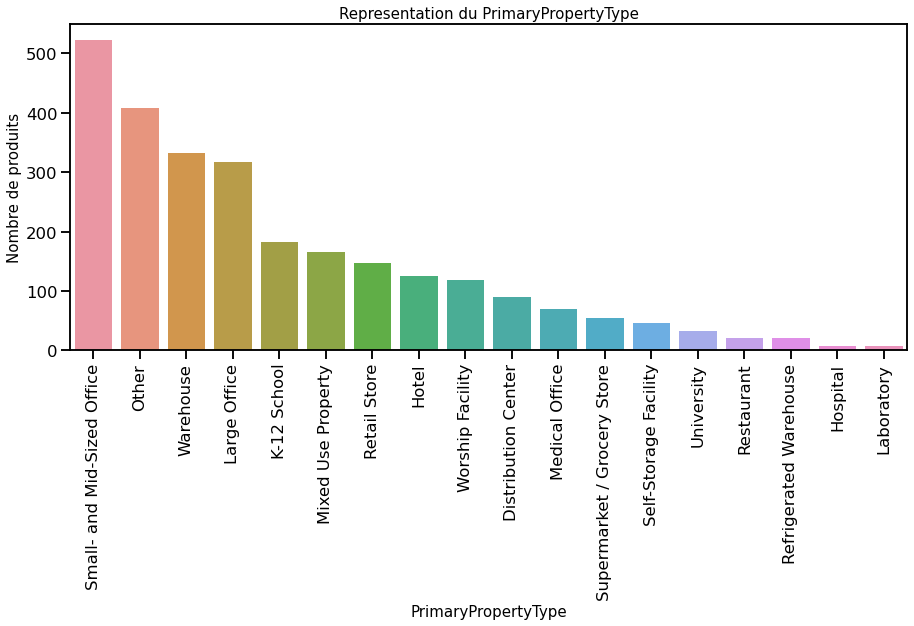

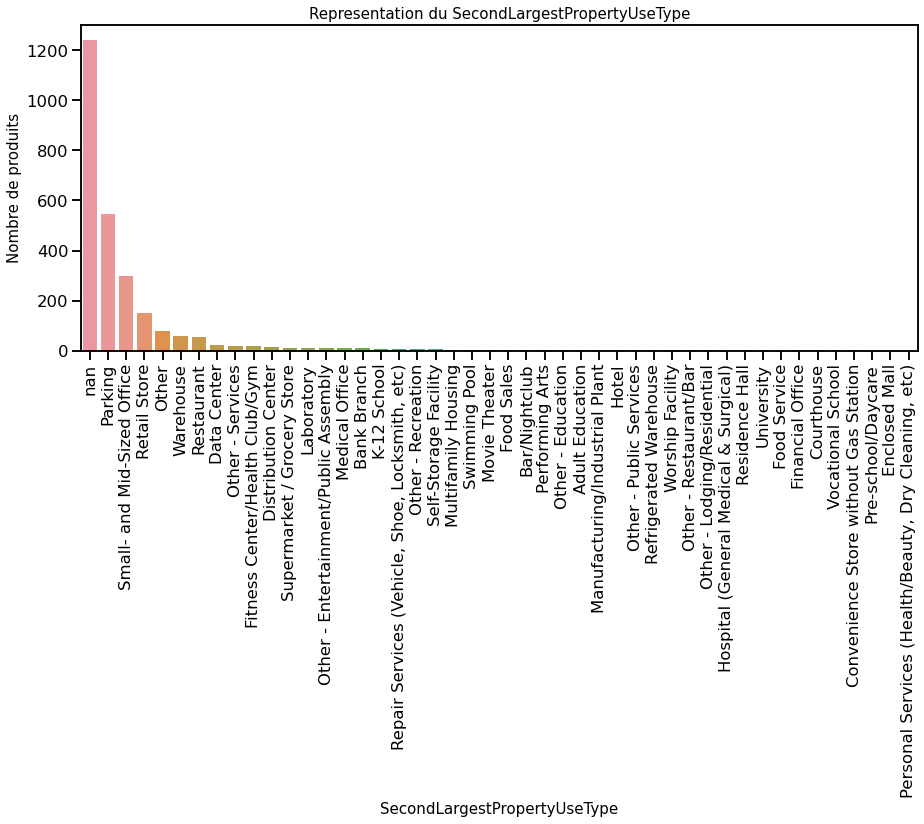

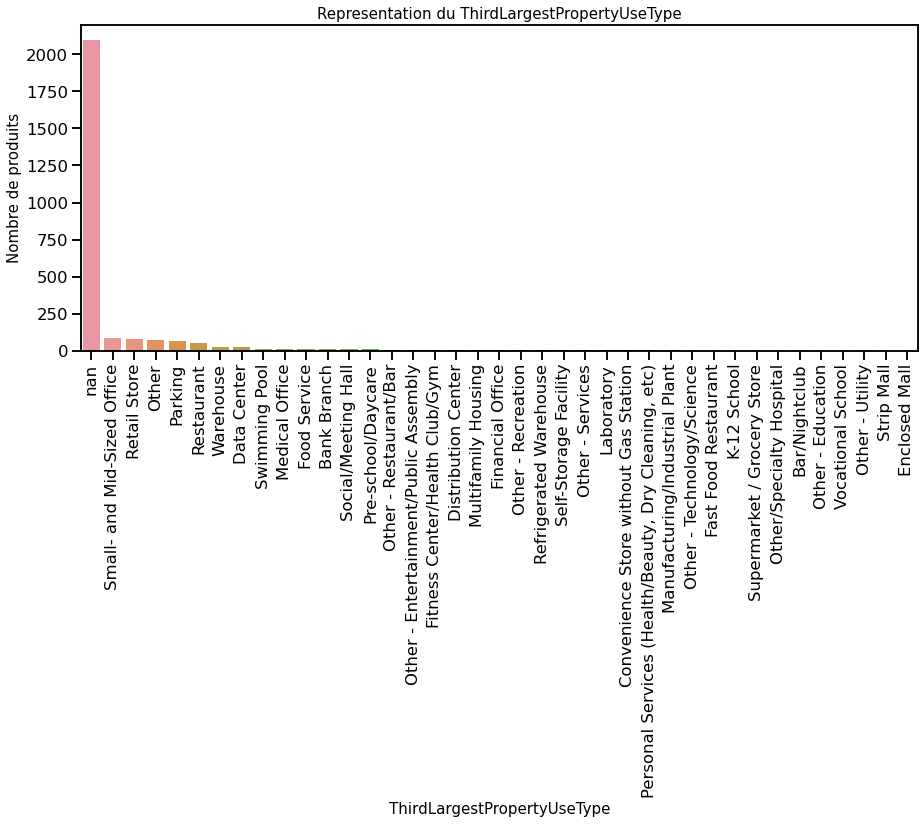

In [178]:
for col in data_cat:
    plt.figure(figsize=(15,6))
    sns.countplot(x=col,data=df_log, order = df_log[col].value_counts().index)
    plt.xticks(rotation=90)
    plt.xlabel(col, fontsize=15)
    plt.ylabel('Nombre de produits', fontsize=15)
    plt.title('Representation du '+  col, fontsize=15)
    plt.show()

In [179]:
# les medianes des primary property type par features
df_gb = df_log.groupby(["PrimaryPropertyType"]).median()

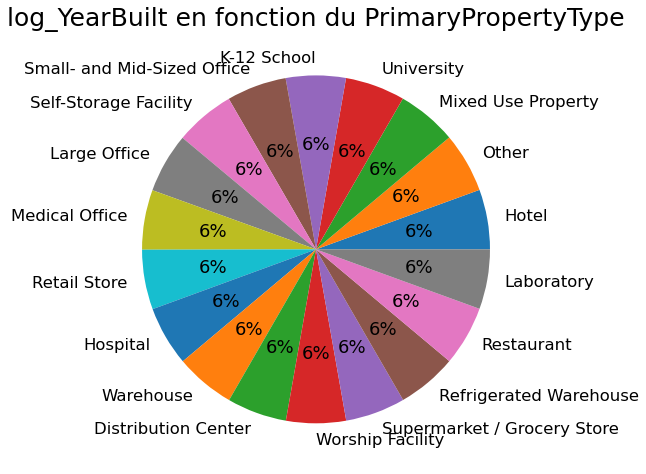

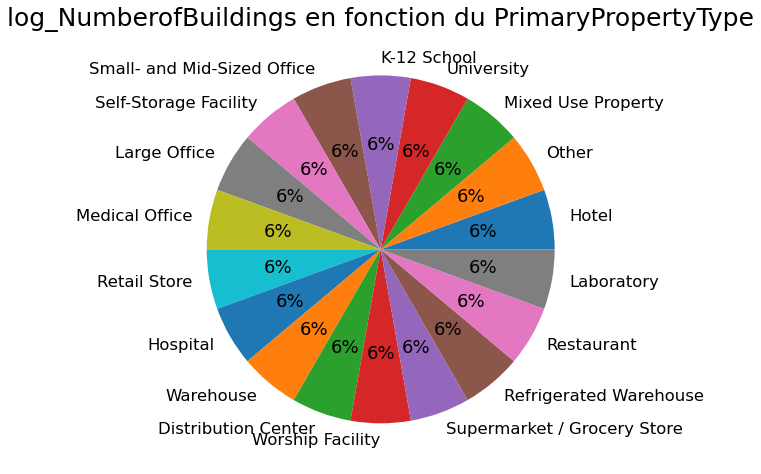

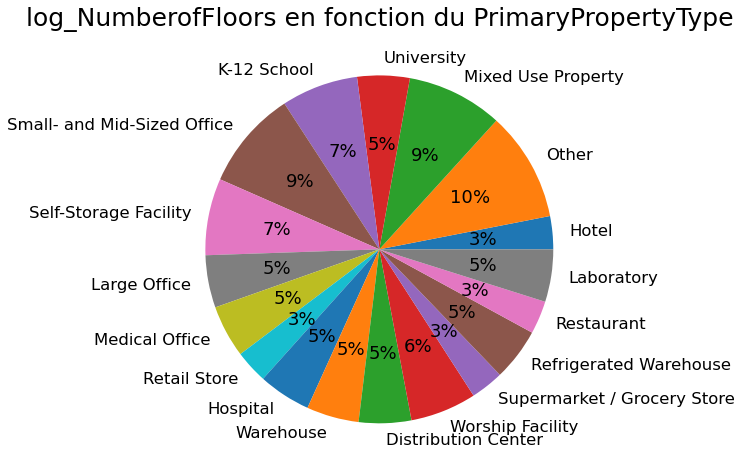

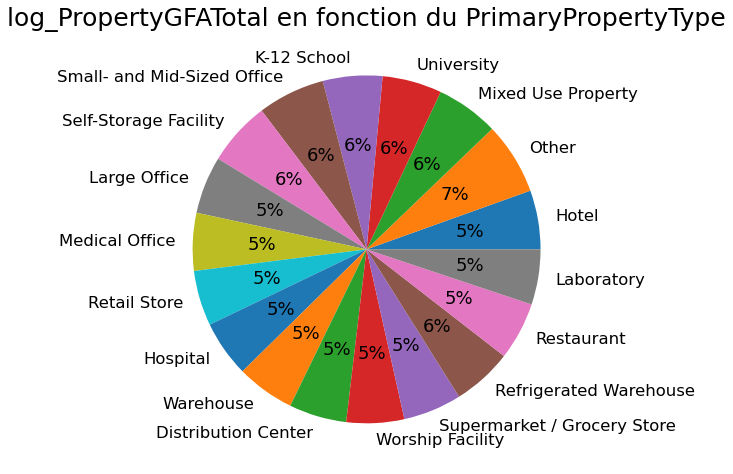

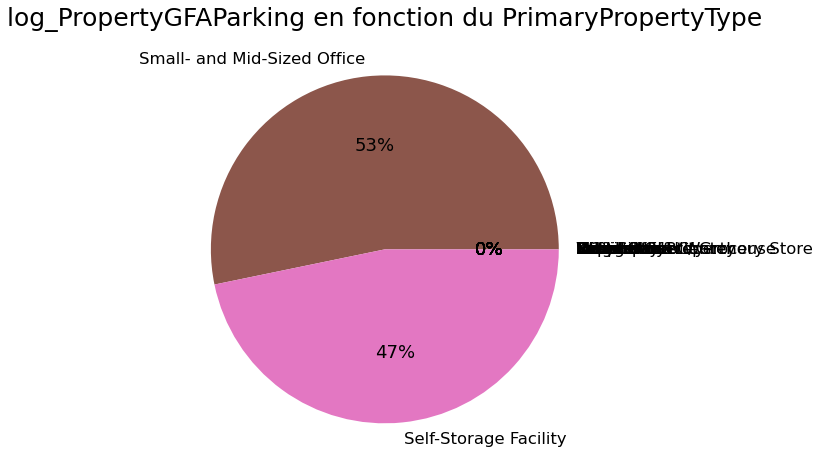

...

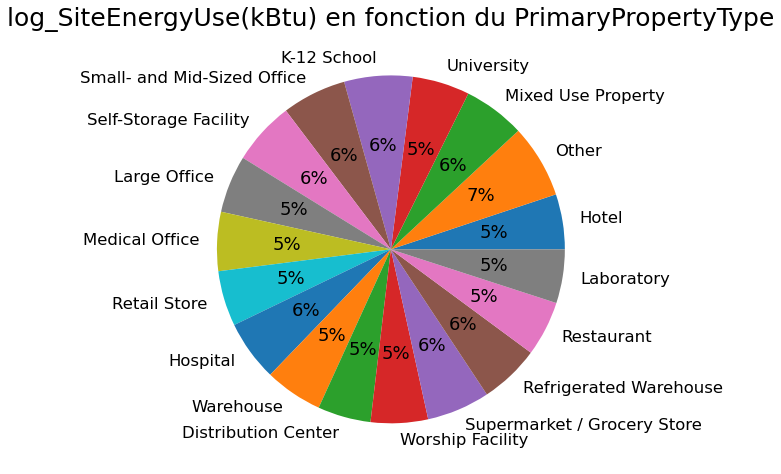

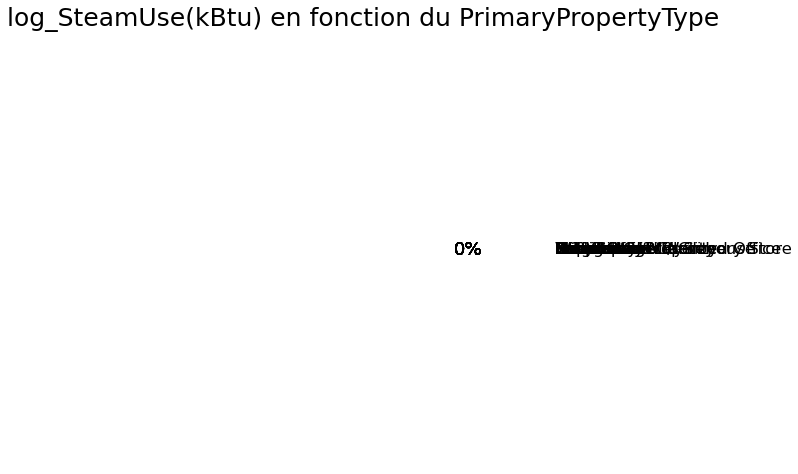

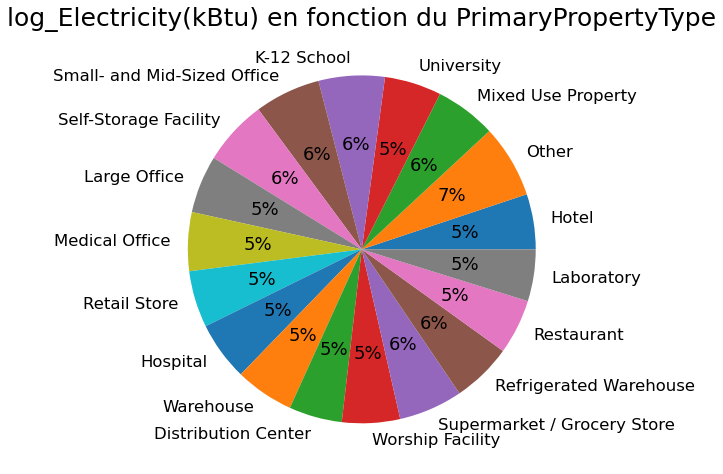

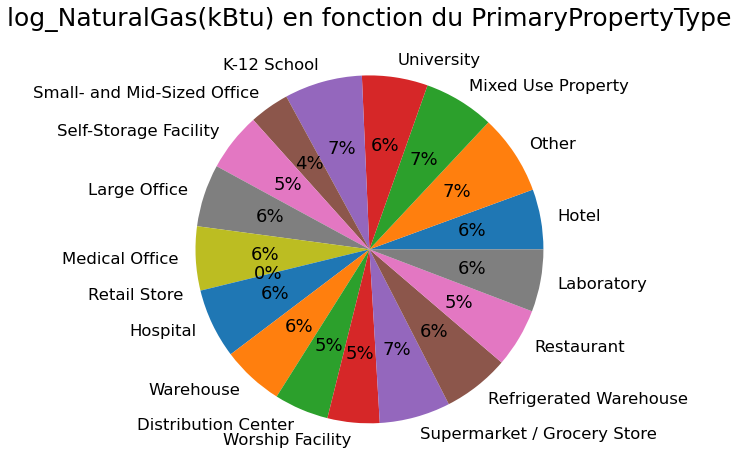

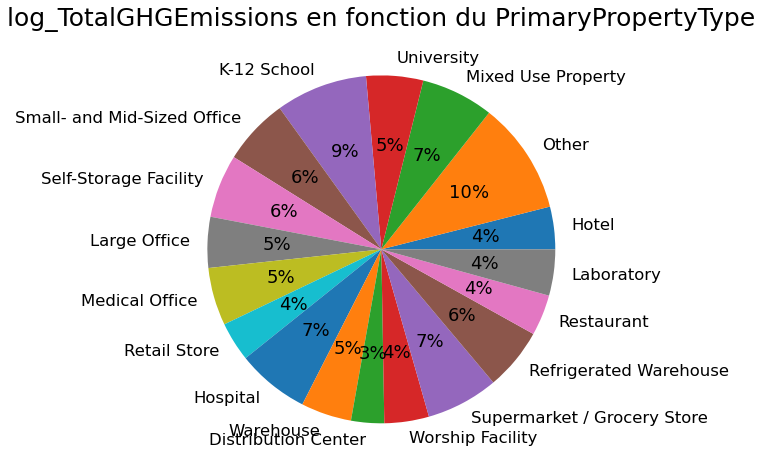

In [180]:
# declaring data
for col in log:
    data = df_gb[col]
    property_type = df["PrimaryPropertyType"].unique()
    plt.figure(figsize=[16, 8])
    plt.pie(data, labels=property_type, autopct='%.0f%%')
    plt.title(col +' en fonction du PrimaryPropertyType', fontsize=25)
    # displaying chart
    plt.show()

## Matrice de Corrélation

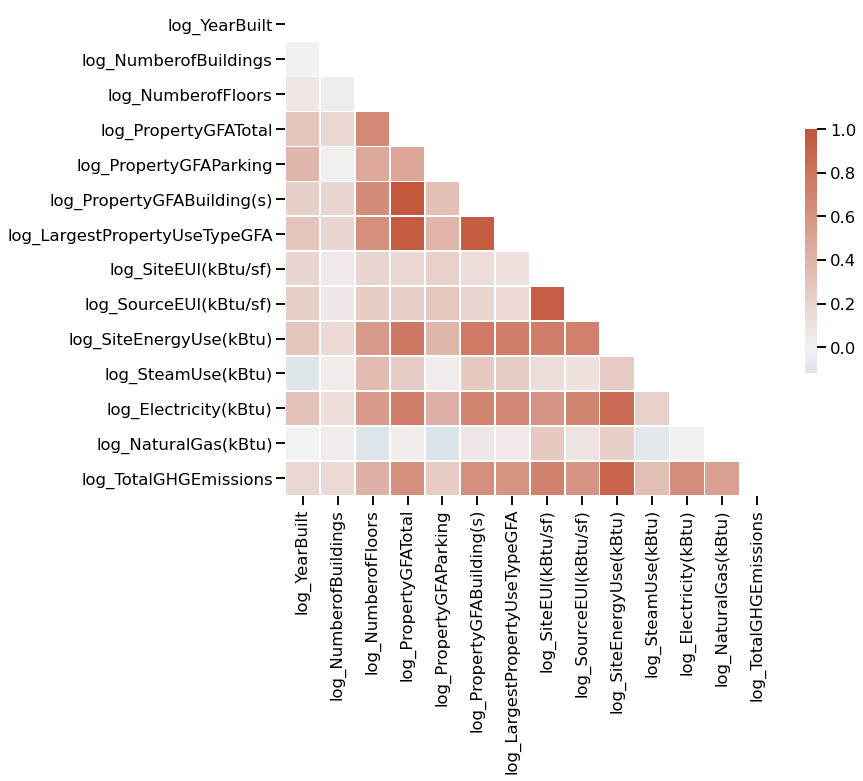

In [181]:
# Compute the correlation matrix
corr = df_log.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5});

In [182]:
corr_min = 0.5
corr_pairs = corr.unstack().sort_values(kind="quicksort")
strong_corr = (pd.DataFrame(corr_pairs[(abs(corr_pairs) > corr_min)])
               .reset_index().rename(columns={0:'coef_correl'}))
strong_corr = strong_corr[(strong_corr.index%2 == 0) & (strong_corr['level_0'] != strong_corr['level_1'])]
strong_corr.sort_values('coef_correl', ascending=False).head(15)

,level_0,level_1,coef_correl
54,log_PropertyGFABuilding(s),log_PropertyGFATotal,0.979069
52,log_PropertyGFATotal,log_LargestPropertyUseTypeGFA,0.953608
50,log_PropertyGFABuilding(s),log_LargestPropertyUseTypeGFA,0.950874
48,log_SourceEUI(kBtu/sf),log_SiteEUI(kBtu/sf),0.936957
46,log_TotalGHGEmissions,log_SiteEnergyUse(kBtu),0.891598
44,log_SiteEnergyUse(kBtu),log_Electricity(kBtu),0.860957
42,log_PropertyGFATotal,log_SiteEnergyUse(kBtu),0.772631
40,log_PropertyGFABuilding(s),log_SiteEnergyUse(kBtu),0.755482
38,log_SiteEUI(kBtu/sf),log_SiteEnergyUse(kBtu),0.735398
36,log_LargestPropertyUseTypeGFA,log_SiteEnergyUse(kBtu),0.728226


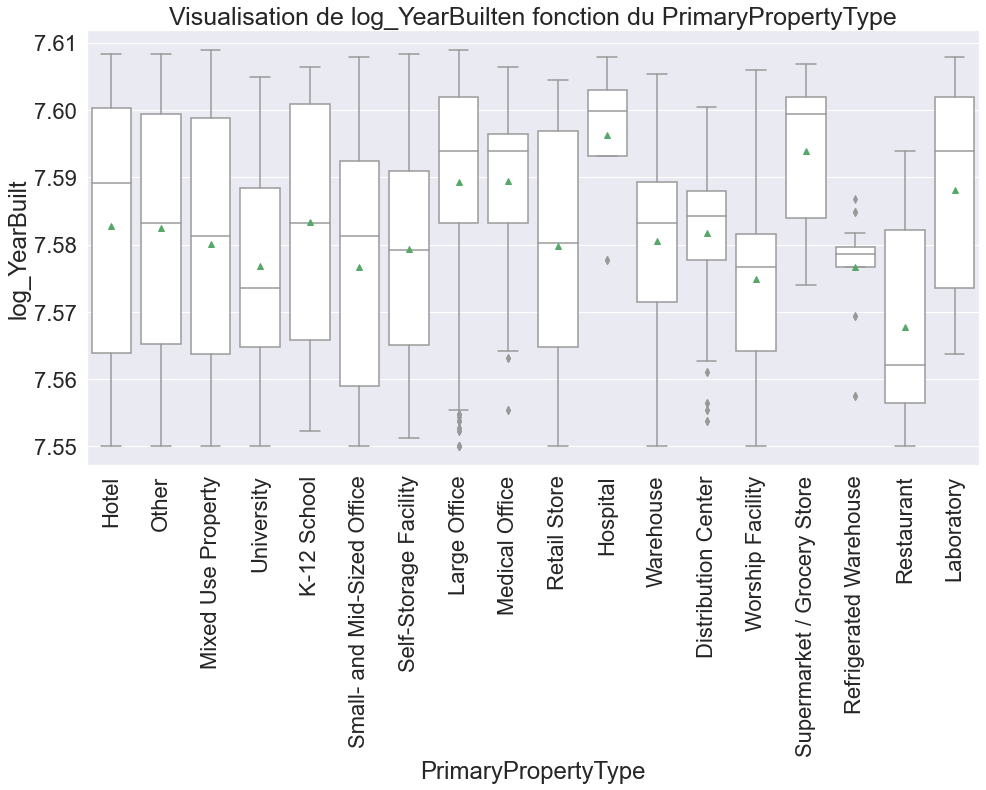

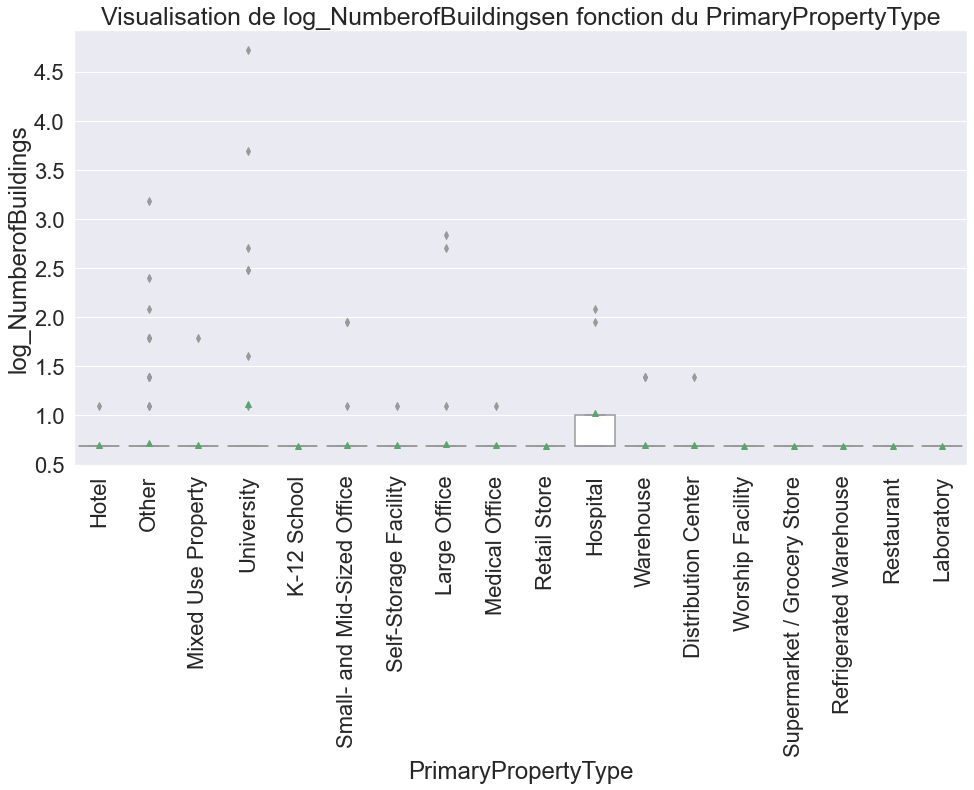

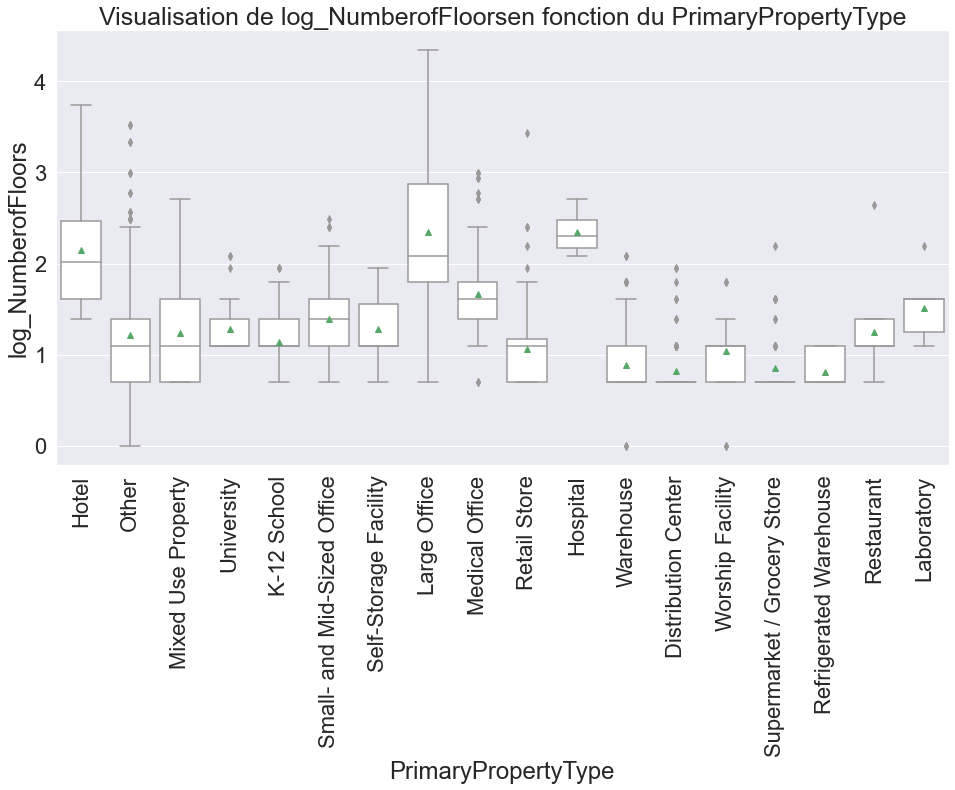

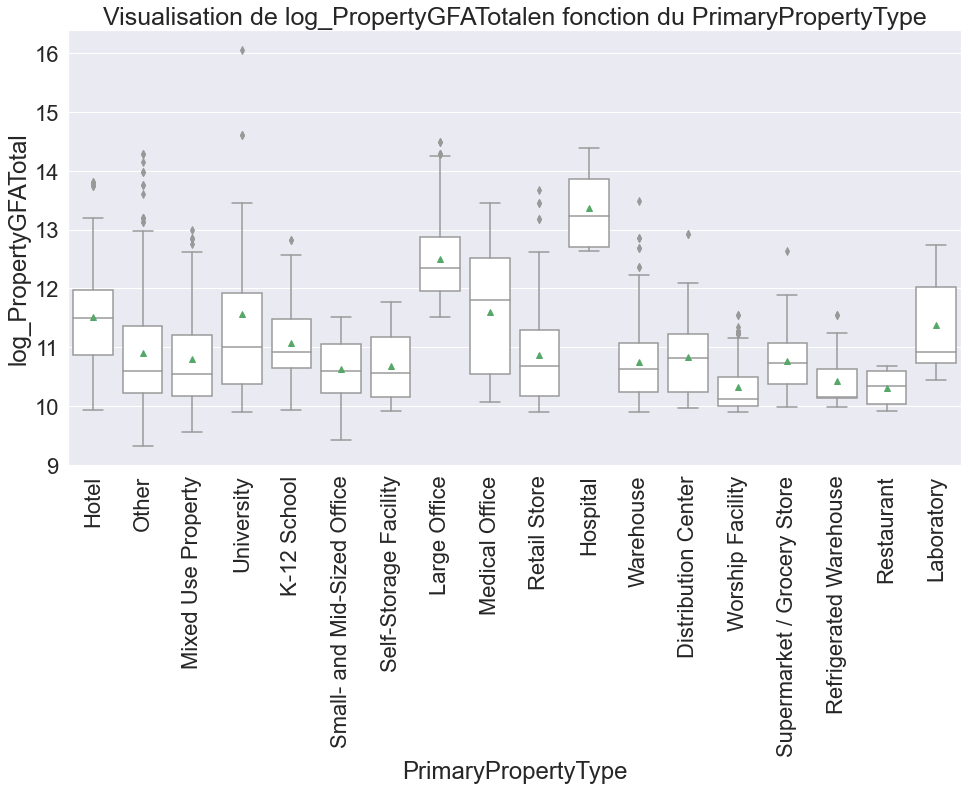

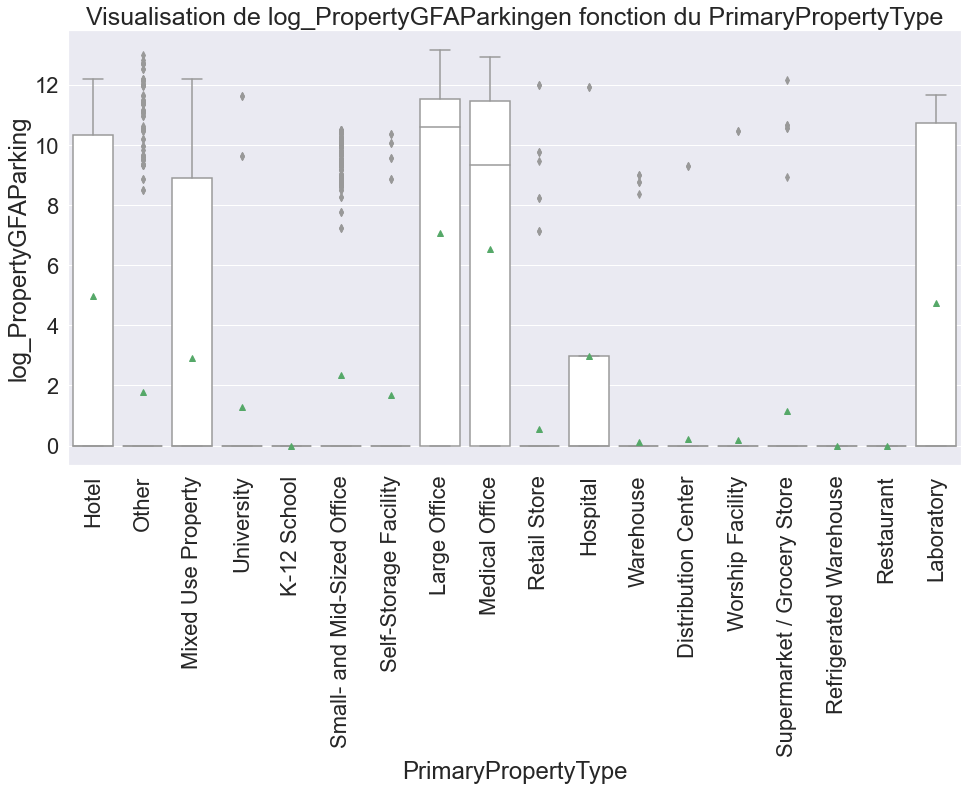

...

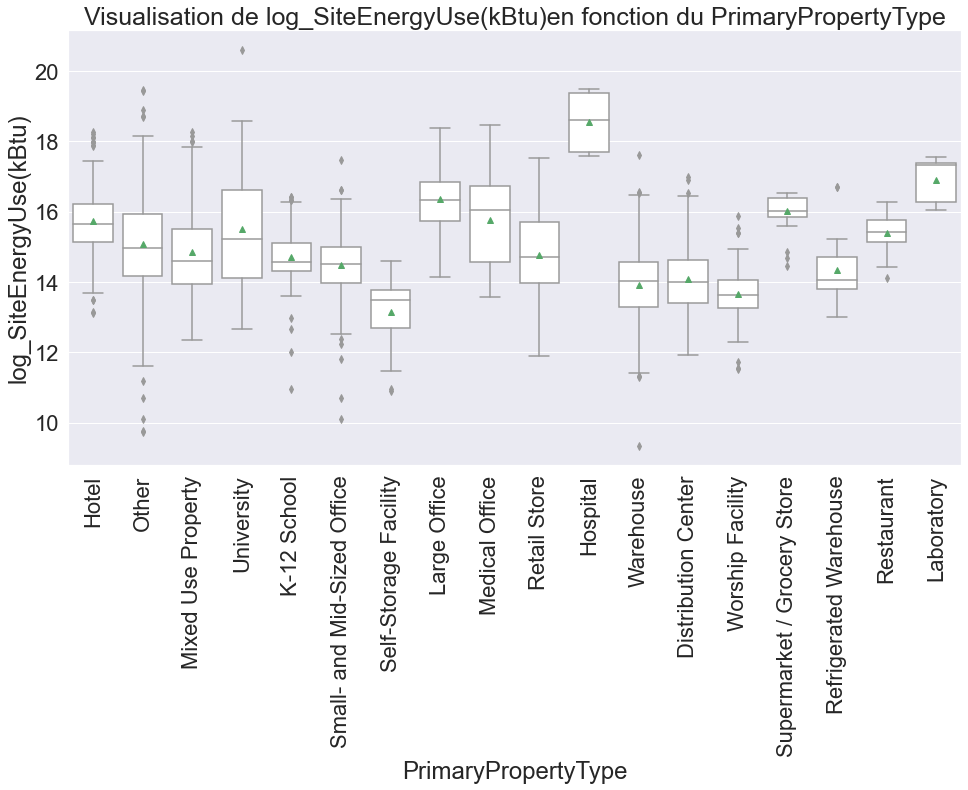

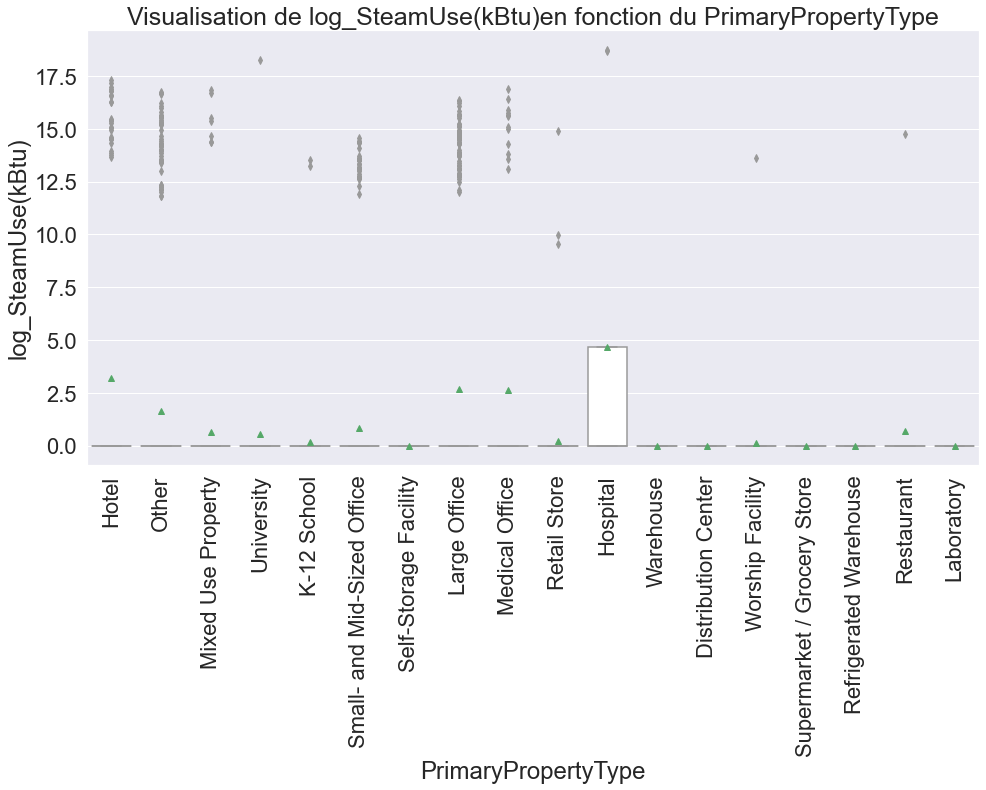

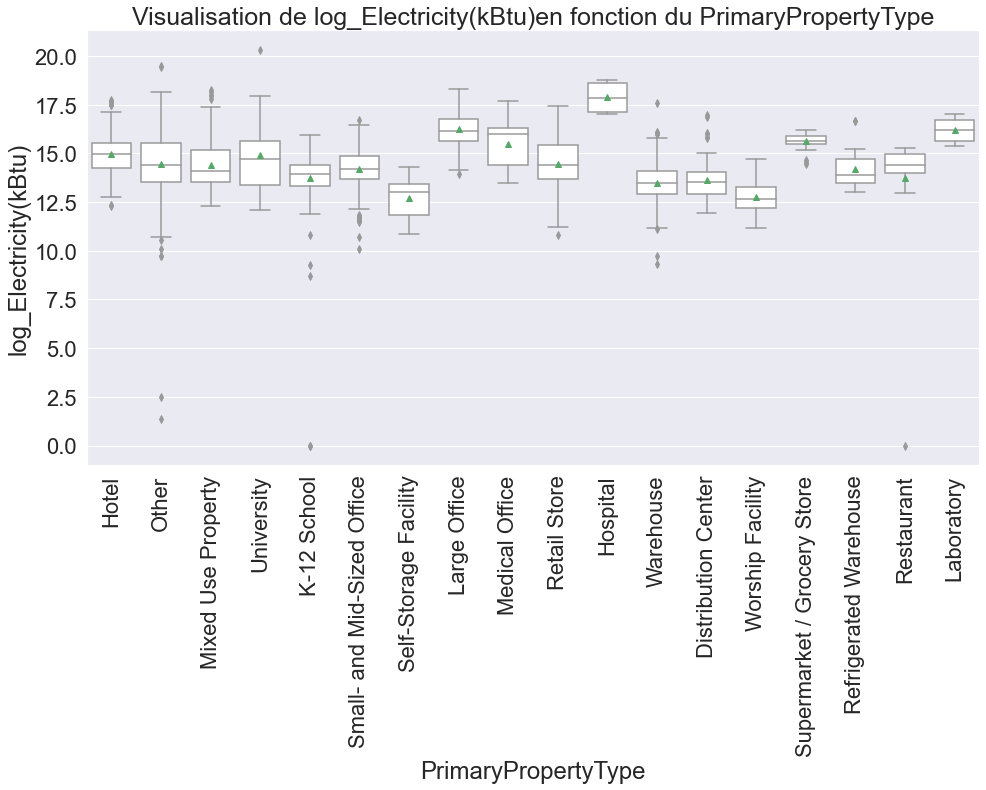

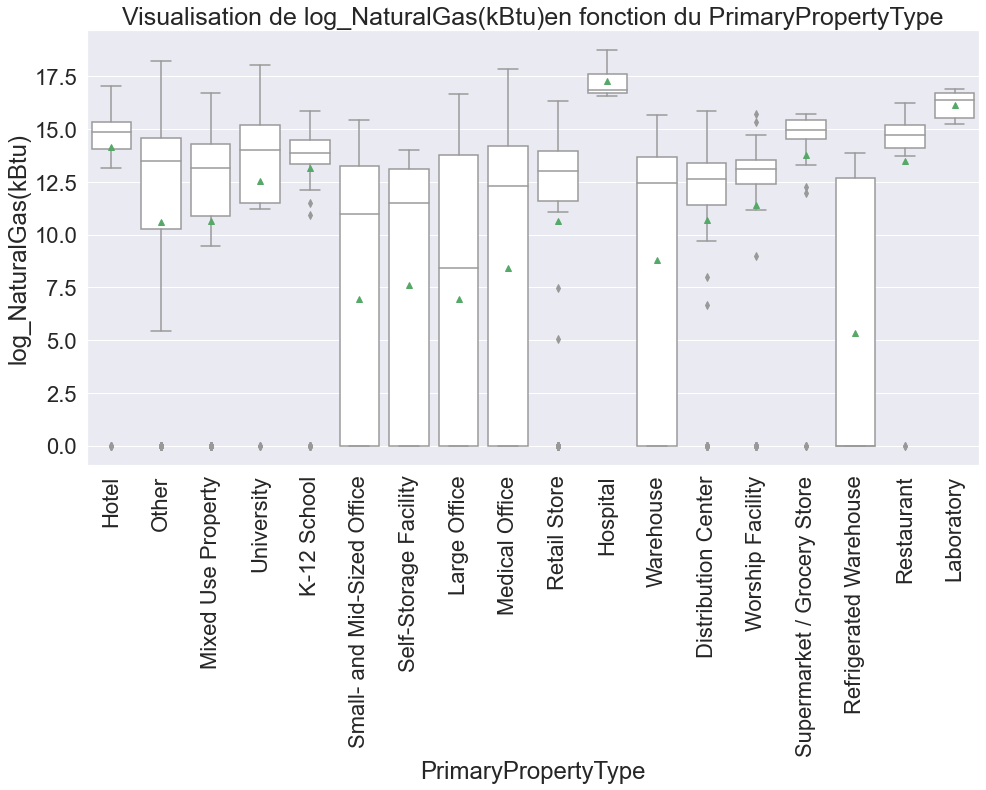

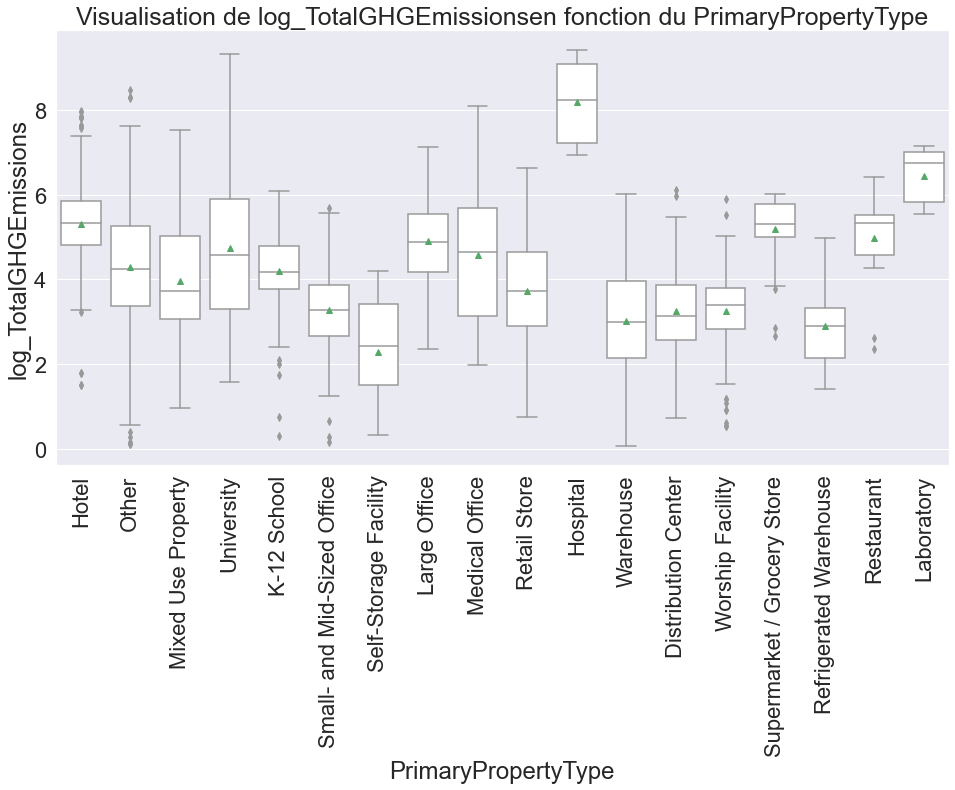

In [183]:
for col in log:
    plt.figure(figsize=[16, 8])
    sns.set(font_scale=2)
    sns.boxplot(x=df_log["PrimaryPropertyType"], y=col, data=df_log, showmeans=True,color='white')
    plt.title("Visualisation de "+ col + "en fonction du PrimaryPropertyType", fontsize=25)
    plt.xticks(rotation='90')
    plt.show()

# Analyse des variables à prédire
Les 2 variables à prédire sont :

* TotalGHGEmissions
* SiteEnergyUse(kBtu)

In [184]:
pred_1 = df_log['log_SiteEnergyUse(kBtu)']
pred_2 = df_log['log_TotalGHGEmissions']

## SiteEnergyUse(kBtu)

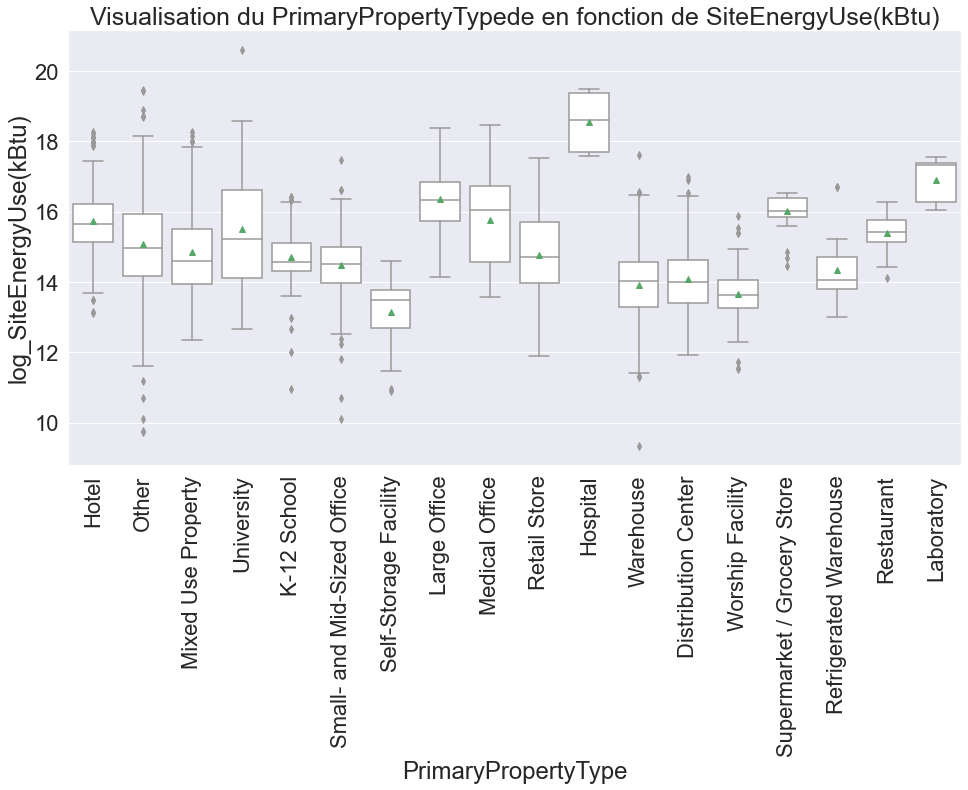

In [185]:
plt.figure(figsize=[16, 8])
sns.set(font_scale=2)
sns.boxplot(x=df_log["PrimaryPropertyType"], y=pred_1,
            data=df_log, showmeans=True, color='white')
plt.title("Visualisation du PrimaryPropertyTypede en fonction de SiteEnergyUse(kBtu)", fontsize=25)
plt.xticks(rotation='90')
plt.show()

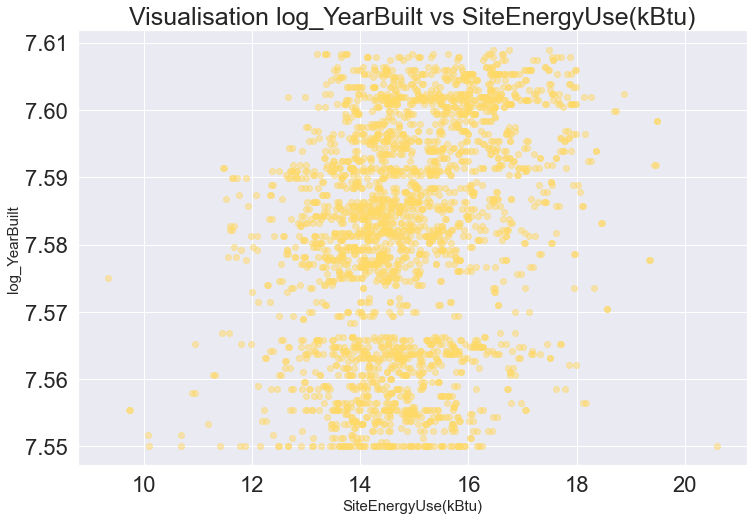

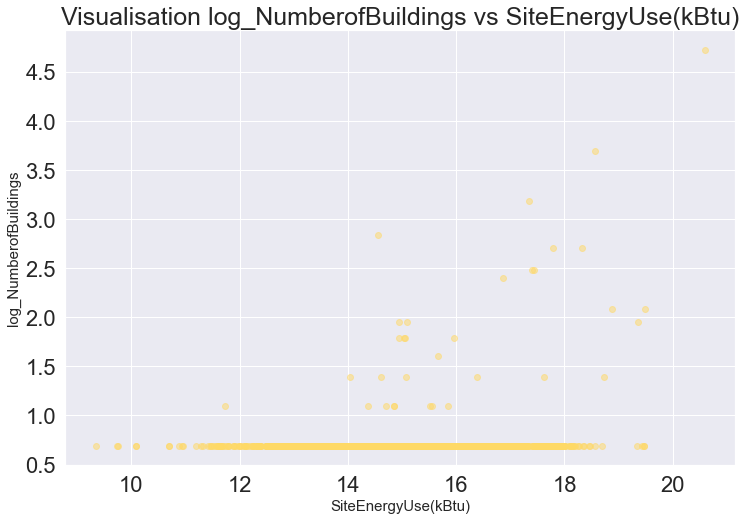

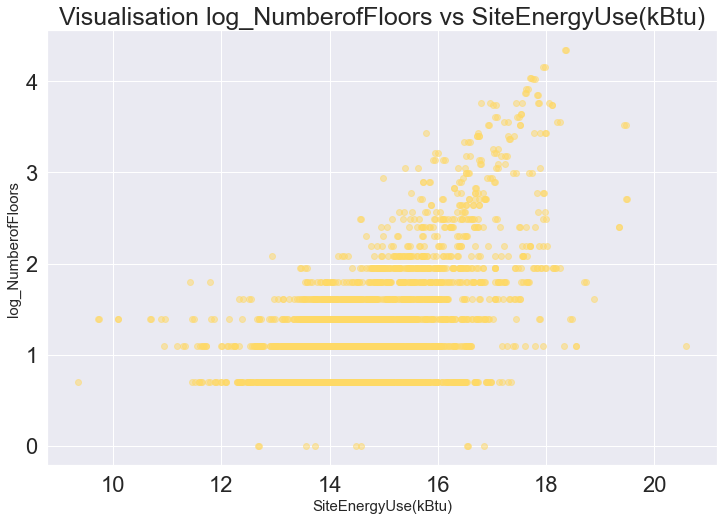

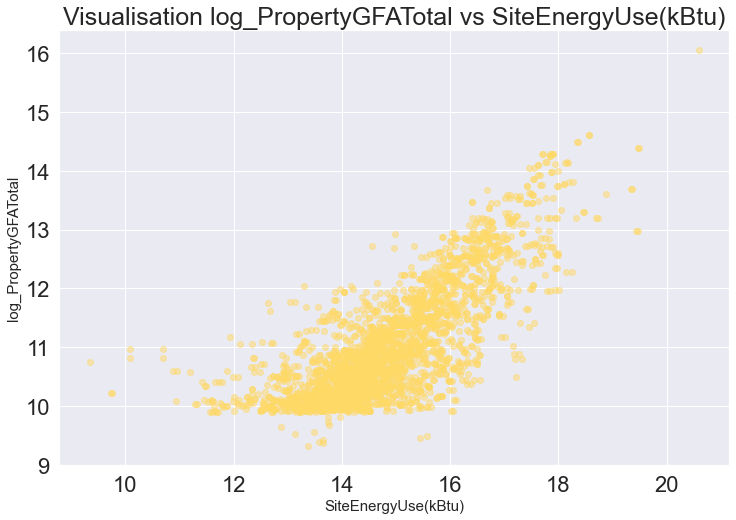

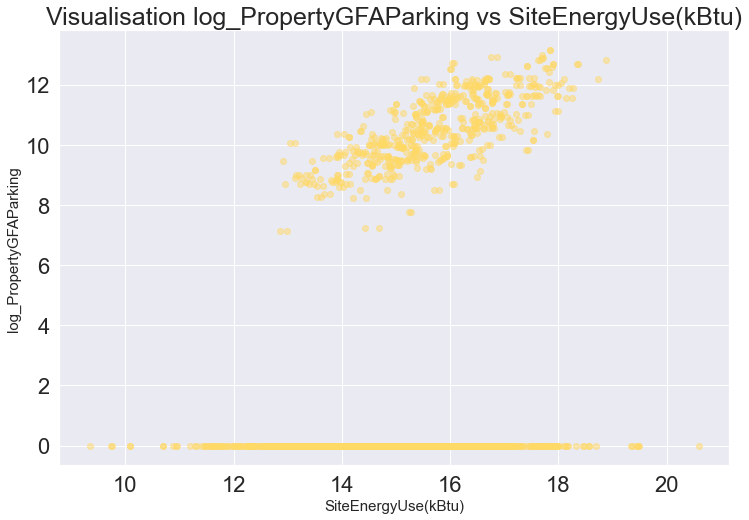

...

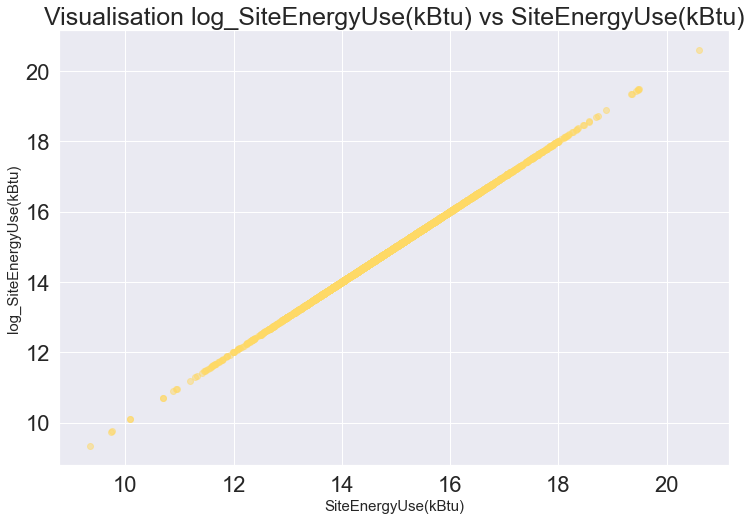

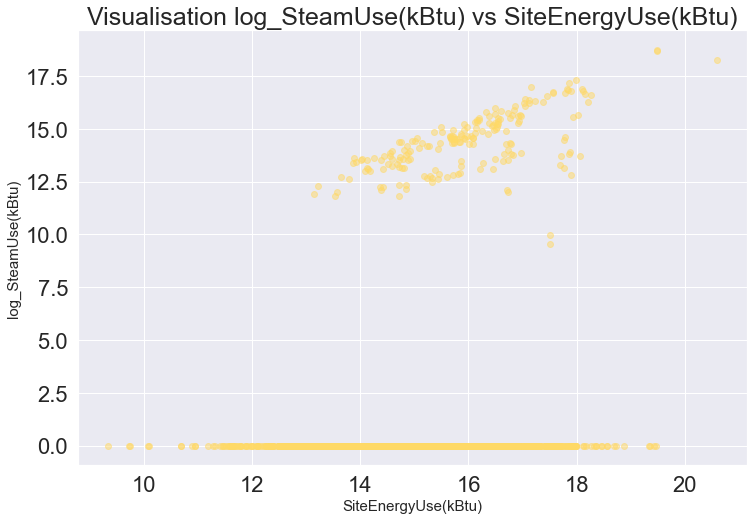

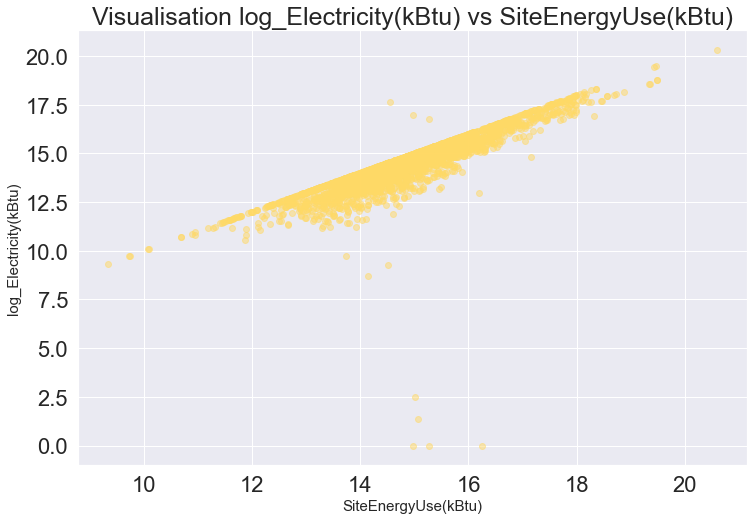

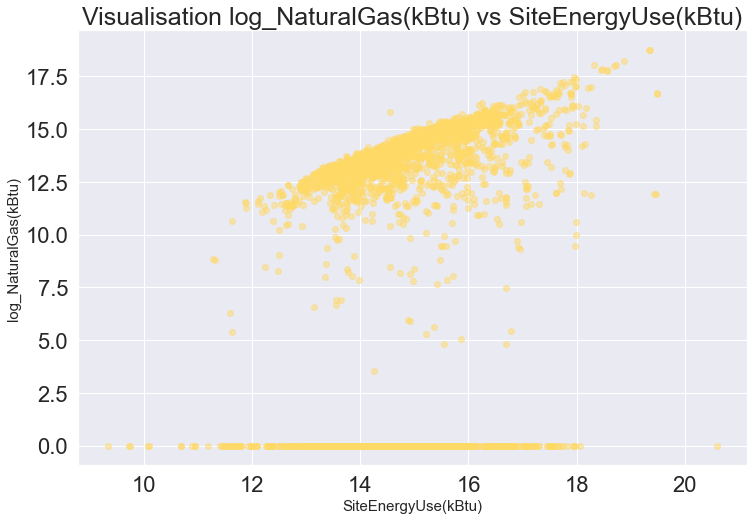

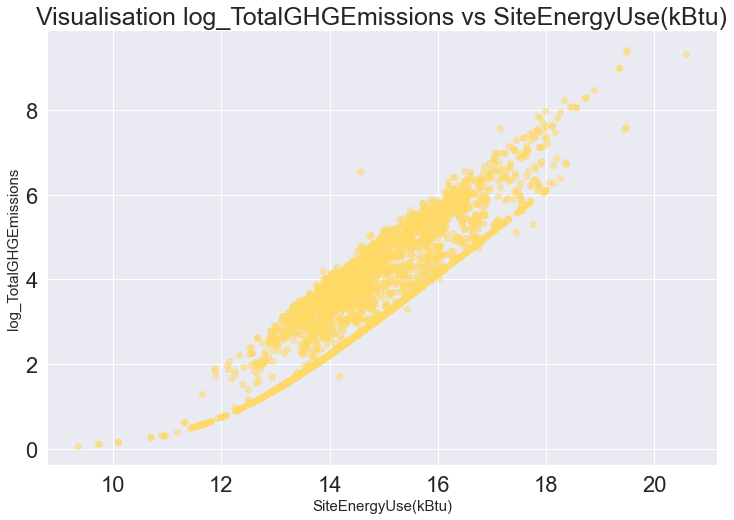

In [186]:
for col in df_log.select_dtypes(include=np.number):
    fig = plt.figure(figsize=[12, 8])
    plt.scatter(pred_1,df_log[col], alpha=0.5,
            color='#ffd966', label='données')
    plt.title("Visualisation "+col+" vs SiteEnergyUse(kBtu)", fontsize=25)
    plt.xlabel('SiteEnergyUse(kBtu)', fontsize=15)
    plt.ylabel(col, fontsize=15)
    plt.show()

## TotalGHGEmissions

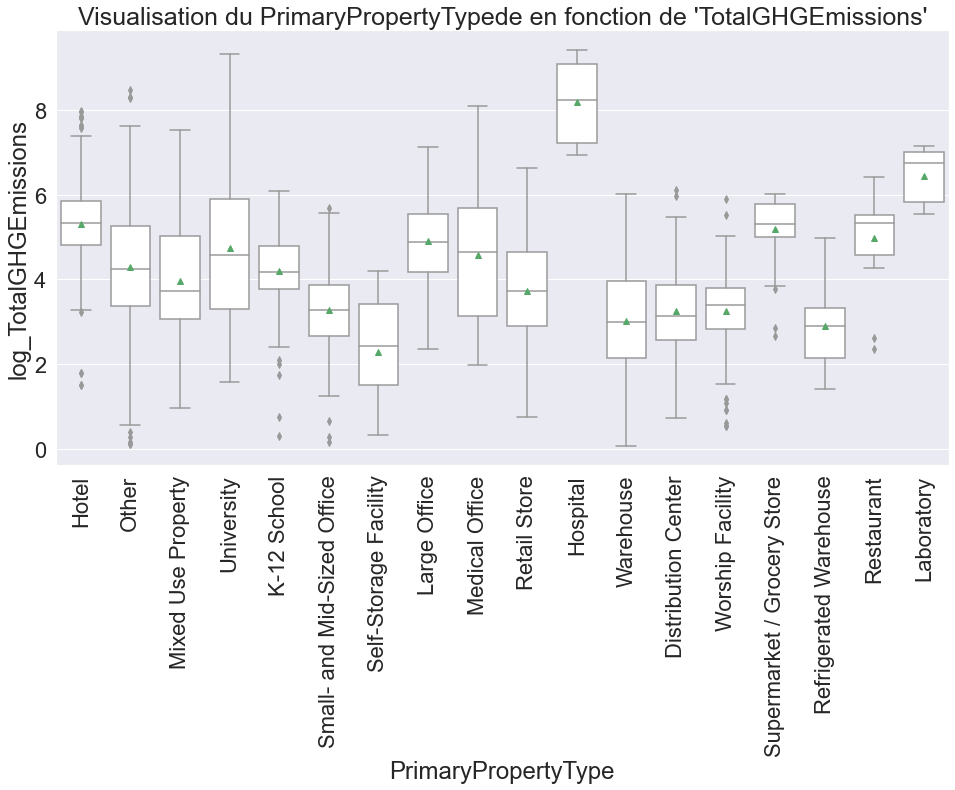

In [187]:
plt.figure(figsize=[16, 8])
sns.set(font_scale=2)
sns.boxplot(x=df_log["PrimaryPropertyType"], y=pred_2,
            data=df_log, showmeans=True, color='white')
plt.title("Visualisation du PrimaryPropertyTypede en fonction de 'TotalGHGEmissions'", fontsize=25)
plt.xticks(rotation='90')
plt.show()

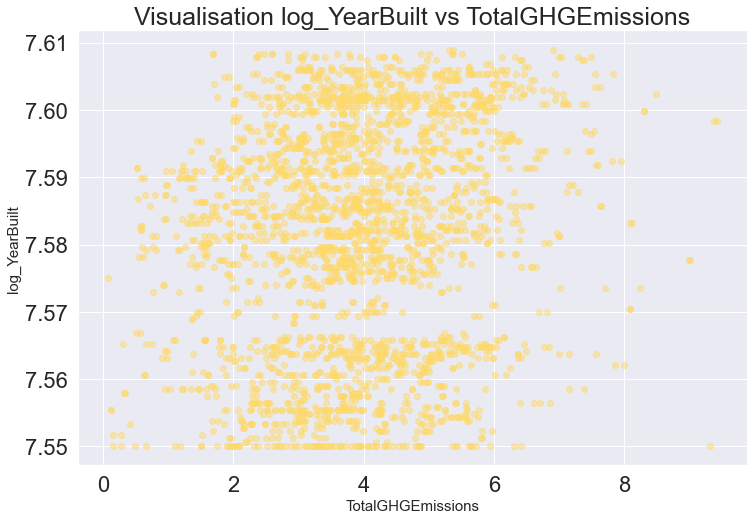

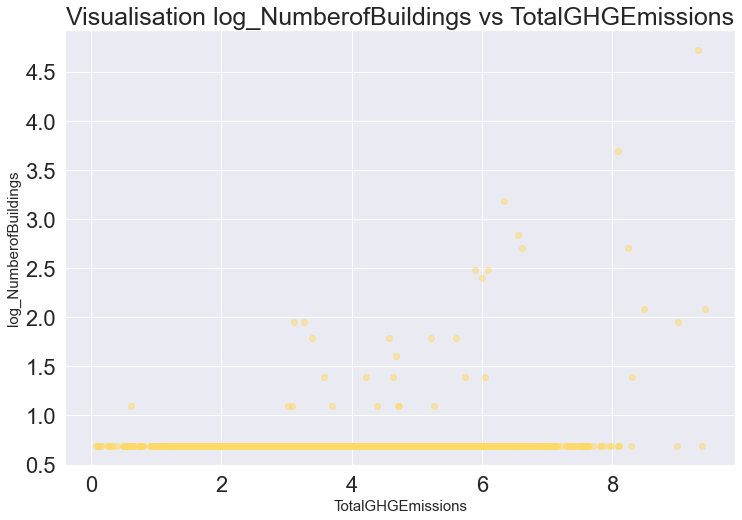

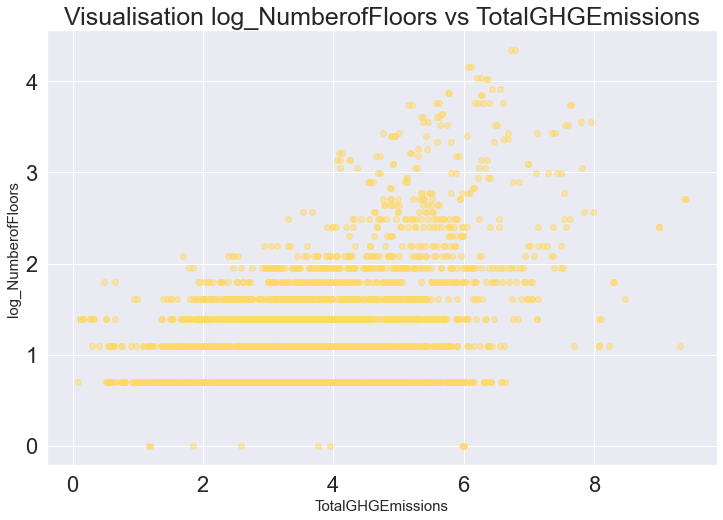

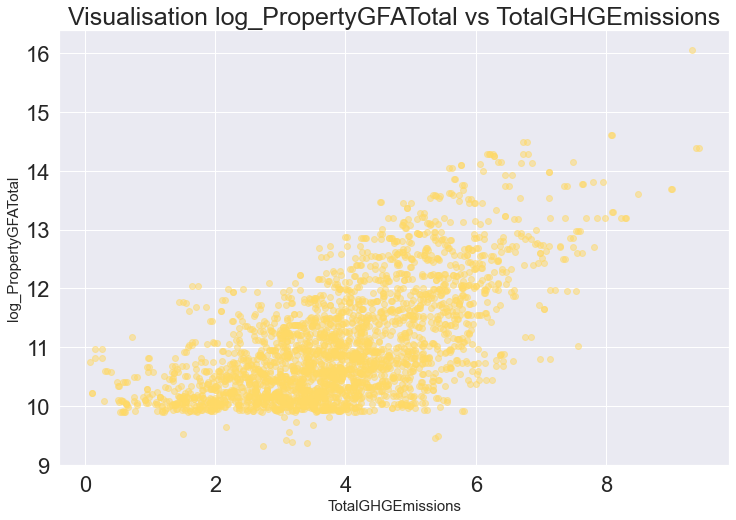

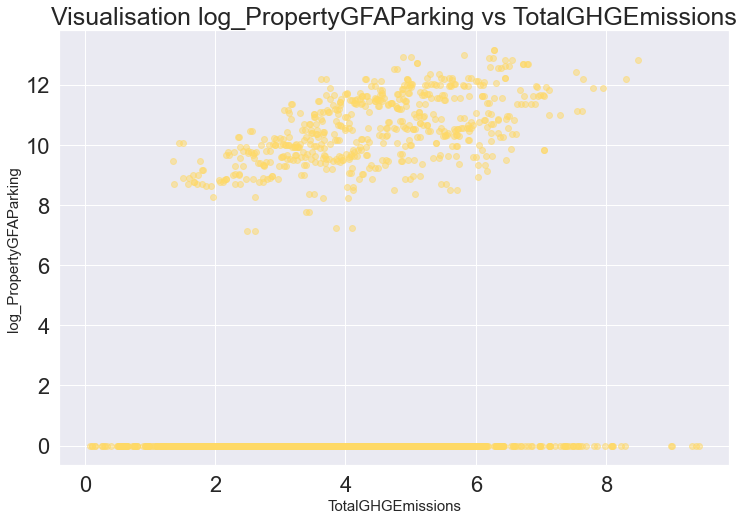

...

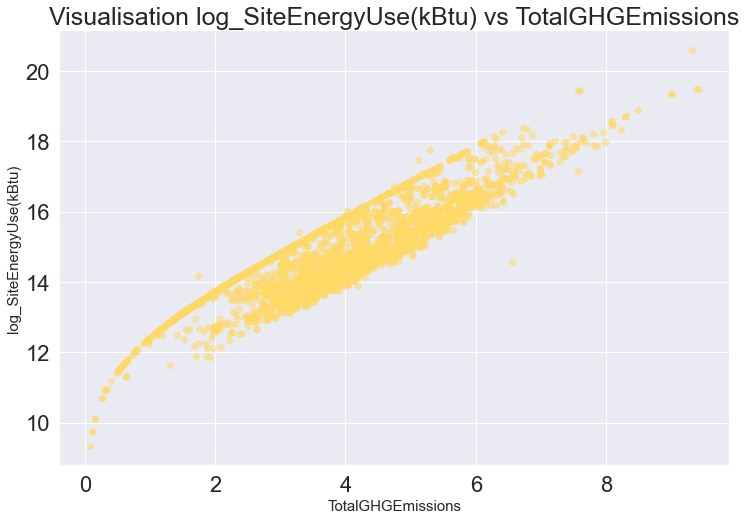

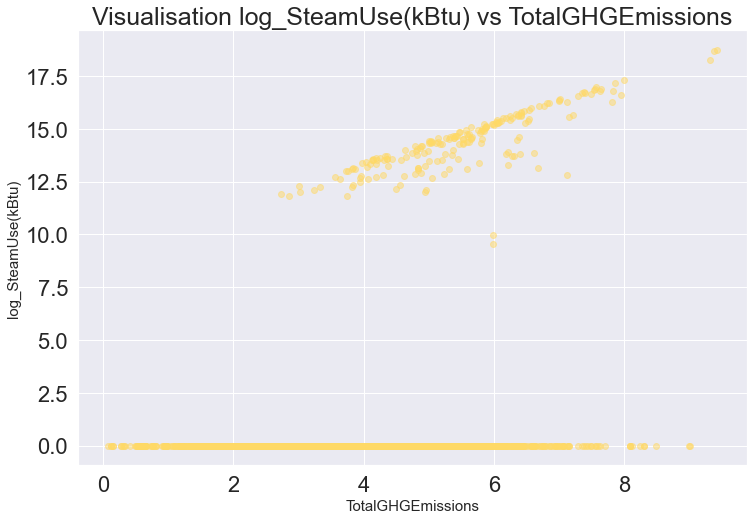

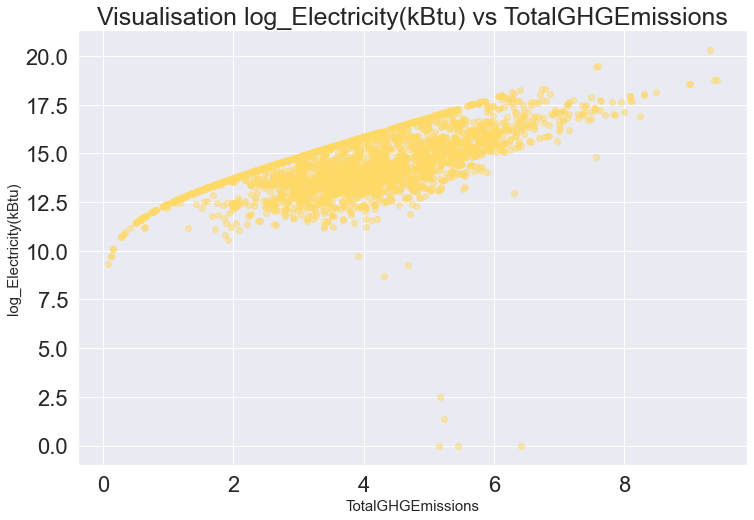

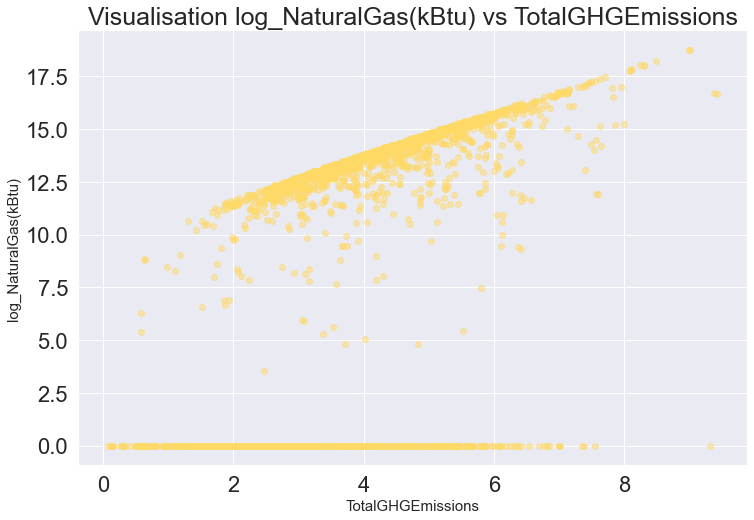

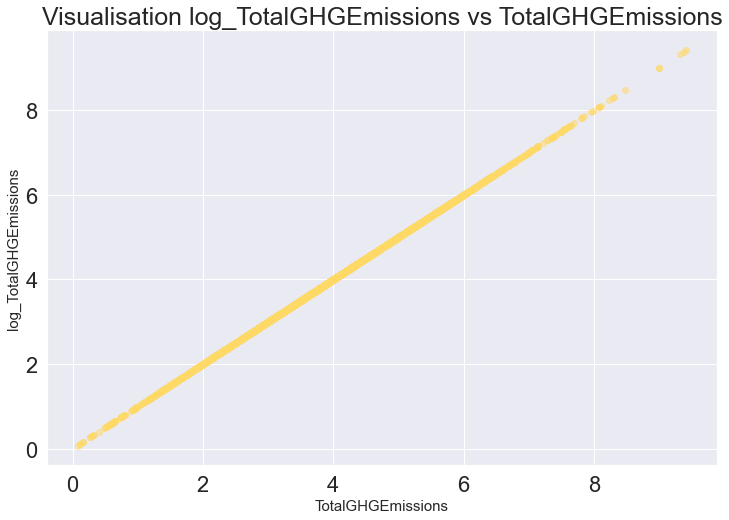

In [188]:
for col in df_log.select_dtypes(include=np.number):
    fig = plt.figure(figsize=[12, 8])
    plt.scatter(pred_2,df_log[col], alpha=0.5,
            color='#ffd966', label='données')
    plt.title("Visualisation "+col+" vs TotalGHGEmissions", fontsize=25)
    plt.xlabel('TotalGHGEmissions', fontsize=15)
    plt.ylabel(col, fontsize=15)
    plt.show()

# Tests d'hypothèses
L'ANOVA (analyse de la variance) est une méthode statistique utilisée pour vérifier s'il existe une différence significative entre les moyennes de deux groupes ou plus. Pour utiliser l'ANOVA, les hypothèses suivantes doivent être vérifiées :

* Normalité des résidus : Les données doivent être normalement distribuées au sein de chaque groupe. Cette hypothèse peut être vérifiée en visualisant les données ou en utilisant un test de normalité, tel que le test de Shapiro-Wilk.
<br>
<br>
* Indépendance : Les observations au sein de chaque groupe doivent être indépendantes les unes des autres. En d'autres termes, les observations ne doivent pas être liées d'une manière qui pourrait affecter les résultats du test.
<br>
<br>
* Variance égale : Les variances des groupes doivent être approximativement égales. Cette hypothèse peut être vérifiée à l'aide d'un test d'égalité de variance, tel que le test de Levene

## Distribution normale des résidus
On réalise le test de Shapiro-Wilk pour vérifier la normalité des résidus. A noter qu'on utilisera ensuite également une droite de Henry pour vérifier cette hypothèse de normalité.

In [189]:
for col in log:
        w, pvalue = st.shapiro(df_log[col])
        seuil = 0.05
        print(f'{col :-<50} {w} {pvalue}')
        if pvalue > seuil:
            print(
                "On ne peux pas rejetter H0: la distribution des résidus suit une loi normale")
        else:
            print(
                "On rejette H0 : la distribution des résidus ne suit pas une loi normale")

log_YearBuilt------------------------------------- 0.9451778531074524 1.9116150563015662e-30
On rejette H0 : la distribution des résidus ne suit pas une loi normale
log_NumberofBuildings----------------------------- 0.0671546459197998 0.0
On rejette H0 : la distribution des résidus ne suit pas une loi normale
log_NumberofFloors-------------------------------- 0.8685112595558167 9.248569864543793e-43
On rejette H0 : la distribution des résidus ne suit pas une loi normale
log_PropertyGFATotal------------------------------ 0.9084649682044983 2.136484210542852e-37
On rejette H0 : la distribution des résidus ne suit pas une loi normale
log_PropertyGFAParking---------------------------- 0.539696216583252 0.0
On rejette H0 : la distribution des résidus ne suit pas une loi normale
log_PropertyGFABuilding(s)------------------------ 0.9097484350204468 3.397976584432385e-37
On rejette H0 : la distribution des résidus ne suit pas une loi normale
log_LargestPropertyUseTypeGFA--------------------- 0

log_YearBuilt


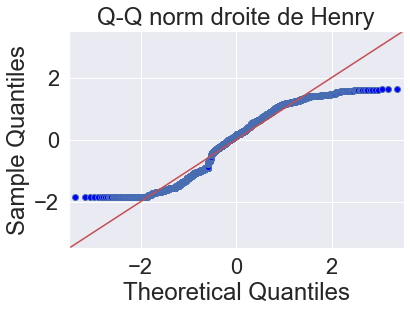

log_NumberofBuildings


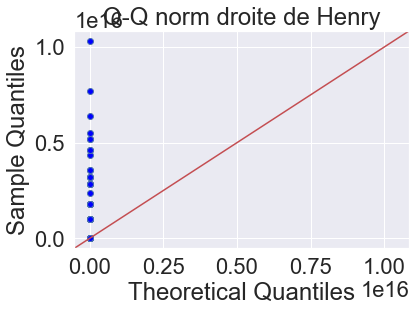

log_NumberofFloors


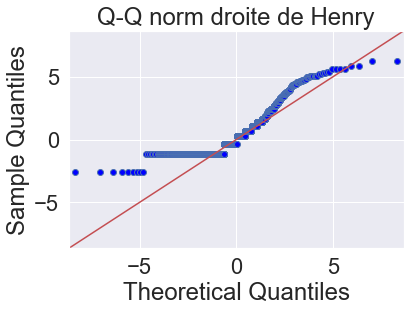

log_PropertyGFATotal


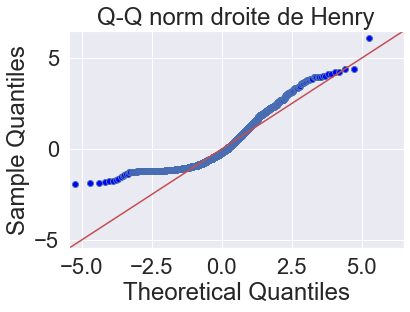

log_PropertyGFAParking


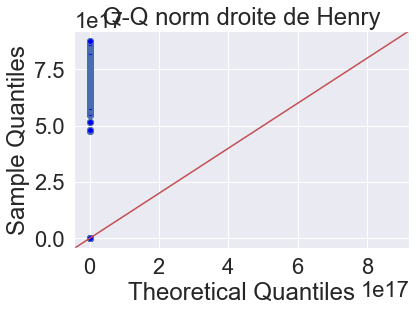

log_PropertyGFABuilding(s)


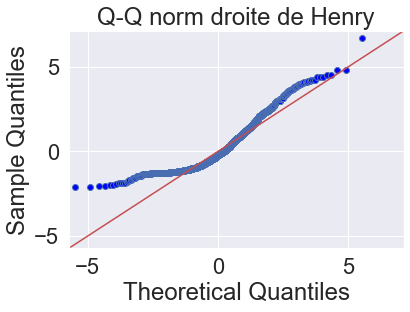

log_LargestPropertyUseTypeGFA


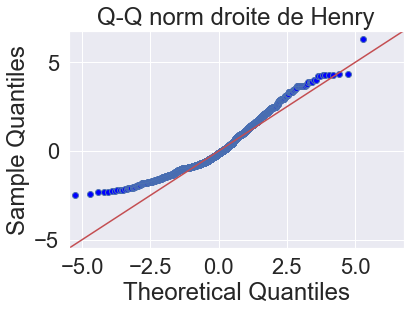

log_SiteEUI(kBtu/sf)


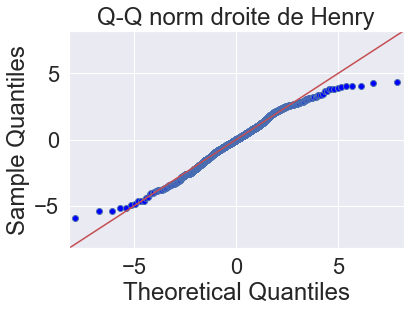

log_SourceEUI(kBtu/sf)


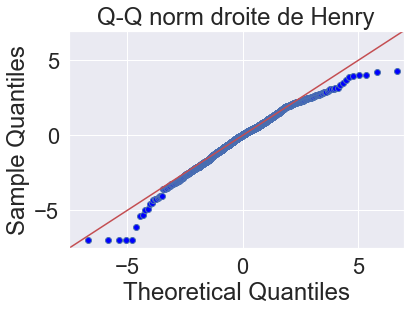

log_SiteEnergyUse(kBtu)


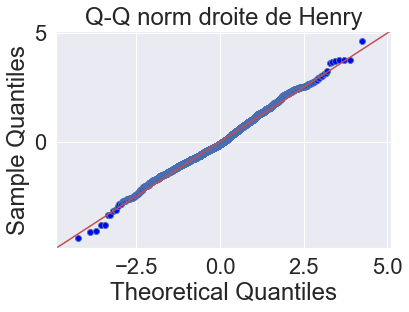

log_SteamUse(kBtu)


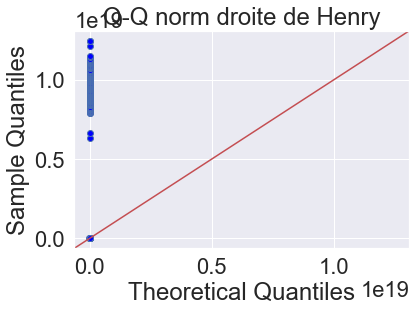

log_Electricity(kBtu)


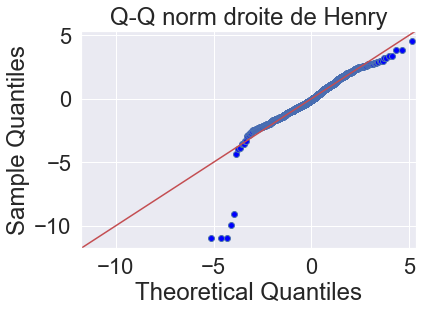

log_NaturalGas(kBtu)


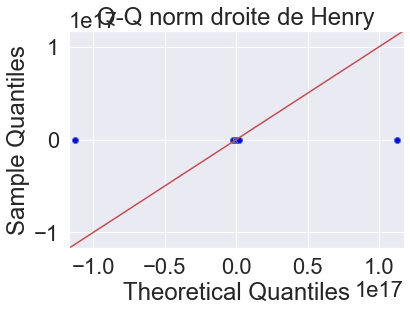

log_TotalGHGEmissions


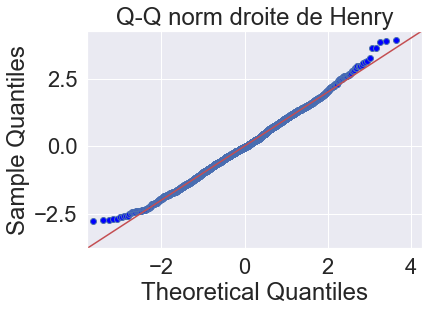

In [190]:
#qqpolot vs. loi normale (droite de Henry)
for col in log:
    sm.qqplot(df_log[col],stats.t, fit=True, line="45")
    plt.title("Q-Q norm droite de Henry")
    print(col)
    plt.show()


La pvalue étant inférieure au seuil de 5%, on peut en conclure que la distribution des résidus ne suit pas une loi normale

## Homoscédasticité

Pour teste l'homoscédasticité on peut utiliser le test de Levene.

In [191]:
df_log['PrimaryPropertyType'].value_counts()

Small- and Mid-Sized Office    523
Other                          409
Warehouse                      333
Large Office                   318
K-12 School                    183
Mixed Use Property             166
Retail Store                   148
Hotel                          126
Worship Facility               118
Distribution Center             90
Medical Office                  69
Supermarket / Grocery Store     55
Self-Storage Facility           46
University                      33
Restaurant                      21
Refrigerated Warehouse          21
Hospital                         8
Laboratory                       7
Name: PrimaryPropertyType, dtype: int64

In [192]:
# Homoscédasticité : Test de Levene
for col in log:
    alpha = 0.05
    result = st.levene(df_log[df_log['PrimaryPropertyType'] == 'Small- and Mid-Sized Office'][col],
                       df_log[df_log['PrimaryPropertyType'] == 'Other'][col],
                       df_log[df_log['PrimaryPropertyType'] == 'Warehouse'][col],
                       df_log[df_log['PrimaryPropertyType'] == 'Large Office'][col],
                       df_log[df_log['PrimaryPropertyType'] == 'K-12 School'][col],
                       df_log[df_log['PrimaryPropertyType'] == 'Retail Store'][col],
                       df_log[df_log['PrimaryPropertyType'] == 'Hotel'][col],
                       df_log[df_log['PrimaryPropertyType'] == 'Mixed Use Property'][col],
                       df_log[df_log['PrimaryPropertyType'] == 'Worship Facility'][col],
                       df_log[df_log['PrimaryPropertyType'] == 'Distribution Center'][col],
                       df_log[df_log['PrimaryPropertyType'] == 'Medical Office'][col],
                       df_log[df_log['PrimaryPropertyType'] == 'Supermarket / Grocery Storer'][col],
                       df_log[df_log['PrimaryPropertyType'] == 'Self-Storage Facility'][col],
                       df_log[df_log['PrimaryPropertyType'] == 'University'][col],
                       df_log[df_log['PrimaryPropertyType'] == 'Restaurant'][col],
                       df_log[df_log['PrimaryPropertyType'] == 'Refrigerated Warehouse'][col],
                       df_log[df_log['PrimaryPropertyType'] == 'Office'][col],
                       df_log[df_log['PrimaryPropertyType'] == 'Laboratory'][col],
                       df_log[df_log['PrimaryPropertyType'] == 'Hospital'][col],
                       df_log[df_log['PrimaryPropertyType'] == 'Non-Refrigerated Warehouse'][col])




    print(f'{col :-<70} {result.pvalue}')

    if result.pvalue >= alpha:
        print("l'hypothèse d'homoscédasticité est validée")
    else:
        print("On rejete l'hypothèse d'homoscédasticité")

log_YearBuilt--------------------------------------------------------- nan
On rejete l'hypothèse d'homoscédasticité
log_NumberofBuildings------------------------------------------------- nan
On rejete l'hypothèse d'homoscédasticité
log_NumberofFloors---------------------------------------------------- nan
On rejete l'hypothèse d'homoscédasticité
log_PropertyGFATotal-------------------------------------------------- nan
On rejete l'hypothèse d'homoscédasticité
log_PropertyGFAParking------------------------------------------------ nan
On rejete l'hypothèse d'homoscédasticité
log_PropertyGFABuilding(s)-------------------------------------------- nan
On rejete l'hypothèse d'homoscédasticité
log_LargestPropertyUseTypeGFA----------------------------------------- nan
On rejete l'hypothèse d'homoscédasticité
log_SiteEUI(kBtu/sf)-------------------------------------------------- nan
On rejete l'hypothèse d'homoscédasticité
log_SourceEUI(kBtu/sf)------------------------------------------------ n

## ANOVA PrimaryPropertyType

Existe t-il une corrélation entre les groupes PrimaryPropertyType et les features quantitatives de notre dataset?

In [193]:
for col in log:
    result = st.f_oneway(df_log[df_log['PrimaryPropertyType'] == 'Small- and Mid-Sized Office'][col],
                       df_log[df_log['PrimaryPropertyType'] == 'Other'][col],
                       df_log[df_log['PrimaryPropertyType'] == 'Warehouse'][col],
                       df_log[df_log['PrimaryPropertyType'] == 'Large Office'][col],
                       df_log[df_log['PrimaryPropertyType'] == 'K-12 School'][col],
                       df_log[df_log['PrimaryPropertyType'] == 'Retail Store'][col],
                       df_log[df_log['PrimaryPropertyType'] == 'Hotel'][col],
                       df_log[df_log['PrimaryPropertyType'] == 'Mixed Use Property'][col],
                       df_log[df_log['PrimaryPropertyType'] == 'Worship Facility'][col],
                       df_log[df_log['PrimaryPropertyType'] == 'Distribution Center'][col],
                       df_log[df_log['PrimaryPropertyType'] == 'Medical Office'][col],
                       df_log[df_log['PrimaryPropertyType'] == 'Supermarket / Grocery Storer'][col],
                       df_log[df_log['PrimaryPropertyType'] == 'Self-Storage Facility'][col],
                       df_log[df_log['PrimaryPropertyType'] == 'University'][col],
                       df_log[df_log['PrimaryPropertyType'] == 'Restaurant'][col],
                       df_log[df_log['PrimaryPropertyType'] == 'Refrigerated Warehouse'][col],
                       df_log[df_log['PrimaryPropertyType'] == 'Office'][col],
                       df_log[df_log['PrimaryPropertyType'] == 'Laboratory'][col],
                       df_log[df_log['PrimaryPropertyType'] == 'Hospital'][col],
                       df_log[df_log['PrimaryPropertyType'] == 'Non-Refrigerated Warehouse'][col])
    print(f'{col :-<70}{result.pvalue}')
    if result.pvalue > 0.05:
        print("H0: l'hypothèse nulle: "+col+"d'un batiment et le PrimaryPropertyType sont indépendantes")
    else:
        print("Ha: l'hypothèse alternative: "+col+" d'un batiment et le PrimaryPropertyType sont corrélées")

log_YearBuilt---------------------------------------------------------nan
Ha: l'hypothèse alternative: log_YearBuilt d'un batiment et le PrimaryPropertyType sont corrélées
log_NumberofBuildings-------------------------------------------------nan
Ha: l'hypothèse alternative: log_NumberofBuildings d'un batiment et le PrimaryPropertyType sont corrélées
log_NumberofFloors----------------------------------------------------nan
Ha: l'hypothèse alternative: log_NumberofFloors d'un batiment et le PrimaryPropertyType sont corrélées
log_PropertyGFATotal--------------------------------------------------nan
Ha: l'hypothèse alternative: log_PropertyGFATotal d'un batiment et le PrimaryPropertyType sont corrélées
log_PropertyGFAParking------------------------------------------------nan
Ha: l'hypothèse alternative: log_PropertyGFAParking d'un batiment et le PrimaryPropertyType sont corrélées
log_PropertyGFABuilding(s)--------------------------------------------nan
Ha: l'hypothèse alternative: log_Prop

In [194]:
import scipy.stats as st
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import (pairwise_tukeyhsd, MultiComparison)

log_YearBuilt---------------------------------------------------------
                     Multiple Comparison of Means - Tukey HSD, FWER=0.05                      
           group1                      group2           meandiff p-adj   lower   upper  reject
----------------------------------------------------------------------------------------------
        Distribution Center                    Hospital   0.0147 0.5574 -0.0062  0.0356  False
        Distribution Center                       Hotel   0.0011    0.9 -0.0067  0.0089  False
        Distribution Center                 K-12 School   0.0016    0.9 -0.0057  0.0089  False
        Distribution Center                  Laboratory   0.0064    0.9 -0.0158  0.0286  False
        Distribution Center                Large Office   0.0076 0.0107  0.0008  0.0144   True
        Distribution Center              Medical Office   0.0078 0.1952 -0.0012  0.0169  False
        Distribution Center          Mixed Use Property  -0.0015    0.9  -

Figure(720x432)


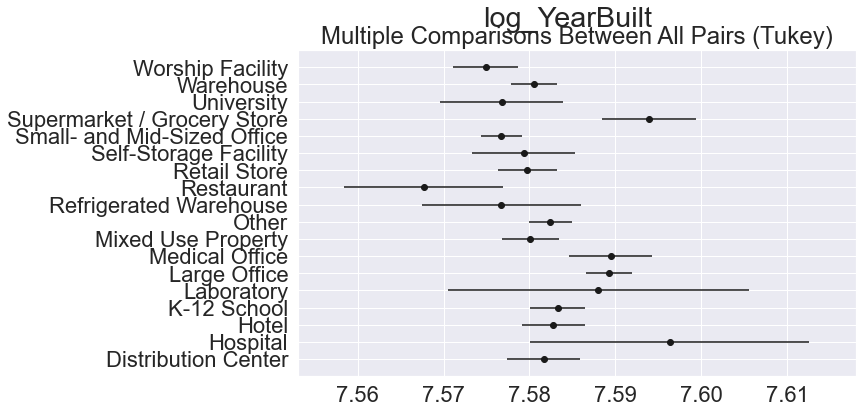

log_NumberofBuildings-------------------------------------------------
                     Multiple Comparison of Means - Tukey HSD, FWER=0.05                      
           group1                      group2           meandiff p-adj   lower   upper  reject
----------------------------------------------------------------------------------------------
        Distribution Center                    Hospital   0.3222  0.001  0.1213  0.5231   True
        Distribution Center                       Hotel  -0.0045    0.9 -0.0796  0.0707  False
        Distribution Center                 K-12 School  -0.0077    0.9 -0.0778  0.0624  False
        Distribution Center                  Laboratory  -0.0077    0.9 -0.2214   0.206  False
        Distribution Center                Large Office   0.0066    0.9 -0.0584  0.0717  False
        Distribution Center              Medical Office  -0.0018    0.9  -0.089  0.0853  False
        Distribution Center          Mixed Use Property  -0.0011    0.9 -0

Figure(720x432)


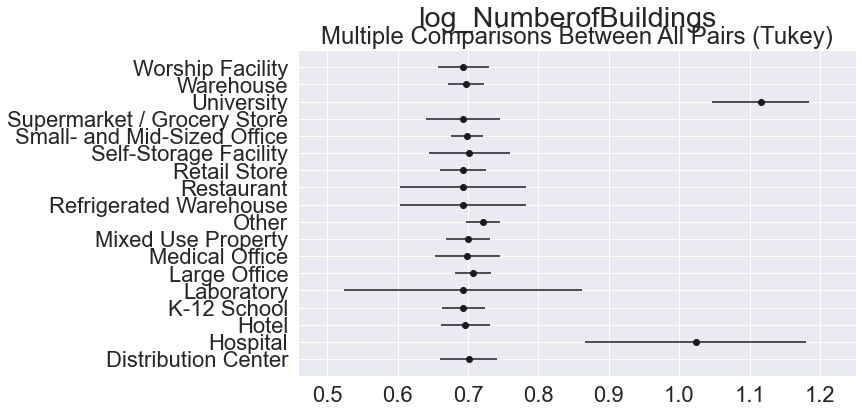

log_NumberofFloors----------------------------------------------------
                     Multiple Comparison of Means - Tukey HSD, FWER=0.05                      
           group1                      group2           meandiff p-adj   lower   upper  reject
----------------------------------------------------------------------------------------------
        Distribution Center                    Hospital   1.5316  0.001  0.9263   2.137   True
        Distribution Center                       Hotel   1.3312  0.001  1.1047  1.5576   True
        Distribution Center                 K-12 School   0.3267  0.001  0.1154  0.5379   True
        Distribution Center                  Laboratory   0.7016 0.0171  0.0577  1.3454   True
        Distribution Center                Large Office   1.5352  0.001  1.3393  1.7311   True
        Distribution Center              Medical Office   0.8525  0.001  0.5899  1.1151   True
        Distribution Center          Mixed Use Property   0.4185  0.001  0

Figure(720x432)


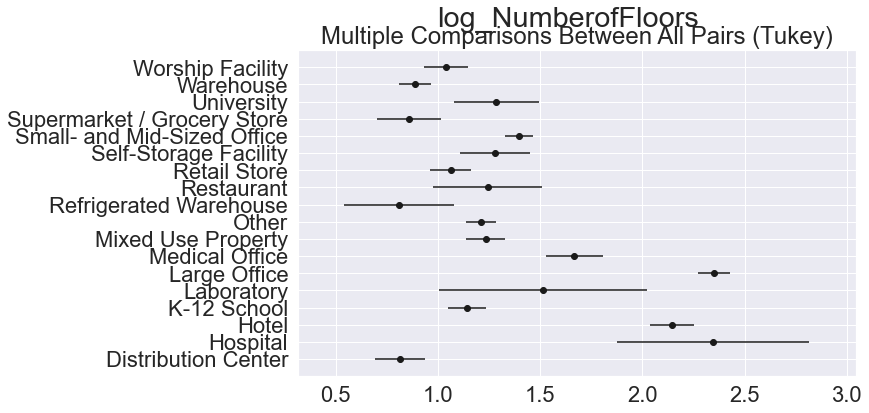

log_PropertyGFATotal--------------------------------------------------
                     Multiple Comparison of Means - Tukey HSD, FWER=0.05                      
           group1                      group2           meandiff p-adj   lower   upper  reject
----------------------------------------------------------------------------------------------
        Distribution Center                    Hospital    2.529  0.001  1.5745  3.4835   True
        Distribution Center                       Hotel   0.6744  0.001  0.3174  1.0315   True
        Distribution Center                 K-12 School    0.228 0.5978 -0.1051  0.5611  False
        Distribution Center                  Laboratory   0.5333    0.9 -0.4819  1.5484  False
        Distribution Center                Large Office   1.6609  0.001   1.352  1.9698   True
        Distribution Center              Medical Office     0.75  0.001  0.3361   1.164   True
        Distribution Center          Mixed Use Property  -0.0437    0.9 -0

Figure(720x432)


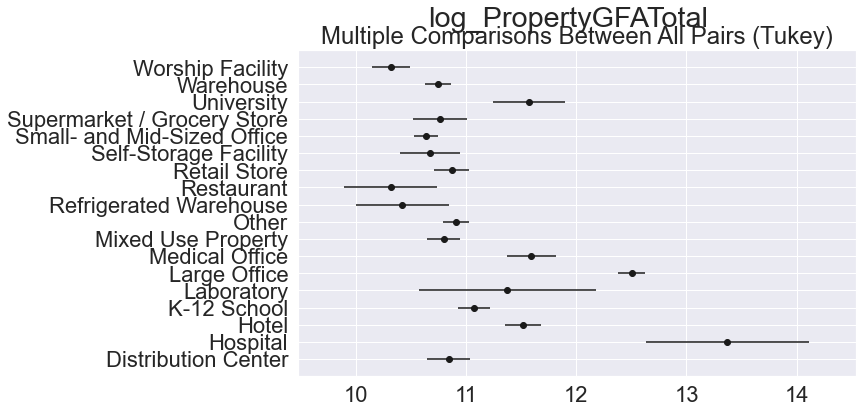

log_PropertyGFAParking------------------------------------------------
                      Multiple Comparison of Means - Tukey HSD, FWER=0.05                      
           group1                      group2           meandiff p-adj   lower    upper  reject
-----------------------------------------------------------------------------------------------
        Distribution Center                    Hospital    2.774 0.8551  -2.0786  7.6265  False
        Distribution Center                       Hotel    4.772  0.001   2.9567  6.5873   True
        Distribution Center                 K-12 School  -0.2064    0.9  -1.8998   1.487  False
        Distribution Center                  Laboratory   4.5204 0.1742  -0.6407  9.6815  False
        Distribution Center                Large Office    6.869  0.001   5.2985  8.4394   True
        Distribution Center              Medical Office   6.3309  0.001   4.2262  8.4355   True
        Distribution Center          Mixed Use Property   2.7141 

Figure(720x432)


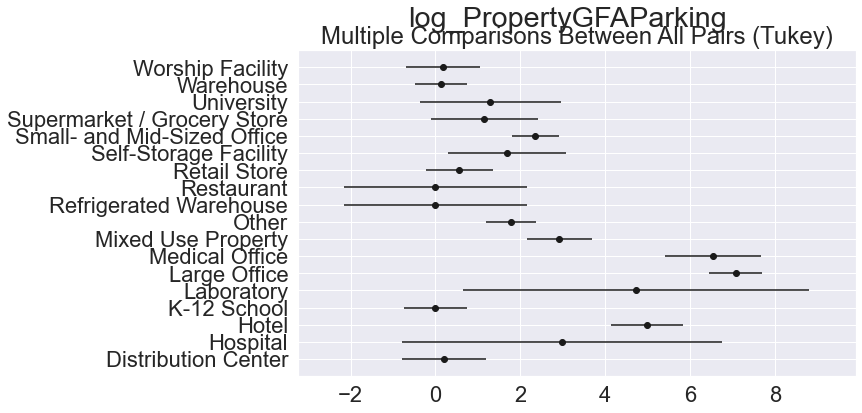

log_PropertyGFABuilding(s)--------------------------------------------
                     Multiple Comparison of Means - Tukey HSD, FWER=0.05                      
           group1                      group2           meandiff p-adj   lower   upper  reject
----------------------------------------------------------------------------------------------
        Distribution Center                    Hospital   2.3794  0.001  1.4559  3.3029   True
        Distribution Center                       Hotel   0.5537  0.001  0.2083  0.8992   True
        Distribution Center                 K-12 School   0.2314 0.5211 -0.0909  0.5537  False
        Distribution Center                  Laboratory   0.3646    0.9 -0.6176  1.3468  False
        Distribution Center                Large Office   1.4305  0.001  1.1316  1.7293   True
        Distribution Center              Medical Office   0.4513 0.0105  0.0508  0.8518   True
        Distribution Center          Mixed Use Property   -0.167    0.9 -0

Figure(720x432)


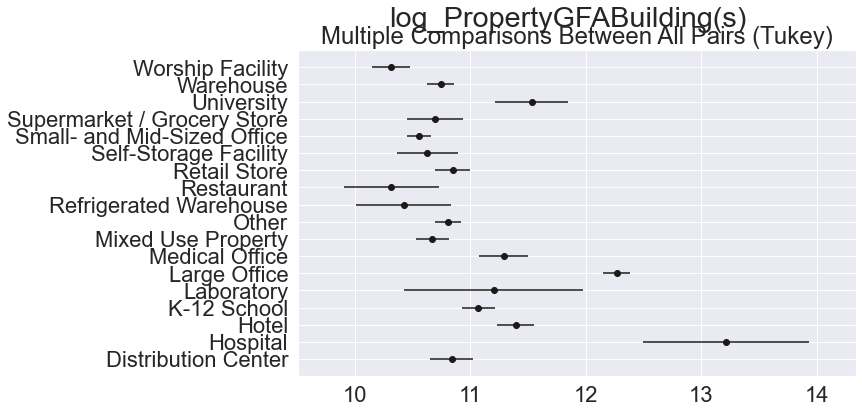

log_LargestPropertyUseTypeGFA-----------------------------------------
                     Multiple Comparison of Means - Tukey HSD, FWER=0.05                      
           group1                      group2           meandiff p-adj   lower   upper  reject
----------------------------------------------------------------------------------------------
        Distribution Center                    Hospital   2.4927  0.001  1.5277  3.4576   True
        Distribution Center                       Hotel   0.6709  0.001  0.3099  1.0319   True
        Distribution Center                 K-12 School   0.3666 0.0173  0.0298  0.7033   True
        Distribution Center                  Laboratory   0.3786    0.9 -0.6477  1.4049  False
        Distribution Center                Large Office   1.5025  0.001  1.1902  1.8148   True
        Distribution Center              Medical Office   0.5919  0.001  0.1733  1.0104   True
        Distribution Center          Mixed Use Property  -0.7389  0.001 -1

Figure(720x432)


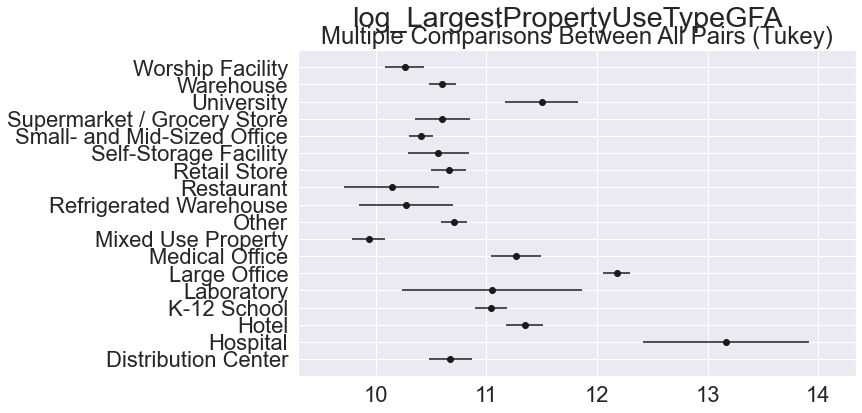

log_SiteEUI(kBtu/sf)--------------------------------------------------
                     Multiple Comparison of Means - Tukey HSD, FWER=0.05                      
           group1                      group2           meandiff p-adj   lower   upper  reject
----------------------------------------------------------------------------------------------
        Distribution Center                    Hospital   2.1059  0.001  1.2453  2.9664   True
        Distribution Center                       Hotel   1.0599  0.001   0.738  1.3818   True
        Distribution Center                 K-12 School   0.4031  0.001  0.1028  0.7034   True
        Distribution Center                  Laboratory   2.4011  0.001  1.4858  3.3163   True
        Distribution Center                Large Office   0.8287  0.001  0.5502  1.1072   True
        Distribution Center              Medical Office   1.1708  0.001  0.7976   1.544   True
        Distribution Center          Mixed Use Property   0.9252  0.001  0

Figure(720x432)


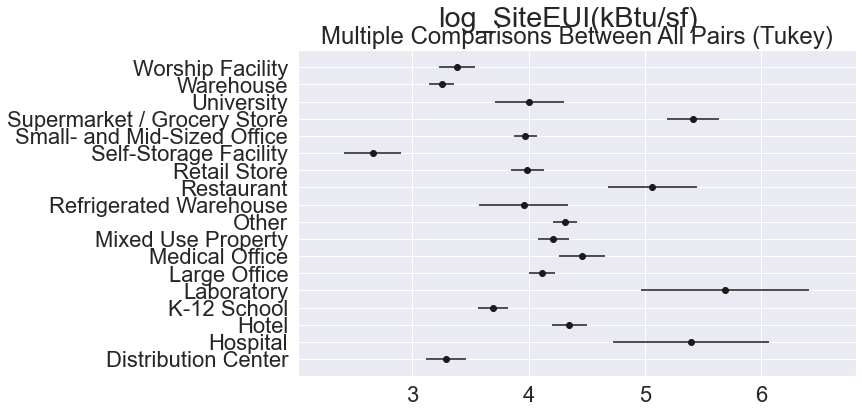

log_SourceEUI(kBtu/sf)------------------------------------------------
                     Multiple Comparison of Means - Tukey HSD, FWER=0.05                      
           group1                      group2           meandiff p-adj   lower   upper  reject
----------------------------------------------------------------------------------------------
        Distribution Center                    Hospital   2.0038  0.001   1.103  2.9047   True
        Distribution Center                       Hotel   0.9236  0.001  0.5866  1.2606   True
        Distribution Center                 K-12 School   0.1428    0.9 -0.1715  0.4572  False
        Distribution Center                  Laboratory   2.2868  0.001  1.3287  3.2449   True
        Distribution Center                Large Office   1.0455  0.001   0.754  1.3371   True
        Distribution Center              Medical Office   1.3044  0.001  0.9137  1.6951   True
        Distribution Center          Mixed Use Property   0.9502  0.001  0

Figure(720x432)


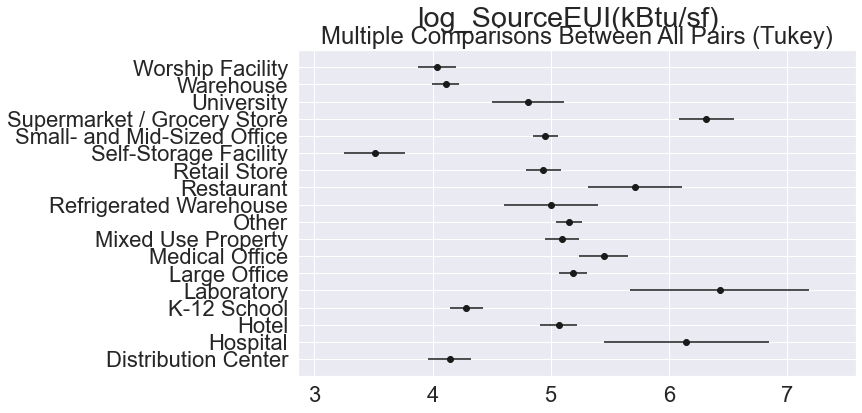

log_SiteEnergyUse(kBtu)-----------------------------------------------
                     Multiple Comparison of Means - Tukey HSD, FWER=0.05                      
           group1                      group2           meandiff p-adj   lower   upper  reject
----------------------------------------------------------------------------------------------
        Distribution Center                    Hospital   4.4855  0.001  3.1404  5.8305   True
        Distribution Center                       Hotel   1.6521  0.001   1.149  2.1553   True
        Distribution Center                 K-12 School   0.6329  0.001  0.1635  1.1023   True
        Distribution Center                  Laboratory   2.8188  0.001  1.3882  4.2494   True
        Distribution Center                Large Office   2.2742  0.001  1.8389  2.7095   True
        Distribution Center              Medical Office   1.6733  0.001  1.0899  2.2567   True
        Distribution Center          Mixed Use Property   0.7755  0.001  0

Figure(720x432)


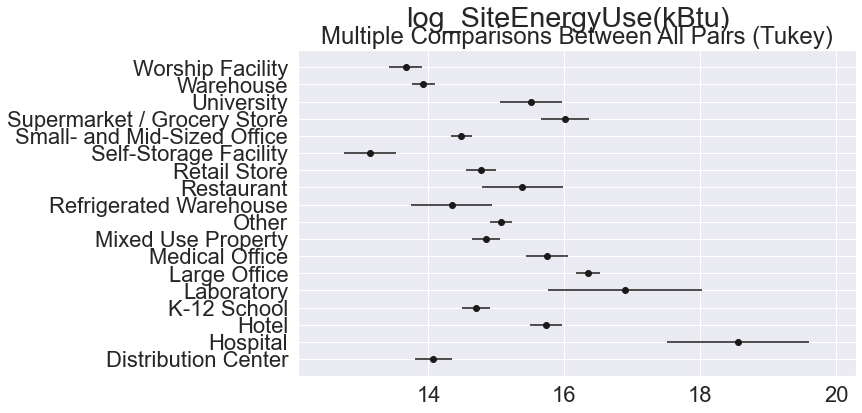

log_SteamUse(kBtu)----------------------------------------------------
                      Multiple Comparison of Means - Tukey HSD, FWER=0.05                      
           group1                      group2           meandiff p-adj   lower    upper  reject
-----------------------------------------------------------------------------------------------
        Distribution Center                    Hospital   4.6734 0.0484   0.0139  9.3329   True
        Distribution Center                       Hotel     3.19  0.001   1.4469   4.933   True
        Distribution Center                 K-12 School   0.1461    0.9  -1.4799  1.7721  False
        Distribution Center                  Laboratory      0.0    0.9  -4.9557  4.9557  False
        Distribution Center                Large Office   2.6865  0.001   1.1785  4.1944   True
        Distribution Center              Medical Office   2.6234  0.001   0.6025  4.6443   True
        Distribution Center          Mixed Use Property   0.6495 

Figure(720x432)


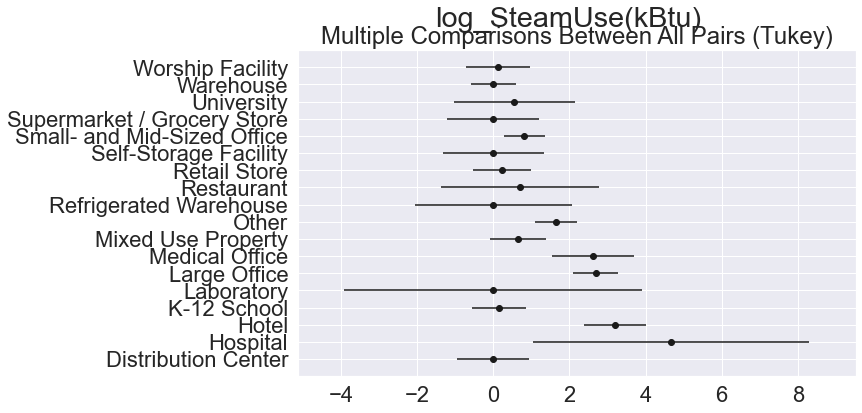

log_Electricity(kBtu)-------------------------------------------------
                     Multiple Comparison of Means - Tukey HSD, FWER=0.05                      
           group1                      group2           meandiff p-adj   lower   upper  reject
----------------------------------------------------------------------------------------------
        Distribution Center                    Hospital   4.2549  0.001  2.6456  5.8642   True
        Distribution Center                       Hotel   1.3253  0.001  0.7233  1.9273   True
        Distribution Center                 K-12 School   0.1101    0.9 -0.4515  0.6717  False
        Distribution Center                  Laboratory   2.5684  0.001  0.8568    4.28   True
        Distribution Center                Large Office   2.6218  0.001   2.101  3.1426   True
        Distribution Center              Medical Office   1.8721  0.001  1.1741  2.5701   True
        Distribution Center          Mixed Use Property   0.7709  0.001  0

Figure(720x432)


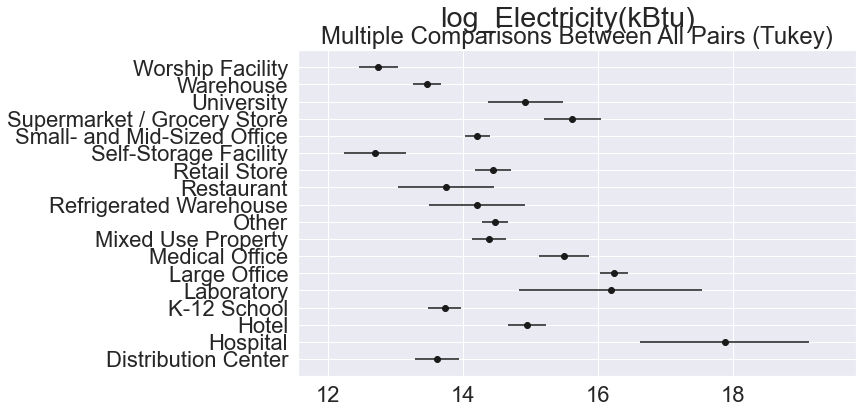

log_NaturalGas(kBtu)--------------------------------------------------
                      Multiple Comparison of Means - Tukey HSD, FWER=0.05                      
           group1                      group2           meandiff p-adj   lower    upper  reject
-----------------------------------------------------------------------------------------------
        Distribution Center                    Hospital   6.6234 0.1718  -0.9252  14.172  False
        Distribution Center                       Hotel     3.47 0.0025   0.6462  6.2939   True
        Distribution Center                 K-12 School   2.4733 0.0956  -0.1609  5.1076  False
        Distribution Center                  Laboratory   5.4714 0.6045  -2.5571 13.4999  False
        Distribution Center                Large Office  -3.7271  0.001    -6.17 -1.2841   True
        Distribution Center              Medical Office  -2.2651 0.5808  -5.5391  1.0088  False
        Distribution Center          Mixed Use Property  -0.0409 

Figure(720x432)


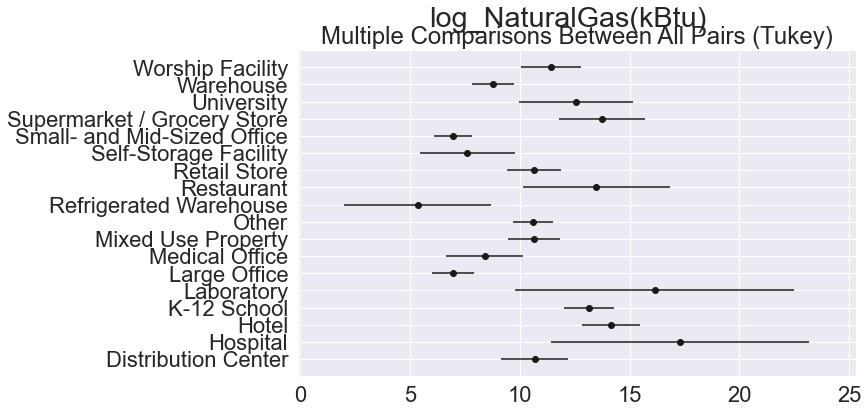

log_TotalGHGEmissions-------------------------------------------------
                     Multiple Comparison of Means - Tukey HSD, FWER=0.05                      
           group1                      group2           meandiff p-adj   lower   upper  reject
----------------------------------------------------------------------------------------------
        Distribution Center                    Hospital   4.9478  0.001  3.4143  6.4813   True
        Distribution Center                       Hotel   2.0644  0.001  1.4908  2.6381   True
        Distribution Center                 K-12 School    0.959  0.001  0.4238  1.4941   True
        Distribution Center                  Laboratory    3.197  0.001   1.566   4.828   True
        Distribution Center                Large Office   1.6673  0.001   1.171  2.1635   True
        Distribution Center              Medical Office   1.3392  0.001  0.6741  2.0043   True
        Distribution Center          Mixed Use Property   0.7172  0.001  0

Figure(720x432)


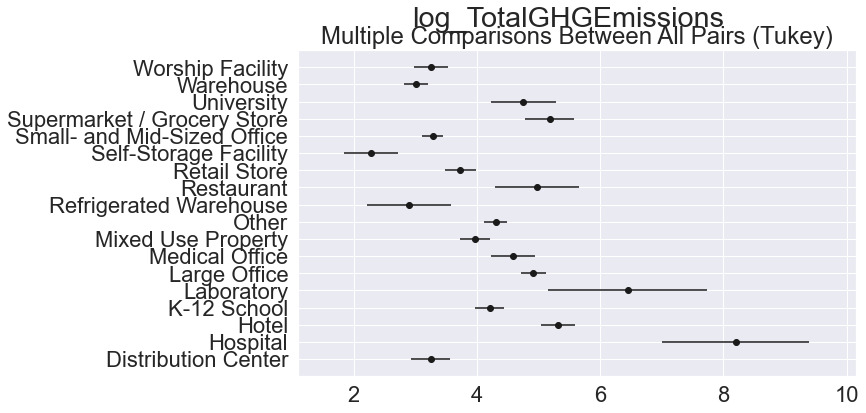

In [195]:
for col in log:
    MultiComp = MultiComparison(df_log[col], df_log['PrimaryPropertyType'])
    print(f'{col :-<70}')
    print(MultiComp.tukeyhsd().summary())
    print(MultiComp.tukeyhsd().plot_simultaneous())
    plt.suptitle(f'{col}')
    plt.show()

## Correlation de Spearman

Existe t-il une corrélation entre les varaibles à prédire *TotalGHGEmissions*, *SiteEnergyUse(kBtu)* et les autres features quantitatives de notre dataset?

### SiteEnergyUse Log

In [196]:
# Voici nos hypothèses :
# H0 : SiteEnergyUse(kBtu) et les autres features quantitatives sont indépendantes
# Ha : SiteEnergyUse(kBtu) et les autres features quantitatives sont corrélés

<Figure size 864x576 with 0 Axes>

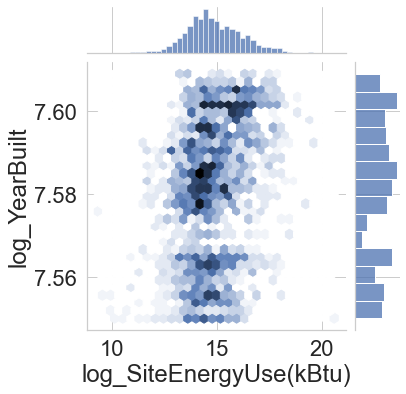

<Figure size 864x576 with 0 Axes>

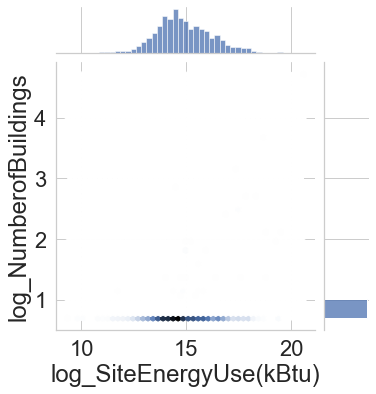

<Figure size 864x576 with 0 Axes>

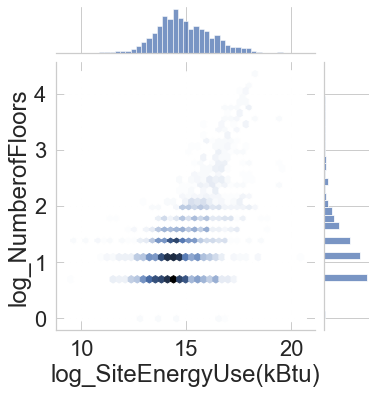

<Figure size 864x576 with 0 Axes>

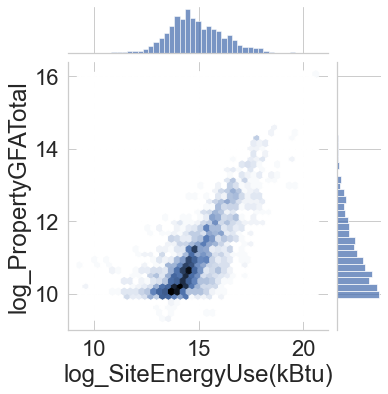

<Figure size 864x576 with 0 Axes>

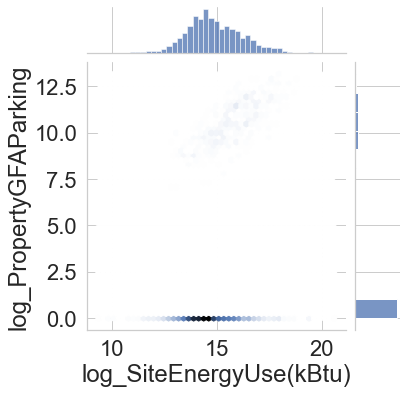

<Figure size 864x576 with 0 Axes>

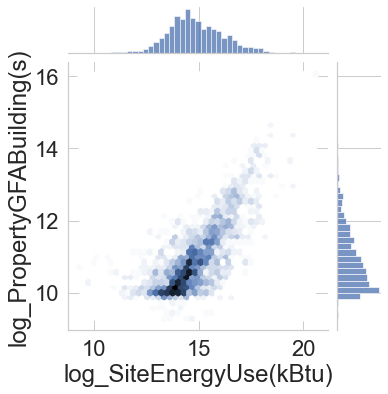

<Figure size 864x576 with 0 Axes>

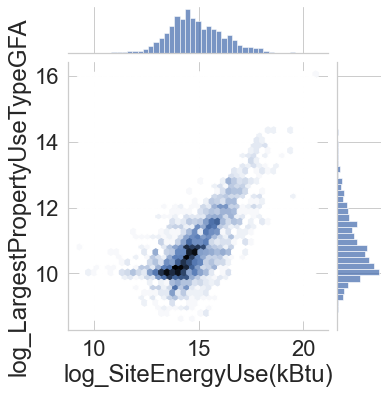

<Figure size 864x576 with 0 Axes>

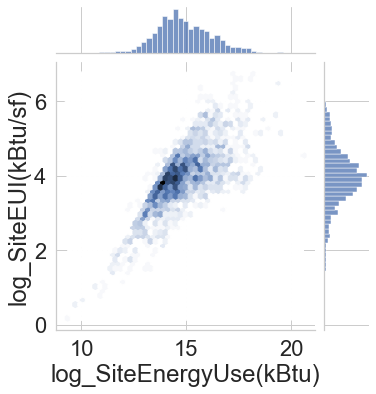

<Figure size 864x576 with 0 Axes>

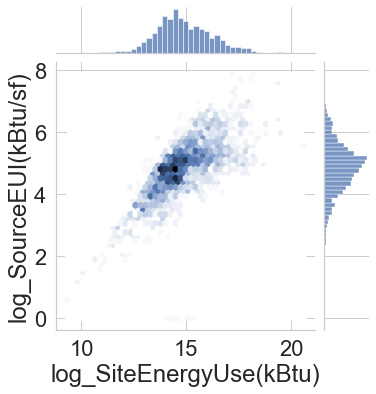

<Figure size 864x576 with 0 Axes>

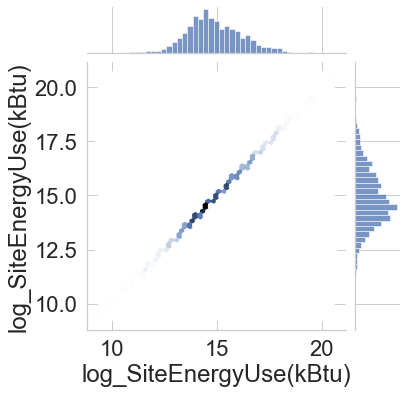

<Figure size 864x576 with 0 Axes>

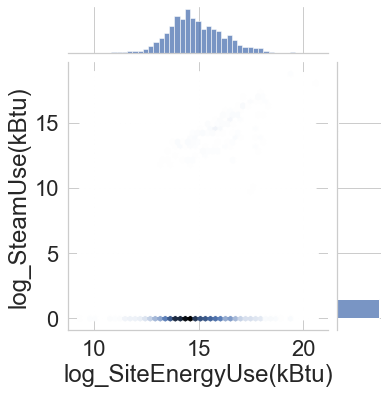

<Figure size 864x576 with 0 Axes>

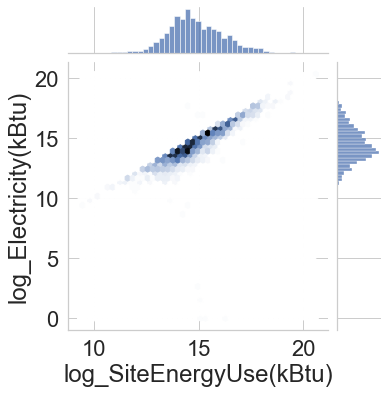

<Figure size 864x576 with 0 Axes>

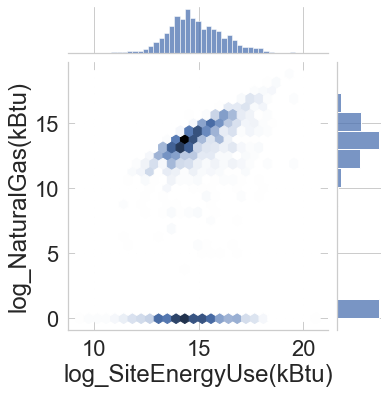

<Figure size 864x576 with 0 Axes>

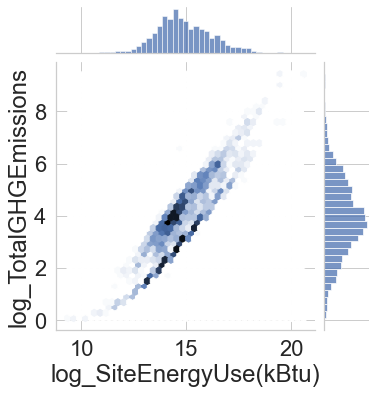

In [197]:
for col in df_log.select_dtypes(include=np.number):
    fig = plt.figure(figsize=[12, 8])
    sns.set(font_scale=2)
    sns.set_style('whitegrid')
    sns.jointplot(x=df_log['log_SiteEnergyUse(kBtu)'],y=col,data=df_log,kind='hex')
    plt.show()

In [198]:
#Correlation de Spearman (test non parametrique)
for col in df_log.select_dtypes(include=np.number):
    result = st.spearmanr(df_log['log_SiteEnergyUse(kBtu)'], df_log[col])
    print(f'{col :-<30}{result.correlation :-<30}{result.pvalue}')
    if result.pvalue > 0.05:
        print("H0: l'hypothèse nulle: "+col+"d'un batiment et le SiteEnergyUse(kBtu) sont indépendantes")
    else:
        print("Ha: l'hypothèse alternative: "+col+" d'un batiment et le SiteEnergyUse(kBtu) sont corrélées")

log_YearBuilt-----------------0.28470028375371376-----------4.870136404545142e-51
Ha: l'hypothèse alternative: log_YearBuilt d'un batiment et le SiteEnergyUse(kBtu) sont corrélées
log_NumberofBuildings---------0.08854806033538605-----------4.523506816045713e-06
Ha: l'hypothèse alternative: log_NumberofBuildings d'un batiment et le SiteEnergyUse(kBtu) sont corrélées
log_NumberofFloors------------0.4954435108324521------------1.1836234230354894e-165
Ha: l'hypothèse alternative: log_NumberofFloors d'un batiment et le SiteEnergyUse(kBtu) sont corrélées
log_PropertyGFATotal----------0.7502223312299644------------0.0
Ha: l'hypothèse alternative: log_PropertyGFATotal d'un batiment et le SiteEnergyUse(kBtu) sont corrélées
log_PropertyGFAParking--------0.3947539322826844------------2.0007194520869677e-100
Ha: l'hypothèse alternative: log_PropertyGFAParking d'un batiment et le SiteEnergyUse(kBtu) sont corrélées
log_PropertyGFABuilding(s)----0.7301345557524654------------0.0
Ha: l'hypothèse alter

### TotalGHGEmissions Log

In [199]:
# Voici nos hypothèses :
# H0 : TotalGHGEmissions et les autres features quantitatives sont indépendantes
# Ha : TotalGHGEmissions et les autres features quantitatives sont corrélés

<Figure size 864x576 with 0 Axes>

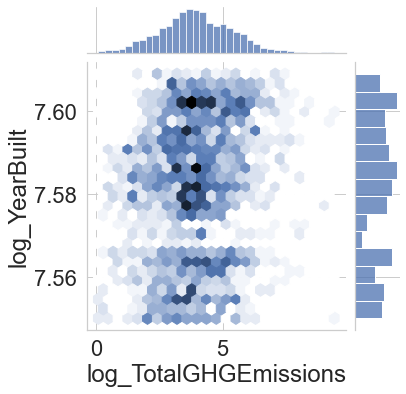

<Figure size 864x576 with 0 Axes>

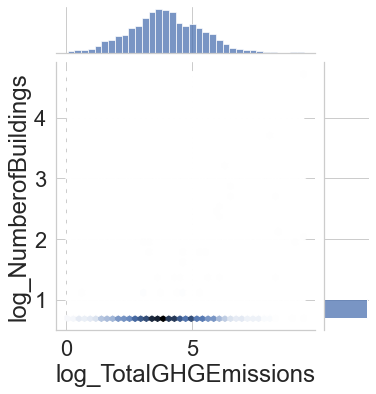

<Figure size 864x576 with 0 Axes>

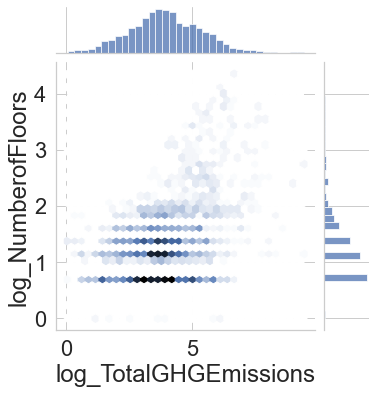

<Figure size 864x576 with 0 Axes>

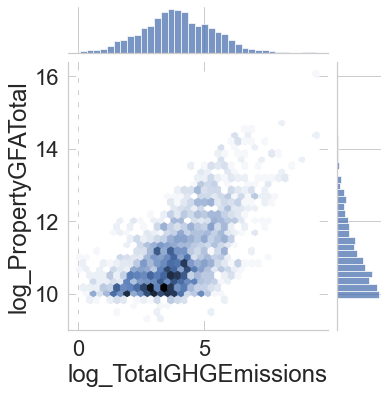

<Figure size 864x576 with 0 Axes>

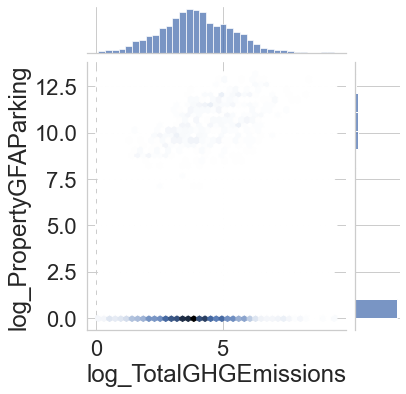

<Figure size 864x576 with 0 Axes>

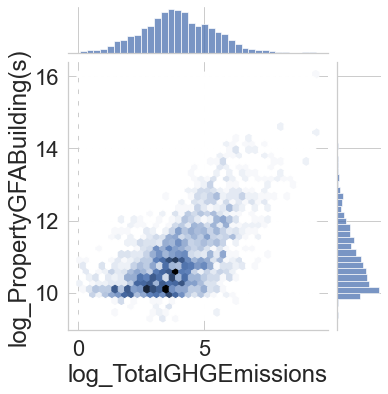

<Figure size 864x576 with 0 Axes>

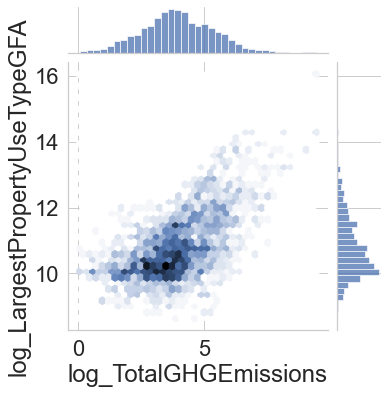

<Figure size 864x576 with 0 Axes>

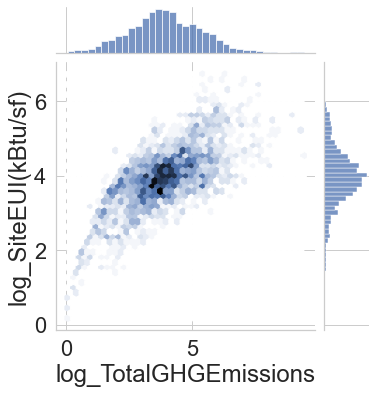

<Figure size 864x576 with 0 Axes>

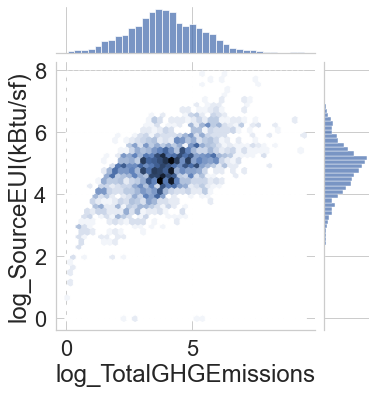

<Figure size 864x576 with 0 Axes>

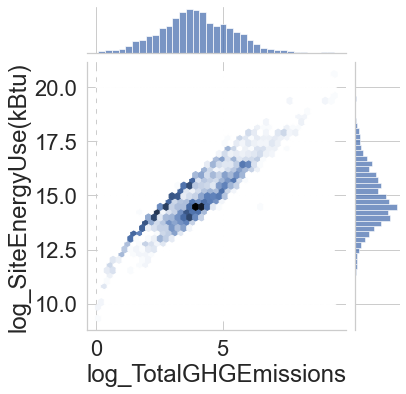

<Figure size 864x576 with 0 Axes>

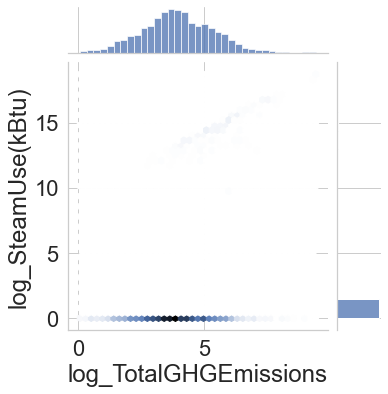

<Figure size 864x576 with 0 Axes>

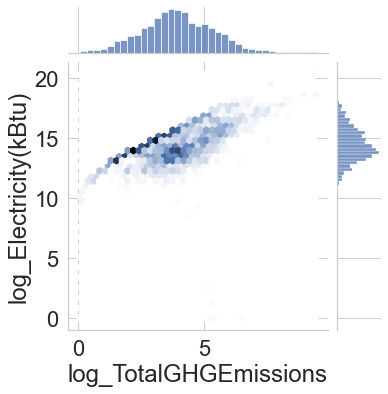

<Figure size 864x576 with 0 Axes>

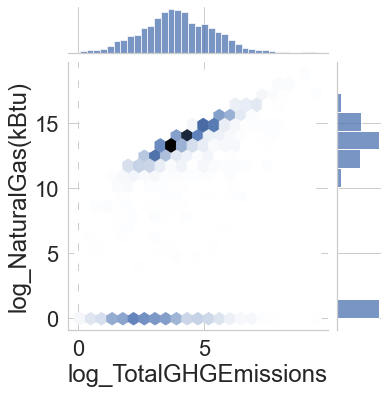

<Figure size 864x576 with 0 Axes>

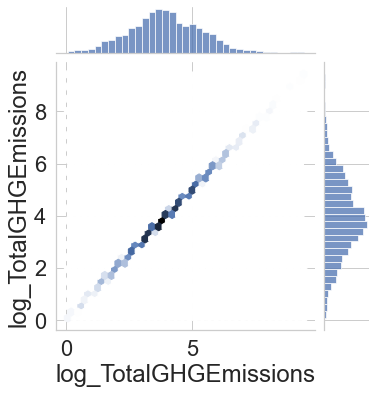

In [200]:
for col in df_log.select_dtypes(include=np.number):
    fig = plt.figure(figsize=[12, 8])
    sns.set(font_scale=2)
    sns.set_style('whitegrid')
    sns.jointplot(x=df_log['log_TotalGHGEmissions'],y=col,data=df_log,kind='hex')
    plt.show()

In [201]:
#Correlation de Spearman (test non parametrique)
for col in df_log.select_dtypes(include=np.number):
    result = st.spearmanr(df_log['log_TotalGHGEmissions'], df_log[col])
    print(f'{col :-<30}{result.correlation :-<30}{result.pvalue}')
    if result.pvalue > 0.05:
        print("H0: l'hypothèse nulle: "+col+"d'un batiment et le TotalGHGEmissions sont indépendantes")
    else:
        print("Ha: l'hypothèse alternative: "+col+" d'un batiment et le TotalGHGEmissions sont corrélées")

log_YearBuilt-----------------0.17107397596499416-----------5.197653153042163e-19
Ha: l'hypothèse alternative: log_YearBuilt d'un batiment et le TotalGHGEmissions sont corrélées
log_NumberofBuildings---------0.08950452135938369-----------3.560993115654041e-06
Ha: l'hypothèse alternative: log_NumberofBuildings d'un batiment et le TotalGHGEmissions sont corrélées
log_NumberofFloors------------0.34208926662375716-----------2.755202592369919e-74
Ha: l'hypothèse alternative: log_NumberofFloors d'un batiment et le TotalGHGEmissions sont corrélées
log_PropertyGFATotal----------0.5883199471428017------------8.387678816737156e-249
Ha: l'hypothèse alternative: log_PropertyGFATotal d'un batiment et le TotalGHGEmissions sont corrélées
log_PropertyGFAParking--------0.23795491872051308-----------9.753070440152447e-36
Ha: l'hypothèse alternative: log_PropertyGFAParking d'un batiment et le TotalGHGEmissions sont corrélées
log_PropertyGFABuilding(s)----0.5897593584615258------------2.6056719105249787e-

La pvalue est inférieure à 5% pur toutes nos features, nous pouvons conclure que toutes les features sont corrélées  au TotalGHGEmissions 

# Feature Engineering

## Build Age

In [202]:
df['Build_Age'] = df['DataYear'] - df['YearBuilt']

In [203]:
df['Build_Age'].max()

116

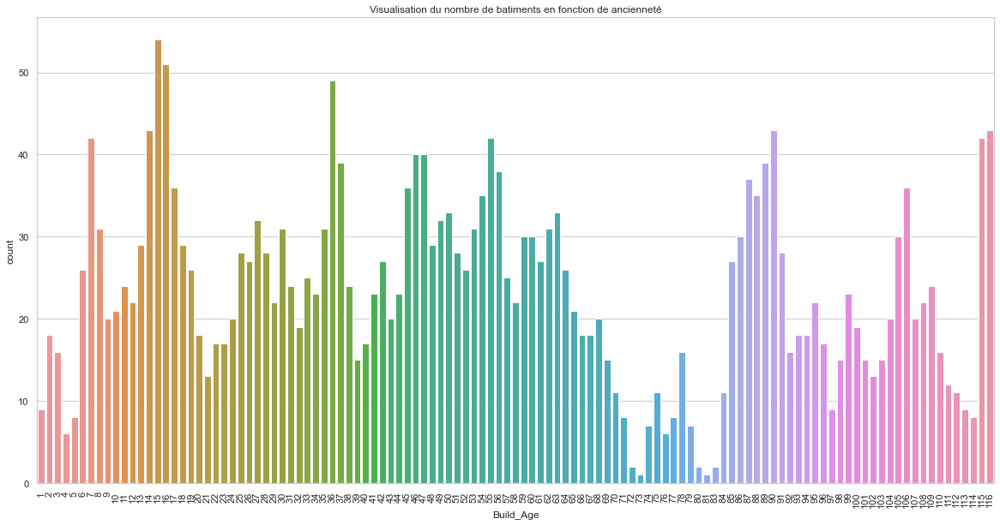

In [204]:
plt.figure(figsize=(20,10))
sns.set(font_scale=1)
sns.set_style('whitegrid')
sns.countplot(x='Build_Age', data=df).set(title='Visualisation du nombre de batiments en fonction de ancienneté')
plt.tick_params(axis='x', rotation=90)
plt.show()

In [205]:
df.drop(['OSEBuildingID', 'DataYear','YearBuilt'], axis=1, inplace=True)

## Surface Nb de Building

In [206]:
df = df.assign(surface_nb_building=lambda x: round( x['PropertyGFATotal'] / x['NumberofBuildings'], 2))

In [207]:
df.drop(['NumberofBuildings'], axis=1, inplace=True)

## Nombre d'activités

In [208]:
# Splittez la colonne en utilisant la méthode str.split()
df['ListOfAllPropertyUseTypes_split'] = df['ListOfAllPropertyUseTypes'].str.split(',')

In [209]:
# Compter le nombre d'éléments dans chaque ligne en utilisant apply()
df['nombre_activités'] = df['ListOfAllPropertyUseTypes_split'].apply(lambda x: len(x))

In [210]:
df.drop(['ListOfAllPropertyUseTypes_split'], axis=1, inplace=True)

## Energy
Nous calculons le poucentage de chaque energy ('SteamUse(kBtu)',
       'Electricity(kBtu)', 'NaturalGas(kBtu) en fonction de l'énergy total use

In [211]:
df = df.assign(pourcentage_Electricity=lambda x: round( x['Electricity(kBtu)'] / x['SiteEnergyUse(kBtu)']*100, 2))

In [212]:
df = df.assign(pourcentage_NaturalGas=lambda x: round( x['NaturalGas(kBtu)'] / x['SiteEnergyUse(kBtu)']*100, 2))

In [213]:
df = df.assign(pourcentage_SteamUse=lambda x: round( x['SteamUse(kBtu)'] / x['SiteEnergyUse(kBtu)']*100, 2))

In [214]:
df[[ 'pourcentage_Electricity', 'pourcentage_NaturalGas', 'pourcentage_SteamUse']]

,pourcentage_Electricity,pourcentage_NaturalGas,pourcentage_SteamUse
0,52.80,18.23,28.98
1,46.75,53.25,0.00
2,68.05,5.07,26.88
3,9.81,7.09,83.10
4,60.33,39.67,0.00
...,...,...,...
2669,61.70,38.30,0.00
2670,41.73,58.27,0.00
2671,31.08,68.92,0.00
2672,48.49,51.51,0.00


In [215]:
df.drop(['Electricity(kBtu)','NaturalGas(kBtu)','SteamUse(kBtu)'], axis=1, inplace=True)

## Localisation batiment - Geopandas

In [216]:
# Create a geometry column by constructing Point objects from the lon and lat columns
df['geometry'] = df.apply(lambda row: Point(row['Longitude'], row['Latitude']), axis=1)

In [217]:
# Create a GeoDataFrame from the DataFrame
gdf = gpd.GeoDataFrame(df, geometry='geometry')

In [218]:
gdf.crs

In [219]:
gdf = gdf[gdf.is_valid == True]

<AxesSubplot:>

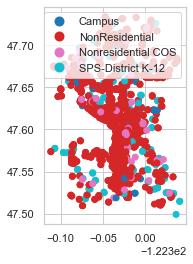

In [220]:
gdf['geometry'].centroid
gdf.plot(column = "BuildingType",legend=True)

In [221]:
df.drop(['Longitude', 'Latitude'], axis=1, inplace=True)

In [222]:
df.drop(['BuildingType', 'PropertyName',
       'ListOfAllPropertyUseTypes', 'LargestPropertyUseType',
       'LargestPropertyUseTypeGFA','SiteEUI(kBtu/sf)',
       'SourceEUI(kBtu/sf)'],axis=1,inplace=True)

In [223]:
df_log

,log_YearBuilt,log_NumberofBuildings,log_NumberofFloors,log_PropertyGFATotal,log_PropertyGFAParking,log_PropertyGFABuilding(s),log_LargestPropertyUseTypeGFA,log_SiteEUI(kBtu/sf),log_SourceEUI(kBtu/sf),log_SiteEnergyUse(kBtu),log_SteamUse(kBtu),log_Electricity(kBtu),log_NaturalGas(kBtu),log_TotalGHGEmissions,PrimaryPropertyType,SecondLargestPropertyUseType,ThirdLargestPropertyUseType
0,7.564238,0.693147,2.564949,11.390023,0.000000,11.390023,11.390023,4.380776,5.161925,15.758764,14.520108,15.120096,14.056407,5.523179,Hotel,nan,nan
1,7.599401,0.693147,2.484907,11.547974,9.620129,11.390792,11.337154,4.558079,5.259057,15.938279,0.000000,15.177874,15.308187,5.577879,Hotel,Parking,Restaurant
2,7.585789,0.693147,3.737670,13.776760,0.000000,13.776760,13.537441,4.580877,5.495938,18.107758,16.794117,17.722771,15.126516,7.631664,Hotel,Parking,Swimming Pool
3,7.563720,0.693147,2.397895,11.023878,0.000000,11.023878,11.023878,6.134265,6.457241,17.155872,16.970744,14.834005,14.509605,7.569071,Hotel,nan,nan
4,7.600902,0.693147,1.098612,11.485441,10.524037,11.003615,11.394491,4.917789,5.750984,16.304740,0.000000,15.799405,15.380220,5.722343,Other,nan,nan
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2669,7.596392,0.693147,0.693147,9.416948,0.000000,9.416948,9.416948,4.249923,5.091908,13.652694,0.000000,13.169766,12.693044,3.088311,Small- and Mid-Sized Office,nan,nan
2670,7.603399,0.693147,0.693147,9.680406,0.000000,9.680406,9.680406,4.100989,4.746670,13.764509,0.000000,12.890550,13.224434,3.501646,Other,nan,nan
2671,7.588324,0.693147,0.693147,9.484785,0.000000,9.484785,8.933796,6.084955,6.614457,15.567472,0.000000,14.398932,15.195218,5.414054,Other,Fitness Center/Health Club/Gym,Swimming Pool
2672,7.595890,0.693147,0.693147,9.554072,0.000000,9.554072,8.795128,3.951244,4.666265,13.486273,0.000000,12.762458,12.822884,3.140265,Mixed Use Property,Fitness Center/Health Club/Gym,Pre-school/Daycare


# Encodage

In [224]:
#df_log = df_log.fillna(0)

In [225]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer

Nous avons importé la fonction **make_column_transformer()**
Nous voulons utiliser le transformateur **OneHotEncoder()** et l'appliquer à la colonne 'PrimaryPropertyType'.
Nous avons utilisé le paramètre remainder='passthrough' pour spécifier que toutes les autres colonnes ne devaient pas être touchées.
Nous avons ensuite appliqué la méthode .fit_transform() à notre DataFrame.
Enfin, nous avons reconstruit le DataFrame.

In [226]:
transformer = make_column_transformer(
    (OneHotEncoder(),['PrimaryPropertyType','SecondLargestPropertyUseType','ThirdLargestPropertyUseType']), remainder='passthrough')

transformed = transformer.fit_transform(df_log)
transformed_df_log = pd.DataFrame(
    transformed,
    columns=transformer.get_feature_names())

ValueError: Shape of passed values is (2674, 1), indices imply (2674, 117)

In [ ]:
transformed_df_log

In [ ]:
# on rajoute les valeurs à prédire et l'énergystarsscore pour pouvoir évaluer la perfomance de notre model
df_energy = df[['SiteEnergyUse(kBtu)', 'ENERGYSTARScore']]

In [ ]:
df_emissions = df[['TotalGHGEmissions', 'ENERGYSTARScore']]

In [ ]:
# concat les deux variables à prédire
df_energy = pd.concat([transformed_df_log, df_energy],  axis=1)
df_emissions = pd.concat([transformed_df_log, df_emissions],  axis=1)

In [ ]:
df_energy.to_csv('Building_Energy_Benchmarking.csv', index=False, header=True)
df_emissions.to_csv('Building_Emissions_Benchmarking.csv', index=False, header=True)